In [2]:
import os
import glob
import numpy as np 
import xarray as xr
import pandas as pd
import datetime
from datetime import date, timedelta
import dask
import re
import scipy.stats as stats
import scipy.signal as signal
from skimage.measure import find_contours
from statsmodels.tsa.stattools import acf, pacf

# Plotting utils 
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.ticker as mticker
import cartopy
import cartopy.crs as ccrs
import seaborn as sns


In [3]:
def regrid_data(fromthis, tothis, method=1):
    """Regrid data using various different methods"""

    #Import necessary modules:
    import xarray as xr

    if method == 1:
        # kludgy: spatial regridding only, seems like can't automatically deal with time
        if 'time' in fromthis.coords:
            result = [fromthis.isel(time=t).interp_like(tothis) for t,time in enumerate(fromthis['time'])]
            result = xr.concat(result, 'time')
            return result
        else:
            return fromthis.interp_like(tothis)
    elif method == 2:
        newlat = tothis['lat']
        newlon = tothis['lon']
        coords = dict(fromthis.coords)
        coords['lat'] = newlat
        coords['lon'] = newlon
        return fromthis.interp(coords)
    elif method == 3:
        newlat = tothis['lat']
        newlon = tothis['lon']
        ds_out = xr.Dataset({'lat': newlat, 'lon': newlon})
        regridder = xe.Regridder(fromthis, ds_out, 'bilinear')
        return regridder(fromthis)
    elif method==4:
        # geocat
        newlat = tothis['lat']
        newlon = tothis['lon']
        result = geocat.comp.linint2(fromthis, newlon, newlat, False)
        result.name = fromthis.name
        
        return result

In [4]:
# Grabbed from Brian M. to use time midpoints, not end periods
def cesm_correct_time(ds):
    """Given a Dataset, check for time_bnds,
       and use avg(time_bnds) to replace the time coordinate.
       Purpose is to center the timestamp on the averaging inverval.   
       NOTE: ds should have been loaded using `decode_times=False`
    """
    assert 'time_bnds' in ds
    assert 'time' in ds
    correct_time_values = ds['time_bnds'].mean(dim='nbnd')
    # copy any metadata:
    correct_time_values.attrs = ds['time'].attrs
    ds = ds.assign_coords({"time": correct_time_values})
    ds = xr.decode_cf(ds)  # decode to datetime objects
    return ds

# - - - - - - - - - - - - - - - 
# Pre-process data while reading in 
# - - - - - - - - - - - - - - - 

def preprocess(ds):
    dsCorr         = cesm_correct_time(ds)
    dsCorr         = dsCorr.sel(lat=slice(-10,10))
    
    return dsCorr


In [4]:
import dask
dask.config.set({'logging.distributed': 'error'})

from dask_jobqueue import PBSCluster

# For Casper
cluster = PBSCluster(
    queue="casper",
    walltime="02:00:00",
    account="P93300041",
    memory="4GB",
    resource_spec="select=1:ncpus=1:mem=4GB",
    cores=1,
    processes=1,
)

from dask.distributed import Client

# Connect client to the remote dask workers
client = Client(cluster)
client

# cluster.scale(28)
# client.wait_for_workers(28)
cluster.scale(8)
client.wait_for_workers(8)


/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34247 instead
  warnings.warn(


## Read in CESM2/CESM1 PI-control data

In [5]:
cesm2_dir = '/glade/campaign/collections/cdg/data/CMIP6/CMIP/NCAR/CESM2/piControl/r1i1p1f1/Amon/ts/gn/files/d20190320/'
cesm1_dir = '/glade/campaign/cesm/collections/cesmLE/CESM-CAM5-BGC-LE/atm/proc/tseries/monthly/TS/'

listFiles_cesm1 = np.sort(glob.glob(cesm1_dir+'b.e11.B1850C5CN.f09_g16.005.cam.h0.TS.*nc'))
listFiles_cesm2 = np.sort(glob.glob(cesm2_dir+'ts_Amon_CESM2_piControl_r1i1p1f1_gn*.nc'))

DS_all_cesm1 = xr.open_mfdataset(listFiles_cesm1, preprocess=preprocess, concat_dim='time', combine='nested', 
                                 decode_times=False, data_vars='minimal', parallel=True)

DS_all_cesm2 = xr.open_mfdataset(listFiles_cesm2, 
                                 preprocess=preprocess, concat_dim='time', combine='nested', 
                                 decode_times=False, data_vars='minimal', parallel=True)


/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/xarray/conventions.py:448: SerializationWarning: variable 'ts' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/xarray/conventions.py:448: SerializationWarning: variable 'ts' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/xarray/conventions.py:448: SerializationWarning: variable 'ts' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/xarray/conventions.py:448: SerializationWarning: variable 'ts' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(
/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/si

In [6]:
nYears_cesm1 = len(DS_all_cesm1.time.values)/12
nYears_cesm2 = len(DS_all_cesm2.time.values)/12
print('CESM1 has %i years.\nCESM2 has %i years.' % (nYears_cesm1,nYears_cesm2) )

n_spacing    = int(40)
nYearsPer    = int(40)
# nSamples  = int(np.floor(np.nanmin([((nYears_cesm1 - nYearsPer) // n_spacing + 1), ((nYears_cesm2 - nYearsPer) // n_spacing + 1)])) )
nSamples  = int(np.floor(np.nanmin([((nYears_cesm1 - nYearsPer) // n_spacing + 1), ((nYears_cesm2 - nYearsPer) // n_spacing + 1)])) )
print('Creating %i samples to compute ENSO over, starting every %i years and each with a window of %i years.' % (nSamples, n_spacing, nYearsPer))


CESM1 has 1801 years.
CESM2 has 1200 years.
Creating 30 samples to compute ENSO over, starting every 40 years and each with a window of 40 years.


In [7]:
%%time 

nYears_cesm1 = len(DS_all_cesm1.time.values)/12
nYears_cesm2 = len(DS_all_cesm2.time.values)/12
print('CESM1 has %i years.\nCESM2 has %i years.' % (nYears_cesm1,nYears_cesm2) )

# n_spacing    = int(25)
# nYearsPer    = int(50)
n_spacing    = int(40)
nYearsPer    = int(40)
# nSamples  = int(np.floor(np.nanmin([((nYears_cesm1 - nYearsPer) // n_spacing + 1), ((nYears_cesm2 - nYearsPer) // n_spacing + 1)])) )
nSamples  = int(np.floor(np.nanmin([((nYears_cesm1 - nYearsPer) // n_spacing + 1), ((nYears_cesm2 - nYearsPer) // n_spacing + 1)])) )
print('Creating %i samples to compute ENSO over, starting every %i years and each with a window of %i years.' % (nSamples, n_spacing, nYearsPer))

#nStartInd = np.arange(0, nSamples*12, n_spacing*12)

# Create an empty array to store the reshaped data
events_cesm1 = np.zeros([nSamples, nYearsPer*12, len(DS_all_cesm1.lat.values), len(DS_all_cesm1.lon.values)])
events_cesm2 = np.zeros([nSamples, nYearsPer*12, len(DS_all_cesm2.lat.values), len(DS_all_cesm2.lon.values)])

# Create a new DataArray with the 'Event' axis
event_coords = np.arange(nSamples)
time_coords = np.arange(nYearsPer*12)

# DS_events_cesm1 = xr.DataArray(events_cesm1, coords=[event_coords, time_coords, DS_all_cesm1.lat.values, DS_all_cesm1.lon.values], 
#                                dims=["event", "time", "lat","lon"])

# DS_events_cesm2 = xr.DataArray(events_cesm2, coords=[event_coords, time_coords, DS_all_cesm2.lat.values, DS_all_cesm2.lon.values], 
                               # dims=["event", "time", "lat","lon"])

## Loop over the events and fill the new array
for iENSO in range(nSamples):
    start_year = iENSO * (n_spacing*12)
    events_cesm1[iENSO, :, :,:] = DS_all_cesm1.TS.isel(time=slice(start_year, (start_year + nYearsPer*12)))
    events_cesm2[iENSO, :, :,:] = DS_all_cesm2.ts.isel(time=slice(start_year, (start_year + nYearsPer*12)))

    # print('Starting with time index %i' % (start_year))




CESM1 has 1801 years.
CESM2 has 1200 years.
Creating 30 samples to compute ENSO over, starting every 40 years and each with a window of 40 years.
CPU times: user 39.7 s, sys: 2.55 s, total: 42.2 s
Wall time: 56.4 s


In [8]:
# Create a new DataArray with the 'Event' axis
event_coords = np.arange(nSamples)
# time_coords  = DS_all_cesm1.time.values[17400:18000]
time_coords  = DS_all_cesm1.time.values[17400:(17400+(nYearsPer*12))]

DS_cesm1_events = xr.DataArray(events_cesm1, coords=[event_coords, time_coords, DS_all_cesm1.lat.values, DS_all_cesm1.lon.values], 
                               dims=["event", "time", "lat","lon"])


DS_cesm2_events = xr.DataArray(events_cesm2, coords=[event_coords, time_coords, DS_all_cesm2.lat.values, DS_all_cesm2.lon.values], 
                               dims=["event", "time", "lat","lon"])


## Read in comparison table and make some summary plots


In [7]:
filePath = 'TableForm.csv'
df = pd.read_csv(filePath)

In [8]:
df_table = df

In [9]:
# ## Drop the first 054 case (row 10)
# df = df.drop(10)


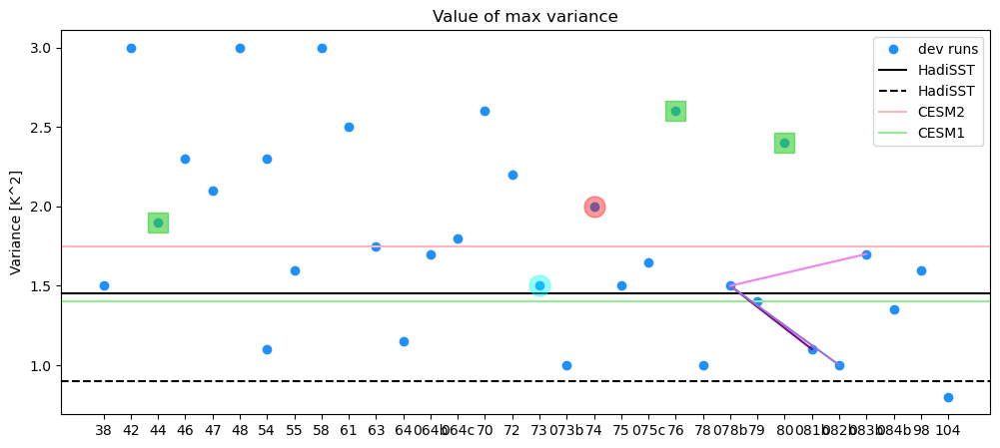

In [18]:
valArray = df['Value of max variance'].copy()
valArray[valArray=='>3'] = '3'

fig,axs=plt.subplots(1,1,figsize=(12,5))
axs.plot(df['Case Name'].values[4::], 
         valArray.values.astype(float)[4::], 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(df['Value of max variance'].values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(df['Value of max variance'].values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(df['Value of max variance'].values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(df['Value of max variance'].values[3]),color='lightgreen',linestyle='-',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Value of max variance')
axs.set_ylabel('Variance [K^2]')
# axs.set_xlabel('Simulation')

## Mark lineage of some runs
i78b = (np.where(df['Case Name'].values=='078b')[0]).astype(int)[0]
i3x = (np.where(df['Case Name'].values=='081b')[0]).astype(int)[0]
i1x = (np.where(df['Case Name'].values=='082b')[0]).astype(int)[0]
i0x = (np.where(df['Case Name'].values=='083b')[0]).astype(int)[0]

axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i3x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i3x]], 
         '-',color='purple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i1x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i1x]], 
         '-',color='mediumpurple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i0x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i0x]], 
         '-',color='violet')

for specCase in range(len(valArray.values)): 
    ## Mark Taus Code
    if ((df['Case Name'].values[specCase]=='44') | (df['Case Name'].values[specCase]=='76') | (df['Case Name'].values[specCase]=='80') ):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
    ## Mark warm and cold branch starts 
    if (df['Case Name'].values[specCase]=='74'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
    if (df['Case Name'].values[specCase]=='73'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)

    

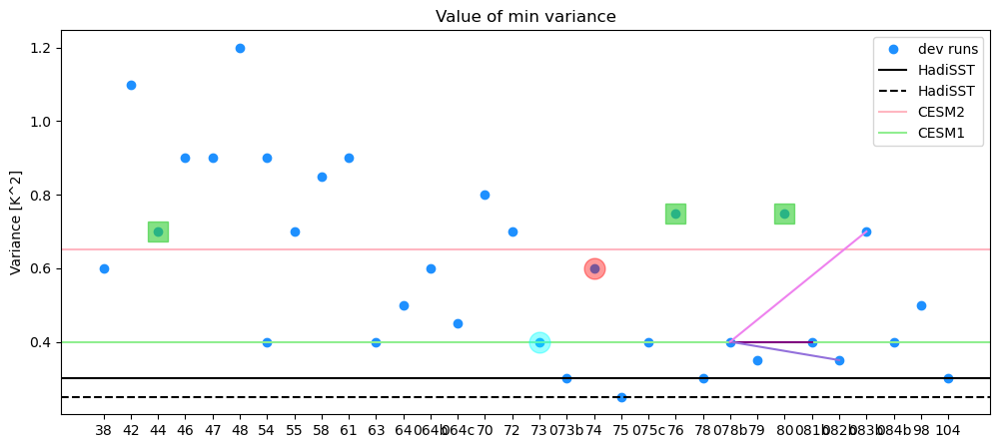

In [19]:
valArray = df['Value of min variance'].copy()


fig,axs=plt.subplots(1,1,figsize=(12,5))
axs.plot(df['Case Name'].values[4::], 
         valArray.values.astype(float)[4::], 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(df['Value of min variance'].values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(df['Value of min variance'].values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(df['Value of min variance'].values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(df['Value of min variance'].values[3]),color='lightgreen',linestyle='-',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Value of min variance')
axs.set_ylabel('Variance [K^2]')
# axs.set_xlabel('Simulation')

## Mark lineage of some runs
i78b = (np.where(df['Case Name'].values=='078b')[0]).astype(int)[0]
i3x = (np.where(df['Case Name'].values=='081b')[0]).astype(int)[0]
i1x = (np.where(df['Case Name'].values=='082b')[0]).astype(int)[0]
i0x = (np.where(df['Case Name'].values=='083b')[0]).astype(int)[0]

axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i3x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i3x]], 
         '-',color='purple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i1x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i1x]], 
         '-',color='mediumpurple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i0x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i0x]], 
         '-',color='violet')

for specCase in range(len(valArray.values)): 
    ## Mark Taus Code
    if ((df['Case Name'].values[specCase]=='44') | (df['Case Name'].values[specCase]=='76') | (df['Case Name'].values[specCase]=='80') ):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
    ## Mark warm and cold branch starts 
    if (df['Case Name'].values[specCase]=='74'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
    if (df['Case Name'].values[specCase]=='73'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)




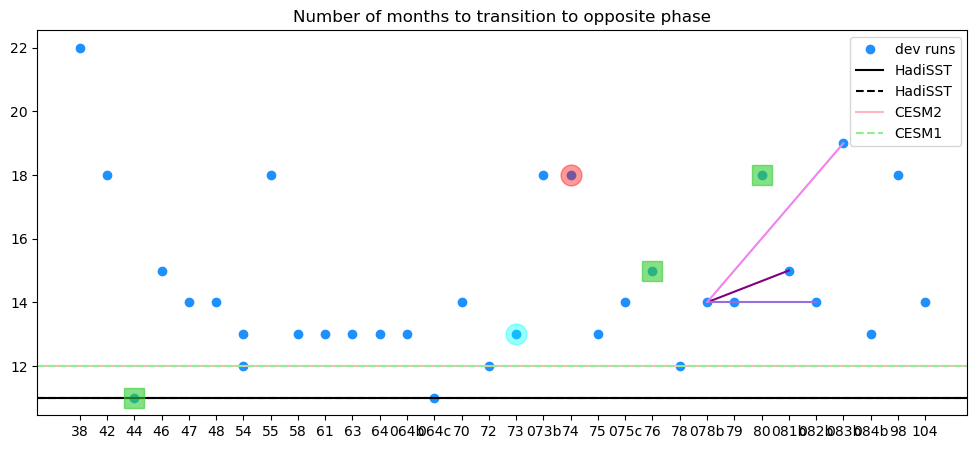

In [20]:
valArray = df['Transition to opposite phase \n(months)'].copy()

for iSims in range(len(valArray.values)):
    if str(valArray[iSims])[0]=='~':
        valArray[iSims] = str(valArray[iSims])[1:]

fig,axs=plt.subplots(1,1,figsize=(12,5))
axs.plot(df['Case Name'].values[4::], 
         valArray.values.astype(float)[4::], 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(valArray.values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(valArray.values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(valArray.values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(valArray.values[3]),color='lightgreen',linestyle='--',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Number of months to transition to opposite phase')


## Mark lineage of some runs
i78b = (np.where(df['Case Name'].values=='078b')[0]).astype(int)[0]
i3x = (np.where(df['Case Name'].values=='081b')[0]).astype(int)[0]
i1x = (np.where(df['Case Name'].values=='082b')[0]).astype(int)[0]
i0x = (np.where(df['Case Name'].values=='083b')[0]).astype(int)[0]

axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i3x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i3x]], 
         '-',color='purple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i1x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i1x]], 
         '-',color='mediumpurple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i0x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i0x]], 
         '-',color='violet')

for specCase in range(len(valArray.values)): 
    ## Mark Taus Code
    if ((df['Case Name'].values[specCase]=='44') | (df['Case Name'].values[specCase]=='76') | (df['Case Name'].values[specCase]=='80') ):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
    ## Mark warm and cold branch starts 
    if (df['Case Name'].values[specCase]=='74'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
    if (df['Case Name'].values[specCase]=='73'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)

    

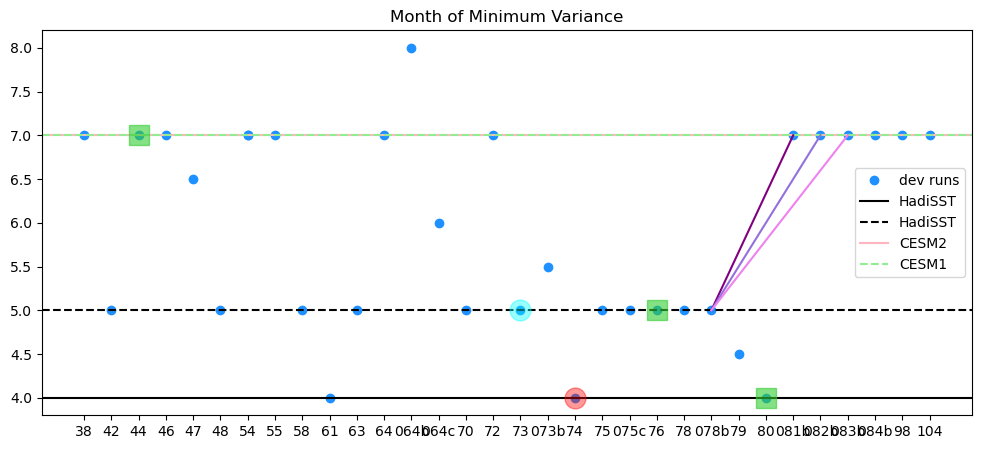

In [21]:
df['Month of min variance_number'] = df['Month of min variance'].copy()

for iVal in range(len(df['Month of min variance_number'])):
    if df['Month of min variance_number'].values[iVal]=='May':
        df['Month of min variance_number'].values[iVal] = 5
    elif df['Month of min variance_number'].values[iVal]=='Apr':
        df['Month of min variance_number'].values[iVal] = 4
    elif df['Month of min variance_number'].values[iVal]=='Jul':
        df['Month of min variance_number'].values[iVal] = 7
    elif df['Month of min variance_number'].values[iVal]=='Jun':
        df['Month of min variance_number'].values[iVal] = 6
    elif df['Month of min variance_number'].values[iVal]=='Aug':
        df['Month of min variance_number'].values[iVal] = 8
    elif df['Month of min variance_number'].values[iVal]=='Jun/Jul':
        df['Month of min variance_number'].values[iVal] = 6.5
    elif df['Month of min variance_number'].values[iVal]=='May-Jun':
        df['Month of min variance_number'].values[iVal] = 5.5
    elif df['Month of min variance_number'].values[iVal]=='Apr-May':
        df['Month of min variance_number'].values[iVal] = 4.5

valArray = df['Month of min variance_number']

fig,axs=plt.subplots(1,1,figsize=(12,5))
axs.plot(df['Case Name'].values[4::], 
         valArray.values.astype(float)[4::], 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(valArray.values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(valArray.values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(valArray.values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(valArray.values[3]),color='lightgreen',linestyle='--',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Month of Minimum Variance')

## Mark lineage of some runs
i78b = (np.where(df['Case Name'].values=='078b')[0]).astype(int)[0]
i3x = (np.where(df['Case Name'].values=='081b')[0]).astype(int)[0]
i1x = (np.where(df['Case Name'].values=='082b')[0]).astype(int)[0]
i0x = (np.where(df['Case Name'].values=='083b')[0]).astype(int)[0]

axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i3x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i3x]], 
         '-',color='purple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i1x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i1x]], 
         '-',color='mediumpurple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i0x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i0x]], 
         '-',color='violet')

for specCase in range(len(valArray.values)): 
    ## Mark Taus Code
    if ((df['Case Name'].values[specCase]=='44') | (df['Case Name'].values[specCase]=='76') | (df['Case Name'].values[specCase]=='80') ):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
    ## Mark warm and cold branch starts 
    if (df['Case Name'].values[specCase]=='74'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
    if (df['Case Name'].values[specCase]=='73'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)




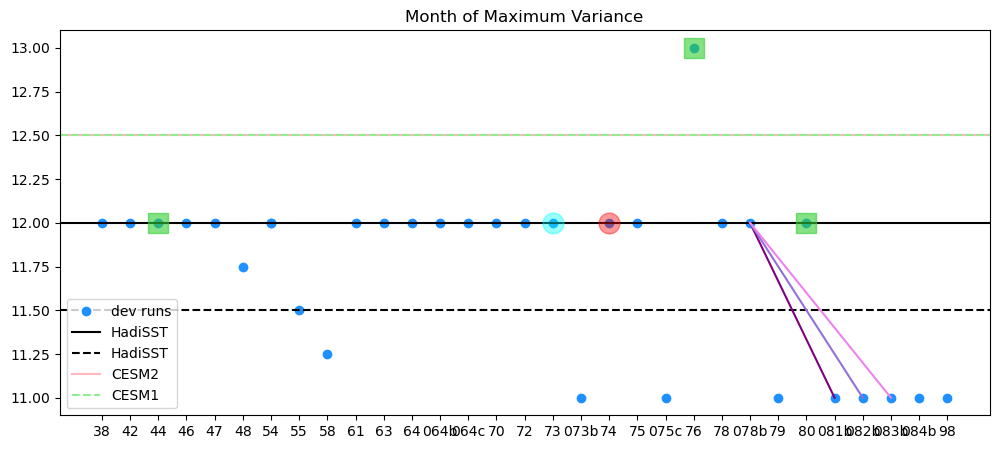

In [215]:
df['Month of max variance_number'] = df['Month of max variance'].copy()

for iVal in range(len(df['Month of max variance_number'])):
    if df['Month of max variance_number'].values[iVal]=='Dec':
        df['Month of max variance_number'].values[iVal] = 12
    elif df['Month of max variance_number'].values[iVal]=='Jan':
        df['Month of max variance_number'].values[iVal] = 13
    elif df['Month of max variance_number'].values[iVal]=='Nov':
        df['Month of max variance_number'].values[iVal] = 11
    elif df['Month of max variance_number'].values[iVal]=='Nov/Dec':
        df['Month of max variance_number'].values[iVal] = 11.5
    elif df['Month of max variance_number'].values[iVal]=='Dec-Jan':
        df['Month of max variance_number'].values[iVal] = 12.5
    elif df['Month of max variance_number'].values[iVal]=='Nov-Jan':
        df['Month of max variance_number'].values[iVal] = 11.75
    elif df['Month of max variance_number'].values[iVal]=='Oct-Jan':
        df['Month of max variance_number'].values[iVal] = 11.25

valArray = df['Month of max variance_number']
valArray

fig,axs=plt.subplots(1,1,figsize=(12,5))
axs.plot(df['Case Name'].values[4::], 
         valArray.values.astype(float)[4::], 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(valArray.values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(valArray.values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(valArray.values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(valArray.values[3]),color='lightgreen',linestyle='--',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Month of Maximum Variance')

## Mark lineage of some runs
i78b = (np.where(df['Case Name'].values=='078b')[0]).astype(int)[0]
i3x = (np.where(df['Case Name'].values=='081b')[0]).astype(int)[0]
i1x = (np.where(df['Case Name'].values=='082b')[0]).astype(int)[0]
i0x = (np.where(df['Case Name'].values=='083b')[0]).astype(int)[0]

axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i3x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i3x]], 
         '-',color='purple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i1x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i1x]], 
         '-',color='mediumpurple')
axs.plot([df['Case Name'].values[i78b], df['Case Name'].values[i0x]], [valArray.values.astype(float)[i78b],valArray.values.astype(float)[i0x]], 
         '-',color='violet')

for specCase in range(len(valArray.values)): 
    ## Mark Taus Code
    if ((df['Case Name'].values[specCase]=='44') | (df['Case Name'].values[specCase]=='76') | (df['Case Name'].values[specCase]=='80') ):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
    ## Mark warm and cold branch starts 
    if (df['Case Name'].values[specCase]=='74'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
    if (df['Case Name'].values[specCase]=='73'):
        axs.plot(df['Case Name'].values[specCase], valArray.values.astype(float)[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)




### Limit to data that has history files still available

In [20]:
# new_df = df[~df["Nyrs available history"].str.contains('Climo', na=False)]
new_df = df[df["Nyrs available history"].str.contains('all', na=False)]


In [21]:
new_df

,Case Name,Years analyzed,Nyrs available history,Transition to opposite phase \n(months),Value of max variance,Month of max variance,Value of min variance,Month of min variance,Notes
11,54,0075-0103,1-152 \n(all h*),12,1.1,Dec,0.40,Jul,New baseline: cesm2_3_alpha16g
16,64,0001-0059,1-59 \n(all h*),~13,1.15,Dec,0.50,Jul,054+Gustiness (old calculation)
17,064b,0043-0069,43-68\n(all h*),~13,1.7,Dec,0.60,Aug,? ensemble of 064?
18,064c,0043-0069,43-68\n(all h*),~11,1.8,Dec,0.45,Jun,? ensemble of 064?
24,75,0001-0043,1-125 \n(all h*),~13,1.5,Dec,0.25,May,Retune cold branch
25,075c,0001-0051,1-50 \n(all h*)\nGustavo scratch,~14,1.65,Nov,0.40,May,075 twin+new initial conditions from 0055 (wit...
26,76,0001-0042,1-81 \n(all h*),~15,2.6,Jan,0.75,May,Retune warm branch with taus code
27,78,0001-0049,1-48 \n(all h*),12,1,Dec,0.30,May,075 (cold branch)+faster dycore
28,078b,0001-0031,1-95 \n(all h*),~14,1.5,Dec,0.40,May,?? “Starting Lscale branch from a spunup state...
29,79,0001-0049,1-48 \n(all h*)\nCecile scratch,~14,1.4,Nov,0.35,Apr-May,078+Rougher topography


Text(0.345, -0.02, 'Retune\nCold\nBranch')

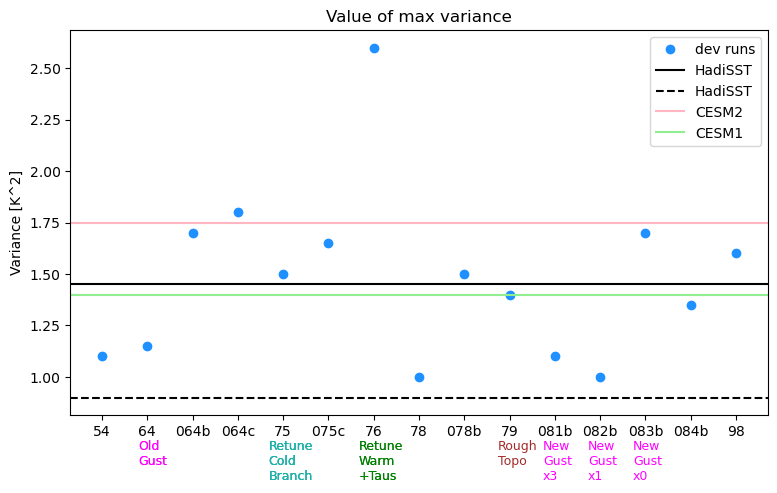

In [87]:
fig,axs=plt.subplots(1,1,figsize=(9,5))
axs.plot(new_df['Case Name'], 
         new_df['Value of max variance'].values.astype(float), 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(df['Value of max variance'].values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(df['Value of max variance'].values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(df['Value of max variance'].values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(df['Value of max variance'].values[3]),color='lightgreen',linestyle='-',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Value of max variance')
axs.set_ylabel('Variance [K^2]')
# axs.set_xlabel('Simulation')

plt.gcf().text(0.2, 0.01, 'Old\nGust', fontsize=9, color='magenta')
plt.gcf().text(0.345, -0.02, 'Retune\nCold\nBranch', fontsize=9, color='lightseagreen')
plt.gcf().text(0.445, -0.02, 'Retune\nWarm\n+Taus', fontsize=9, color='green')

plt.gcf().text(0.2, 0.01, 'Old\nGust', fontsize=9, color='magenta')
plt.gcf().text(0.345, -0.02, 'Retune\nCold\nBranch', fontsize=9, color='lightseagreen')
plt.gcf().text(0.445, -0.02, 'Retune\nWarm\n+Taus', fontsize=9, color='green')
plt.gcf().text(0.6, 0.01, 'Rough\nTopo', fontsize=9, color='brown')
plt.gcf().text(0.65, -0.02, 'New\nGust\nx3', fontsize=9, color='magenta')
plt.gcf().text(0.7, -0.02, 'New\nGust\nx1', fontsize=9, color='magenta')
plt.gcf().text(0.75, -0.02, 'New\nGust\nx0', fontsize=9, color='magenta')
plt.gcf().text(0.345, -0.02, 'Retune\nCold\nBranch', fontsize=9, color='lightseagreen')

Text(0.75, -0.02, 'New\nGust\nx0')

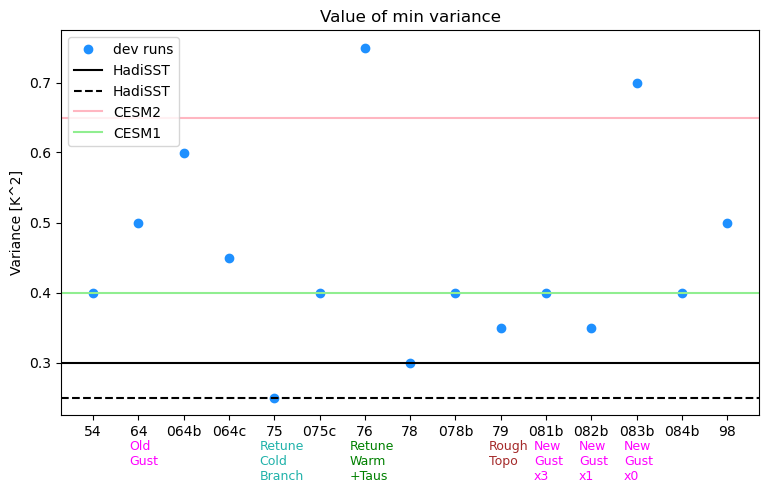

In [86]:
fig,axs=plt.subplots(1,1,figsize=(9,5))
axs.plot(new_df['Case Name'], 
         new_df['Value of min variance'].values.astype(float), 'o', color='dodgerblue', label='dev runs')
axs.axhline(float(df['Value of min variance'].values[0]),color='k',label=df['Case Name'].values[0])
axs.axhline(float(df['Value of min variance'].values[1]),color='k',linestyle='--',label=df['Case Name'].values[1])
axs.axhline(float(df['Value of min variance'].values[2]),color='lightpink',linestyle='-',label=df['Case Name'].values[2])
axs.axhline(float(df['Value of min variance'].values[3]),color='lightgreen',linestyle='-',label=df['Case Name'].values[3])
axs.legend()

axs.set_title('Value of min variance')
axs.set_ylabel('Variance [K^2]')
# axs.set_xlabel('Simulation')

plt.gcf().text(0.2, 0.01, 'Old\nGust', fontsize=9, color='magenta')
plt.gcf().text(0.345, -0.02, 'Retune\nCold\nBranch', fontsize=9, color='lightseagreen')
plt.gcf().text(0.445, -0.02, 'Retune\nWarm\n+Taus', fontsize=9, color='green')
plt.gcf().text(0.6, 0.01, 'Rough\nTopo', fontsize=9, color='brown')
plt.gcf().text(0.65, -0.02, 'New\nGust\nx3', fontsize=9, color='magenta')
plt.gcf().text(0.7, -0.02, 'New\nGust\nx1', fontsize=9, color='magenta')
plt.gcf().text(0.75, -0.02, 'New\nGust\nx0', fontsize=9, color='magenta')
plt.gcf().text(0.345, -0.02, 'Retune\nCold\nBranch', fontsize=9, color='lightseagreen')


## Make lag correlation plots and use metric from those

In [12]:
## Some basics - the region to focus on, for one
lat_n = 10.0
lat_s = -10.0

# Nino3.4
lat_n34 = 5
lat_s34 = -5
lon_e34 = 190 
lon_w34 = 240

# Nino3
lat_n3 = 5
lat_s3 = -5
lon_e3 = 210 
lon_w3 = 270

# Nino 4
lat_n4 = 5
lat_s4 = -5
lon_e4 = 160 
lon_w4 = 210

# nregions     = (/0.,         5.,     5.,       5.,   5.,   16./)
# sregions     = (/-10.,      -5.,    -5.,      -5.,  -5.,    8./)
# wregions     = (/270.,      210.,   190.,     160., 120., 140./)
# eregions     = (/280.,      270.,   240.,     210., 140., 160./)
# plot_regions = (/"nino1+2","nino3","nino3.4","nino4","nino5","nino6"/)



In [13]:
## Calculate nino anomalies 
def rmMonAnnCyc(DS): 
    
    climatology = DS.groupby("time.month").mean("time")
    anomalies   = DS.groupby("time.month") - climatology    

    return anomalies

def getLagCorr(lag, nino34, corDS):

    if lag>0: 
        A  = nino34[:-lag]
        # B  = sst_anom.isel(case=iCase).shift(time=lag).isel(time=slice(lag,len(sst_anom.time.values)))
        # B['time'] = sst_anom.time.values[:-lag]  # To get xr.corr to work, need to have the "same" time for computing corrs
        B  = corDS.shift(time=-lag).isel(time=slice(0,len(corDS.time.values)-lag))
        B['time'] = corDS.time.values[:-lag]  # To get xr.corr to work, need to have the "same" time for computing corrs
    elif lag<0:
        A  = nino34[-lag:]
        A['time'] = nino34.time.values[:lag]
        B  = corDS.isel(time=slice(0,len(corDS.time.values)+lag))
    elif lag==0:
        A = nino34
        B = corDS
            
    cor = xr.corr(A, B, dim="time")

    return cor

def getLagCorr_obs(lag):

    if lag>0: 
        A  = nino34_obs[:-lag]
        B  = sstObs_anom.shift(time=-lag).isel(time=slice(0,len(sstObs_anom.time.values)-lag))
        B['time'] = sstObs_anom.time.values[:-lag]  # To get xr.corr to work, need to have the "same" time for computing corrs
    elif lag<0:
        A  = nino34_obs[-lag:]
        A['time'] = nino34_obs.time.values[:lag]
        B  = sstObs_anom.isel(time=slice(0,len(sstObs_anom.time.values)+lag))
    elif lag==0:
        A = nino34_obs
        B = sstObs_anom
            
    cor = xr.corr(A, B, dim="time")

    return cor
    

In [14]:
def plotLagCorr(DS, caseName): 

    # Remove first year of each simulation
    timeOffset = DS.time.values[0]  + timedelta(days=365)
    iKeep = np.where(DS.time.values>=timeOffset)[0]
    DS = DS.isel(time=iKeep)
    
    # Updating limit of ocnfrac used to determine mask
    ocnMask = DS.LANDFRAC.values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1

    
    
    # Detrend data 
    TS = DS.TS
    ts = signal.detrend(TS, axis=0, type='linear')
    # Get SST 
    sst = ts * ocnMask
    
    sst = xr.DataArray(sst, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])
    
    
    # Remove annual cycle from monthly data 
    sst_anom = rmMonAnnCyc(sst)
    
    ## Compute nino 3.4 index
    
    ilats = np.where((sst_anom.lat.values>=lat_s34)  & (sst_anom.lat.values<=lat_n34))[0]
    ilons = np.where((sst_anom.lon.values>=lon_e34)  & (sst_anom.lon.values<=lon_w34))[0]
    
    # Compute weights and get Nino3.4 
    regionTS = sst_anom.isel(lat=ilats, lon=ilons)
    coswgt   = np.cos(np.deg2rad(regionTS.lat))
    
    nino34   = regionTS.weighted(coswgt).mean(('lon','lat'))

    
    ## COMPUE CORRELATION 
    cor_case = getLagCorr(0, nino34, sst_anom)


    
    ## Make plot 
    fig,axs = plt.subplots(1,1, figsize=(10,11), subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
    pltLims = np.arange(-1,1.1,0.1)
    
    # Contour 
    c1 = axs.contourf(sst_anom.lon.values,sst_anom.lat.values ,  cor_case, pltLims,
                       cmap='RdYlBu_r', transform=ccrs.PlateCarree() ) 
    corrs_sel = cor_case.sel(lon=slice(120,240), lat=slice(-10,10))
    c2 = axs.contour(corrs_sel.lon.values,corrs_sel.lat.values ,  corrs_sel, [0], transform=ccrs.PlateCarree())
    
    # Add colorbar 
    cax = axs.inset_axes([0, -0.23, 1, 0.09])  # THE NEW AXES, x, y, width, height,
    cbar = fig.colorbar(c1, cax = cax, orientation="horizontal")
    
    axs.coastlines()     
    axs.add_patch(patches.Rectangle(xy=[lon_e34, lat_s34], width=(lon_w34-lon_e34), height=(lat_n34-lat_s34),
                                facecolor='none', edgecolor='k',linestyle='--',
                                linewidth=1, transform=ccrs.PlateCarree()))
    axs.set_extent([53,300,-15,15], crs=ccrs.PlateCarree())
    axs.set_title(str(caseName)+'\nLag 0 SST-Nino3.4 Correlation')
    
    maybeLon = []
    maybeLat = []
    lenSeg = 0
    for iSegs in range(len(c2.allsegs[0])): 
        dat0 = c2.allsegs[0][iSegs]
        western_most_lon = np.nanmin(dat0[:,0])
        iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
        maybeLon = np.append(maybeLon, western_most_lon)
        maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
        if len(dat0)>lenSeg:
            lenSeg= len(dat0)
            iselSeg = iSegs
            
    western_most_point_case = maybeLon[iselSeg]
        
    print(f"Western-most point in case: {western_most_point_case}")
    
    axs.plot(maybeLon[iselSeg], maybeLat[iselSeg], 'o', color='limegreen', markersize=5, transform=ccrs.PlateCarree() )


    ## Figure out western-most longitude of 0.5 contour in pacific 
    c3 = axs.contour(corrs_sel.lon.values,corrs_sel.lat.values ,  corrs_sel, [0.5], transform=ccrs.PlateCarree())

    maybeLon = []
    maybeLat = []
    lenSeg = 0
    for iSegs in range(len(c3.allsegs[0])): 
        dat0 = c3.allsegs[0][iSegs]
        western_most_lon = np.nanmin(dat0[:,0])
        iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
        maybeLon = np.append(maybeLon, western_most_lon)
        maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
        if len(dat0)>lenSeg:
            lenSeg= len(dat0)
            iselSeg = iSegs
            
    western_most_point_case = maybeLon[iselSeg]

    
    axs.plot(maybeLon[iselSeg], maybeLat[iselSeg], 's', color='mediumorchid', markersize=5, transform=ccrs.PlateCarree() )

    plt.show()
    # plt.savefig("Figures/LagCorrelations/"+caseName+'_LagPos9_sstVSnino34.png', format='png', dpi=300)
    plt.close()
    
    return cor_case, sst_anom
    

In [15]:
# dataDir = '/glade/derecho/scratch/rneale/enso_wavelet/'

# listFiles_TS = np.sort(glob.glob(dataDir+'*BLT1850.ne30_t232*cam.h0*TS.*.nc'))
# listFiles_TS

In [18]:
# DS = xr.open_dataset(listFiles_TS[-6])

# timeOffset = DS.time.values[0] + timedelta(days=365)
# print(timeOffset)

# iKeep = np.where(DS.time.values>=timeOffset)
# iKeep

## Read in data

In [12]:
# dataDir = '/glade/derecho/scratch/rneale/enso_wavelet/'

# # listFiles_TS = np.sort(glob.glob(dataDir+'*BLT1850.ne30_t232*cam.h0*TS.*.nc'))
# listFiles_TS = np.asarray((
#       [
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.038.cam.h0.TS.1-60.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.042.cam.h0.TS.0001-0049.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.044.cam.h0.TS.1-44.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.046.cam.h0.TS.1-70.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.047.cam.h0.TS.1-70.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.048.cam.h0.TS.0001-0036.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.054.cam.h0.TS.1-102.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.055.cam.h0.TS.1-100.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.058.cam.h0.TS.1-16.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.061.cam.h0.TS.1-48.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.063.cam.h0.TS.1-24.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.064.cam.h0.TS.1-58.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.064b.cam.h0.TS.43-68.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.064c.cam.h0.TS.43-68.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.067.cam.h0.TS.1-23.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.070.cam.h0.TS.1-26.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.072.cam.h0.TS.1-44.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.073.cam.h0.TS.1-18.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.073b.cam.h0.TS.1-42.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.074.cam.h0.TS.1-22.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.075.cam.h0.TS.1-42.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.075c.cam.h0.TS.1-50.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.076.cam.h0.TS.1-41.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.078.cam.h0.TS.1-48.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.078b.cam.h0.TS.1-30.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.079.cam.h0.TS.1-48.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.080.cam.h0.TS.1-22.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.081b.cam.h0.TS.1-34.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.082b.cam.h0.TS.1-61.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.083b.cam.h0.TS.1-32.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.084b.cam.h0.TS.1-46.10.N-10.S.nc',

#        '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.091.cam.h0a.TS.1-100.10.N-10.S.nc',
#        '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.092.cam.h0a.TS.1-100.10.N-10.S.nc',
#        '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.093.cam.h0a.TS.1-75.10.N-10.S.nc',
#        # '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLTHIST.ne30_t232.098.cam.h0a.TS.1850-1923.10.N-10.S.nc',
          
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.1-150.10.N-10.S.nc',

          
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.099.cam.h0a.TS.1-100.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.100.cam.h0a.TS.1-24.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.101.cam.h0a.TS.1-22.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.102.cam.h0a.TS.1-22.10.N-10.S.nc', 
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.103.cam.h0a.TS.1-24.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.104.cam.h0a.TS.1-66.10.N-10.S.nc',
#        '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.109.cam.h0a.TS.1-88.10.N-10.S.nc',
#        # '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLTHIST.ne30_t232.104.cam.h0a.TS.1870-1993.10.N-10.S.nc'
#        '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_alpha03d.BLT1850.ne30_t232_wgx3.112.cam.h0a.TS.1-90.10N-10S.nc',
#       ]))

Selecting runs with at least 40 years of output 

038
Western-most point in case: 127.02161405869822


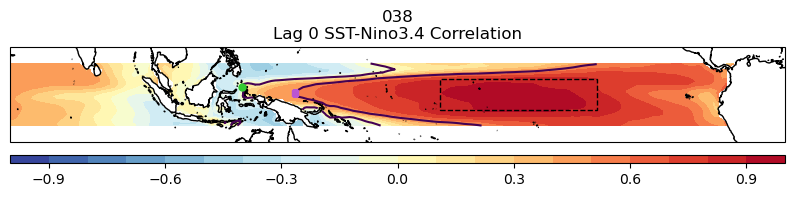

042
Western-most point in case: 127.30654161513556


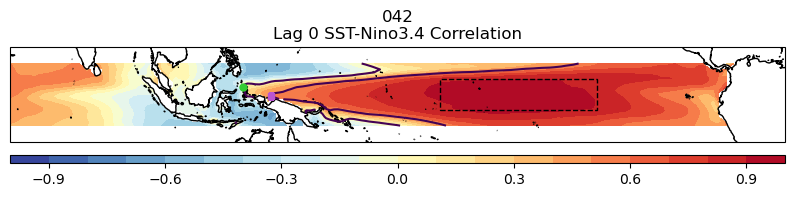

044
Western-most point in case: 128.37968254338568


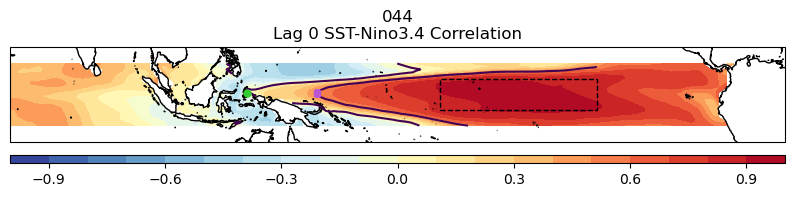

046
Western-most point in case: 129.22336667190828


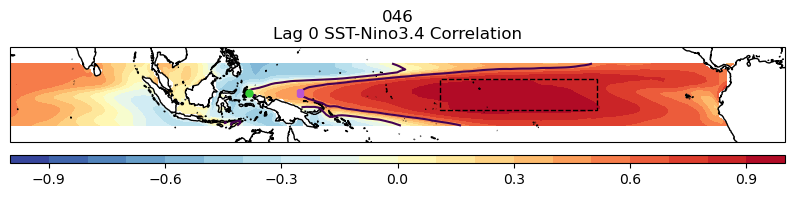

047
Western-most point in case: 128.4190245757771


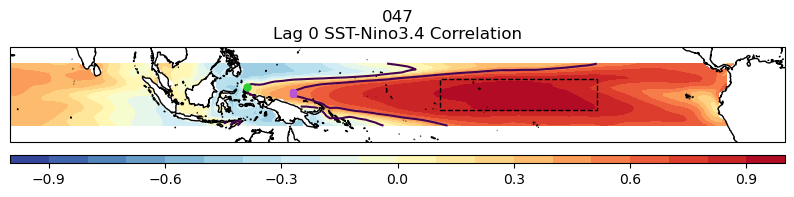

054
Western-most point in case: 127.0029848193154


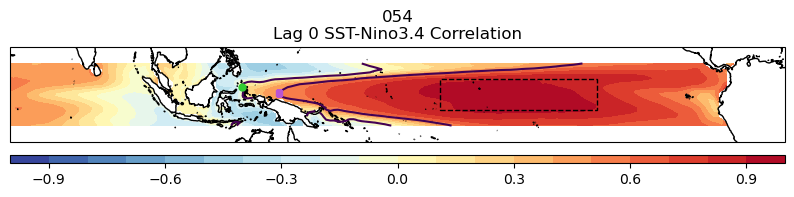

055
Western-most point in case: 125.06001973293469


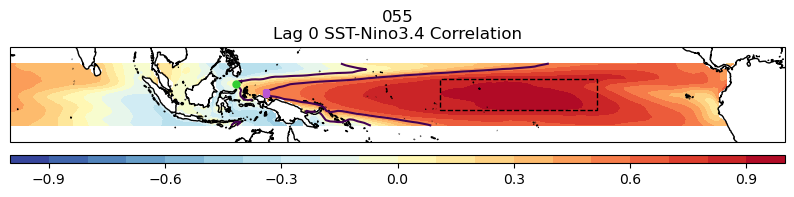

061
Western-most point in case: 128.2943248758666


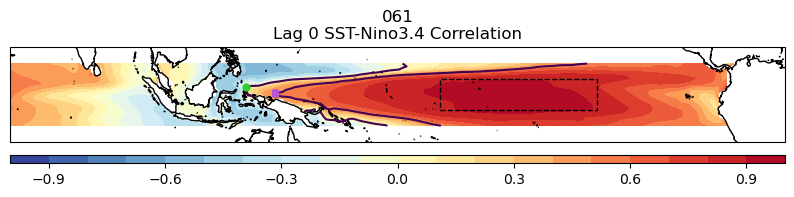

064
Western-most point in case: 131.5310686324953


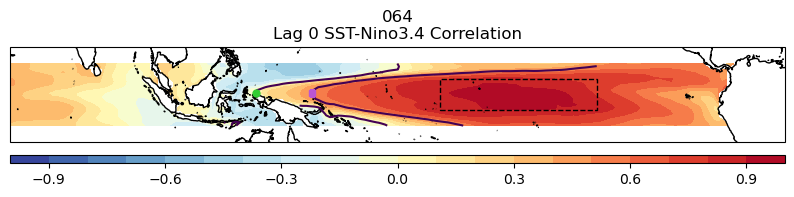

072
Western-most point in case: 127.40888513309434


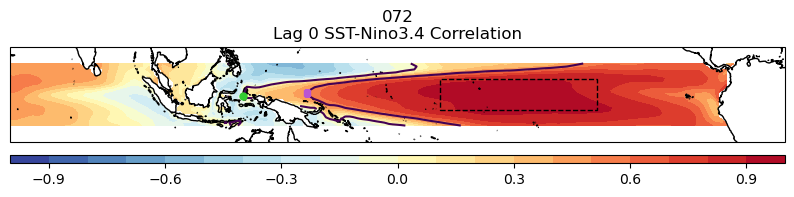

073b
Western-most point in case: 127.2740249869718


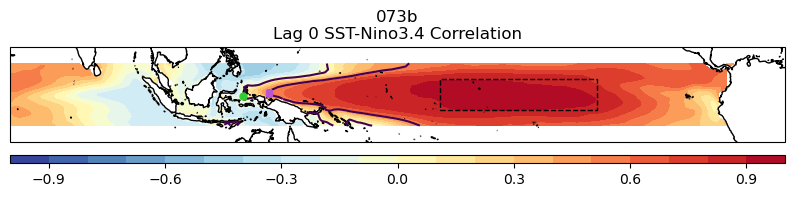

075
Western-most point in case: 128.18375060395581


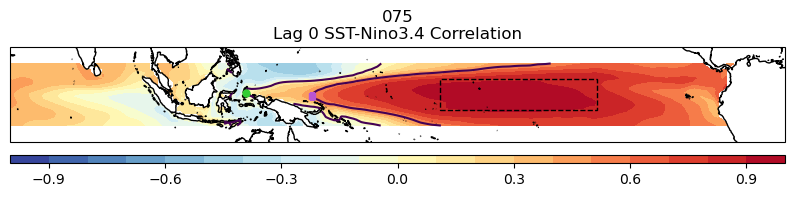

075c
Western-most point in case: 127.60098895577492


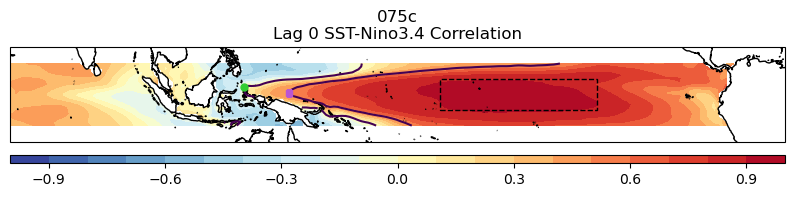

076
Western-most point in case: 130.02466983379867


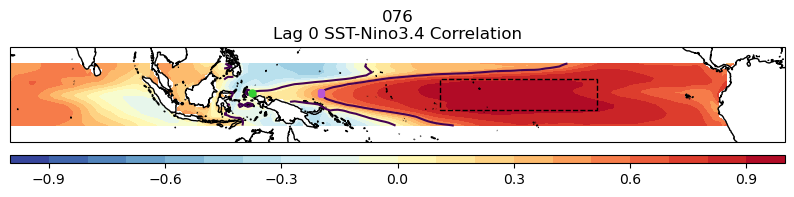

078
Western-most point in case: 130.79070887728628


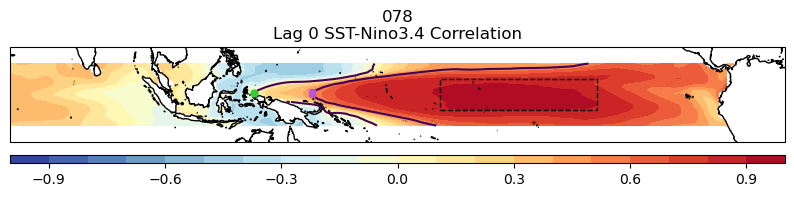

079
Western-most point in case: 131.73449318282292


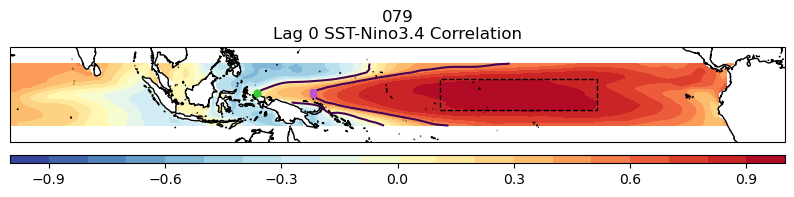

082b
Western-most point in case: 127.32323857907934


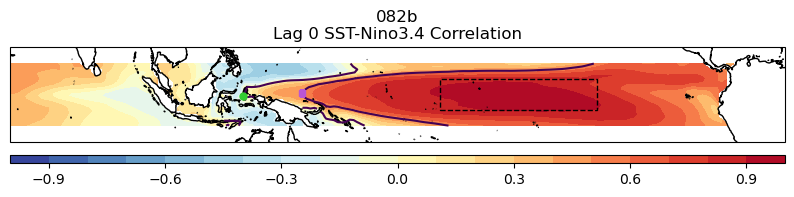

084b
Western-most point in case: 127.3932061773627


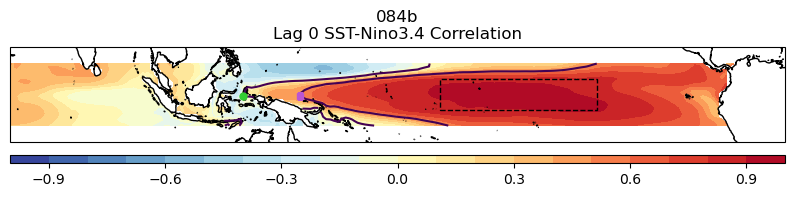

091
Western-most point in case: 127.44394374876607


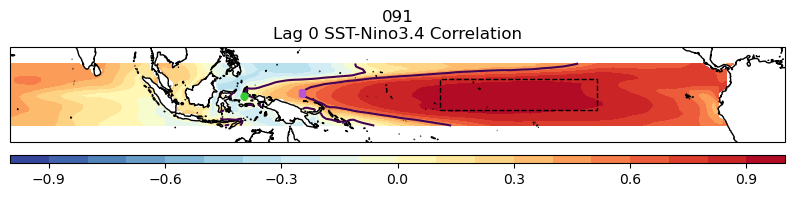

092
Western-most point in case: 126.94879577270686


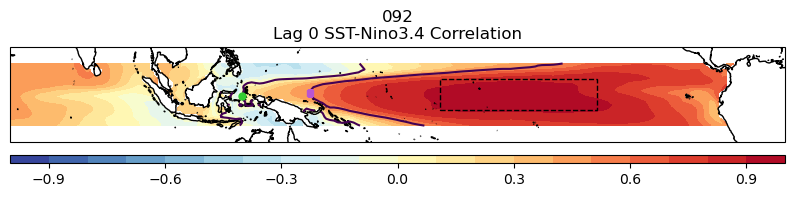

093
Western-most point in case: 128.47629877522604


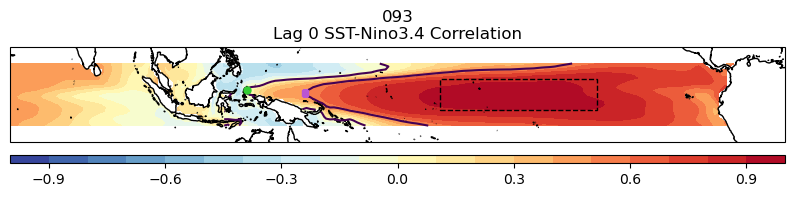

098
Western-most point in case: 127.29171019871535


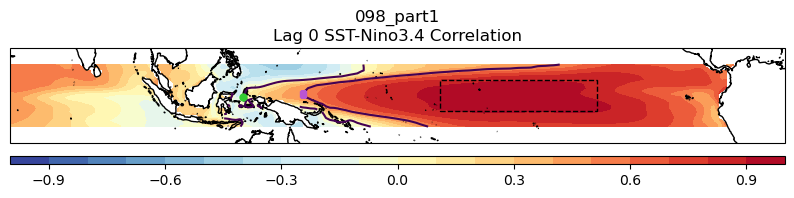

098
Western-most point in case: 128.12575612449567


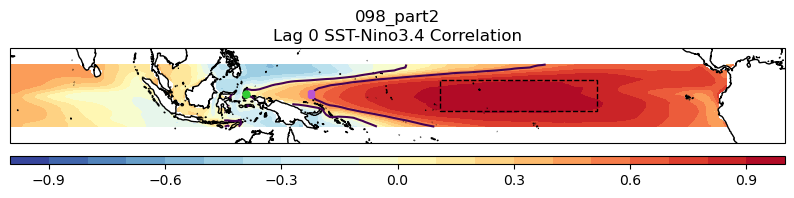

099
Western-most point in case: 126.99318388007005


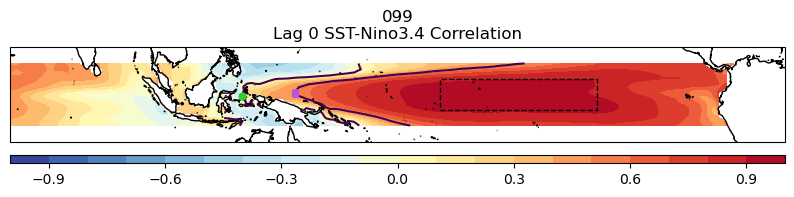

104
Western-most point in case: 127.21304096942075


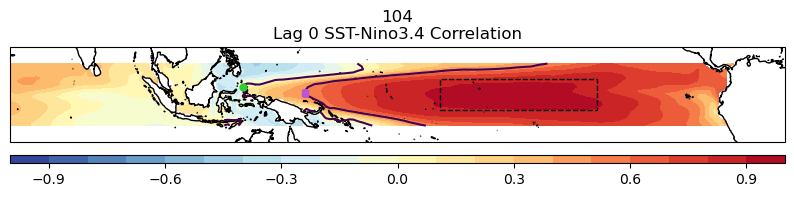

109
Western-most point in case: 127.27878666465784


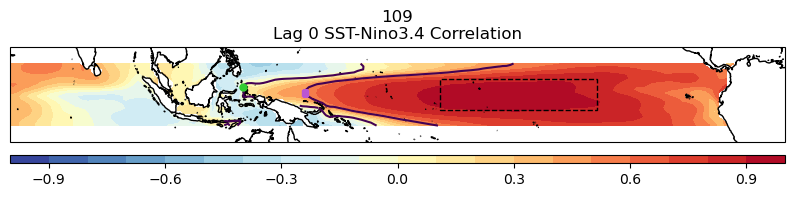

112
Western-most point in case: 125.44912147241617


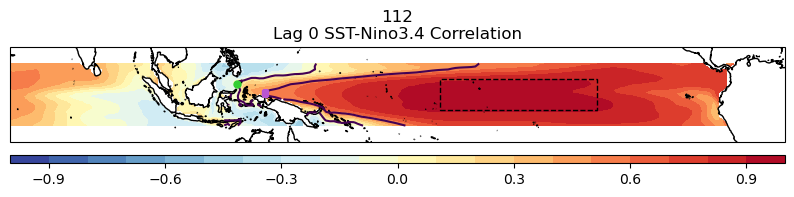

116
Western-most point in case: 142.35654632579582


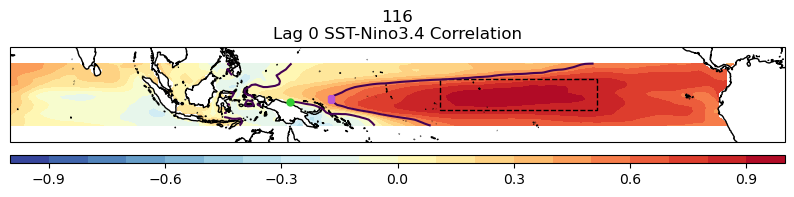

118
Western-most point in case: 121.25


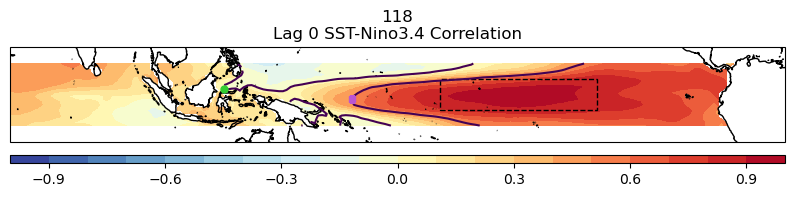

121
Western-most point in case: 131.9681540492781


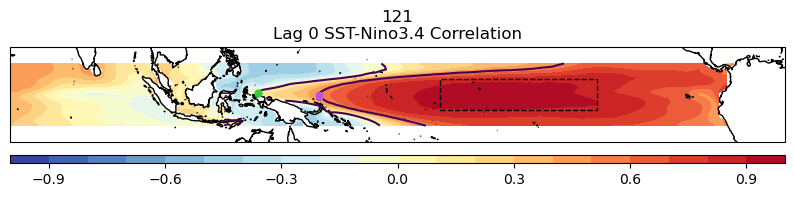

In [16]:
dataDir = '/glade/derecho/scratch/rneale/enso_wavelet/'

# listFiles_TS = np.sort(glob.glob(dataDir+'*BLT1850.ne30_t232*cam.h0*TS.*.nc'))
listFiles_TS = np.asarray((
      [
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.038.cam.h0.TS.1-60.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.042.cam.h0.TS.0001-0049.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.044.cam.h0.TS.1-44.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.046.cam.h0.TS.1-70.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.047.cam.h0.TS.1-70.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.048.cam.h0.TS.0001-0036.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16b.BLT1850.ne30_t232.054.cam.h0.TS.1-102.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.055.cam.h0.TS.1-100.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.058.cam.h0.TS.1-16.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.061.cam.h0.TS.1-48.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.063.cam.h0.TS.1-24.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.064.cam.h0.TS.1-58.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.064b.cam.h0.TS.43-68.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.064c.cam.h0.TS.43-68.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.067.cam.h0.TS.1-23.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.070.cam.h0.TS.1-26.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.072.cam.h0.TS.1-44.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.073.cam.h0.TS.1-18.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.073b.cam.h0.TS.1-42.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.074.cam.h0.TS.1-22.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.075.cam.h0.TS.1-42.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.075c.cam.h0.TS.1-50.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.076.cam.h0.TS.1-41.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.078.cam.h0.TS.1-48.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.078b.cam.h0.TS.1-30.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.079.cam.h0.TS.1-48.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.080.cam.h0.TS.1-22.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.081b.cam.h0.TS.1-34.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.082b.cam.h0.TS.1-61.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.083b.cam.h0.TS.1-32.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.084b.cam.h0.TS.1-46.10.N-10.S.nc',

       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.091.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.092.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.093.cam.h0a.TS.1-75.10.N-10.S.nc',
       # '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLTHIST.ne30_t232.098.cam.h0a.TS.1850-1923.10.N-10.S.nc',
          
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.1-150.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.101-200.10.N-10.S.nc',
          
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.099.cam.h0a.TS.1-100.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.100.cam.h0a.TS.1-24.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.101.cam.h0a.TS.1-22.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.102.cam.h0a.TS.1-22.10.N-10.S.nc', 
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.103.cam.h0a.TS.1-24.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.104.cam.h0a.TS.1-66.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.109.cam.h0a.TS.1-88.10.N-10.S.nc',
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLTHIST.ne30_t232.104.cam.h0a.TS.1870-1993.10.N-10.S.nc'
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_alpha03d.BLT1850.ne30_t232_wgx3.112.cam.h0a.TS.1-90.10N-10S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_beta04.BLT1850.ne30_t232_wgx3.116.cam.h0a.TS.1-63.10.N-10.S.nc', 
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_beta04.BLT1850.ne30_t232_wgx3.118.cam.h0a.TS.1-43.10.N-10.S.nc', 
       # '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_beta04.BLT1850.ne30_t232_wgx3.121.cam.h0a.TS.1-99.10.N-10.S.nc', 
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_beta04.BLT1850.ne30_t232_wgx3.121.cam.h0a.TS.60-156.10.N-10.S.nc', 
          
      ]))

for iSim in range(len(listFiles_TS)): 
    DS = xr.open_dataset(listFiles_TS[iSim]) 
    
    ## Add case ID (short name) to the DS
    caseName = listFiles_TS[iSim].split(".")[4] 
    print(caseName)

    if caseName=='098': 
        if DS['time.year'].values[0]<100: 
            caseName = '098_part1'
        elif DS['time.year'].values[0]>=100: 
            caseName = '098_part2'

    # Get correlation and make plo
    cor_case, sst_anom = plotLagCorr(DS, caseName)

    caseDS   = cor_case.squeeze().assign_coords({"case":  caseName})

    # Grid is *barely* not te same in these two runs 
    if ((caseName=='091') | (caseName=='092') ):
        caseDS['lat']  = corrs.isel(case=iSim-1).lat.values
        caseDS['lon']  = corrs.isel(case=iSim-1).lon.values

    if iSim==0:
        corrs = caseDS
    else: 
        corrs = xr.concat([corrs, caseDS], "case") 


/glade/derecho/scratch/mdfowler/tmp/ipykernel_4110/3776528618.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  flipPoint = int(np.where( (lon2>=0) & (lon2<1) )[0])


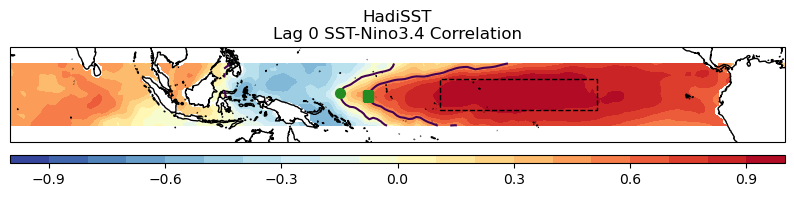

In [17]:
## Get observed SSTs

obsName = 'HadISST'
obs_file = "/glade/work/rneale/data/HADLEY/sst.hadley.187001-200512.nc"
obsDS    = xr.open_dataset(obs_file)

# Make times a more useful format
obsTimes = [ datetime.datetime.strptime(np.asarray(obsDS.time.values).astype('str')[x], '%Y%m') for x in range(len(obsDS.time.values)) ]
obsDS['time'] = obsTimes

# # Select lower latitudes 
# ilatsObs = np.where((obsDS.lat.values>=lat_s) & (obsDS.lat.values<=lat_n))[0]
# obsDS = obsDS.isel(lat=ilatsObs)

# Select years 1965-2002 
iselYears = np.where((obsDS['time.year'].values>=1965) & (obsDS['time.year'].values<=2002))[0]
obsDS = obsDS.isel(time=iselYears)

# Convert longitudes to be 0-360  
lon2   = np.mod((obsDS.lon.values), 360.0)
flipPoint = int(np.where( (lon2>=0) & (lon2<1) )[0])
obsDS['lon'] = lon2
obsDS        = obsDS.roll(lon=flipPoint, roll_coords=True) #Handle needing to shift longitudes to start at 0

## Regrid to match CAM grid exactly 
# Get model grid 
camGrid = DS['TS'].isel(time=0).load().squeeze()
regridObs = regrid_data(obsDS, camGrid, method=1)


# Select lower latitudes 
ilatsObs = np.where((regridObs.lat.values>=lat_s) & (regridObs.lat.values<=lat_n))[0]
obsDS    = regridObs.isel(lat=ilatsObs)

## Detrend for observations too
##   This is a little wonky because signal.detrend can't handle NaNs so replacing with a marker that we mask later
sst_obs = np.copy(obsDS.SST.values)
sst_obs_raw = np.copy(sst_obs)

sst_obsFill = sst_obs
sst_obsFill[(np.isnan(sst_obsFill))] = -99

sst_obsFill_detrend = signal.detrend(sst_obsFill, axis=0, type='linear')

sst_obs_detrend = np.copy(obsDS.SST.values)
sst_obs_detrend[np.isfinite(sst_obs_detrend)] = sst_obsFill_detrend[np.isfinite(sst_obs_detrend)]

sst_obs = xr.DataArray(sst_obs_detrend, 
    coords={
            'time': obsDS.time.values,
            'lat': obsDS.lat.values, 
            'lon':obsDS.lon.values}, 
    dims=["time", "lat", "lon"])

sst_obs_raw = xr.DataArray(sst_obs_raw, 
    coords={
            'time': obsDS.time.values,
            'lat': obsDS.lat.values, 
            'lon':obsDS.lon.values}, 
    dims=["time", "lat", "lon"])


## Plot observations too
sstObs_anom = rmMonAnnCyc(sst_obs)

## - - - - - - - - - - - -
## Do the same for obs
ilatsObs = np.where((sstObs_anom.lat.values>=lat_s34)  & (sstObs_anom.lat.values<=lat_n34))[0]
ilonsObs = np.where((sstObs_anom.lon.values>=lon_e34)  & (sstObs_anom.lon.values<=lon_w34))[0]

# Compute weights and get Nino3.4 
regionTSobs = sstObs_anom.isel(lat=ilatsObs, lon=ilonsObs)
coswgt_obs  = np.cos(np.deg2rad(regionTSobs.lat))

nino34_obs = regionTSobs.weighted(coswgt_obs).mean(('lon','lat'))

## Also compute some other nino regions... 
ilatsObs4 = np.where((sstObs_anom.lat.values>=lat_s4)  & (sstObs_anom.lat.values<=lat_n4))[0]
ilonsObs4 = np.where((sstObs_anom.lon.values>=lon_e4)  & (sstObs_anom.lon.values<=lon_w4))[0]
# Compute weights and get Nino3.4 
regionTSobs4 = sstObs_anom.isel(lat=ilatsObs4, lon=ilonsObs4)
coswgt_obs4  = np.cos(np.deg2rad(regionTSobs4.lat))
nino4_obs    = regionTSobs4.weighted(coswgt_obs4).mean(('lon','lat'))

ilatsObs3 = np.where((sstObs_anom.lat.values>=lat_s3)  & (sstObs_anom.lat.values<=lat_n3))[0]
ilonsObs3 = np.where((sstObs_anom.lon.values>=lon_e3)  & (sstObs_anom.lon.values<=lon_w3))[0]
# Compute weights and get Nino3.4 
regionTSobs3 = sstObs_anom.isel(lat=ilatsObs3, lon=ilonsObs3)
coswgt_obs3  = np.cos(np.deg2rad(regionTSobs3.lat))
nino3_obs    = regionTSobs3.weighted(coswgt_obs3).mean(('lon','lat'))

cor_obs = getLagCorr_obs(0)
# cor_obs = getLagCorr_obs(-9)


## Make plot 
fig,axs = plt.subplots(1,1, figsize=(10,11), subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
pltLims = np.arange(-1,1.1,0.1)

# Contour 
c1 = axs.contourf(sstObs_anom.lon.values,sstObs_anom.lat.values ,  cor_obs, pltLims,
                   cmap='RdYlBu_r', transform=ccrs.PlateCarree() ) 
corrs_sel = cor_obs.sel(lon=slice(120,240), lat=slice(-10,10))
c2 = axs.contour(corrs_sel.lon.values,corrs_sel.lat.values ,  corrs_sel, [0], transform=ccrs.PlateCarree())

# Add contour marker
maybeLon = []
maybeLat = []
lenSeg = 0
for iSegs in range(len(c2.allsegs[0])): 
    dat0 = c2.allsegs[0][iSegs]
    western_most_lon = np.nanmin(dat0[:,0])
    iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
    maybeLon = np.append(maybeLon, western_most_lon)
    maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
    if len(dat0)>lenSeg:
        lenSeg= len(dat0)
        iselSeg = iSegs

axs.plot(maybeLon[iselSeg], maybeLat[iselSeg], 'o', color='forestgreen', markersize=7, transform=ccrs.PlateCarree() )




## Figure out western-most longitude of 0.5 contour in pacific 
c3 = axs.contour(corrs_sel.lon.values,corrs_sel.lat.values ,  corrs_sel, [0.5], transform=ccrs.PlateCarree())

maybeLon = []
maybeLat = []
lenSeg = 0
for iSegs in range(len(c3.allsegs[0])): 
    dat0 = c3.allsegs[0][iSegs]
    western_most_lon = np.nanmin(dat0[:,0])
    iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
    maybeLon = np.append(maybeLon, western_most_lon)
    maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
    if len(dat0)>lenSeg:
        lenSeg= len(dat0)
        iselSeg = iSegs
axs.plot(maybeLon[iselSeg], maybeLat[iselSeg], 's', color='forestgreen', markersize=7, transform=ccrs.PlateCarree() )


# Add colorbar 
cax = axs.inset_axes([0, -0.23, 1, 0.09])  # THE NEW AXES, x, y, width, height,
cbar = fig.colorbar(c1, cax = cax, orientation="horizontal")

axs.coastlines()     
axs.add_patch(patches.Rectangle(xy=[lon_e34, lat_s34], width=(lon_w34-lon_e34), height=(lat_n34-lat_s34),
                            facecolor='none', edgecolor='k',linestyle='--',
                            linewidth=1, transform=ccrs.PlateCarree()))

# axs.add_patch(patches.Rectangle(xy=[120, -10], width=(280-120), height=20,
#                             facecolor='none', edgecolor='limegreen',linestyle='--',
#                             linewidth=1, transform=ccrs.PlateCarree()))


axs.set_extent([53,300,-15,15], crs=ccrs.PlateCarree())
axs.set_title('HadiSST\nLag 0 SST-Nino3.4 Correlation')

# axs.plot(157.5, 0.5, 'x', color='limegreen', transform=ccrs.PlateCarree())
# axs.plot(128.5, 0.5, 'x', color='limegreen', transform=ccrs.PlateCarree())

plt.show()
# plt.savefig("Figures/LagCorrelations/HadiSST_1965to2002_LagPos9_sstVSnino34.png", format='png', dpi=300)
plt.close()


### Compute some things in the PI-controls for CESM1 and CESM2 



In [18]:
DS_ocn = xr.open_dataset(listFiles_TS[0]) 


In [19]:
# Updating limit of ocnfrac used to determine mask
ocnMask = DS_ocn.LANDFRAC.isel(time=slice(0, len(DS_cesm1_events.time.values))).values
ocnMask[ocnMask>0.45]  = np.nan
ocnMask[ocnMask<=0.45] = 1

# Add the new 'event' dimension using numpy.expand_dims
ocnMask_expanded = np.expand_dims(ocnMask, axis=0)  # Add the new dimension at the front (axis=0)

# Now, tile or repeat the array to match the desired number of events
ocnMask_expanded = np.tile(ocnMask_expanded, (len(DS_cesm1_events.event.values), 1, 1, 1))

# - - - - - - - - - - - - - - - - - - - - - 
## CESM1 
# - - - - - - - - - - - - - - - - - - - - - 
# Detrend data 
ts_cesm1 = signal.detrend(DS_cesm1_events, axis=1, type='linear')
# Get SST 
sst_cesm1 = ts_cesm1 * ocnMask_expanded

sst_cesm1 = xr.DataArray(sst_cesm1, 
    coords={
            'event': DS_cesm1_events.event.values,
            'time': DS_cesm1_events.time.values,
            'lat':  DS_cesm1_events.lat.values, 
            'lon':  DS_cesm1_events.lon.values}, 
    dims=["event", "time", "lat", "lon"])

# Remove annual cycle from monthly data 
sst_anom_cesm1 = rmMonAnnCyc(sst_cesm1)

## Compute nino 3.4 index
ilats = np.where((sst_anom_cesm1.lat.values>=lat_s34)  & (sst_anom_cesm1.lat.values<=lat_n34))[0]
ilons = np.where((sst_anom_cesm1.lon.values>=lon_e34)  & (sst_anom_cesm1.lon.values<=lon_w34))[0]

# Compute weights and get Nino3.4 
regionTS_cesm1 = sst_anom_cesm1.isel(lat=ilats, lon=ilons)
coswgt_cesm1   = np.cos(np.deg2rad(regionTS_cesm1.lat))

nino34_cesm1   = regionTS_cesm1.weighted(coswgt_cesm1).mean(('lon','lat'))

## Get other nino regions too 
ilats3 = np.where((sst_anom_cesm1.lat.values>=lat_s3)  & (sst_anom_cesm1.lat.values<=lat_n3))[0]
ilons3 = np.where((sst_anom_cesm1.lon.values>=lon_e3)  & (sst_anom_cesm1.lon.values<=lon_w3))[0]
# Compute weights and get Nino3
regionTS_cesm1_3 = sst_anom_cesm1.isel(lat=ilats3, lon=ilons3)
coswgt_cesm1_3   = np.cos(np.deg2rad(regionTS_cesm1_3.lat))
nino3_cesm1   = regionTS_cesm1_3.weighted(coswgt_cesm1_3).mean(('lon','lat'))

ilats4 = np.where((sst_anom_cesm1.lat.values>=lat_s4)  & (sst_anom_cesm1.lat.values<=lat_n4))[0]
ilons4 = np.where((sst_anom_cesm1.lon.values>=lon_e4)  & (sst_anom_cesm1.lon.values<=lon_w4))[0]
# Compute weights and get Nino3
regionTS_cesm1_4 = sst_anom_cesm1.isel(lat=ilats4, lon=ilons4)
coswgt_cesm1_4   = np.cos(np.deg2rad(regionTS_cesm1_4.lat))
nino4_cesm1   = regionTS_cesm1_4.weighted(coswgt_cesm1_4).mean(('lon','lat'))

## COMPUE CORRELATION 
cor_case_cesm1 = getLagCorr(0, nino34_cesm1, sst_anom_cesm1)

print('Done with CESM1 calculations')

# - - - - - - - - - - - - - - - - - - - - - 
## CESM2 
# - - - - - - - - - - - - - - - - - - - - - 
# Detrend data 
ts_cesm2 = signal.detrend(DS_cesm2_events, axis=1, type='linear')
# Get SST 
sst_cesm2 = ts_cesm2 * ocnMask_expanded

sst_cesm2 = xr.DataArray(sst_cesm2, 
    coords={
            'event': DS_cesm2_events.event.values,
            'time': DS_cesm2_events.time.values,
            'lat':  DS_cesm2_events.lat.values, 
            'lon':  DS_cesm2_events.lon.values}, 
    dims=["event", "time", "lat", "lon"])

# Remove annual cycle from monthly data 
sst_anom_cesm2 = rmMonAnnCyc(sst_cesm2)

## Compute nino 3.4 index
ilats = np.where((sst_anom_cesm2.lat.values>=lat_s34)  & (sst_anom_cesm2.lat.values<=lat_n34))[0]
ilons = np.where((sst_anom_cesm2.lon.values>=lon_e34)  & (sst_anom_cesm2.lon.values<=lon_w34))[0]

# Compute weights and get Nino3.4 
regionTS_cesm2 = sst_anom_cesm2.isel(lat=ilats, lon=ilons)
coswgt_cesm2   = np.cos(np.deg2rad(regionTS_cesm2.lat))

nino34_cesm2   = regionTS_cesm2.weighted(coswgt_cesm2).mean(('lon','lat'))


## compute other nino indices 
ilats3 = np.where((sst_anom_cesm2.lat.values>=lat_s3)  & (sst_anom_cesm2.lat.values<=lat_n3))[0]
ilons3 = np.where((sst_anom_cesm2.lon.values>=lon_e3)  & (sst_anom_cesm2.lon.values<=lon_w3))[0]
# Compute weights and get Nino3
regionTS_cesm2_3 = sst_anom_cesm2.isel(lat=ilats3, lon=ilons3)
coswgt_cesm2_3   = np.cos(np.deg2rad(regionTS_cesm2_3.lat))
nino3_cesm2      = regionTS_cesm2_3.weighted(coswgt_cesm2_3).mean(('lon','lat'))

ilats4 = np.where((sst_anom_cesm2.lat.values>=lat_s4)  & (sst_anom_cesm2.lat.values<=lat_n4))[0]
ilons4 = np.where((sst_anom_cesm2.lon.values>=lon_e4)  & (sst_anom_cesm2.lon.values<=lon_w4))[0]
# Compute weights and get Nino3
regionTS_cesm2_4 = sst_anom_cesm2.isel(lat=ilats4, lon=ilons4)
coswgt_cesm2_4   = np.cos(np.deg2rad(regionTS_cesm2_4.lat))
nino4_cesm2      = regionTS_cesm2_4.weighted(coswgt_cesm2_4).mean(('lon','lat'))


## COMPUE CORRELATION 
cor_case_cesm2 = getLagCorr(0, nino34_cesm2, sst_anom_cesm2)

print('Done with CESM2 calculations')



Done with CESM1 calculations
Done with CESM2 calculations


In [17]:
np.shape(ocnMask)


(480, 22, 288)

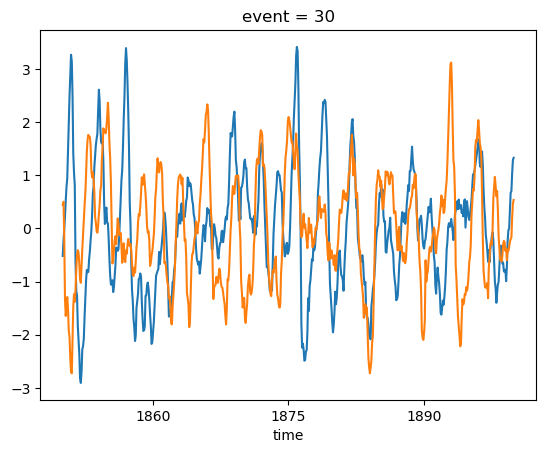

In [17]:
nino34_cesm2.isel(event=0).plot()
nino34_cesm2.isel(event=30).plot()

### Make some plots


In [182]:

# # Plot obs value 
# cor_obs_sel = cor_obs.sel(lon=slice(135,300))
# # cor_obs_sel = cor_obs_sel.sel(lat=slice(-5,5))
# contours = find_contours(cor_obs_sel.values, level=0)

# western_most_point_case = None
# inflection_lon = np.inf

# for contour in contours:
#     for ipoint in range(len(contour)):
#         lat_index, lon_index = contour[ipoint]
#         lon = cor_obs_sel['lon'].values[int(lon_index)]
#         lat = cor_obs_sel['lat'].values[int(lat_index)]
#         # print(lat,lon)

#         if lon<inflection_lon:
#             inflection_lon = lon
#         elif lon>inflection_lon:
#             lat_index, lon_index = contour[ipoint-1]
#             lon = cor_obs_sel['lon'].values[int(lon_index)]
#             western_most_point_case = (cor_obs_sel['lat'].values[int(lat_index)], lon)
#             break 
# print(f"Western-most point in case: {western_most_point_case}")


Western-most point in case: (0.5, 157.5)


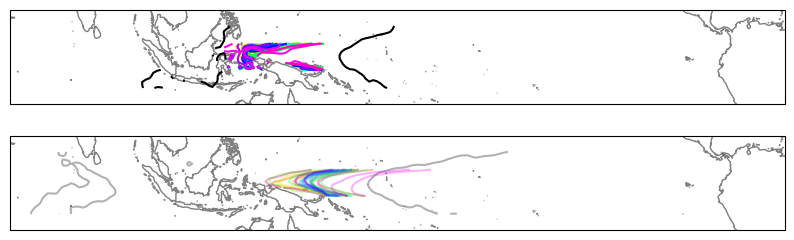

In [20]:
fig,axs = plt.subplots(2,1,figsize=(10,3),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs = axs.ravel()

## Plot zero contours
axs[0].coastlines(color='grey')
axs[0].set_extent([53,300,-15,15], crs=ccrs.PlateCarree())
axs[0].contour(sstObs_anom.lon.values,sstObs_anom.lat.values ,  cor_obs, [0], colors='k', transform=ccrs.PlateCarree())

# Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', 'cividis')
cmap = plt.get_cmap('gist_rainbow')
# Number of colors to extract
num_colors = len(corrs.case.values)
# Generate evenly spaced values between 0 and 1
colorList = [cmap(i) for i in np.linspace(0, 1, num_colors)]

# Ensure the colors are tuples of RGBA values
# Each element in colors should be a tuple like (R, G, B, A)
colorList = [tuple(color) for color in colorList]

for iCase in range(len(corrs.case.values)):
    corrsSel = corrs.sel(lon=slice(120,300))
    corrsSel = corrsSel.sel(lat=slice(-5,5))
    c2 = axs[0].contour(corrsSel.lon.values, corrsSel.lat.values, corrsSel.isel(case=iCase), [0], 
                        colors = np.asarray(colorList[iCase:iCase+1]), transform=ccrs.PlateCarree())

## Plot 0.5 contours
axs[1].coastlines(color='grey')
axs[1].set_extent([53,300,-15,15], crs=ccrs.PlateCarree())
axs[1].contour(sstObs_anom.lon.values,sstObs_anom.lat.values ,  cor_obs, [0.5], colors='k', transform=ccrs.PlateCarree(), alpha=0.3)

# Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', 'cividis')
cmap = plt.get_cmap('gist_rainbow')
# Number of colors to extract
num_colors = len(corrs.case.values)
# Generate evenly spaced values between 0 and 1
colorList = [cmap(i) for i in np.linspace(0, 1, num_colors)]

# Ensure the colors are tuples of RGBA values
# Each element in colors should be a tuple like (R, G, B, A)
colorList = [tuple(color) for color in colorList]

for iCase in range(len(corrs.case.values)):
    corrsSel = corrs.sel(lon=slice(120,240))
    corrsSel = corrsSel.sel(lat=slice(-5,5))
    c2 = axs[1].contour(corrsSel.lon.values, corrsSel.lat.values, corrsSel.isel(case=iCase), [0.5], 
                        colors = np.asarray(colorList[iCase:iCase+1]), transform=ccrs.PlateCarree(), alpha=0.3)


In [37]:
# corrs_sel = cor_obs.sel(lon=slice(120,240), lat=slice(-10,10))
# c2 = axs.contour(corrs_sel.lon.values,corrs_sel.lat.values ,  corrs_sel, [0], transform=ccrs.PlateCarree())

# # Add contour marker
# maybeLon = []
# maybeLat = []
# lenSeg = 0
# for iSegs in range(len(c2.allsegs[0])): 
#     dat0 = c2.allsegs[0][iSegs]
#     western_most_lon = np.nanmin(dat0[:,0])
#     iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
#     maybeLon = np.append(maybeLon, western_most_lon)
#     maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
#     if len(dat0)>lenSeg:
#         lenSeg= len(dat0)
#         iselSeg = iSegs

# axs.plot(maybeLon[iselSeg], maybeLat[iselSeg], 'o', color='limegreen', markersize=5, transform=ccrs.PlateCarree() )



In [21]:
def getWesternPoint(DS, contourLev):
    corrs_sel = DS.sel(lon=slice(120,240), lat=slice(-10,10))
    c2 = plt.contour(corrs_sel.lon.values,corrs_sel.lat.values ,  corrs_sel, [contourLev], transform=ccrs.PlateCarree())
    
    # Add contour marker
    maybeLon = []
    maybeLat = []
    lenSeg = 0
    for iSegs in range(len(c2.allsegs[0])): 
        dat0 = c2.allsegs[0][iSegs]
        western_most_lon = np.nanmin(dat0[:,0])
        iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
        maybeLon = np.append(maybeLon, western_most_lon)
        maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
        if len(dat0)>lenSeg:
            lenSeg= len(dat0)
            iselSeg = iSegs
    
    # axs.plot(maybeLon[iselSeg], maybeLat[iselSeg], 'o', color='limegreen', markersize=5, transform=ccrs.PlateCarree() )
    
    return maybeLon[iselSeg],maybeLat[iselSeg]

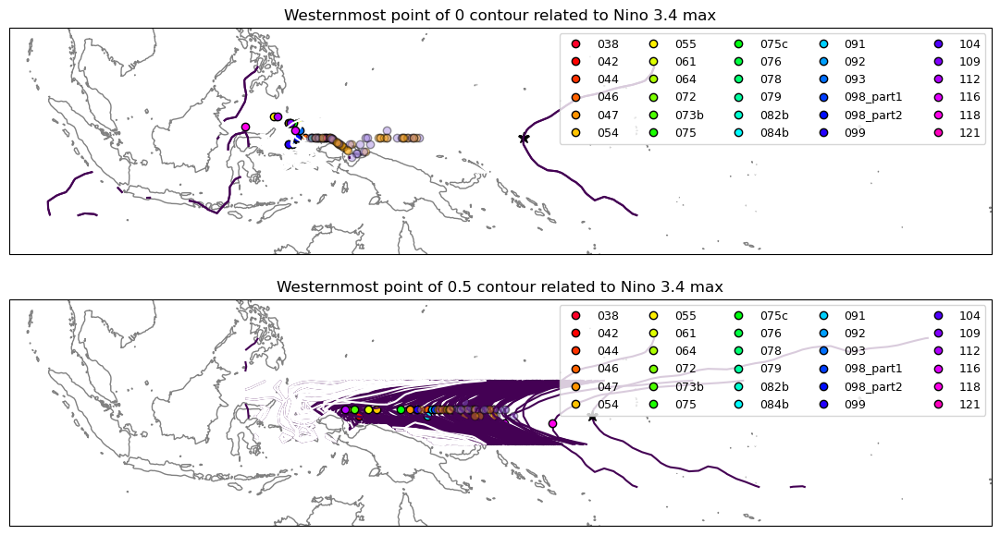

In [18]:
## Figure out western-most longitude of zero contour in pacific 
fig,axs = plt.subplots(2,1,figsize=(20,7),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs     = axs.ravel()


## - - - - - - - - - - - - -
## Plot zero contours
## - - - - - - - - - - - - -
axs[0].coastlines(color='grey')
axs[0].set_extent([90,220,-15,15], crs=ccrs.PlateCarree())
lons_zeroContour = np.full([len(corrs.case.values)], np.nan)
lons_zeroContour_cesm1 = np.full([len(cor_case_cesm1.event.values)], np.nan)
lons_zeroContour_cesm2 = np.full([len(cor_case_cesm2.event.values)], np.nan)

# Plot obs value 
obslon, obslat = getWesternPoint(cor_obs, 0)
c2 = axs[0].contour(sstObs_anom.lon.values,sstObs_anom.lat.values ,  cor_obs, [0], transform=ccrs.PlateCarree())
axs[0].plot(obslon, obslat, '*', color='k',markersize=9, transform=ccrs.PlateCarree())
lonObs_zeroContour = obslon 

## Plot case values too 
## - - - - - - - - - - - - -
for iCase in range(len(corrs.case.values)):
    corrs_sel = corrs.isel(case=iCase).sel(lat=slice(-5,5),lon=slice(120,300))
    c2 = axs[0].contour(corrs_sel.lon.values, corrs_sel.lat.values ,  corrs_sel, [0], colors='white', transform=ccrs.PlateCarree())

    obslon, obslat = getWesternPoint(corrs_sel, 0)
    # lonObs_zeroContour = obslon
    lons_zeroContour[iCase] = obslon
                   
    axs[0].plot(obslon, obslat, 'o', alpha=1, markeredgecolor='k',
                color=np.asarray(colorList[iCase]), transform=ccrs.PlateCarree(), label=corrs_sel.case.values)
    
## Plot case values from PI  ens 
## - - - - - - - - - - - - -
for iCase in range(len(cor_case_cesm1.event.values)):
    ## CESM1
    corrs_sel = cor_case_cesm1.isel(event=iCase).sel(lat=slice(-5,5),lon=slice(120,300))
    obslon, obslat = getWesternPoint(corrs_sel, 0)
    axs[0].plot(obslon, obslat, 'o', alpha=0.4, markeredgecolor='k',
                color='mediumpurple', transform=ccrs.PlateCarree())
    lons_zeroContour_cesm1[iCase] = obslon


    ## CESM2
    corrs_sel = cor_case_cesm2.isel(event=iCase).sel(lat=slice(-5,5),lon=slice(120,300))
    obslon, obslat = getWesternPoint(corrs_sel, 0)

    axs[0].plot(obslon, obslat, 'o', alpha=0.4, markeredgecolor='k',
                color='orange', transform=ccrs.PlateCarree())
    
    lons_zeroContour_cesm2[iCase] = obslon

axs[0].set_title('Westernmost point of 0 contour related to Nino 3.4 max')
axs[0].legend(ncol=5,fontsize=9)

## - - - - - - - - - - - - -
## Plot 0.5 contours
## - - - - - - - - - - - - -
axs[1].coastlines(color='grey')
axs[1].set_extent([90,220,-15,15], crs=ccrs.PlateCarree())
lons_0p5Contour = np.full([len(corrs.case.values)], np.nan)
lons_0p5Contour_cesm1 = np.full([len(cor_case_cesm1.event.values)], np.nan)
lons_0p5Contour_cesm2 = np.full([len(cor_case_cesm2.event.values)], np.nan)

# # Plot obs value 
obslon, obslat = getWesternPoint(cor_obs, 0.5)
c2 = axs[0].contour(sstObs_anom.lon.values,sstObs_anom.lat.values ,  cor_obs, [0], transform=ccrs.PlateCarree())
axs[1].plot(obslon, obslat, '*', color='k',markersize=9, transform=ccrs.PlateCarree())
lonObs_0p5Contour = obslon

## Plot case values too 
## - - - - - - - - - - - - -
for iCase in range(len(corrs.case.values)):
    corrs_sel = corrs.isel(case=iCase).sel(lat=slice(-5,5),lon=slice(120,300))
    c2 = axs[1].contour(corrs_sel.lon.values, corrs_sel.lat.values ,  corrs_sel, [0], colors='white', transform=ccrs.PlateCarree())

    obslon, obslat = getWesternPoint(corrs_sel, 0.5)

    axs[1].plot(obslon, obslat, 'o', alpha=1, markeredgecolor='k',
                color=np.asarray(colorList[iCase]), transform=ccrs.PlateCarree(), label=corrs_sel.case.values)
    
    lons_0p5Contour[iCase] = obslon


## Plot PI values 
## - - - - - - - - - - - - -
for iCase in range(len(cor_case_cesm1.event.values)):
    ## CESM1
    corrs_sel = cor_case_cesm1.isel(event=iCase).sel(lat=slice(-5,5),lon=slice(120,300))
    obslon, obslat = getWesternPoint(corrs_sel, 0.5)
    axs[1].plot(obslon, obslat, 'o', alpha=0.4, markeredgecolor='k',
                color='mediumpurple', transform=ccrs.PlateCarree())
    lons_0p5Contour_cesm1[iCase] = obslon


    ## CESM2
    corrs_sel = cor_case_cesm2.isel(event=iCase).sel(lat=slice(-5,5),lon=slice(120,300))
    obslon, obslat = getWesternPoint(corrs_sel, 0.5)

    axs[1].plot(obslon, obslat, 'o', alpha=0.4, markeredgecolor='k',
                color='orange', transform=ccrs.PlateCarree())
    
    lons_0p5Contour_cesm2[iCase] = obslon

axs[1].legend(ncol=5, fontsize=9)
axs[1].set_title('Westernmost point of 0.5 contour related to Nino 3.4 max')

plt.show()

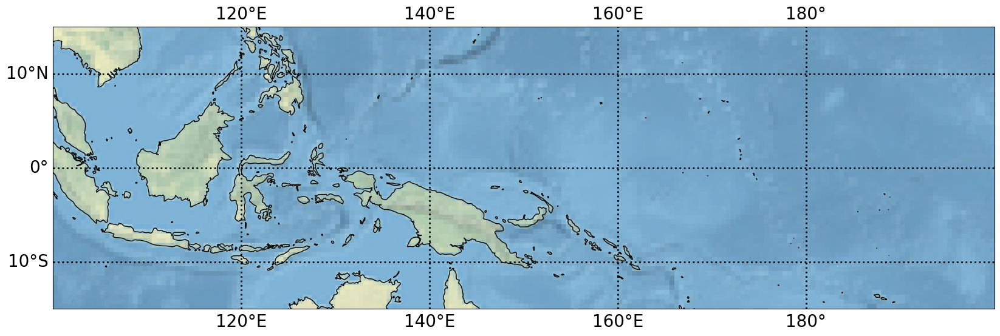

In [19]:
fig,axs = plt.subplots(1,1,figsize=(20,7),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs.coastlines()
axs.set_extent([100,200,-15,15], crs=ccrs.PlateCarree())
axs.stock_img()

gl = axs.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='k', alpha=0.95, linestyle=':')
gl.ylocator = mticker.FixedLocator([-10, 0, 10])
gl.xlocator = mticker.FixedLocator([120,140,160,180])
gl.xlabel_style = {'size': 20, 'color': 'k'}
gl.ylabel_style = {'size': 20, 'color': 'k'}


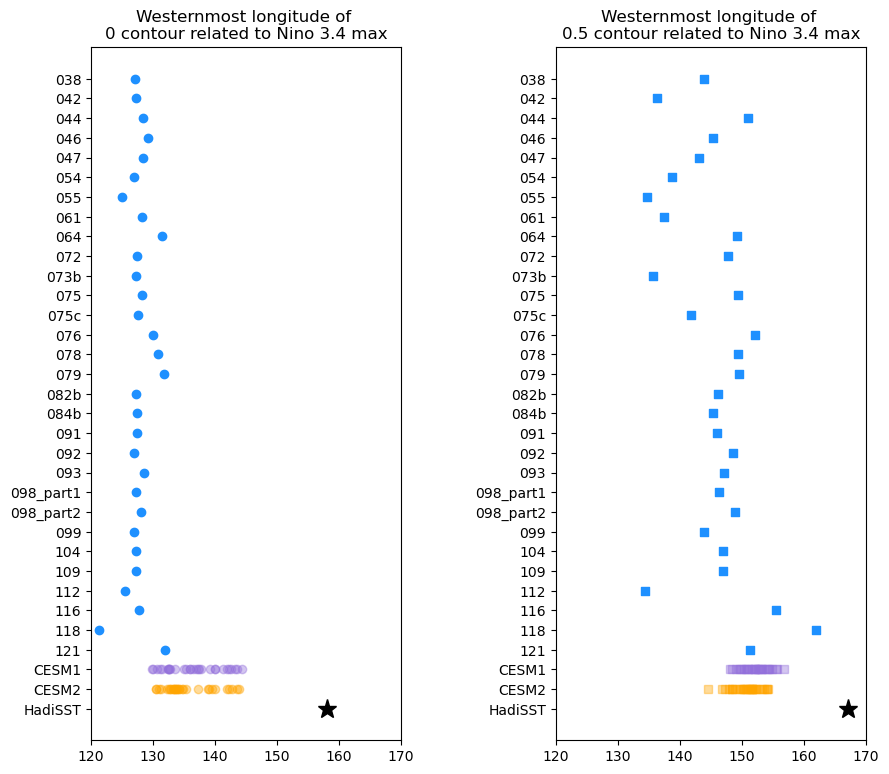

In [20]:
fig,axs=plt.subplots(1,2,figsize=(10,9))
axs = axs.ravel()

axs[0].scatter(lons_zeroContour, corrs.case.values, color='dodgerblue', alpha=1)
# axs[0].axhline(lonObs_zeroContour,color='k',linestyle='--')
# axs[0].plot(lonObs_zeroContour, 'HadiSST', '*', color='k',markersize=14)
axs[0].set_title('Westernmost longitude of \n0 contour related to Nino 3.4 max')
axs[0].invert_yaxis()
axs[0].plot(lons_zeroContour_cesm1, np.full([len(cor_case_cesm1.event.values)], 'CESM1'), 'o', color='mediumpurple', alpha=0.4)
axs[0].plot(lons_zeroContour_cesm2, np.full([len(cor_case_cesm2.event.values)], 'CESM2'), 'o', color='orange', alpha=0.4)
axs[0].plot(lonObs_zeroContour, 'HadiSST', '*', color='k',markersize=14)

axs[1].scatter(lons_0p5Contour, corrs.case.values, marker = 's', color='dodgerblue', alpha=1)
# axs[1].axhline(lonObs_0p5Contour,color='k', linestyle='--')
# axs[1].plot(lonObs_0p5Contour, 'HadiSST', '*', color='k',markersize=14)
axs[1].set_title('Westernmost longitude of \n0.5 contour related to Nino 3.4 max')
axs[1].invert_yaxis()
axs[1].plot(lons_0p5Contour_cesm1, np.full([len(cor_case_cesm1.event.values)], 'CESM1'), 's', color='mediumpurple', alpha=0.4)
axs[1].plot(lons_0p5Contour_cesm2, np.full([len(cor_case_cesm2.event.values)], 'CESM2'), 's', color='orange', alpha=0.4)
axs[1].plot(lonObs_0p5Contour, 'HadiSST', '*', color='k',markersize=14)

axs[0].set_xlim(120,170)
axs[1].set_xlim(120,170)

# ## Mark lineage of some runs
# i78b = (np.where(corrs['case'].values=='078b')[0]).astype(int)[0]
# i3x = (np.where(corrs['case'].values=='081b')[0]).astype(int)[0]
# i1x = (np.where(corrs['case'].values=='082b')[0]).astype(int)[0]
# i0x = (np.where(corrs['case'].values=='083b')[0]).astype(int)[0]

# axs[1].plot( [lons_0p5Contour[i78b],lons_0p5Contour[i3x]], [corrs['case'].values[i78b], corrs['case'].values[i3x]],
#          '-',color='purple')
# axs[1].plot( [lons_0p5Contour[i78b],lons_0p5Contour[i1x]], [corrs['case'].values[i78b], corrs['case'].values[i1x]],
#          '-',color='mediumpurple')
# axs[1].plot([lons_0p5Contour[i78b],lons_0p5Contour[i0x]], [corrs['case'].values[i78b], corrs['case'].values[i0x]], 
#          '-',color='violet')

# for specCase in range(len(lons_0p5Contour)): 
#     ## Mark Taus Code
#     if ((corrs['case'].values[specCase]=='044.') | (corrs['case'].values[specCase]=='076.') | (corrs['case'].values[specCase]=='080.') ):
#         axs[1].plot(lons_0p5Contour[specCase], corrs['case'].values[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
#     ## Mark warm and cold branch starts 
#     if (corrs['case'].values[specCase]=='074.'):
#         axs[1].plot(lons_0p5Contour[specCase], corrs['case'].values[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
#     if (corrs['case'].values[specCase]=='073.'):
#         axs[1].plot( lons_0p5Contour[specCase], corrs['case'].values[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)



fig.subplots_adjust(wspace=0.5)

In [29]:
df_sel = df.drop([0,1,2,3,10])

iKeep_corrs = np.where(corrs.case.values!='067.')[0]

lons_zeroContour_match = lons_zeroContour[iKeep_corrs]
corrs_case_match = corrs.case.values[iKeep_corrs]

lons_0p5Contour_match = lons_0p5Contour[iKeep_corrs]

NameError: name 'df' is not defined

In [122]:
df

,Case Name,Years analyzed,Nyrs available history,Transition to opposite phase \n(months),Value of max variance,Month of max variance,Value of min variance,Month of min variance,Notes
0,HadiSST,1965-2002,NaN,~11,1.45,Dec,0.30,Apr,NaN
1,HadiSST,1942-1981,NaN,~11,0.9,Nov/Dec,0.25,May,NaN
2,CESM2,0001-0151,NaN,12,1.75,Dec-Jan,0.65,Jul,NaN
3,CESM1,0001-1000,NaN,12,1.4,Dec-Jan,0.40,Jul,NaN
4,38,0001-0061,Climo only (yrs 2-22),~22,1.5,Dec,0.60,Jul,Cesm2_3_alpha16b (035); new wsub values (halve...
5,42,0001-0048,Climo only (yrs 2-22),~18,>3,Dec,1.10,May,038 + Modify ice cloud fraction algorithm (ice...
6,44,0001-0045,Climo only (yrs 2-22),~11,1.9,Dec,0.70,Jul,Taus code on; different tunings for non-CLUBB ...
7,46,0001-0071,Climo only (yrs 2-22),~15,2.3,Dec,0.90,Jul,037+new liquid/frozen runoff mapping files
8,47,0001-0071,Climo only (yrs 2-22),~14,2.1,Dec,0.90,Jun/Jul,046+hybrid ocean coords
9,48,0001-0037,Climo only (yrs 2-22),~14,>3,Nov-Jan,1.20,May,042+zmconv_num_cin=1->2


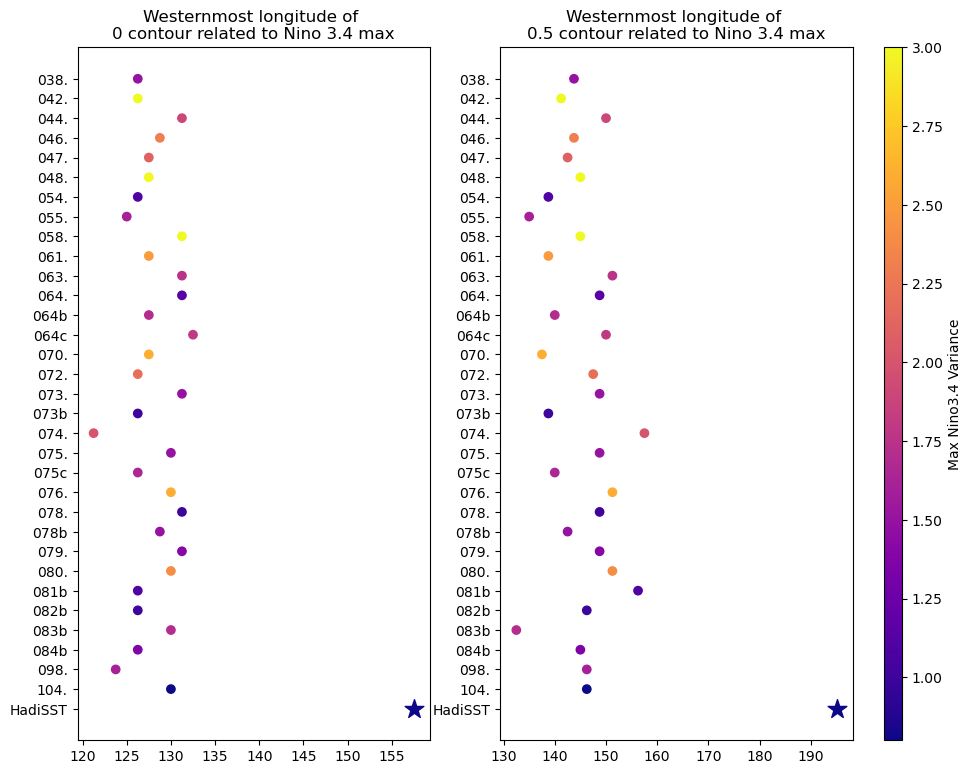

In [33]:
fig,axs=plt.subplots(1,2,figsize=(10,9))
axs = axs.ravel()

valArray = df_sel['Value of max variance'].copy()
valArray[valArray=='>3'] = '3'

axs[0].scatter(lons_zeroContour_match, corrs_case_match, c=valArray.values.astype(float) , cmap='plasma')
axs[0].scatter(lonObs_zeroContour, 'HadiSST', c=float(df['Value of max variance'].values[0]),cmap='plasma',marker='*', s=200)
axs[0].set_title('Westernmost longitude of \n0 contour related to Nino 3.4 max')
axs[0].invert_yaxis()

c1 = axs[1].scatter(lons_0p5Contour_match, corrs_case_match, c=valArray.values.astype(float), cmap='plasma')
axs[1].scatter(lonObs_0p5Contour, 'HadiSST', c=float(df['Value of max variance'].values[0]),cmap='plasma',marker='*', s=200)
axs[1].set_title('Westernmost longitude of \n0.5 contour related to Nino 3.4 max')
axs[1].invert_yaxis()

# Add colorbar 
# cbar = fig.colorbar(c1,  orientation="vertical", shrink=0.4, label='Max Variance')
cax = axs[1].inset_axes([1.09, 0, 0.05, 1])  # THE NEW AXES, x, y, width, height,
cbar = fig.colorbar(c1, cax = cax, label='Max Nino3.4 Variance', orientation="vertical")

fig.subplots_adjust(hspace=0.4)

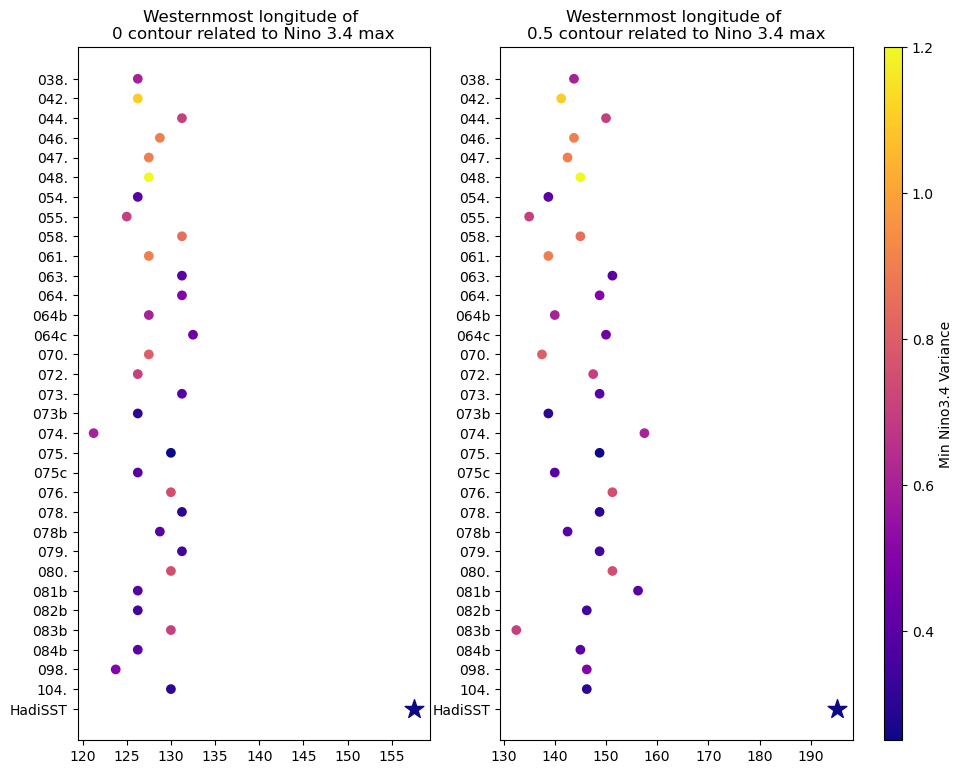

In [34]:
fig,axs=plt.subplots(1,2,figsize=(10,9))
axs = axs.ravel()

valArray = df_sel['Value of min variance'].copy()
# valArray[valArray=='>3'] = '3'

axs[0].scatter(lons_zeroContour_match, corrs_case_match, c=valArray.values.astype(float) , cmap='plasma')
axs[0].scatter(lonObs_zeroContour, 'HadiSST', c=float(df['Value of max variance'].values[0]),cmap='plasma',marker='*', s=200)
axs[0].set_title('Westernmost longitude of \n0 contour related to Nino 3.4 max')
axs[0].invert_yaxis()

c1 = axs[1].scatter(lons_0p5Contour_match, corrs_case_match, c=valArray.values.astype(float), cmap='plasma')
axs[1].scatter(lonObs_0p5Contour, 'HadiSST', c=float(df['Value of max variance'].values[0]),cmap='plasma',marker='*', s=200)
axs[1].set_title('Westernmost longitude of \n0.5 contour related to Nino 3.4 max')
axs[1].invert_yaxis()

# Add colorbar 
# cbar = fig.colorbar(c1,  orientation="vertical", shrink=0.4, label='Max Variance')
cax = axs[1].inset_axes([1.09, 0, 0.05, 1])  # THE NEW AXES, x, y, width, height,
cbar = fig.colorbar(c1, cax = cax, label='Min Nino3.4 Variance', orientation="vertical")

fig.subplots_adjust(hspace=0.4)

**Look at some averages for west pacific...**

In [20]:
corrs_westPac = corrs.sel(lon=slice(120,280))
corrs_westPac = corrs_westPac.sel(lat=slice(-10, 10))

cor_obs_westPac = cor_obs.sel(lon=slice(120,280))

corrs_westPac_cesm1 = cor_case_cesm1.sel(lon=slice(120,280))
corrs_westPac_cesm1 = corrs_westPac_cesm1.sel(lat=slice(-10, 10))

corrs_westPac_cesm2 = cor_case_cesm2.sel(lon=slice(120,280))
corrs_westPac_cesm2 = corrs_westPac_cesm2.sel(lat=slice(-10, 10))


In [60]:
reshape_data = np.full([len(corrs_westPac.case.values), len(corrs_westPac.lon.values)*len(corrs_westPac.lat.values)], np.nan)

for iCase in range(len(corrs_westPac.case.values)):
    reshape_data[iCase,:] = np.reshape(corrs_westPac.isel(case=iCase).values, [1, len(corrs_westPac.lon.values)*len(corrs_westPac.lat.values)])

# Create the DataArray
da = xr.DataArray(reshape_data, coords=[corrs_westPac.case.values, np.arange(len(corrs_westPac.lon.values)*len(corrs_westPac.lat.values))], dims=["case", "Location"])

# Convert the DataArray to a Pandas DataFrame
df = da.to_dataframe(name="Correlation").reset_index()

## Handle observations too
reshape_obs = np.reshape(cor_obs_westPac, [1, len(cor_obs_westPac.lon.values)*len(cor_obs_westPac.lat.values)])
da_obs =  xr.DataArray(reshape_obs, coords=[["HadiSST"], np.arange(len(cor_obs_westPac.lon.values)*len(cor_obs_westPac.lat.values))], dims=["case", "Location"])
df_obs = da_obs.to_dataframe(name="Correlation").reset_index()

df_all = pd.concat([df, df_obs], ignore_index=True)

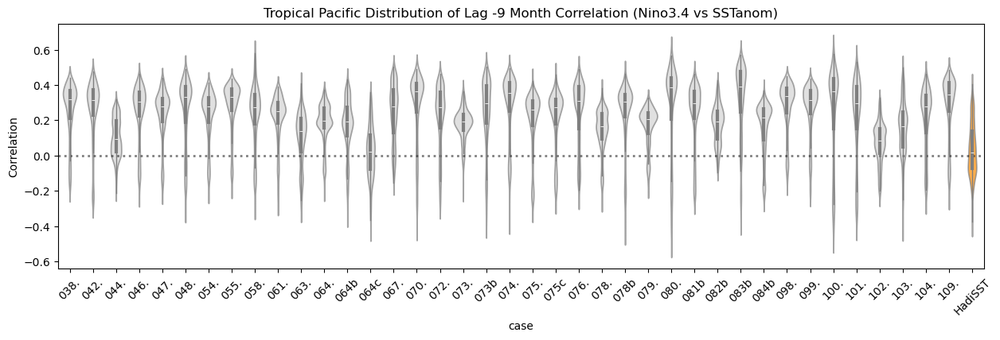

In [62]:
fig,axs = plt.subplots(1,1,figsize=(15,4))
axs.axhline(0,color='k',linewidth=2,alpha=0.5,linestyle=':')

v1 = sns.violinplot(df_all, x='case',y='Correlation', inner='box', color="lightgrey", alpha=0.7, 
                   inner_kws=dict(box_width=3, whis_width=1))

v1.collections[-1].set_facecolor("darkorange")

axs.set_title('Tropical Pacific Distribution of Lag 0 Month Correlation (Nino3.4 vs SSTanom)')

plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()

# axs.axhline(0,color='k',linewidth=2,alpha=0.5,linestyle=':')

## How possible is it to recreate some of the metrics from ENSO_metrics?
Ref: https://pcmdi.llnl.gov/pmp-preliminary-results/interactive_plot/portrait_plot/enso_metric/enso_metrics_interactive_portrait_plots_v20210723.html 

**ENSO Duration** <br>
https://github.com/CLIVAR-PRP/ENSO_metrics/blob/1dbd59a6264e4e8ee28d26ce5083cdae0faf52a1/lib/EnsoMetricsLib.py#L7170 <br>
*Description:* The EnsoDuration() function computes sea surface temperature anomalies life cycle associated with ENSO in a 'box'
    (usually the nino3.4) with a window of 'nbr_years_window' centered on ENSO (nbr_years_window/2 leading and lagging
    ENSO), the duration is then the period, around the peak, during which the life cycle is above 0.25.

In [22]:
lagSel = -24+np.arange(49)

cor_obs_thisLag_nino   = np.full([len(lagSel)], np.nan)
cor_cases_thisLag_nino = np.full([len(listFiles_TS), len(lagSel)], np.nan)
cor_cesm1_thisLag_nino = np.full([len(cor_case_cesm1.event.values), len(lagSel)], np.nan)
cor_cesm2_thisLag_nino = np.full([len(cor_case_cesm2.event.values), len(lagSel)], np.nan)

for iLag in range(len(lagSel)):
    ## Observations ------
    cor_obs_thisLag = getLagCorr_obs(lagSel[iLag])
    
    # Get average in Nino3.4 region... 
    cor_obs_thisLag_nino[iLag] = cor_obs_thisLag.sel(lon=slice(lon_e34,lon_w34), lat=slice(lat_s34, lat_n34)).mean(['lat','lon'])

## Handle model data ------
for iSim in range(len(listFiles_TS)):
    for iLag in range(len(lagSel)):
        DS = xr.open_dataset(listFiles_TS[iSim]) 
        
        ## Add case ID (short name) to the DS
        x = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
        if x:
            caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]
        else: 
            x = re.search("BLTHIST.ne30_t232.", listFiles_TS[iSim])
            caseName = 'HIST_'+listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]
        
        ocnMask = DS.LANDFRAC.values
        ocnMask[ocnMask>0.45] = np.nan
        ocnMask[ocnMask<=0.45] = 1
        
        # Detrend data 
        TS = DS.TS 
        ts = signal.detrend(TS, axis=0, type='linear')
        # Get SST 
        sst = ts * ocnMask
        
        sst = xr.DataArray(sst, 
            coords={'time': DS.time.values,
                    'lat':  DS.lat.values, 
                    'lon':  DS.lon.values}, 
            dims=["time", "lat", "lon"])
        
        
        # Remove annual cycle from monthly data 
        sst_anom = rmMonAnnCyc(sst)
        
        ## Compute nino 3.4 index
        ilats = np.where((sst_anom.lat.values>=lat_s34)  & (sst_anom.lat.values<=lat_n34))[0]
        ilons = np.where((sst_anom.lon.values>=lon_e34)  & (sst_anom.lon.values<=lon_w34))[0]
        
        # Compute weights and get Nino3.4 
        regionTS = sst_anom.isel(lat=ilats, lon=ilons)
        coswgt   = np.cos(np.deg2rad(regionTS.lat))
        
        nino34   = regionTS.weighted(coswgt).mean(('lon','lat'))

    
        ## COMPUE CORRELATION 
        cor_case = getLagCorr(lagSel[iLag], nino34, sst_anom)
        cor_cases_thisLag_nino[iSim, iLag] = cor_case.sel(lon=slice(lon_e34,lon_w34), lat=slice(lat_s34, lat_n34)).mean(['lat','lon'])

    print('Done with case %i of %i' % (iSim+1, len(listFiles_TS)))


# # Handle CESM1/2 data ------
# for iSim in range(len(cor_case_cesm1.event.values)):
#     for iLag in range(len(lagSel)):
    
#         ## COMPUE CORRELATION 
#         cor_cesm1 = getLagCorr(lagSel[iLag], nino34_cesm1.isel(event=iSim), sst_anom_cesm1.isel(event=iSim))
#         cor_cesm1_thisLag_nino[iSim, iLag] = cor_cesm1.sel(lon=slice(lon_e34,lon_w34), lat=slice(lat_s34, lat_n34)).mean(['lat','lon'])

#         cor_cesm2 = getLagCorr(lagSel[iLag], nino34_cesm2.isel(event=iSim), sst_anom_cesm2.isel(event=iSim))
#         cor_cesm2_thisLag_nino[iSim, iLag] = cor_cesm2.sel(lon=slice(lon_e34,lon_w34), lat=slice(lat_s34, lat_n34)).mean(['lat','lon'])

    
#     print('Done with CESM1/2 event %i of %i' % (iSim+1, len(nino34_cesm2.event.values)))


Done with case 1 of 30
Done with case 2 of 30
Done with case 3 of 30
Done with case 4 of 30
Done with case 5 of 30
Done with case 6 of 30
Done with case 7 of 30
Done with case 8 of 30
Done with case 9 of 30
Done with case 10 of 30
Done with case 11 of 30
Done with case 12 of 30
Done with case 13 of 30
Done with case 14 of 30
Done with case 15 of 30
Done with case 16 of 30
Done with case 17 of 30
Done with case 18 of 30
Done with case 19 of 30
Done with case 20 of 30
Done with case 21 of 30
Done with case 22 of 30
Done with case 23 of 30
Done with case 24 of 30
Done with case 25 of 30
Done with case 26 of 30
Done with case 27 of 30
Done with case 28 of 30
Done with case 29 of 30
Done with case 30 of 30


In [23]:
# Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', 'cividis')
# cmap = plt.get_cmap('nipy_spectral')
cmap = plt.get_cmap('rainbow')
# Number of colors to extract
num_colors = len(corrs.case.values)
# Generate evenly spaced values between 0 and 1
colorList = [cmap(i) for i in np.linspace(0, 1, num_colors)]

# Ensure the colors are tuples of RGBA values
# Each element in colors should be a tuple like (R, G, B, A)
colorList = [tuple(color) for color in colorList]


In [20]:
# fig,axs = plt.subplots(1,1,figsize=(12,8))

# axs.plot(lagSel, cor_obs_thisLag_nino, 'k', linewidth=4, label='HadiSST')

# for iCase in range(len(nino34_cesm2.event.values)): 
#     axs.plot(lagSel, cor_cesm1_thisLag_nino[iCase,:], color= 'mediumpurple', alpha=0.25,linewidth=0.6 )
#     axs.plot(lagSel, cor_cesm2_thisLag_nino[iCase,:], color= 'orange', alpha=0.25, linewidth=0.6)
# for iCase in range(len(listFiles_TS)): 
#     axs.plot(lagSel, cor_cases_thisLag_nino[iCase,:], color= 'green', alpha=0.25, linewidth=0.6)

# axs.plot(lagSel, np.nanmean(cor_cesm1_thisLag_nino,axis=0), color= 'mediumpurple', label='CESM1 PI mean', linewidth=3 )
# axs.plot(lagSel, np.nanmean(cor_cesm2_thisLag_nino,axis=0), color= 'orange',  label='CESM2 PI mean', linewidth=3)
# axs.plot(lagSel, np.nanmean(cor_cases_thisLag_nino,axis=0), color= 'green',  label='CESM3-dev mean', linewidth=3)

    
# axs.legend(ncol=5)
# axs.axhline(0.25, color='grey',alpha=0.5,linestyle='--')
# axs.axhline(0.0, color='grey',alpha=0.5,linestyle='-')

# axs.set_title('Mean Correlation in Nino3.4 box between Nino3.4 and SST anomalies (all months)')
# axs.set_xlabel('Lag (months)')
# axs.set_ylabel('Mean Correlation')


Text(0, 0.5, 'Mean Correlation')

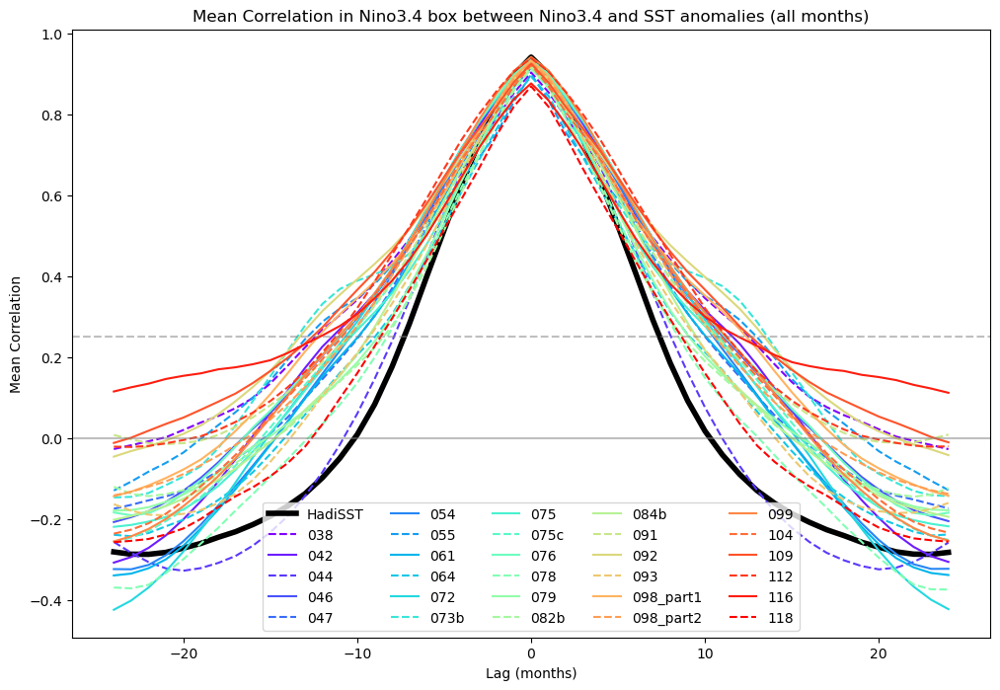

In [28]:
fig,axs = plt.subplots(1,1,figsize=(12,8))

axs.plot(lagSel, cor_obs_thisLag_nino, 'k', linewidth=4, label='HadiSST')

for iCase in range(len(listFiles_TS)): 
    if (iCase % 2)==0: 
        axs.plot(lagSel, cor_cases_thisLag_nino[iCase,:], '--', color= colorList[iCase], label=str(corrs.case.values[iCase]))
    else: 
        axs.plot(lagSel, cor_cases_thisLag_nino[iCase,:], color= colorList[iCase], label=str(corrs.case.values[iCase]))
        
    
axs.legend(ncol=5)
axs.axhline(0.25, color='grey',alpha=0.5,linestyle='--')
axs.axhline(0.0, color='grey',alpha=0.5,linestyle='-')

axs.set_title('Mean Correlation in Nino3.4 box between Nino3.4 and SST anomalies (all months)')
axs.set_xlabel('Lag (months)')
axs.set_ylabel('Mean Correlation')


In [29]:
## Get number of months an ENSO event spends above some threshold value 
lim = 0.25 

numMonthsAboveLimit = np.full([len(listFiles_TS)], np.nan)
for iCase in range(len(listFiles_TS)):
    numMonthsAboveLimit[iCase] = len(np.where(cor_cases_thisLag_nino[iCase,:]>=lim)[0])


numMonthsAboveLimit_cesm1 = np.full([len(nino34_cesm1.event.values)], np.nan)
numMonthsAboveLimit_cesm2 = np.full([len(nino34_cesm2.event.values)], np.nan)
for iCase in range(len(nino34_cesm1.event.values)):
    numMonthsAboveLimit_cesm1[iCase] = len(np.where(cor_cesm1_thisLag_nino[iCase,:]>=lim)[0])
    numMonthsAboveLimit_cesm2[iCase] = len(np.where(cor_cesm2_thisLag_nino[iCase,:]>=lim)[0])

numMonthsAboveLimit_obs = len(np.where(cor_obs_thisLag_nino>=lim)[0])

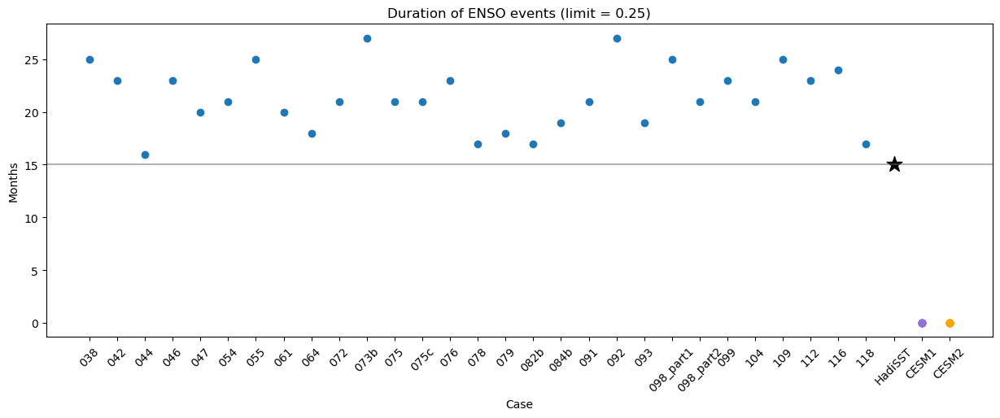

In [30]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

axs.scatter(corrs.case.values, numMonthsAboveLimit)
axs.scatter('HadiSST', numMonthsAboveLimit_obs, marker='*', color='k', s=200)
axs.axhline(numMonthsAboveLimit_obs, color='dimgrey',alpha=0.5)
axs.plot(np.full([len(nino34_cesm1.event.values)], 'CESM1'), numMonthsAboveLimit_cesm1, 'o', color='mediumpurple', alpha=0.3)
axs.plot(np.full([len(nino34_cesm1.event.values)], 'CESM2'), numMonthsAboveLimit_cesm2, 'o', color='orange', alpha=0.3)

axs.set_title('Duration of ENSO events (limit = '+str(lim)+')')
axs.set_ylabel('Months')
axs.set_xlabel('Case')

# ## Mark lineage of some runs
# i78b = (np.where(corrs.case.values=='078b')[0]).astype(int)[0]
# i3x = (np.where(corrs.case.values=='081b')[0]).astype(int)[0]
# i1x = (np.where(corrs.case.values=='082b')[0]).astype(int)[0]
# i0x = (np.where(corrs.case.values=='083b')[0]).astype(int)[0]

# axs.plot([corrs.case.values[i78b], corrs.case.values[i3x]], [numMonthsAboveLimit[i78b],numMonthsAboveLimit[i3x]], 
#          '-',color='purple')
# axs.plot([corrs.case.values[i78b], corrs.case.values[i1x]], [numMonthsAboveLimit[i78b],numMonthsAboveLimit[i1x]], 
#          '-',color='mediumpurple')
# axs.plot([corrs.case.values[i78b], corrs.case.values[i0x]], [numMonthsAboveLimit[i78b],numMonthsAboveLimit[i0x]], 
#          '-',color='violet')

# for specCase in range(len(numMonthsAboveLimit)): 
#     ## Mark Taus Code
#     if ((corrs.case.values[specCase]=='044.') | (corrs.case.values[specCase]=='076.') | (corrs.case.values[specCase]=='080.') ):
#         axs.plot(corrs.case.values[specCase], numMonthsAboveLimit[specCase], 's', color='limegreen',alpha=0.6,markersize=15, label=None)
#     ## Mark warm and cold branch starts 
#     if (corrs.case.values[specCase]=='074.'):
#         axs.plot(corrs.case.values[specCase], numMonthsAboveLimit[specCase], 'o', color='red',alpha=0.4,markersize=15, label=None)
#     if (corrs.case.values[specCase]=='073.'):
#         axs.plot(corrs.case.values[specCase], numMonthsAboveLimit[specCase], 'o', color='cyan',alpha=0.4,markersize=15, label=None)


# axs.axvline('109.',color='k', alpha=0.5)
# axs.axvline('104.',color='k', alpha=0.5)
# axs.axvline('098.',color='k', alpha=0.5)


plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()


**ENSO Seasonality** <br>
https://github.com/CLIVAR-PRP/ENSO_metrics/blob/1dbd59a6264e4e8ee28d26ce5083cdae0faf52a1/lib/EnsoMetricsLib.py#L11052 <br>
*Description:* The EnsoSeasonality() function computes ratio between the November-December-January (NDJ) and March-April-May (MAM)
    average standard deviation of 'sstbox' sstA (usually nino3 sstA)

In [18]:
# Compute ratio of std in observations 

iNDJ = np.where((nino34_obs['time.month'].values==11) | (nino34_obs['time.month'].values==12) | (nino34_obs['time.month'].values==1))[0]
iMAM = np.where((nino34_obs['time.month'].values==3)  | (nino34_obs['time.month'].values==4)  | (nino34_obs['time.month'].values==5))[0]

month_length_NDJ = nino34_obs.isel(time=iNDJ).time.dt.days_in_month
month_length_MAM = nino34_obs.isel(time=iMAM).time.dt.days_in_month

# Calculate the weights by grouping by 'time.season'.
weight_NDJ = ( month_length_NDJ / month_length_NDJ.sum() )
weight_MAM = ( month_length_MAM / month_length_MAM.sum() )


# Compute the weighted mean
weighted_mean_NDJ = (nino34_obs.isel(time=iNDJ).values * weight_NDJ.values).sum() / weight_NDJ.values.sum()
# Compute the weighted variance
weighted_variance_NDJ = ((nino34_obs.isel(time=iNDJ).values - weighted_mean_NDJ) ** 2 * weight_NDJ.values).sum() / weight_NDJ.values.sum()
# Compute the weighted standard deviation
weighted_std_dev_NDJ = np.sqrt(weighted_variance_NDJ)


# Compute the weighted mean
weighted_mean_MAM = (nino34_obs.isel(time=iMAM).values * weight_MAM.values).sum() / weight_MAM.values.sum()
# Compute the weighted variance
weighted_variance_MAM = ((nino34_obs.isel(time=iMAM).values - weighted_mean_MAM) ** 2 * weight_MAM.values).sum() / weight_MAM.values.sum()
# Compute the weighted standard deviation
weighted_std_dev_MAM = np.sqrt(weighted_variance_MAM)

seasonality_obs = weighted_std_dev_NDJ/weighted_std_dev_MAM


## Handle model data ------
seasonality_cases = np.full([len(listFiles_TS)], np.nan)

for iSim in range(len(listFiles_TS)):
    DS = xr.open_dataset(listFiles_TS[iSim]) 
    
    ## Add case ID (short name) to the DS
    x = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
    if x:
        caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]
    else: 
        x = re.search("BLTHIST.ne30_t232.", listFiles_TS[iSim])
        caseName = 'HIST_'+listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]    
    ocnMask = DS.LANDFRAC.values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    TS = DS.TS 
    ts = signal.detrend(TS, axis=0, type='linear')
    # Get SST 
    sst = ts * ocnMask
    
    sst = xr.DataArray(sst, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])
    
    
    # Remove annual cycle from monthly data 
    sst_anom = rmMonAnnCyc(sst)
    
    ## Compute nino 3.4 index
    ilats = np.where((sst_anom.lat.values>=lat_s34)  & (sst_anom.lat.values<=lat_n34))[0]
    ilons = np.where((sst_anom.lon.values>=lon_e34)  & (sst_anom.lon.values<=lon_w34))[0]
    
    # Compute weights and get Nino3.4 
    regionTS = sst_anom.isel(lat=ilats, lon=ilons)
    coswgt   = np.cos(np.deg2rad(regionTS.lat))
    
    nino34   = regionTS.weighted(coswgt).mean(('lon','lat'))

    # Compute seasonality
    iNDJ = np.where((nino34['time.month'].values==11) | (nino34['time.month'].values==12) | (nino34['time.month'].values==1))[0]
    iMAM = np.where((nino34['time.month'].values==3)  | (nino34['time.month'].values==4)  | (nino34['time.month'].values==5))[0]
    
    month_length_NDJ = nino34.isel(time=iNDJ).time.dt.days_in_month
    month_length_MAM = nino34.isel(time=iMAM).time.dt.days_in_month
    
    # Calculate the weights by grouping by 'time.season'.
    weight_NDJ = ( month_length_NDJ / month_length_NDJ.sum() )
    weight_MAM = ( month_length_MAM / month_length_MAM.sum() )
    
    
    # Compute the weighted mean
    weighted_mean_NDJ = (nino34.isel(time=iNDJ).values * weight_NDJ.values).sum() / weight_NDJ.values.sum()
    # Compute the weighted variance
    weighted_variance_NDJ = ((nino34.isel(time=iNDJ).values - weighted_mean_NDJ) ** 2 * weight_NDJ.values).sum() / weight_NDJ.values.sum()
    # Compute the weighted standard deviation
    weighted_std_dev_NDJ = np.sqrt(weighted_variance_NDJ)
    
    
    # Compute the weighted mean
    weighted_mean_MAM = (nino34.isel(time=iMAM).values * weight_MAM.values).sum() / weight_MAM.values.sum()
    # Compute the weighted variance
    weighted_variance_MAM = ((nino34.isel(time=iMAM).values - weighted_mean_MAM) ** 2 * weight_MAM.values).sum() / weight_MAM.values.sum()
    # Compute the weighted standard deviation
    weighted_std_dev_MAM = np.sqrt(weighted_variance_MAM)
    
    seasonality_cases[iSim] = weighted_std_dev_NDJ/weighted_std_dev_MAM
    

    print('Done with case %i of %i' % (iSim+1, len(listFiles_TS)))
    
## Handle model data from CESM1/CESM2 ------
seasonality_cases_cesm1 = np.full([len(nino34_cesm1.event.values)], np.nan)
seasonality_cases_cesm2 = np.full([len(nino34_cesm2.event.values)], np.nan)

for iSim in range(len(nino34_cesm1.event.values)):
    nino34   = nino34_cesm1.isel(event=iSim)

    # Compute seasonality
    iNDJ = np.where((nino34['time.month'].values==11) | (nino34['time.month'].values==12) | (nino34['time.month'].values==1))[0]
    iMAM = np.where((nino34['time.month'].values==3)  | (nino34['time.month'].values==4)  | (nino34['time.month'].values==5))[0]
    
    month_length_NDJ = nino34.isel(time=iNDJ).time.dt.days_in_month
    month_length_MAM = nino34.isel(time=iMAM).time.dt.days_in_month
    
    # Calculate the weights by grouping by 'time.season'.
    weight_NDJ = ( month_length_NDJ / month_length_NDJ.sum() )
    weight_MAM = ( month_length_MAM / month_length_MAM.sum() )
    
    # Compute the weighted mean
    weighted_mean_NDJ = (nino34.isel(time=iNDJ).values * weight_NDJ.values).sum() / weight_NDJ.values.sum()
    # Compute the weighted variance
    weighted_variance_NDJ = ((nino34.isel(time=iNDJ).values - weighted_mean_NDJ) ** 2 * weight_NDJ.values).sum() / weight_NDJ.values.sum()
    # Compute the weighted standard deviation
    weighted_std_dev_NDJ = np.sqrt(weighted_variance_NDJ)
    
    
    # Compute the weighted mean
    weighted_mean_MAM = (nino34.isel(time=iMAM).values * weight_MAM.values).sum() / weight_MAM.values.sum()
    # Compute the weighted variance
    weighted_variance_MAM = ((nino34.isel(time=iMAM).values - weighted_mean_MAM) ** 2 * weight_MAM.values).sum() / weight_MAM.values.sum()
    # Compute the weighted standard deviation
    weighted_std_dev_MAM = np.sqrt(weighted_variance_MAM)
    
    seasonality_cases_cesm1[iSim] = weighted_std_dev_NDJ/weighted_std_dev_MAM
    

print('Done with CESM1 cases')


for iSim in range(len(nino34_cesm2.event.values)):
    nino34   = nino34_cesm2.isel(event=iSim)

    # Compute seasonality
    iNDJ = np.where((nino34['time.month'].values==11) | (nino34['time.month'].values==12) | (nino34['time.month'].values==1))[0]
    iMAM = np.where((nino34['time.month'].values==3)  | (nino34['time.month'].values==4)  | (nino34['time.month'].values==5))[0]
    
    month_length_NDJ = nino34.isel(time=iNDJ).time.dt.days_in_month
    month_length_MAM = nino34.isel(time=iMAM).time.dt.days_in_month
    
    # Calculate the weights by grouping by 'time.season'.
    weight_NDJ = ( month_length_NDJ / month_length_NDJ.sum() )
    weight_MAM = ( month_length_MAM / month_length_MAM.sum() )
    
    # Compute the weighted mean
    weighted_mean_NDJ = (nino34.isel(time=iNDJ).values * weight_NDJ.values).sum() / weight_NDJ.values.sum()
    # Compute the weighted variance
    weighted_variance_NDJ = ((nino34.isel(time=iNDJ).values - weighted_mean_NDJ) ** 2 * weight_NDJ.values).sum() / weight_NDJ.values.sum()
    # Compute the weighted standard deviation
    weighted_std_dev_NDJ = np.sqrt(weighted_variance_NDJ)
    
    
    # Compute the weighted mean
    weighted_mean_MAM = (nino34.isel(time=iMAM).values * weight_MAM.values).sum() / weight_MAM.values.sum()
    # Compute the weighted variance
    weighted_variance_MAM = ((nino34.isel(time=iMAM).values - weighted_mean_MAM) ** 2 * weight_MAM.values).sum() / weight_MAM.values.sum()
    # Compute the weighted standard deviation
    weighted_std_dev_MAM = np.sqrt(weighted_variance_MAM)
    
    seasonality_cases_cesm2[iSim] = weighted_std_dev_NDJ/weighted_std_dev_MAM
    

print('Done with CESM2 cases')

Done with case 1 of 26
Done with case 2 of 26
Done with case 3 of 26
Done with case 4 of 26
Done with case 5 of 26
Done with case 6 of 26
Done with case 7 of 26
Done with case 8 of 26
Done with case 9 of 26
Done with case 10 of 26
Done with case 11 of 26
Done with case 12 of 26
Done with case 13 of 26
Done with case 14 of 26
Done with case 15 of 26
Done with case 16 of 26
Done with case 17 of 26
Done with case 18 of 26
Done with case 19 of 26
Done with case 20 of 26
Done with case 21 of 26
Done with case 22 of 26
Done with case 23 of 26
Done with case 24 of 26
Done with case 25 of 26
Done with case 26 of 26
Done with CESM1 cases
Done with CESM2 cases


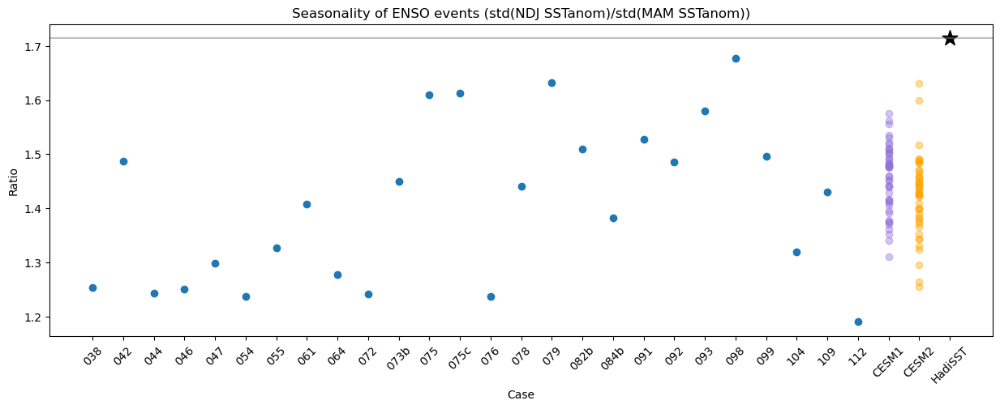

In [26]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

axs.scatter(corrs.case.values, seasonality_cases)
axs.plot(np.full([len(cor_case_cesm1.event.values)], 'CESM1'), seasonality_cases_cesm1, 'o', color='mediumpurple', alpha=0.4)
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), seasonality_cases_cesm2, 'o', color='orange', alpha=0.4)
axs.scatter('HadiSST', seasonality_obs, color='k', marker='*', s=200)
axs.axhline(seasonality_obs, color='grey',alpha=0.5)

axs.set_title('Seasonality of ENSO events (std(NDJ SSTanom)/std(MAM SSTanom))')
axs.set_ylabel('Ratio')
axs.set_xlabel('Case')

plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()


*Variance of nino 3.4 SST anomalies*

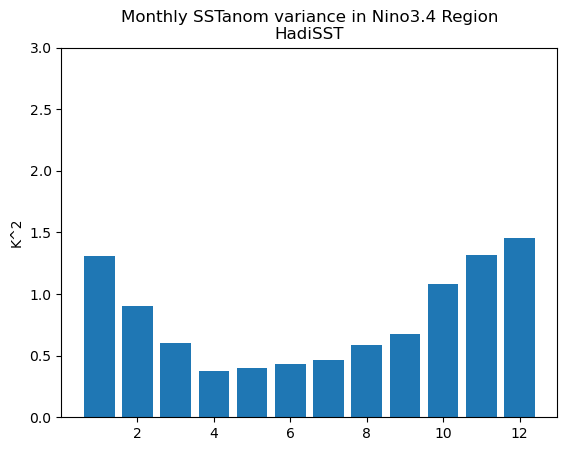

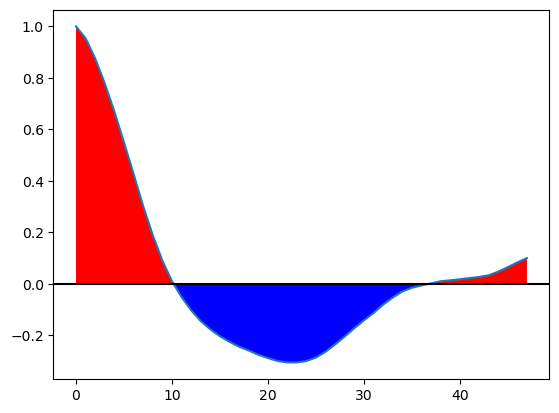

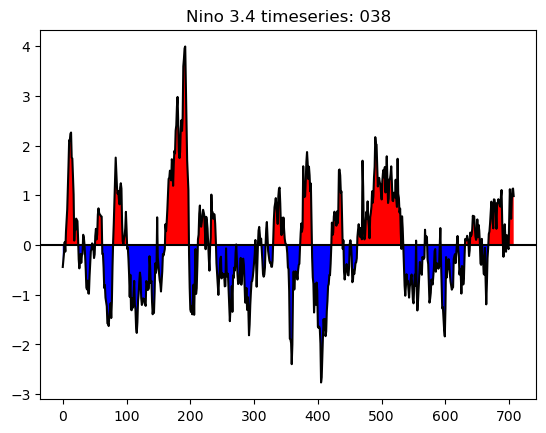

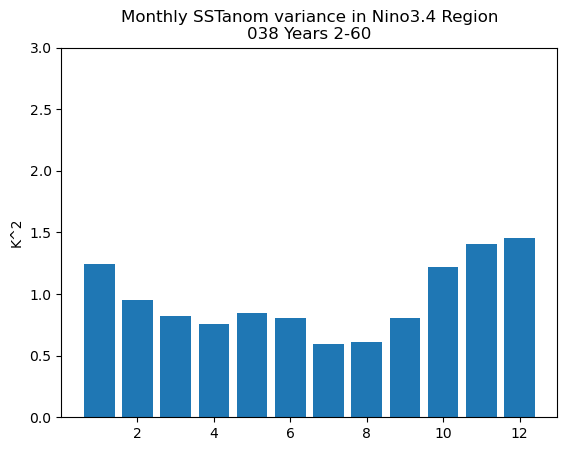

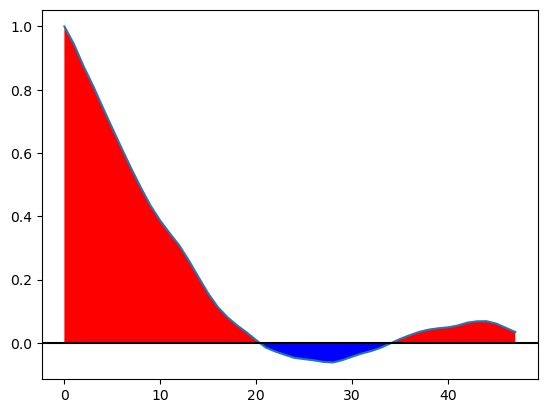

...

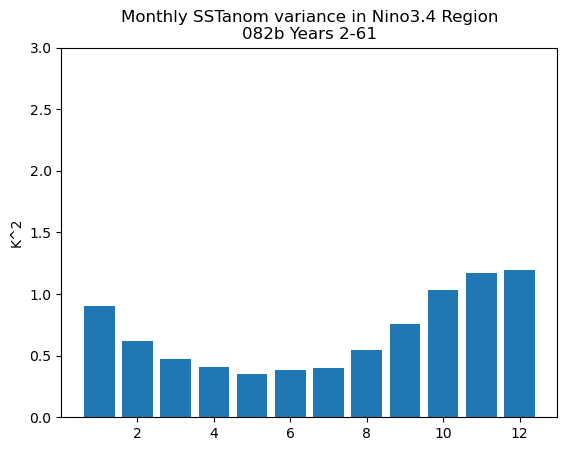

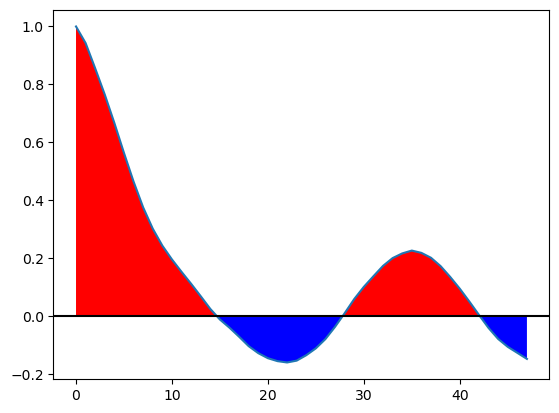

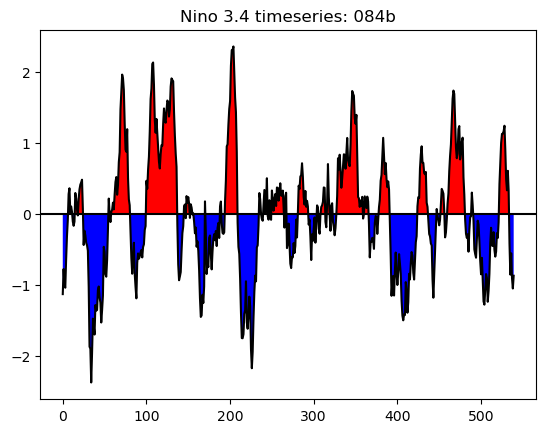

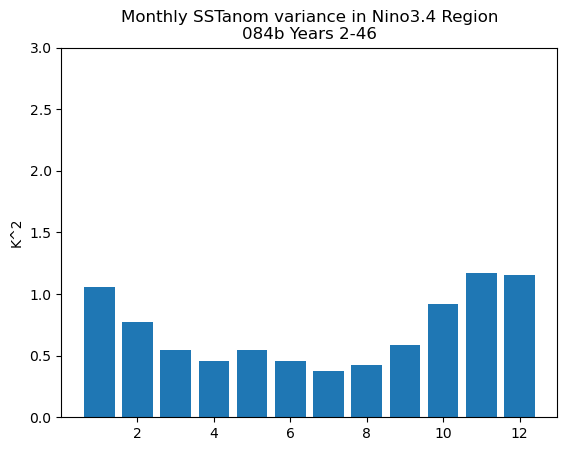

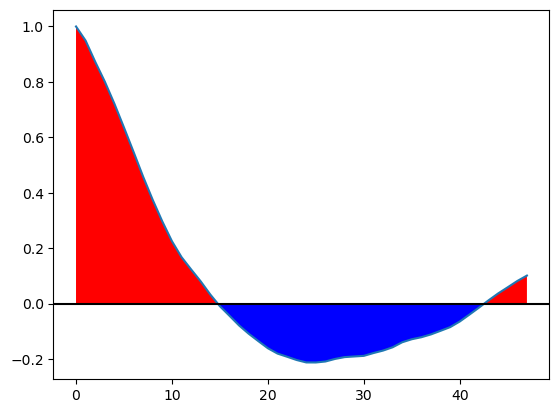

First day in file is  0001-01-16 12:00:00


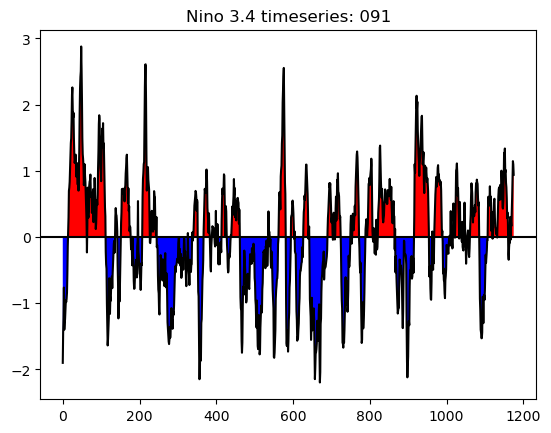

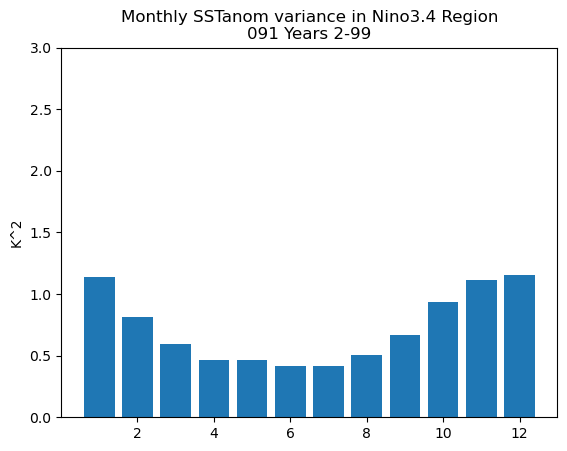

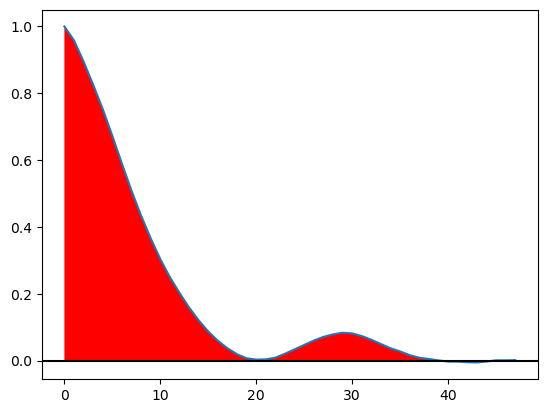

First day in file is  0001-01-16 12:00:00


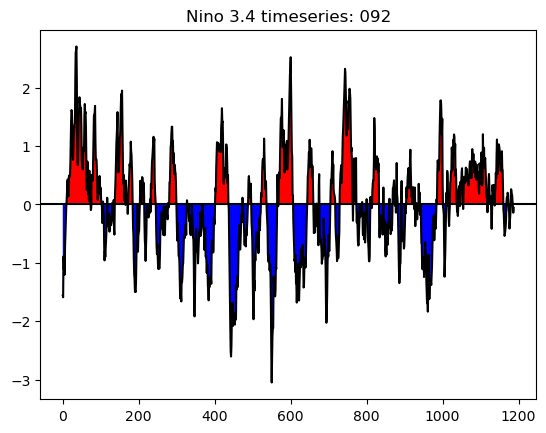

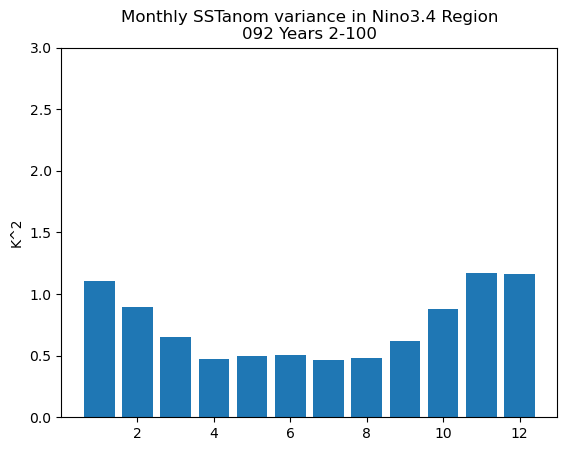

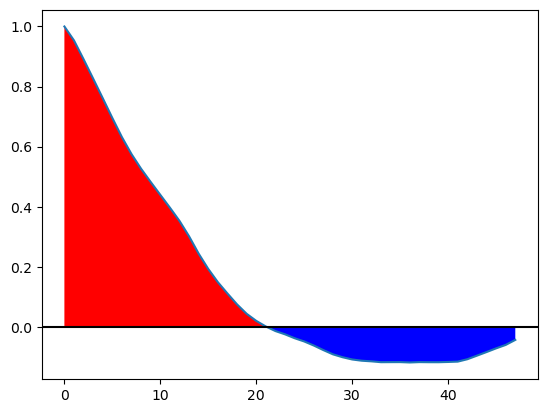

First day in file is  0001-01-16 12:00:00


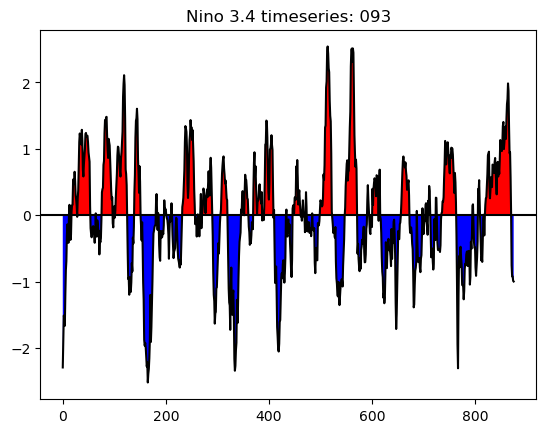

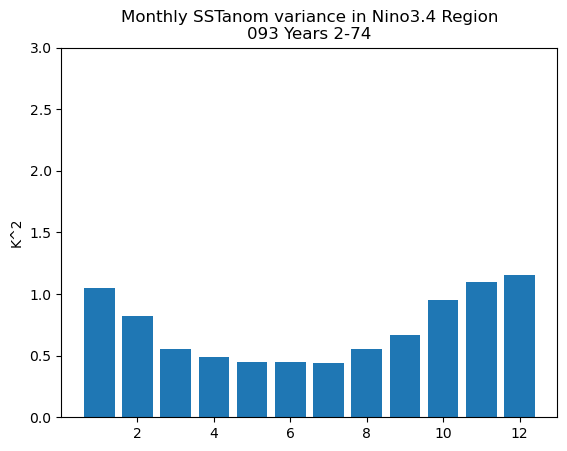

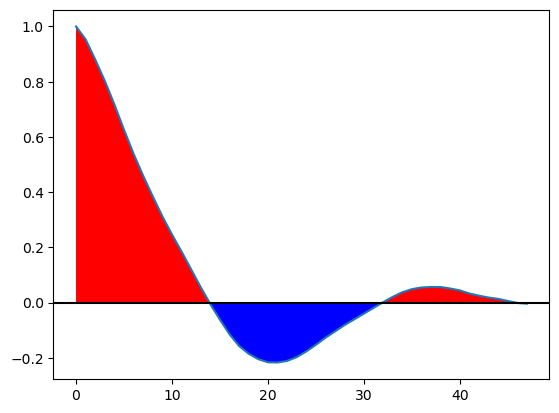

First day in file is  0001-01-16 12:00:00


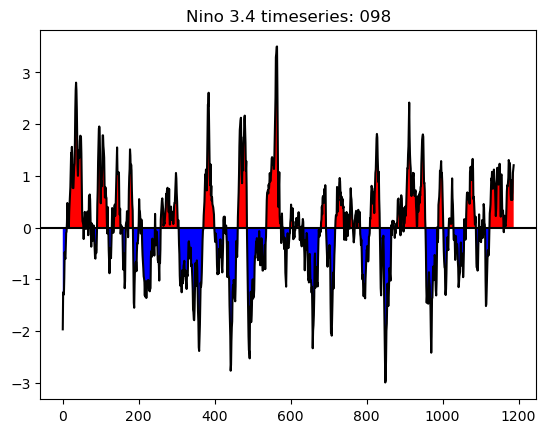

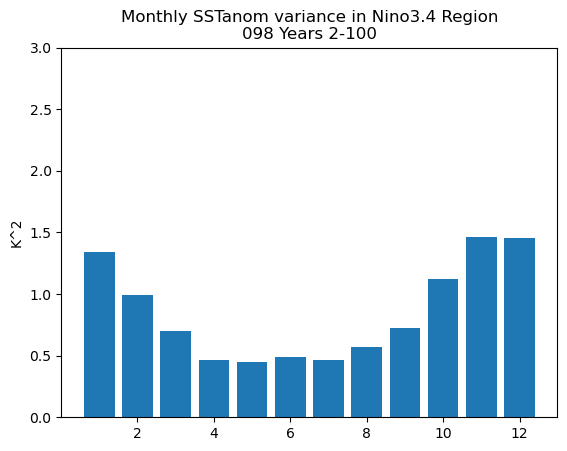

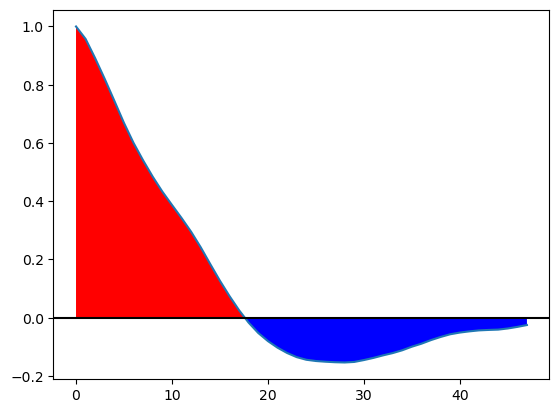

First day in file is  0101-01-16 12:00:00


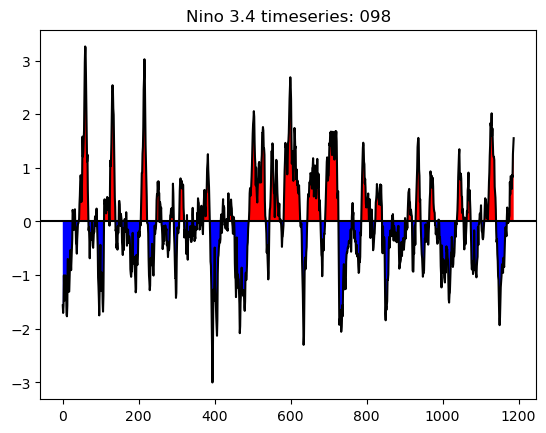

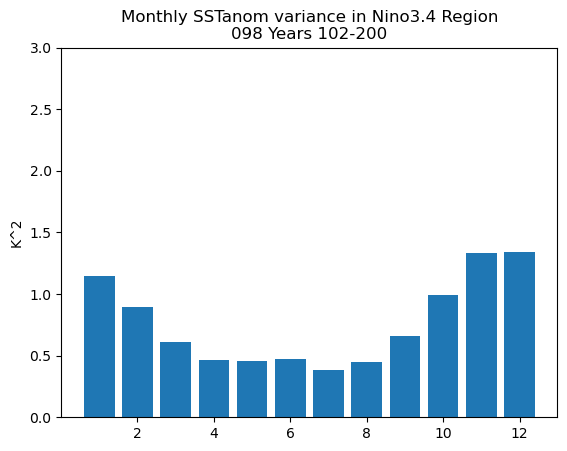

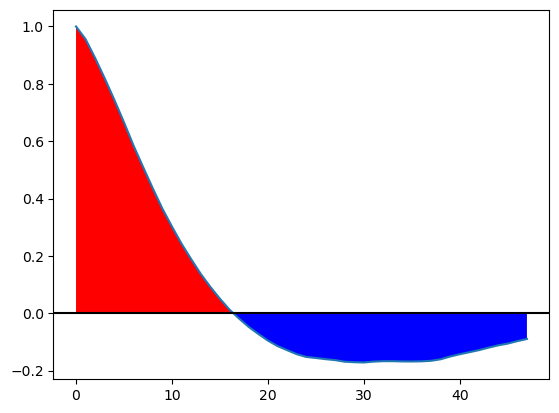

First day in file is  0001-01-16 12:00:00


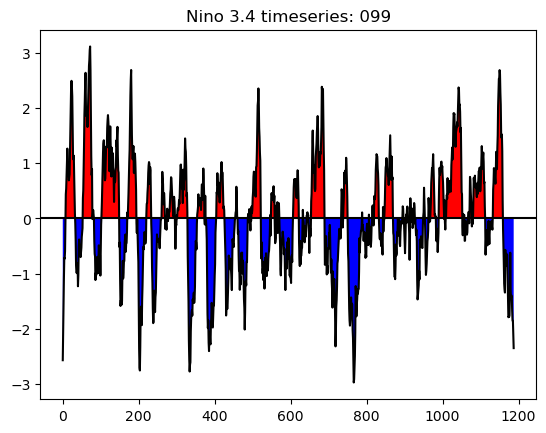

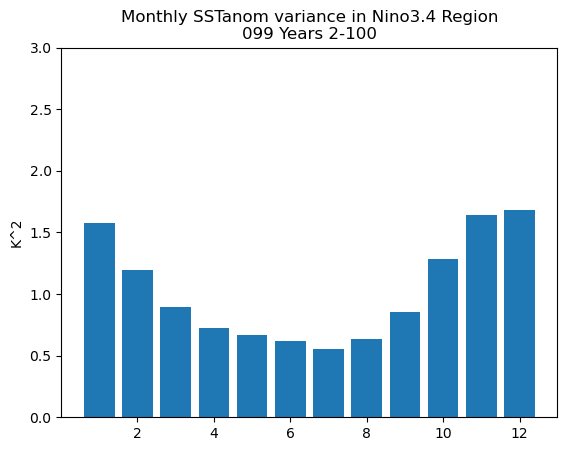

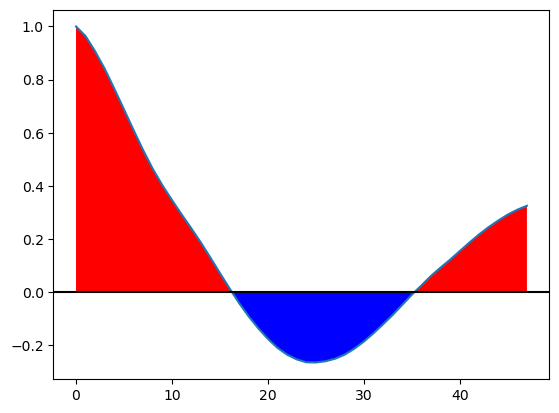

First day in file is  0001-01-16 12:00:00


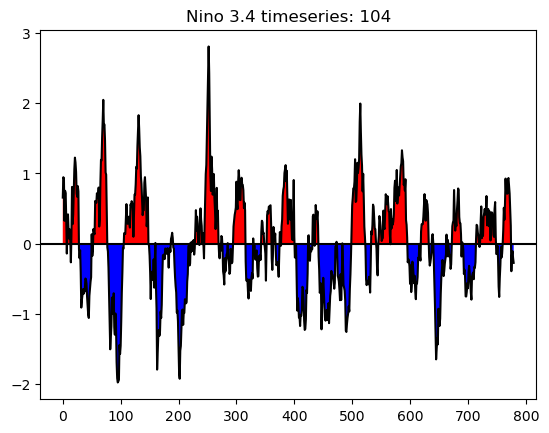

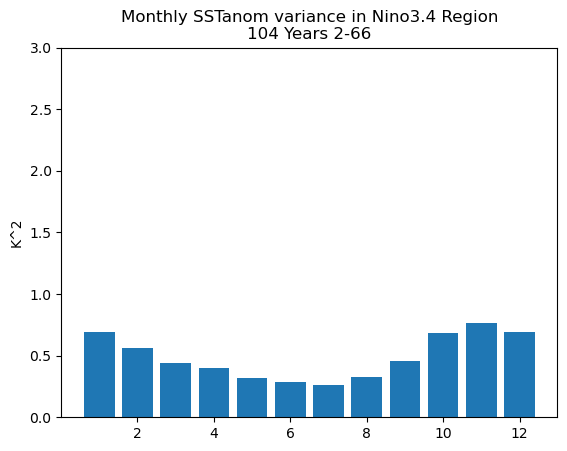

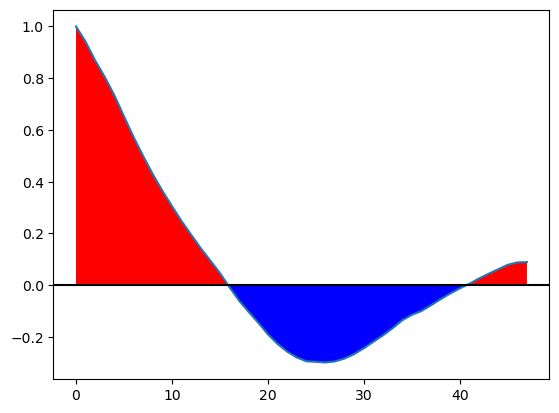

First day in file is  0001-01-16 12:00:00


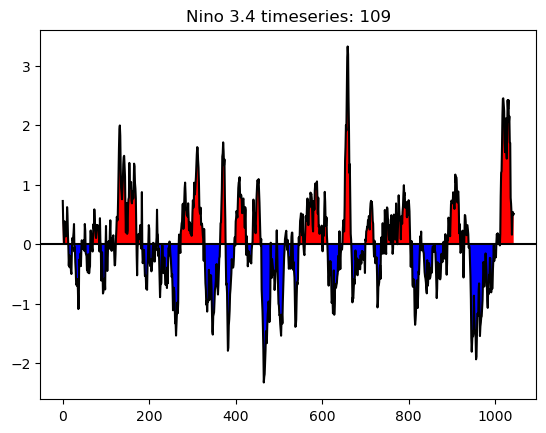

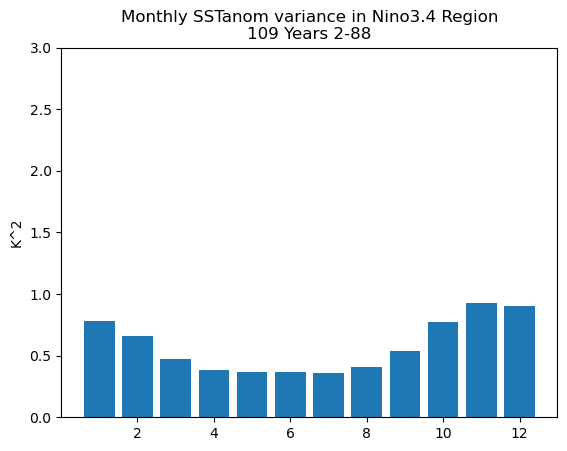

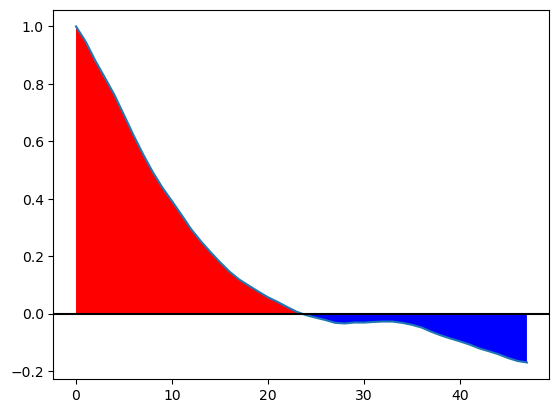

First day in file is  0001-01-16 12:00:00


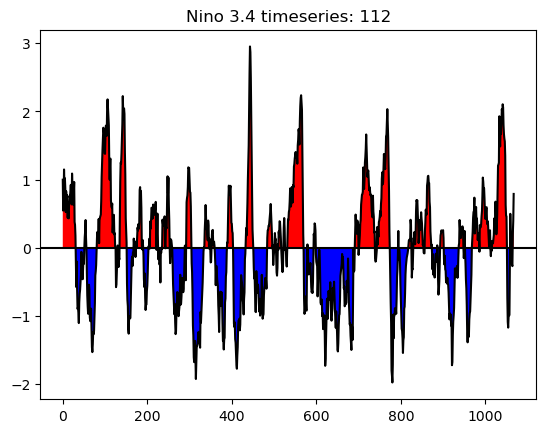

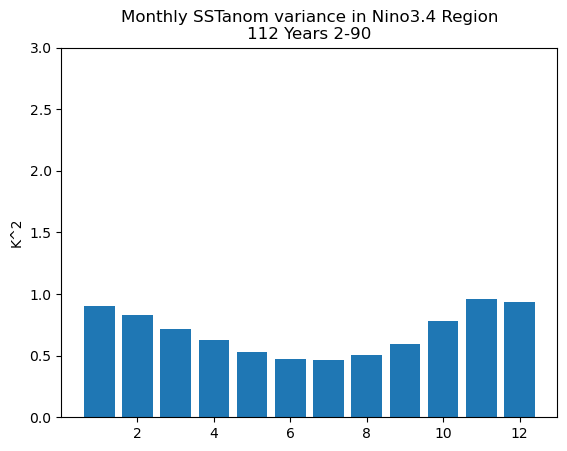

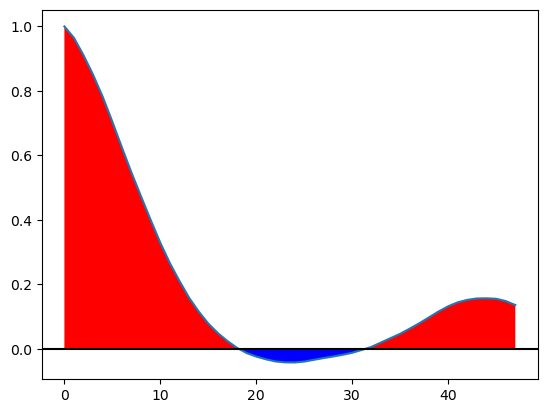

First day in file is  0001-01-16 12:00:00


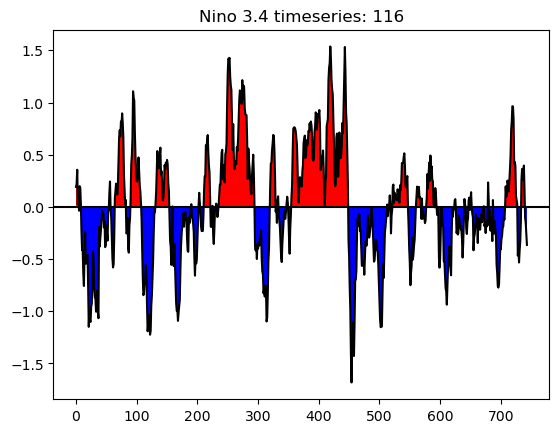

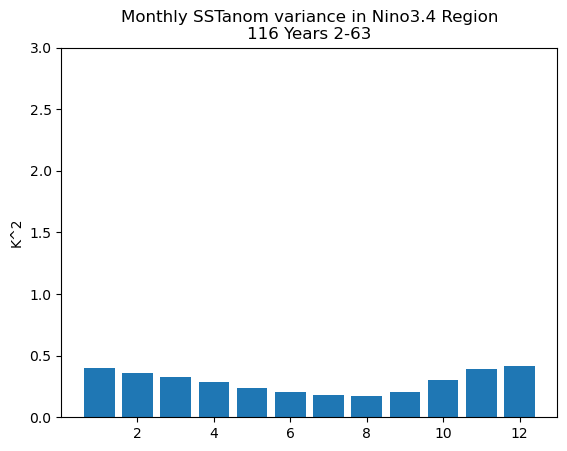

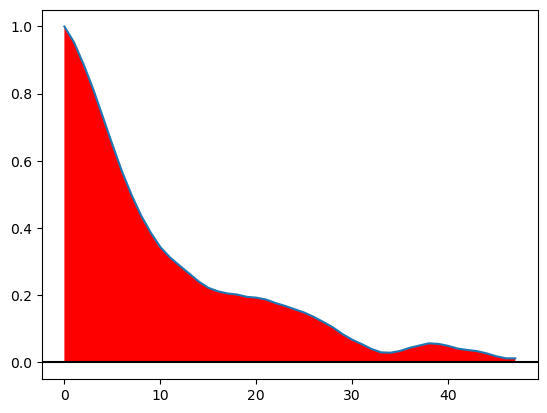

First day in file is  0001-01-16 12:00:00


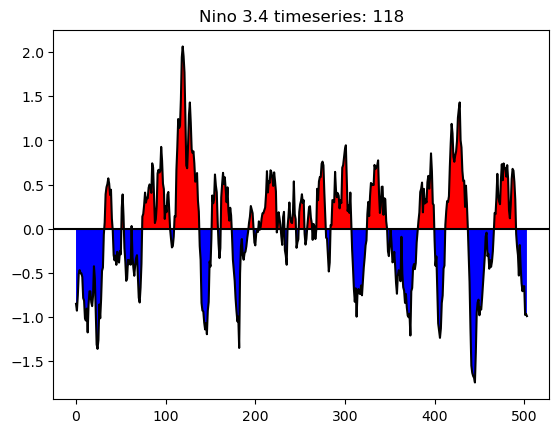

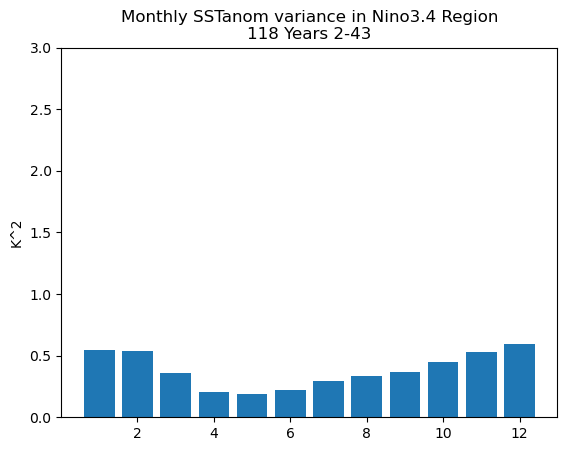

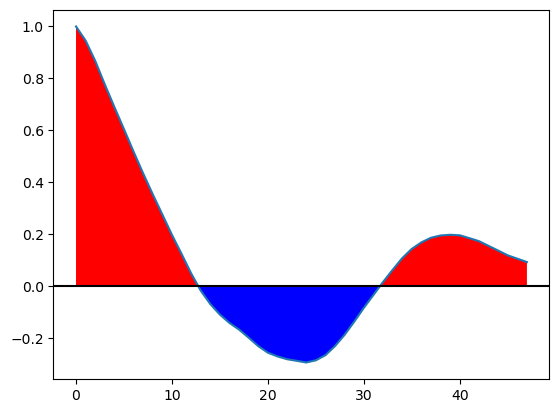

First day in file is  0060-01-16 12:00:00


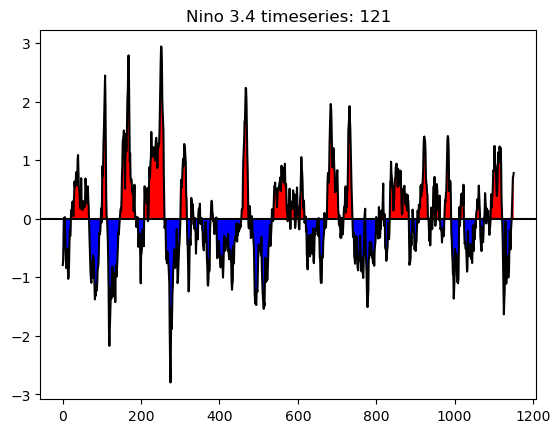

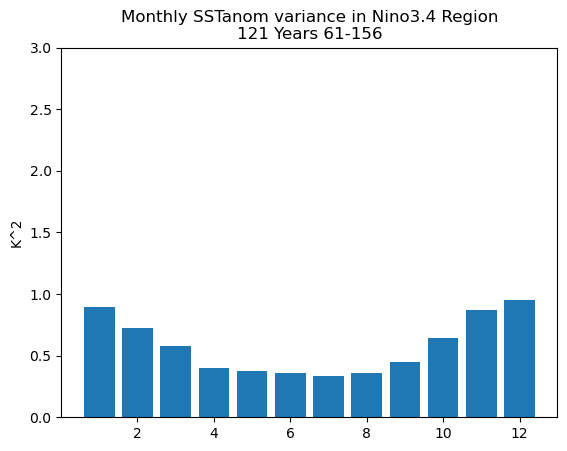

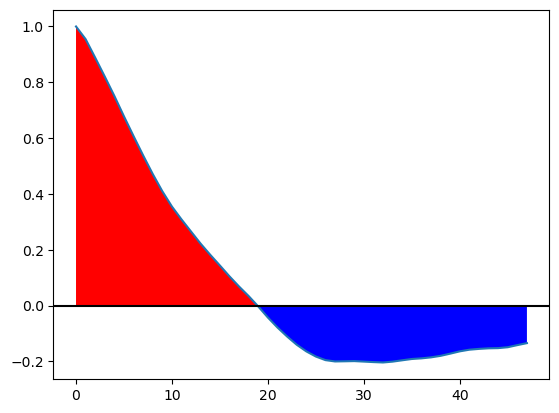

In [20]:

## Observations
nino34_var_obs = nino34_obs.groupby('time.month').var()
nino3_var_obs  = nino3_obs.groupby('time.month').var()
nino4_var_obs  = nino4_obs.groupby('time.month').var()

## Reproduce the autocorrelation plot from Rich 
nino34_obs_pd = pd.Series(nino34_obs.values)
nino3_obs_pd  = pd.Series(nino3_obs.values)
nino4_obs_pd  = pd.Series(nino4_obs.values)

nino34_ac_obs     = np.full([48], np.nan)
nino3_ac_obs      = np.full([48], np.nan)
nino4_ac_obs      = np.full([48], np.nan)
transit_month_obs  = np.nan
transit_month_obs3 = np.nan
transit_month_obs4 = np.nan
for iLag in range(48):
    nino34_ac_obs[iLag] = nino34_obs_pd.autocorr(lag=iLag)
    if ((nino34_ac_obs[iLag-1]>0) & (nino34_ac_obs[iLag]<0) & (np.isfinite(transit_month_obs)==False)):
        transit_month_obs = iLag-1

    nino3_ac_obs[iLag] = nino3_obs_pd.autocorr(lag=iLag)
    if ((nino3_ac_obs[iLag-1]>0) & (nino3_ac_obs[iLag]<0) & (np.isfinite(transit_month_obs3)==False)):
        transit_month_obs3 = iLag-1
        
    nino4_ac_obs[iLag] = nino4_obs_pd.autocorr(lag=iLag)
    if ((nino4_ac_obs[iLag-1]>0) & (nino4_ac_obs[iLag]<0) & (np.isfinite(transit_month_obs4)==False)):
        transit_month_obs4 = iLag-1

plt.bar(np.arange(12)+1, nino34_var_obs)
plt.title('Monthly SSTanom variance in Nino3.4 Region\nHadiSST' )
plt.ylim([0.0, 3.0])
plt.ylabel('K^2')
plt.show()

plt.plot(np.arange(48), nino34_ac_obs)
plt.fill_between(np.arange(48), 0, nino34_ac_obs, 
             where=nino34_ac_obs >= 0, facecolor='red', interpolate=True)
plt.fill_between(np.arange(48), nino34_ac_obs, 0, 
             where=nino34_ac_obs <= 0, facecolor='blue', interpolate=True)

# plt.plot(transit_month[iSim], nino34_ac[iSim, int(transit_month[iSim])], 'r*')
plt.axhline(0,color='k')
plt.show()



## Handle model data ------
nino34_var    = np.full([len(listFiles_TS), 12], np.nan)
nino34_ac     = np.full([len(listFiles_TS), 48], np.nan)
transit_month = np.full([len(listFiles_TS)], np.nan)

nino3_var     = np.full([len(listFiles_TS), 12], np.nan)
nino3_ac      = np.full([len(listFiles_TS), 48], np.nan)
transit_month3 = np.full([len(listFiles_TS)], np.nan)

nino4_var     = np.full([len(listFiles_TS), 12], np.nan)
nino4_ac      = np.full([len(listFiles_TS), 48], np.nan)
transit_month4 = np.full([len(listFiles_TS)], np.nan)

for iSim in range(len(listFiles_TS)):
# for iSim in range(3):
    DS = xr.open_dataset(listFiles_TS[iSim]) 
    if DS['time.day'].isel(time=0).values==1:
        DS = cesm_correct_time(DS)
    else: 
        print('First day in file is ', DS.time.values[0])

    # Remove first year of each simulation
    timeOffset = DS.time.values[0]  + timedelta(days=365)
    iKeep      = np.where(DS.time.values>=timeOffset)[0]
    DS         = DS.isel(time=iKeep)

    startYear = DS.isel(time=0)['time.year'].values
    endYear   = DS.isel(time=-1)['time.year'].values
    
    ## Add case ID (short name) to the DS
    #x = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
    ## Add case ID (short name) to the DS
    caseName = listFiles_TS[iSim].split(".")[4] 
    #print(caseName)
    #if x:
    #    caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]
    #else: 
    #    x = re.search("BLTHIST.ne30_t232.", listFiles_TS[iSim])
    #    caseName = 'HIST_'+listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]

    if caseName=='112':
        # iSelTimes = np.where((DS['time.year'].values>=6) & (DS['time.year'].values<=50) )[0]
        # iSelTimes = np.where((DS['time.year'].values>=6) )[0]
        iSelTimes = np.where((DS['time.year'].values>=2) )[0]
        DS = DS.isel(time=iSelTimes).copy()
        startYear = DS.isel(time=0)['time.year'].values
        endYear   = DS.isel(time=-1)['time.year'].values
        
    
    ocnMask = DS.LANDFRAC.values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    TS = DS.TS 
    ts = signal.detrend(TS, axis=0, type='linear')
    # Get SST 
    sst = ts * ocnMask
    
    sst = xr.DataArray(sst, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])
    
    # Remove annual cycle from monthly data 
    sst_anom = rmMonAnnCyc(sst)
    
    ## Compute nino 3.4 index
    ilats = np.where((sst_anom.lat.values>=lat_s34)  & (sst_anom.lat.values<=lat_n34))[0]
    ilons = np.where((sst_anom.lon.values>=lon_e34)  & (sst_anom.lon.values<=lon_w34))[0]
    
    # # Compute weights and get Nino3.4 
    regionTS = sst_anom.isel(lat=ilats, lon=ilons)
    coswgt   = np.cos(np.deg2rad(regionTS.lat))
    nino34     = regionTS.weighted(coswgt).mean(('lon','lat'))

    ## Compute other nino regions 
    ilats3 = np.where((sst_anom.lat.values>=lat_s3)  & (sst_anom.lat.values<=lat_n3))[0]
    ilons3 = np.where((sst_anom.lon.values>=lon_e3)  & (sst_anom.lon.values<=lon_w3))[0]
    # # Compute weights and get Nino3.4 
    regionTS_3 = sst_anom.isel(lat=ilats3, lon=ilons3)
    coswgt_3   = np.cos(np.deg2rad(regionTS_3.lat))
    nino3      = regionTS_3.weighted(coswgt_3).mean(('lon','lat'))

    ilats4 = np.where((sst_anom.lat.values>=lat_s4)  & (sst_anom.lat.values<=lat_n4))[0]
    ilons4 = np.where((sst_anom.lon.values>=lon_e4)  & (sst_anom.lon.values<=lon_w4))[0]
    # # Compute weights and get Nino3.4 
    regionTS_4 = sst_anom.isel(lat=ilats4, lon=ilons4)
    coswgt_4   = np.cos(np.deg2rad(regionTS_4.lat))
    nino4      = regionTS_4.weighted(coswgt_4).mean(('lon','lat'))

    ## Plot nino3.4 timeseries?
    plt.plot(np.arange(len(nino34.time.values)), nino34.values,'k')
    plt.axhline(0, color='k')
    
    plt.fill_between(np.arange(len(nino34.time.values)), 0, nino34.values, 
                     where=nino34.values >= 0, facecolor='red', interpolate=True)
    plt.fill_between(np.arange(len(nino34.time.values)), nino34.values, 0, 
                     where=nino34.values <= 0, facecolor='blue', interpolate=True)
    plt.title('Nino 3.4 timeseries: '+caseName)
    plt.show()


    
    ## Reproduce the variance plot from Rich
    #   NOTE: doesn't match exactly, likely because I use cos(lat) for weights instead of a gaussian like Rich 
    nino34_var_monthly = nino34.groupby('time.month').var()
    nino34_var[iSim,:] = nino34_var_monthly

    nino3_var[iSim,:] = nino3.groupby('time.month').var()
    nino4_var[iSim,:] = nino4.groupby('time.month').var()

    plt.bar(np.arange(12)+1, nino34_var_monthly)
    plt.title('Monthly SSTanom variance in Nino3.4 Region\n'+caseName+' Years '+str(startYear)+'-'+str(endYear) )
    plt.ylim([0.0, 3.0])
    plt.ylabel('K^2')
    plt.show()

    ## Reproduce the autocorrelation plot from Rich 
    nino34_pd = pd.Series(nino34.values)
    nino3_pd = pd.Series(nino3.values)
    nino4_pd = pd.Series(nino4.values)
    
    for iLag in range(48):
        nino34_ac[iSim, iLag] = nino34_pd.autocorr(lag=iLag)
        if ((nino34_ac[iSim, iLag-1]>0) & (nino34_ac[iSim, iLag]<0) & (np.isfinite(transit_month[iSim])==False)):
            transit_month[iSim] = iLag-1

        nino3_ac[iSim, iLag] = nino3_pd.autocorr(lag=iLag)
        if ((nino3_ac[iSim, iLag-1]>0) & (nino3_ac[iSim, iLag]<0) & (np.isfinite(transit_month3[iSim])==False)):
            transit_month3[iSim] = iLag-1

        nino4_ac[iSim, iLag] = nino4_pd.autocorr(lag=iLag)
        if ((nino4_ac[iSim, iLag-1]>0) & (nino4_ac[iSim, iLag]<0) & (np.isfinite(transit_month4[iSim])==False)):
            transit_month4[iSim] = iLag-1
            
            
    plt.plot(np.arange(48), nino34_ac[iSim,:])
    plt.fill_between(np.arange(48), 0, nino34_ac[iSim,:], 
                 where=nino34_ac[iSim,:] >= 0, facecolor='red', interpolate=True)
    plt.fill_between(np.arange(48), nino34_ac[iSim,:], 0, 
                 where=nino34_ac[iSim,:] <= 0, facecolor='blue', interpolate=True)

    # plt.plot(transit_month[iSim], nino34_ac[iSim, int(transit_month[iSim])], 'r*')
    plt.axhline(0,color='k')
    plt.show()


## Handle model data: CESM1 and CESM2 PI  ------
nino34_var_cesm1    = np.full([len(nino34_cesm1.event.values), 12], np.nan)
nino34_ac_cesm1     = np.full([len(nino34_cesm1.event.values), 48], np.nan)
transit_month_cesm1 = np.full([len(nino34_cesm1.event.values)], np.nan)

nino3_var_cesm1      = np.full([len(nino34_cesm1.event.values), 12], np.nan)
nino3_ac_cesm1       = np.full([len(nino34_cesm1.event.values), 48], np.nan)
transit_month3_cesm1 = np.full([len(nino34_cesm1.event.values)], np.nan)

nino4_var_cesm1      = np.full([len(nino34_cesm1.event.values), 12], np.nan)
nino4_ac_cesm1       = np.full([len(nino34_cesm1.event.values), 48], np.nan)
transit_month4_cesm1 = np.full([len(nino34_cesm1.event.values)], np.nan)

for iSim in range(len(nino34_cesm1.event.values)):

    nino34 = nino34_cesm1.isel(event=iSim)
    nino3  = nino3_cesm1.isel(event=iSim)
    nino4  = nino4_cesm1.isel(event=iSim)
    
    ## Reproduce the variance plot from Rich
    #   NOTE: doesn't match exactly, likely because I use cos(lat) for weights instead of a gaussian like Rich 
    nino34_var_monthly = nino34.groupby('time.month').var()
    nino34_var_cesm1[iSim,:] = nino34_var_monthly

    nino3_var_cesm1[iSim,:] = nino3.groupby('time.month').var()
    nino4_var_cesm1[iSim,:] = nino4.groupby('time.month').var()

    ## Reproduce the autocorrelation plot from Rich 
    nino34_pd = pd.Series(nino34.values)
    nino3_pd  = pd.Series(nino34.values)
    nino4_pd  = pd.Series(nino34.values)
    
    for iLag in range(48):
        nino34_ac_cesm1[iSim, iLag] = nino34_pd.autocorr(lag=iLag)
        if ((nino34_ac_cesm1[iSim, iLag-1]>0) & (nino34_ac_cesm1[iSim, iLag]<0) & (np.isfinite(transit_month_cesm1[iSim])==False)):
            transit_month_cesm1[iSim] = iLag-1

        nino3_ac_cesm1[iSim, iLag] = nino3_pd.autocorr(lag=iLag)
        if ((nino3_ac_cesm1[iSim, iLag-1]>0) & (nino3_ac_cesm1[iSim, iLag]<0) & (np.isfinite(transit_month3_cesm1[iSim])==False)):
            transit_month3_cesm1[iSim] = iLag-1

        nino4_ac_cesm1[iSim, iLag] = nino4_pd.autocorr(lag=iLag)
        if ((nino4_ac_cesm1[iSim, iLag-1]>0) & (nino4_ac_cesm1[iSim, iLag]<0) & (np.isfinite(transit_month4_cesm1[iSim])==False)):
            transit_month4_cesm1[iSim] = iLag-1



nino34_var_cesm2    = np.full([len(nino34_cesm2.event.values), 12], np.nan)
nino34_ac_cesm2     = np.full([len(nino34_cesm2.event.values), 48], np.nan)
transit_month_cesm2 = np.full([len(nino34_cesm2.event.values)], np.nan)

nino3_var_cesm2    = np.full([len(nino34_cesm2.event.values), 12], np.nan)
nino3_ac_cesm2     = np.full([len(nino34_cesm2.event.values), 48], np.nan)
transit_month3_cesm2 = np.full([len(nino34_cesm2.event.values)], np.nan)

nino4_var_cesm2    = np.full([len(nino34_cesm2.event.values), 12], np.nan)
nino4_ac_cesm2     = np.full([len(nino34_cesm2.event.values), 48], np.nan)
transit_month4_cesm2 = np.full([len(nino34_cesm2.event.values)], np.nan)

for iSim in range(len(nino34_cesm2.event.values)):

    nino34 = nino34_cesm2.isel(event=iSim)
    nino3  = nino3_cesm2.isel(event=iSim)
    nino4  = nino4_cesm2.isel(event=iSim)
    
    ## Reproduce the variance plot from Rich
    #   NOTE: doesn't match exactly, likely because I use cos(lat) for weights instead of a gaussian like Rich 
    nino34_var_monthly = nino34.groupby('time.month').var()
    nino34_var_cesm2[iSim,:] = nino34_var_monthly

    nino3_var_cesm2[iSim,:] = nino3.groupby('time.month').var()
    nino4_var_cesm2[iSim,:] = nino4.groupby('time.month').var()

    ## Reproduce the autocorrelation plot from Rich 
    nino34_pd = pd.Series(nino34.values)
    nino3_pd  = pd.Series(nino3.values)
    nino4_pd  = pd.Series(nino4.values)
    
    for iLag in range(48):
        nino34_ac_cesm2[iSim, iLag] = nino34_pd.autocorr(lag=iLag)
        if ((nino34_ac_cesm2[iSim, iLag-1]>0) & (nino34_ac_cesm2[iSim, iLag]<0) & (np.isfinite(transit_month_cesm2[iSim])==False)):
            transit_month_cesm2[iSim] = iLag-1

        nino3_ac_cesm2[iSim, iLag] = nino3_pd.autocorr(lag=iLag)
        if ((nino3_ac_cesm2[iSim, iLag-1]>0) & (nino3_ac_cesm2[iSim, iLag]<0) & (np.isfinite(transit_month3_cesm2[iSim])==False)):
            transit_month3_cesm2[iSim] = iLag-1

        nino4_ac_cesm2[iSim, iLag] = nino4_pd.autocorr(lag=iLag)
        if ((nino4_ac_cesm2[iSim, iLag-1]>0) & (nino4_ac_cesm2[iSim, iLag]<0) & (np.isfinite(transit_month4_cesm2[iSim])==False)):
            transit_month4_cesm2[iSim] = iLag-1


In [47]:
nino34_ac_obs

array([ 1.        ,  0.95380454,  0.87561016,  0.77811678,  0.66913071,
        0.54918791,  0.42688857,  0.30205075,  0.18861092,  0.0897945 ,
        0.01031306, -0.05156991, -0.10273828, -0.144793  , -0.17702066,
       -0.20371756, -0.22549501, -0.24443582, -0.25928285, -0.27576887,
       -0.28832679, -0.29999177, -0.30554026, -0.30576904, -0.30026978,
       -0.28674152, -0.26452332, -0.23592185, -0.20520924, -0.17304377,
       -0.14260075, -0.1138129 , -0.0812516 , -0.05389225, -0.02994321,
       -0.01546839, -0.00654995,  0.00132386,  0.00996494,  0.01347993,
        0.0174289 ,  0.02220477,  0.02643049,  0.0328802 ,  0.04677105,
        0.06445487,  0.08310025,  0.09975278])

In [50]:
transit_month_obs

10

In [ ]:
# axs[1].plot(lons_0p5Contour_cesm1, np.full([len(cor_case_cesm1.event.values)], 'CESM1'), 'o', color='mediumpurple', alpha=0.4)


In [21]:
np.shape(nino34_var)

(26, 12)

In [21]:
month_length = nino34_obs.isel(time=np.arange(12)).time.dt.days_in_month
weights = ( month_length / month_length.sum() )

weighted_mean_nino34_var = np.full([len(corrs.case.values)], np.nan)
weighted_mean_nino34_cesm1_var = np.full([len(cor_case_cesm2.event.values)], np.nan)
weighted_mean_nino34_cesm2_var = np.full([len(cor_case_cesm2.event.values)], np.nan)

weighted_mean_nino3_var = np.full([len(corrs.case.values)], np.nan)
weighted_mean_nino3_cesm1_var = np.full([len(cor_case_cesm2.event.values)], np.nan)
weighted_mean_nino3_cesm2_var = np.full([len(cor_case_cesm2.event.values)], np.nan)

weighted_mean_nino4_var = np.full([len(corrs.case.values)], np.nan)
weighted_mean_nino4_cesm1_var = np.full([len(cor_case_cesm2.event.values)], np.nan)
weighted_mean_nino4_cesm2_var = np.full([len(cor_case_cesm2.event.values)], np.nan)

for iCase in range(len(corrs.case.values)):
    weighted_mean_nino34_var[iCase] = (nino34_var[iCase,:] * weights).sum() / weights.sum()
    weighted_mean_nino3_var[iCase]  = (nino3_var[iCase,:] * weights).sum() / weights.sum()
    weighted_mean_nino4_var[iCase]  = (nino4_var[iCase,:] * weights).sum() / weights.sum()

for iCase in range(len(cor_case_cesm2.event.values)):
    weighted_mean_nino34_cesm1_var[iCase] = (nino34_var_cesm1[iCase,:] * weights).sum() / weights.sum()
    weighted_mean_nino34_cesm2_var[iCase] = (nino34_var_cesm2[iCase,:] * weights).sum() / weights.sum()

    weighted_mean_nino3_cesm1_var[iCase] = (nino3_var_cesm1[iCase,:] * weights).sum() / weights.sum()
    weighted_mean_nino3_cesm2_var[iCase] = (nino3_var_cesm2[iCase,:] * weights).sum() / weights.sum()

    weighted_mean_nino4_cesm1_var[iCase] = (nino4_var_cesm1[iCase,:] * weights).sum() / weights.sum()
    weighted_mean_nino4_cesm2_var[iCase] = (nino4_var_cesm2[iCase,:] * weights).sum() / weights.sum()
    
weighted_mean_nino34_var_obs = (nino34_var_obs.values * weights).sum() / weights.sum()
weighted_mean_nino3_var_obs = (nino3_var_obs.values * weights).sum() / weights.sum()
weighted_mean_nino4_var_obs = (nino4_var_obs.values * weights).sum() / weights.sum()


In [22]:
offset = np.linspace(-0.5,0.5,len(cor_case_cesm2.event.values))

In [23]:
offset

array([-0.5       , -0.46551724, -0.43103448, -0.39655172, -0.36206897,
       -0.32758621, -0.29310345, -0.25862069, -0.22413793, -0.18965517,
       -0.15517241, -0.12068966, -0.0862069 , -0.05172414, -0.01724138,
        0.01724138,  0.05172414,  0.0862069 ,  0.12068966,  0.15517241,
        0.18965517,  0.22413793,  0.25862069,  0.29310345,  0.32758621,
        0.36206897,  0.39655172,  0.43103448,  0.46551724,  0.5       ])

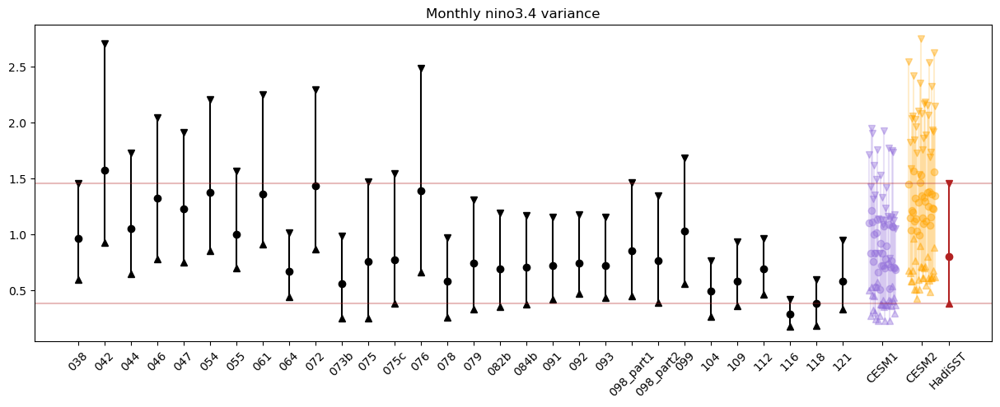

In [24]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

for iCase in range(len(corrs.case.values)):
    axs.plot(iCase+np.ones(2), [np.nanmin(nino34_var[iCase,:]), np.nanmax(nino34_var[iCase,:])], 'k-')
    axs.plot(iCase+1, weighted_mean_nino34_var[iCase],'o', color='k')
    axs.plot(iCase+1, np.nanmin(nino34_var[iCase,:]),'^',color='k')
    axs.plot(iCase+1, np.nanmax(nino34_var[iCase,:]),'v',color='k')


cesm1_xCenter = len(corrs.case.values)+1.5
cesm2_xCenter = len(corrs.case.values)+3
obs_xCenter   = len(corrs.case.values)+4


abs_min_cesm1 = np.nanmin(nino34_var_cesm1)
abs_maxcesm1 = np.nanmax(nino34_var_cesm1)
offset = np.linspace(cesm1_xCenter-0.5,cesm1_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    # if np.nanmin(nino34_var_cesm1[iEvent,:])==abs_min_cesm1:
    #     axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm1[iEvent,:]), np.nanmax(nino34_var_cesm1[iEvent,:])],
    #              '-', color='purple', alpha=1, linewidth=3)
    #     axs.plot(offset[iEvent], weighted_mean_nino34_cesm1_var[iEvent],'o', color='purple',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm1[iEvent,:]),'^',color='purple',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm1[iEvent,:]),'v',color='purple',alpha=1)
    # elif np.nanmax(nino34_var_cesm1[iEvent,:])==abs_maxcesm1:
    #     axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm1[iEvent,:]), np.nanmax(nino34_var_cesm1[iEvent,:])],
    #              '-', color='purple', alpha=1, linewidth=3)
    #     axs.plot(offset[iEvent], weighted_mean_nino34_cesm1_var[iEvent],'o', color='purple',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm1[iEvent,:]),'^',color='purple',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm1[iEvent,:]),'v',color='purple',alpha=1)        
    # else:    
    axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm1[iEvent,:]), np.nanmax(nino34_var_cesm1[iEvent,:])],
             '-', color='mediumpurple', alpha=0.2)
    axs.plot(offset[iEvent], weighted_mean_nino34_cesm1_var[iEvent],'o', color='mediumpurple',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm1[iEvent,:]),'^',color='mediumpurple',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm1[iEvent,:]),'v',color='mediumpurple',alpha=0.4)


abs_min_cesm2 = np.nanmin(nino34_var_cesm2)
abs_max_cesm2  = np.nanmax(nino34_var_cesm2)

offset = np.linspace(cesm2_xCenter-0.5,cesm2_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    # if np.nanmin(nino34_var_cesm2[iEvent,:])==abs_min_cesm2:
    #     axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm2[iEvent,:]), np.nanmax(nino34_var_cesm2[iEvent,:])],
    #              '-', color='orangered', alpha=1, linewidth=3)
    #     axs.plot(offset[iEvent], weighted_mean_nino34_cesm2_var[iEvent],'o', color='orangered',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm2[iEvent,:]),'^',color='orangered',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm2[iEvent,:]),'v',color='orangered',alpha=1)
    # elif np.nanmax(nino34_var_cesm2[iEvent,:])==abs_max_cesm2:
    #     axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm2[iEvent,:]), np.nanmax(nino34_var_cesm2[iEvent,:])],
    #              '-', color='orangered', alpha=1, linewidth=3)
    #     axs.plot(offset[iEvent], weighted_mean_nino34_cesm2_var[iEvent],'o', color='orangered',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm2[iEvent,:]),'^',color='orangered',alpha=1)
    #     axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm2[iEvent,:]),'v',color='orangered',alpha=1)        
    # else: 
    axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm2[iEvent,:]), np.nanmax(nino34_var_cesm2[iEvent,:])],
             '-', color='orange', alpha=0.2)
    axs.plot(offset[iEvent], weighted_mean_nino34_cesm2_var[iEvent],'o', color='orange',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm2[iEvent,:]),'^',color='orange',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm2[iEvent,:]),'v',color='orange',alpha=0.4)

axs.plot(obs_xCenter*np.ones(2), [np.nanmin(nino34_var_obs), np.nanmax(nino34_var_obs)], '-', color='firebrick')
axs.plot(obs_xCenter, weighted_mean_nino34_var_obs,'o', color='firebrick')
axs.plot(obs_xCenter, np.nanmin(nino34_var_obs),'^',color='firebrick')
axs.plot(obs_xCenter, np.nanmax(nino34_var_obs),'v',color='firebrick')


ticks = np.append(1+np.arange(len(corrs.case.values)), cesm1_xCenter)
ticks = np.append(ticks, cesm2_xCenter)
ticks = np.append(ticks, obs_xCenter)

tickLabels = np.append(corrs.case.values, 'CESM1')
tickLabels = np.append(tickLabels, 'CESM2')
tickLabels = np.append(tickLabels, 'HadiSST')

axs.set_xticks(ticks)
axs.set_xticklabels(tickLabels)
plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )

axs.axhline(np.nanmin(nino34_var_obs), color='firebrick',alpha=0.3)
axs.axhline(np.nanmax(nino34_var_obs), color='firebrick',alpha=0.3)

axs.set_title('Monthly nino3.4 variance')


plt.show()

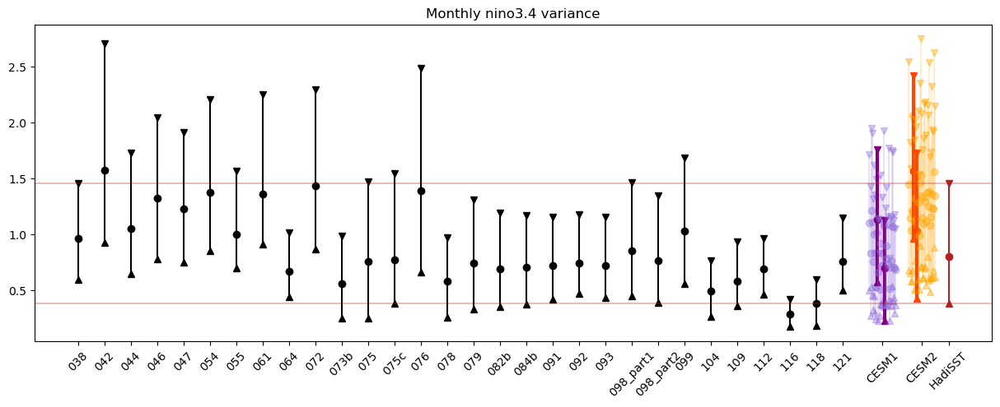

In [19]:
## Try picking out different lines to highlight 
fig,axs=plt.subplots(1,1,figsize=(15,5))

for iCase in range(len(corrs.case.values)):
    axs.plot(iCase+np.ones(2), [np.nanmin(nino34_var[iCase,:]), np.nanmax(nino34_var[iCase,:])], 'k-')
    axs.plot(iCase+1, weighted_mean_nino34_var[iCase],'o', color='k')
    axs.plot(iCase+1, np.nanmin(nino34_var[iCase,:]),'^',color='k')
    axs.plot(iCase+1, np.nanmax(nino34_var[iCase,:]),'v',color='k')


cesm1_xCenter = len(corrs.case.values)+1.5
cesm2_xCenter = len(corrs.case.values)+3
obs_xCenter   = len(corrs.case.values)+4


abs_min_cesm1 = np.nanmin(nino34_var_cesm1)
abs_max_cesm1 = np.nanmax(np.nanmin(nino34_var_cesm1,axis=1))
offset = np.linspace(cesm1_xCenter-0.5,cesm1_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    if np.nanmin(nino34_var_cesm1[iEvent,:])==abs_min_cesm1:
        axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm1[iEvent,:]), np.nanmax(nino34_var_cesm1[iEvent,:])],
                 '-', color='purple', alpha=1, linewidth=3)
        axs.plot(offset[iEvent], weighted_mean_nino34_cesm1_var[iEvent],'o', color='purple',alpha=1)
        axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm1[iEvent,:]),'^',color='purple',alpha=1)
        axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm1[iEvent,:]),'v',color='purple',alpha=1)
    elif np.nanmin(nino34_var_cesm1[iEvent,:])==abs_max_cesm1:
        axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm1[iEvent,:]), np.nanmax(nino34_var_cesm1[iEvent,:])],
                 '-', color='purple', alpha=1, linewidth=3)
        axs.plot(offset[iEvent], weighted_mean_nino34_cesm1_var[iEvent],'o', color='purple',alpha=1)
        axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm1[iEvent,:]),'^',color='purple',alpha=1)
        axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm1[iEvent,:]),'v',color='purple',alpha=1)        
    else:    
        axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm1[iEvent,:]), np.nanmax(nino34_var_cesm1[iEvent,:])],
                 '-', color='mediumpurple', alpha=0.2)
        axs.plot(offset[iEvent], weighted_mean_nino34_cesm1_var[iEvent],'o', color='mediumpurple',alpha=0.4)
        axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm1[iEvent,:]),'^',color='mediumpurple',alpha=0.4)
        axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm1[iEvent,:]),'v',color='mediumpurple',alpha=0.4)
    

abs_min_cesm2 = np.nanmin(nino34_var_cesm2)
abs_max_cesm2 = np.nanmax(np.nanmin(nino34_var_cesm2,axis=1))

offset = np.linspace(cesm2_xCenter-0.5,cesm2_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    if np.nanmin(nino34_var_cesm2[iEvent,:])==abs_min_cesm2:
        axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm2[iEvent,:]), np.nanmax(nino34_var_cesm2[iEvent,:])],
                 '-', color='orangered', alpha=1, linewidth=3)
        axs.plot(offset[iEvent], weighted_mean_nino34_cesm2_var[iEvent],'o', color='orangered',alpha=1)
        axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm2[iEvent,:]),'^',color='orangered',alpha=1)
        axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm2[iEvent,:]),'v',color='orangered',alpha=1)
    elif np.nanmin(nino34_var_cesm2[iEvent,:])==abs_max_cesm2:
        axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm2[iEvent,:]), np.nanmax(nino34_var_cesm2[iEvent,:])],
                 '-', color='orangered', alpha=1, linewidth=3)
        axs.plot(offset[iEvent], weighted_mean_nino34_cesm2_var[iEvent],'o', color='orangered',alpha=1)
        axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm2[iEvent,:]),'^',color='orangered',alpha=1)
        axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm2[iEvent,:]),'v',color='orangered',alpha=1)        
    else: 
        axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino34_var_cesm2[iEvent,:]), np.nanmax(nino34_var_cesm2[iEvent,:])],
                 '-', color='orange', alpha=0.2)
        axs.plot(offset[iEvent], weighted_mean_nino34_cesm2_var[iEvent],'o', color='orange',alpha=0.4)
        axs.plot(offset[iEvent], np.nanmin(nino34_var_cesm2[iEvent,:]),'^',color='orange',alpha=0.4)
        axs.plot(offset[iEvent], np.nanmax(nino34_var_cesm2[iEvent,:]),'v',color='orange',alpha=0.4)

axs.plot(obs_xCenter*np.ones(2), [np.nanmin(nino34_var_obs), np.nanmax(nino34_var_obs)], '-', color='firebrick')
axs.plot(obs_xCenter, weighted_mean_nino34_var_obs,'o', color='firebrick')
axs.plot(obs_xCenter, np.nanmin(nino34_var_obs),'^',color='firebrick')
axs.plot(obs_xCenter, np.nanmax(nino34_var_obs),'v',color='firebrick')


ticks = np.append(1+np.arange(len(corrs.case.values)), cesm1_xCenter)
ticks = np.append(ticks, cesm2_xCenter)
ticks = np.append(ticks, obs_xCenter)

tickLabels = np.append(corrs.case.values, 'CESM1')
tickLabels = np.append(tickLabels, 'CESM2')
tickLabels = np.append(tickLabels, 'HadiSST')

axs.set_xticks(ticks)
axs.set_xticklabels(tickLabels)
plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )

axs.axhline(np.nanmin(nino34_var_obs), color='firebrick',alpha=0.3)
axs.axhline(np.nanmax(nino34_var_obs), color='firebrick',alpha=0.3)

axs.set_title('Monthly nino3.4 variance')


plt.show()


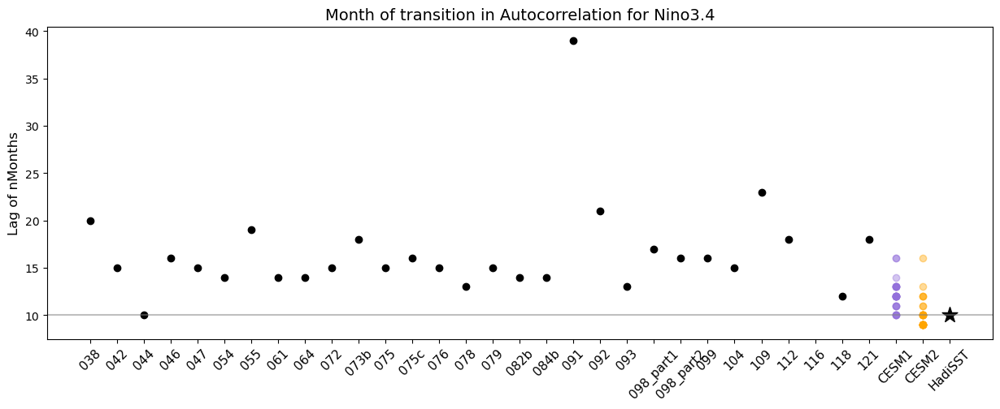

In [25]:
## Try picking out different lines to highlight 
fig,axs=plt.subplots(1,1,figsize=(15,5))

axs.scatter(corrs.case.values, transit_month, color='k')
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), transit_month_cesm1, 'o', color='mediumpurple', alpha=0.4)
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), transit_month_cesm2, 'o', color='orange', alpha=0.4)
axs.scatter('HadiSST', transit_month_obs, color='k', marker='*', s=200)
axs.axhline(transit_month_obs, color='grey',alpha=0.5)
axs.set_title('Month of transition in Autocorrelation for Nino3.4', fontsize=14)
axs.set_ylabel('Lag of nMonths',fontsize=12)

# ticks = np.append(1+np.arange(len(corrs.case.values)), cesm1_xCenter)
# ticks = np.append(ticks, cesm2_xCenter)
# ticks = np.append(ticks, obs_xCenter)
ticks = np.arange(len(corrs.case.values)+3)

tickLabels = np.append(corrs.case.values, 'CESM1')
tickLabels = np.append(tickLabels, 'CESM2')
tickLabels = np.append(tickLabels, 'HadiSST')

axs.set_xticks(ticks)
axs.set_xticklabels(tickLabels, fontsize=11)
plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()



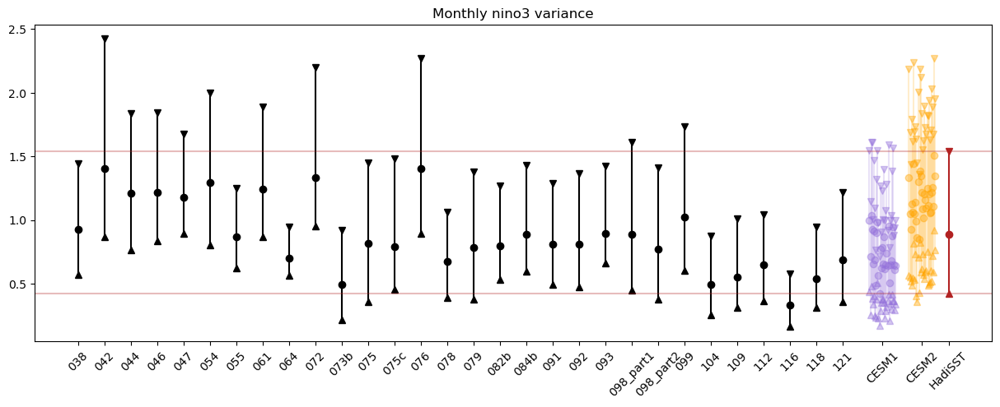

In [21]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

for iCase in range(len(corrs.case.values)):
    axs.plot(iCase+np.ones(2), [np.nanmin(nino3_var[iCase,:]), np.nanmax(nino3_var[iCase,:])], 'k-')
    axs.plot(iCase+1, weighted_mean_nino3_var[iCase],'o', color='k')
    axs.plot(iCase+1, np.nanmin(nino3_var[iCase,:]),'^',color='k')
    axs.plot(iCase+1, np.nanmax(nino3_var[iCase,:]),'v',color='k')


cesm1_xCenter = len(corrs.case.values)+1.5
cesm2_xCenter = len(corrs.case.values)+3
obs_xCenter   = len(corrs.case.values)+4


offset = np.linspace(cesm1_xCenter-0.5,cesm1_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino3_var_cesm1[iEvent,:]), np.nanmax(nino3_var_cesm1[iEvent,:])],
             '-', color='mediumpurple', alpha=0.2)
    axs.plot(offset[iEvent], weighted_mean_nino3_cesm1_var[iEvent],'o', color='mediumpurple',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmin(nino3_var_cesm1[iEvent,:]),'^',color='mediumpurple',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmax(nino3_var_cesm1[iEvent,:]),'v',color='mediumpurple',alpha=0.4)


offset = np.linspace(cesm2_xCenter-0.5,cesm2_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino3_var_cesm2[iEvent,:]), np.nanmax(nino3_var_cesm2[iEvent,:])],
             '-', color='orange', alpha=0.2)
    axs.plot(offset[iEvent], weighted_mean_nino3_cesm2_var[iEvent],'o', color='orange',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmin(nino3_var_cesm2[iEvent,:]),'^',color='orange',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmax(nino3_var_cesm2[iEvent,:]),'v',color='orange',alpha=0.4)

axs.plot(obs_xCenter*np.ones(2), [np.nanmin(nino3_var_obs), np.nanmax(nino3_var_obs)], '-', color='firebrick')
axs.plot(obs_xCenter, weighted_mean_nino3_var_obs,'o', color='firebrick')
axs.plot(obs_xCenter, np.nanmin(nino3_var_obs),'^',color='firebrick')
axs.plot(obs_xCenter, np.nanmax(nino3_var_obs),'v',color='firebrick')


ticks = np.append(1+np.arange(len(corrs.case.values)), cesm1_xCenter)
ticks = np.append(ticks, cesm2_xCenter)
ticks = np.append(ticks, obs_xCenter)

tickLabels = np.append(corrs.case.values, 'CESM1')
tickLabels = np.append(tickLabels, 'CESM2')
tickLabels = np.append(tickLabels, 'HadiSST')

axs.set_xticks(ticks)
axs.set_xticklabels(tickLabels)
plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )

axs.axhline(np.nanmin(nino3_var_obs), color='firebrick',alpha=0.3)
axs.axhline(np.nanmax(nino3_var_obs), color='firebrick',alpha=0.3)

axs.set_title('Monthly nino3 variance')


plt.show()

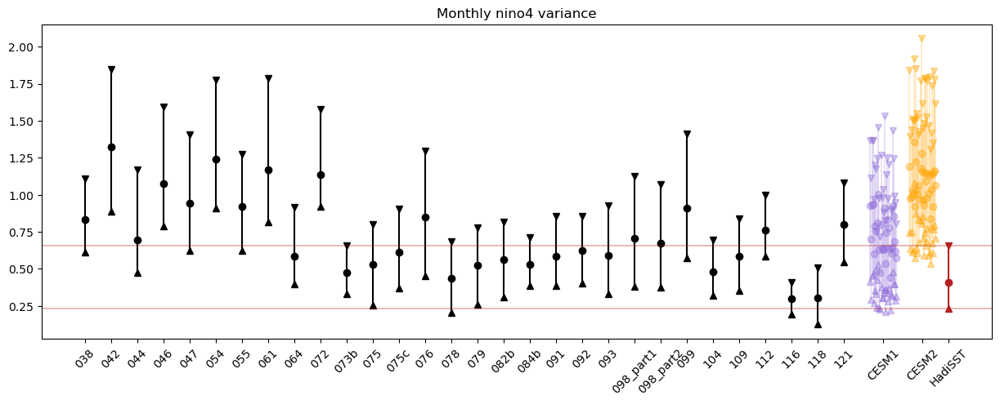

In [22]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

for iCase in range(len(corrs.case.values)):
    axs.plot(iCase+np.ones(2), [np.nanmin(nino4_var[iCase,:]), np.nanmax(nino4_var[iCase,:])], 'k-')
    axs.plot(iCase+1, weighted_mean_nino4_var[iCase],'o', color='k')
    axs.plot(iCase+1, np.nanmin(nino4_var[iCase,:]),'^',color='k')
    axs.plot(iCase+1, np.nanmax(nino4_var[iCase,:]),'v',color='k')


cesm1_xCenter = len(corrs.case.values)+1.5
cesm2_xCenter = len(corrs.case.values)+3
obs_xCenter   = len(corrs.case.values)+4


offset = np.linspace(cesm1_xCenter-0.5,cesm1_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino4_var_cesm1[iEvent,:]), np.nanmax(nino4_var_cesm1[iEvent,:])],
             '-', color='mediumpurple', alpha=0.2)
    axs.plot(offset[iEvent], weighted_mean_nino4_cesm1_var[iEvent],'o', color='mediumpurple',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmin(nino4_var_cesm1[iEvent,:]),'^',color='mediumpurple',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmax(nino4_var_cesm1[iEvent,:]),'v',color='mediumpurple',alpha=0.4)


offset = np.linspace(cesm2_xCenter-0.5,cesm2_xCenter+0.5,len(cor_case_cesm2.event.values))
for iEvent in range(len(cor_case_cesm2.event.values)):
    axs.plot(offset[iEvent]*np.ones(2), [np.nanmin(nino4_var_cesm2[iEvent,:]), np.nanmax(nino4_var_cesm2[iEvent,:])],
             '-', color='orange', alpha=0.2)
    axs.plot(offset[iEvent], weighted_mean_nino4_cesm2_var[iEvent],'o', color='orange',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmin(nino4_var_cesm2[iEvent,:]),'^',color='orange',alpha=0.4)
    axs.plot(offset[iEvent], np.nanmax(nino4_var_cesm2[iEvent,:]),'v',color='orange',alpha=0.4)

axs.plot(obs_xCenter*np.ones(2), [np.nanmin(nino4_var_obs), np.nanmax(nino4_var_obs)], '-', color='firebrick')
axs.plot(obs_xCenter, weighted_mean_nino4_var_obs,'o', color='firebrick')
axs.plot(obs_xCenter, np.nanmin(nino4_var_obs),'^',color='firebrick')
axs.plot(obs_xCenter, np.nanmax(nino4_var_obs),'v',color='firebrick')


ticks = np.append(1+np.arange(len(corrs.case.values)), cesm1_xCenter)
ticks = np.append(ticks, cesm2_xCenter)
ticks = np.append(ticks, obs_xCenter)

tickLabels = np.append(corrs.case.values, 'CESM1')
tickLabels = np.append(tickLabels, 'CESM2')
tickLabels = np.append(tickLabels, 'HadiSST')

axs.set_xticks(ticks)
axs.set_xticklabels(tickLabels)
plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )

axs.axhline(np.nanmin(nino4_var_obs), color='firebrick',alpha=0.3)
axs.axhline(np.nanmax(nino4_var_obs), color='firebrick',alpha=0.3)

axs.set_title('Monthly nino4 variance')


plt.show()

Text(0.5, 0, 'Case')

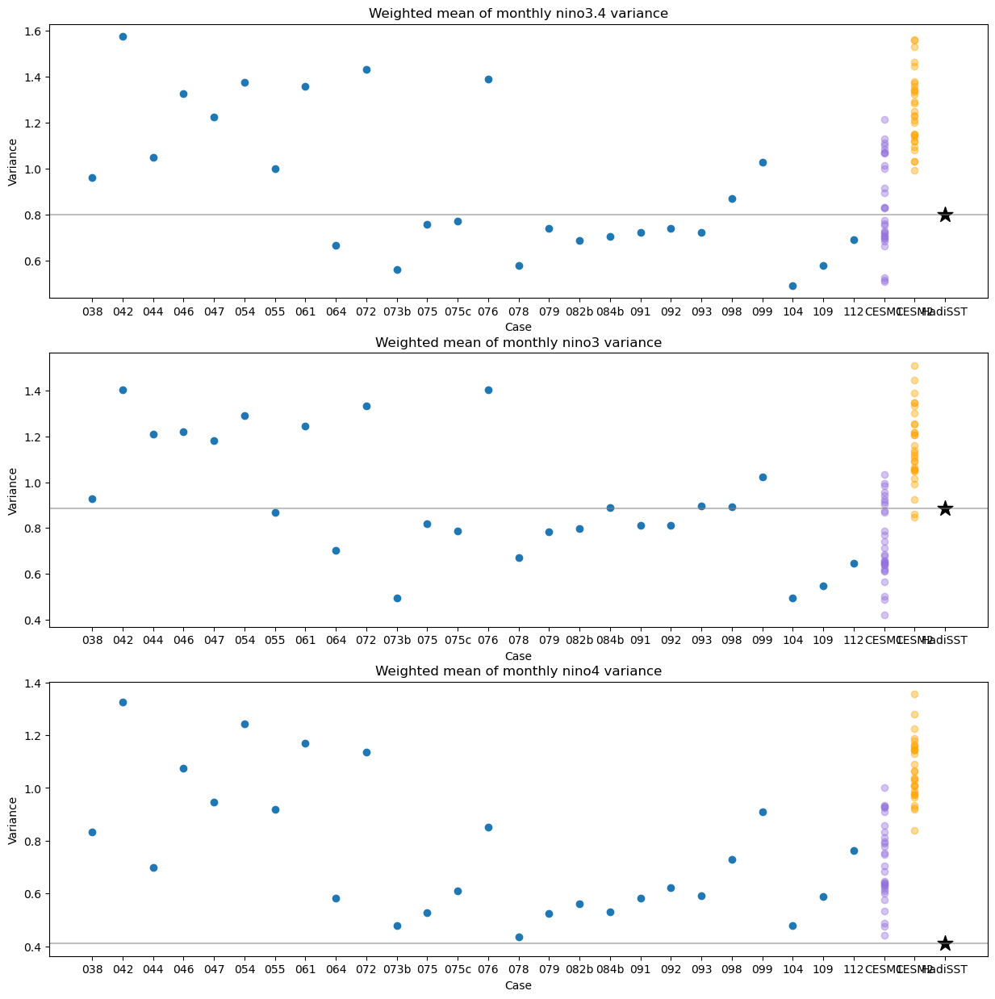

In [49]:
fig,axs=plt.subplots(3,1,figsize=(15,15))
axs = axs.ravel()

axs[0].scatter(corrs.case.values, weighted_mean_nino34_var)
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), weighted_mean_nino34_cesm1_var, 'o', color='mediumpurple', alpha=0.4)
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), weighted_mean_nino34_cesm2_var, 'o', color='orange', alpha=0.4)
axs[0].scatter('HadiSST', weighted_mean_nino34_var_obs, color='k', marker='*', s=200)
axs[0].axhline(weighted_mean_nino34_var_obs, color='grey',alpha=0.5)
axs[0].set_title('Weighted mean of monthly nino3.4 variance')
axs[0].set_ylabel('Variance')
axs[0].set_xlabel('Case')


axs[1].scatter(corrs.case.values, weighted_mean_nino3_var)
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), weighted_mean_nino3_cesm1_var, 'o', color='mediumpurple', alpha=0.4)
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), weighted_mean_nino3_cesm2_var, 'o', color='orange', alpha=0.4)
axs[1].scatter('HadiSST', weighted_mean_nino3_var_obs, color='k', marker='*', s=200)
axs[1].axhline(weighted_mean_nino3_var_obs, color='grey',alpha=0.5)
axs[1].set_title('Weighted mean of monthly nino3 variance')
axs[1].set_ylabel('Variance')
axs[1].set_xlabel('Case')

axs[2].scatter(corrs.case.values, weighted_mean_nino4_var)
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), weighted_mean_nino4_cesm1_var, 'o', color='mediumpurple', alpha=0.4)
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), weighted_mean_nino4_cesm2_var, 'o', color='orange', alpha=0.4)
axs[2].scatter('HadiSST', weighted_mean_nino4_var_obs, color='k', marker='*', s=200)
axs[2].axhline(weighted_mean_nino4_var_obs, color='grey',alpha=0.5)
axs[2].set_title('Weighted mean of monthly nino4 variance')
axs[2].set_ylabel('Variance')
axs[2].set_xlabel('Case')



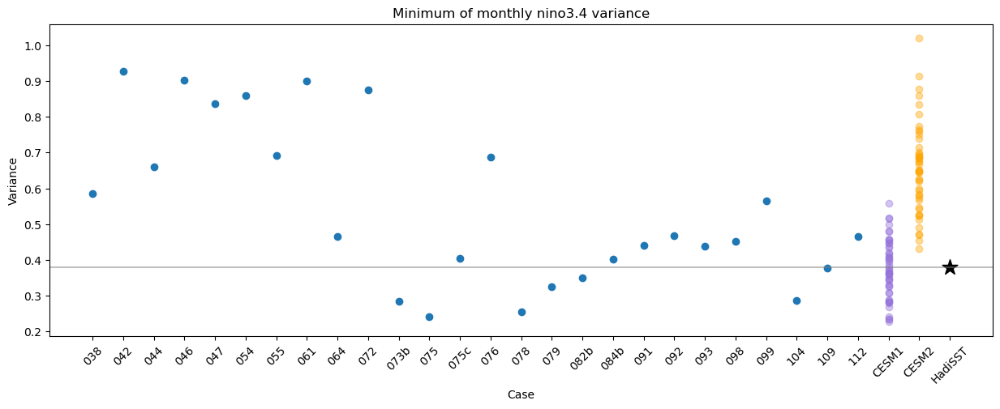

In [35]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

axs.scatter(corrs.case.values, nino34_var.min(axis=1))
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino34_var_cesm1.min(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino34_var_cesm2.min(axis=1), 'o', color='orange', alpha=0.4)
axs.scatter('HadiSST', nino34_var_obs.min(), color='k', marker='*', s=200)
axs.axhline(nino34_var_obs.min(), color='grey',alpha=0.5)

axs.set_title('Minimum of monthly nino3.4 variance')
axs.set_ylabel('Variance')
axs.set_xlabel('Case')

plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()


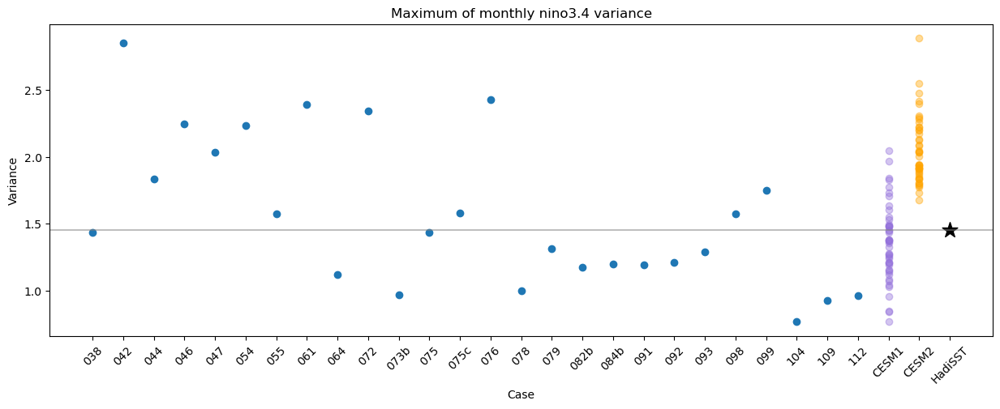

In [36]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

axs.scatter(corrs.case.values, nino34_var.max(axis=1))
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino34_var_cesm1.max(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino34_var_cesm2.max(axis=1), 'o', color='orange', alpha=0.4)
axs.scatter('HadiSST', nino34_var_obs.max(), color='k', marker='*', s=200)
axs.axhline(nino34_var_obs.max(), color='grey',alpha=0.5)

axs.set_title('Maximum of monthly nino3.4 variance')
axs.set_ylabel('Variance')
axs.set_xlabel('Case')

plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()


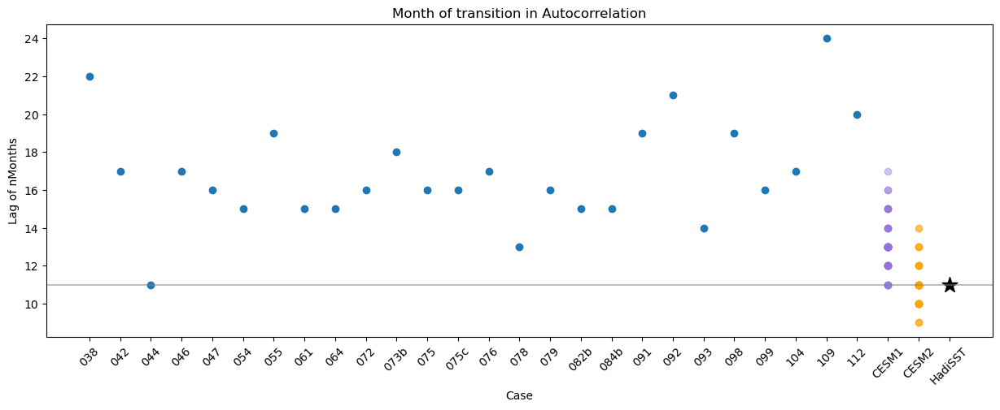

In [37]:
fig,axs=plt.subplots(1,1,figsize=(15,5))

axs.scatter(corrs.case.values, transit_month)
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), transit_month_cesm1, 'o', color='mediumpurple', alpha=0.4)
axs.plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), transit_month_cesm2, 'o', color='orange', alpha=0.4)
axs.scatter('HadiSST', transit_month_obs, color='k', marker='*', s=200)
axs.axhline(transit_month_obs, color='grey',alpha=0.5)

axs.set_title('Month of transition in Autocorrelation')
axs.set_ylabel('Lag of nMonths')
axs.set_xlabel('Case')

plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()


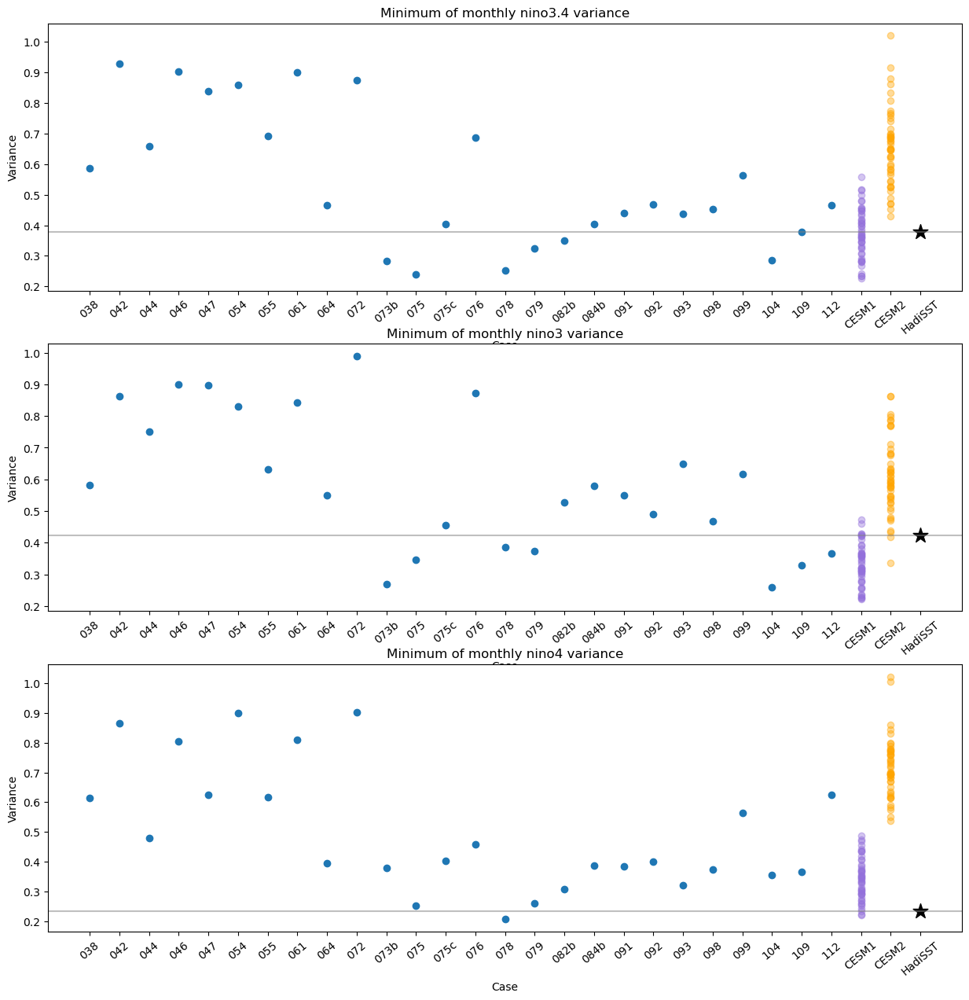

In [32]:
fig,axs=plt.subplots(3,1,figsize=(15,15))
axs = axs.ravel()

axs[0].scatter(corrs.case.values, nino34_var.min(axis=1))
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino34_var_cesm1.min(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino34_var_cesm2.min(axis=1), 'o', color='orange', alpha=0.4)
axs[0].scatter('HadiSST', nino34_var_obs.min(), color='k', marker='*', s=200)
axs[0].axhline(nino34_var_obs.min(), color='grey',alpha=0.5)
axs[0].set_title('Minimum of monthly nino3.4 variance')
axs[0].set_ylabel('Variance')
axs[0].set_xlabel('Case')

axs[1].scatter(corrs.case.values, nino3_var.min(axis=1))
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino3_var_cesm1.min(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino3_var_cesm2.min(axis=1), 'o', color='orange', alpha=0.4)
axs[1].scatter('HadiSST', nino3_var_obs.min(), color='k', marker='*', s=200)
axs[1].axhline(nino3_var_obs.min(), color='grey',alpha=0.5)
axs[1].set_title('Minimum of monthly nino3 variance')
axs[1].set_ylabel('Variance')
axs[1].set_xlabel('Case')

axs[2].scatter(corrs.case.values, nino4_var.min(axis=1))
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino4_var_cesm1.min(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino4_var_cesm2.min(axis=1), 'o', color='orange', alpha=0.4)
axs[2].scatter('HadiSST', nino4_var_obs.min(), color='k', marker='*', s=200)
axs[2].axhline(nino4_var_obs.min(), color='grey',alpha=0.5)
axs[2].set_title('Minimum of monthly nino4 variance')
axs[2].set_ylabel('Variance')
axs[2].set_xlabel('Case')

plt.setp( axs[0].xaxis.get_majorticklabels(), rotation=40 )
plt.setp( axs[1].xaxis.get_majorticklabels(), rotation=40 )
plt.setp( axs[2].xaxis.get_majorticklabels(), rotation=40 )

plt.show()


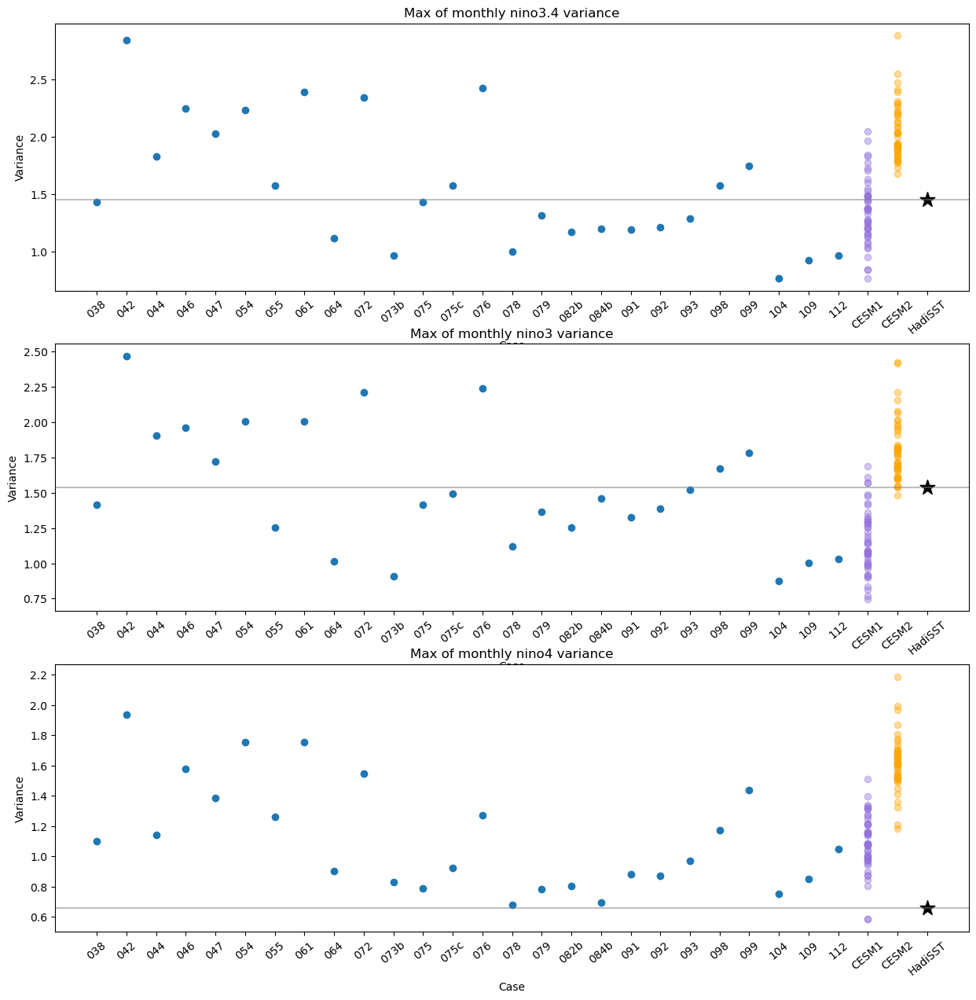

In [33]:
fig,axs=plt.subplots(3,1,figsize=(15,15))
axs = axs.ravel()

axs[0].scatter(corrs.case.values, nino34_var.max(axis=1))
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino34_var_cesm1.max(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino34_var_cesm2.max(axis=1), 'o', color='orange', alpha=0.4)
axs[0].scatter('HadiSST', nino34_var_obs.max(), color='k', marker='*', s=200)
axs[0].axhline(nino34_var_obs.max(), color='grey',alpha=0.5)
axs[0].set_title('Max of monthly nino3.4 variance')
axs[0].set_ylabel('Variance')
axs[0].set_xlabel('Case')

axs[1].scatter(corrs.case.values, nino3_var.max(axis=1))
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino3_var_cesm1.max(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino3_var_cesm2.max(axis=1), 'o', color='orange', alpha=0.4)
axs[1].scatter('HadiSST', nino3_var_obs.max(), color='k', marker='*', s=200)
axs[1].axhline(nino3_var_obs.max(), color='grey',alpha=0.5)
axs[1].set_title('Max of monthly nino3 variance')
axs[1].set_ylabel('Variance')
axs[1].set_xlabel('Case')

axs[2].scatter(corrs.case.values, nino4_var.max(axis=1))
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), nino4_var_cesm1.max(axis=1), 'o', color='mediumpurple', alpha=0.4)
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), nino4_var_cesm2.max(axis=1), 'o', color='orange', alpha=0.4)
axs[2].scatter('HadiSST', nino4_var_obs.max(), color='k', marker='*', s=200)
axs[2].axhline(nino4_var_obs.max(), color='grey',alpha=0.5)
axs[2].set_title('Max of monthly nino4 variance')
axs[2].set_ylabel('Variance')
axs[2].set_xlabel('Case')

plt.setp( axs[0].xaxis.get_majorticklabels(), rotation=40 )
plt.setp( axs[1].xaxis.get_majorticklabels(), rotation=40 )
plt.setp( axs[2].xaxis.get_majorticklabels(), rotation=40 )

plt.show()


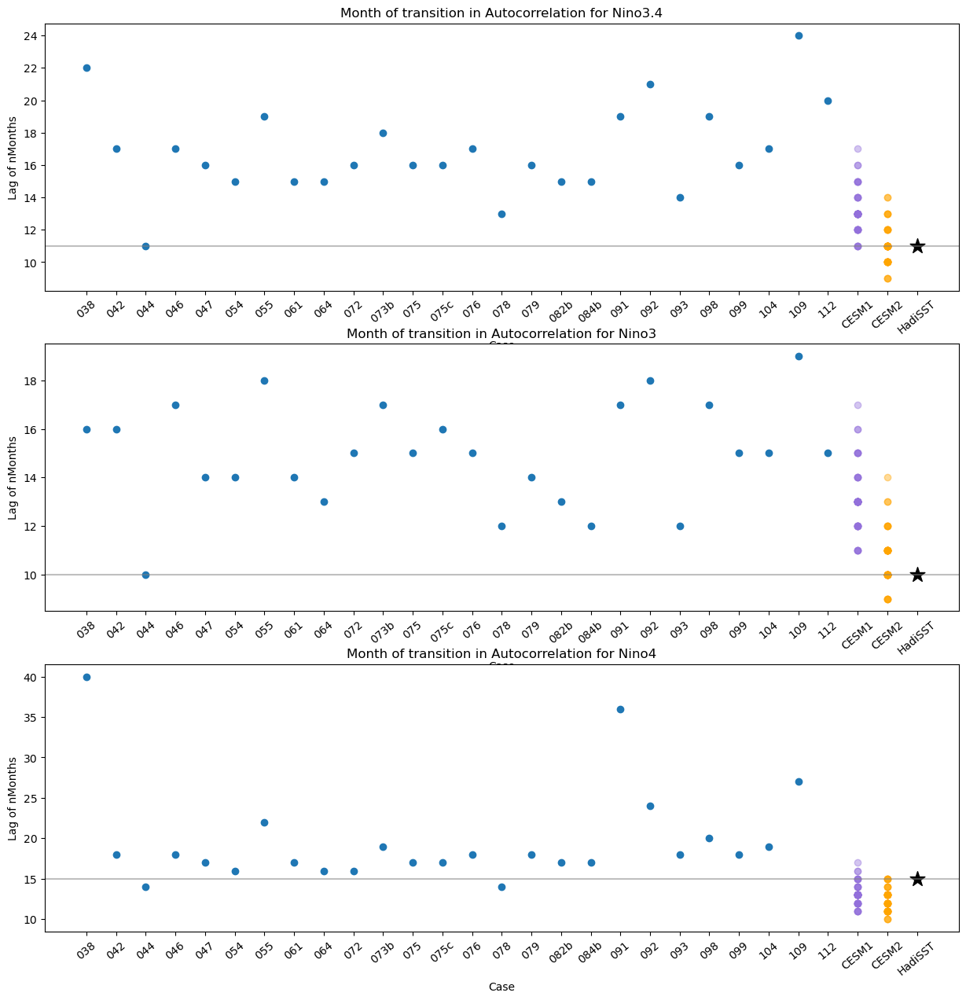

In [34]:
fig,axs=plt.subplots(3,1,figsize=(15,15))
axs = axs.ravel()

axs[0].scatter(corrs.case.values, transit_month)
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), transit_month_cesm1, 'o', color='mediumpurple', alpha=0.4)
axs[0].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), transit_month_cesm2, 'o', color='orange', alpha=0.4)
axs[0].scatter('HadiSST', transit_month_obs, color='k', marker='*', s=200)
axs[0].axhline(transit_month_obs, color='grey',alpha=0.5)
axs[0].set_title('Month of transition in Autocorrelation for Nino3.4')
axs[0].set_ylabel('Lag of nMonths')
axs[0].set_xlabel('Case')

axs[1].scatter(corrs.case.values, transit_month3)
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), transit_month3_cesm1, 'o', color='mediumpurple', alpha=0.4)
axs[1].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), transit_month3_cesm2, 'o', color='orange', alpha=0.4)
axs[1].scatter('HadiSST', transit_month_obs3, color='k', marker='*', s=200)
axs[1].axhline(transit_month_obs3, color='grey',alpha=0.5)
axs[1].set_title('Month of transition in Autocorrelation for Nino3')
axs[1].set_ylabel('Lag of nMonths')
axs[1].set_xlabel('Case')

axs[2].scatter(corrs.case.values, transit_month4)
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM1'), transit_month4_cesm1, 'o', color='mediumpurple', alpha=0.4)
axs[2].plot(np.full([len(cor_case_cesm2.event.values)], 'CESM2'), transit_month4_cesm2, 'o', color='orange', alpha=0.4)
axs[2].scatter('HadiSST', transit_month_obs4, color='k', marker='*', s=200)
axs[2].axhline(transit_month_obs4, color='grey',alpha=0.5)
axs[2].set_title('Month of transition in Autocorrelation for Nino4')
axs[2].set_ylabel('Lag of nMonths')
axs[2].set_xlabel('Case')


plt.setp( axs[0].xaxis.get_majorticklabels(), rotation=40 )
plt.setp( axs[1].xaxis.get_majorticklabels(), rotation=40 )
plt.setp( axs[2].xaxis.get_majorticklabels(), rotation=40 )
plt.show()


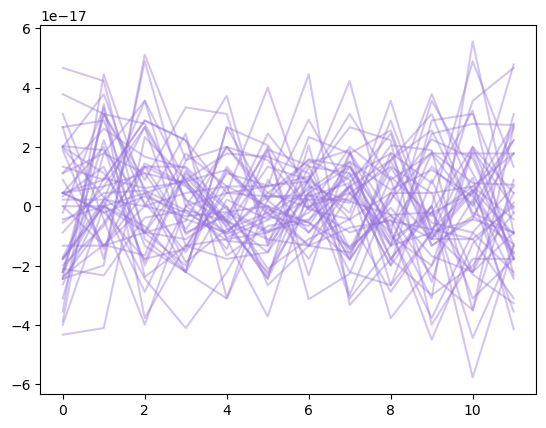

In [27]:
annNino34anoms_cesm1 = nino34_cesm1.groupby('time.month').mean(dim='time')

for iEvent in range(len(nino34_cesm1.event.values)):
    plt.plot(np.arange(12), annNino34anoms_cesm1.isel(event=iEvent), color='mediumpurple', alpha=0.4)


## Mean state bias vs. ENSO performance

### Attempt 2

In [55]:
# OcnMask in just equatorial Pacific
ocnMask_eqPac = DS_ocn.LANDFRAC.isel(time=slice(0, len(DS.time.values))).sel(lat=slice(-5,5), lon=slice(150,275)).values
ocnMask_eqPac[ocnMask_eqPac>0.45]  = np.nan
ocnMask_eqPac[ocnMask_eqPac<=0.45] = 1



Text(0.72, 0.5, 'East Pacific')

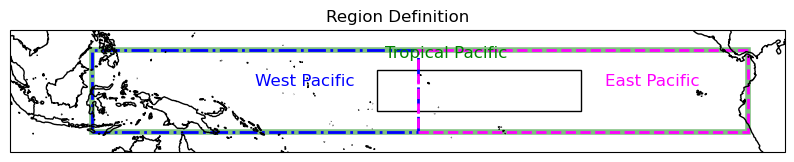

In [56]:
fig,axs = plt.subplots(1,1, figsize=(10,11), subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs.coastlines()     
axs.set_extent([100,290,-15,15], crs=ccrs.PlateCarree())

axs.add_patch(patches.Rectangle(xy=[lon_e34, lat_s34], width=(lon_w34-lon_e34), height=(lat_n34-lat_s34),
                            facecolor='none', edgecolor='k',linestyle='-',
                            linewidth=1, transform=ccrs.PlateCarree()))

# Full Pacific
axs.add_patch(patches.Rectangle(xy=[120, -10], width=(281-120), height=20,
                            facecolor='none', edgecolor='green',linestyle='-',alpha=0.5,
                            linewidth=4, transform=ccrs.PlateCarree()))
plt.gcf().text(0.5, 0.5255, 'Tropical Pacific', fontsize=12, color='green')

# West Pacific
axs.add_patch(patches.Rectangle(xy=[120, -10], width=(200-120), height=20,
                            facecolor='none', edgecolor='blue',linestyle='-.',
                            linewidth=2, transform=ccrs.PlateCarree()))
plt.gcf().text(0.37, 0.5, 'West Pacific', fontsize=12, color='blue')

# East Pacific
axs.add_patch(patches.Rectangle(xy=[200, -10], width=(281-200), height=20,
                            facecolor='none', edgecolor='magenta',linestyle='--',
                            linewidth=2, transform=ccrs.PlateCarree()))

axs.set_title('Region Definition')
plt.gcf().text(0.72, 0.5, 'East Pacific', fontsize=12, color='magenta')



In [96]:
np.arange(-3,3.1,0.1)

array([-3.00000000e+00, -2.90000000e+00, -2.80000000e+00, -2.70000000e+00,
       -2.60000000e+00, -2.50000000e+00, -2.40000000e+00, -2.30000000e+00,
       -2.20000000e+00, -2.10000000e+00, -2.00000000e+00, -1.90000000e+00,
       -1.80000000e+00, -1.70000000e+00, -1.60000000e+00, -1.50000000e+00,
       -1.40000000e+00, -1.30000000e+00, -1.20000000e+00, -1.10000000e+00,
       -1.00000000e+00, -9.00000000e-01, -8.00000000e-01, -7.00000000e-01,
       -6.00000000e-01, -5.00000000e-01, -4.00000000e-01, -3.00000000e-01,
       -2.00000000e-01, -1.00000000e-01,  2.66453526e-15,  1.00000000e-01,
        2.00000000e-01,  3.00000000e-01,  4.00000000e-01,  5.00000000e-01,
        6.00000000e-01,  7.00000000e-01,  8.00000000e-01,  9.00000000e-01,
        1.00000000e+00,  1.10000000e+00,  1.20000000e+00,  1.30000000e+00,
        1.40000000e+00,  1.50000000e+00,  1.60000000e+00,  1.70000000e+00,
        1.80000000e+00,  1.90000000e+00,  2.00000000e+00,  2.10000000e+00,
        2.20000000e+00,  

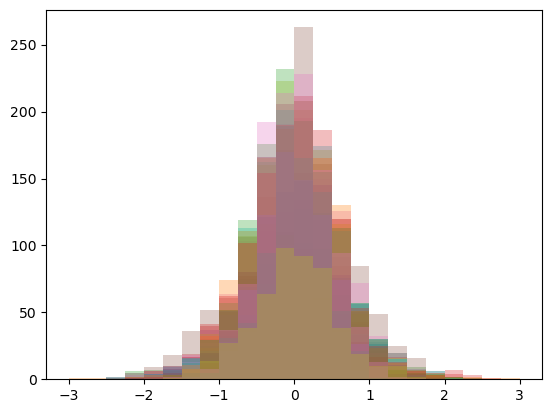

In [57]:
# fig,axs = plt.subplots(1,1,figsize=(10,5))

binSel                     = np.arange(-3,3.25,0.25)
sst_Pac_gradient_binCounts = np.full([len(listFiles_TS), len(binSel)-1], np.nan)
sst_Pac_gradient_binCounts_DJF = np.full([len(listFiles_TS), len(binSel)-1], np.nan)

for iSim in range(len(listFiles_TS)): 
# for iSim in range(4): 
    DS = xr.open_dataset(listFiles_TS[iSim]) 
    
    # Remove first year of each simulation
    timeOffset = DS.time.values[0]  + timedelta(days=365)
    iKeep      = np.where(DS.time.values>=timeOffset)[0]
    DS         = DS.isel(time=iKeep)
    
    ## Add case ID (short name) to the DS
    x        = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
    caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]

    if ((caseName=='091.') | (caseName=='092.')):
        DS['lat']  = corrs.isel(case=iSim-1).lat.values
        DS['lon']  = corrs.isel(case=iSim-1).lon.values
    
    # Get sst_anom
    ocnMask = DS.LANDFRAC.isel(time=0).values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    TS = DS.TS 
    
    # Remove annual cycle from monthly data 
    sst_anom = rmMonAnnCyc(TS)
    
    sst_westPac = sst_anom.sel(lat=slice(-5,5), lon=slice(120,200))
    sst_eastPac = sst_anom.sel(lat=slice(-5,5), lon=slice(200,281))

    # Get regional SST mean 
    sst_westPac_mean = sst_westPac.mean(dim=['lat','lon'])
    sst_eastPac_mean = sst_eastPac.mean(dim=['lat','lon'])
    sst_Pac_gradient = sst_eastPac_mean - sst_westPac_mean

    # # Remove annual cycle from monthly data 
    # sst_Pac_gradient_anom = rmMonAnnCyc(sst_Pac_gradient)

    # Get historgram of gradient values 
    output = plt.hist(sst_Pac_gradient, bins=binSel, alpha=0.3)
    sst_Pac_gradient_binCounts[iSim, :] = output[0]/len(DS.time.values)
    binEdges = output[1]
    
    # # Get seasonal means 
    # month_length =sst_Pac_gradient_anom.time.dt.days_in_month
    # weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
    # # Calculate the weighted average
    # sst_Pac_gradient_anom_seasonal = (sst_Pac_gradient_anom * weights).groupby("time.season").sum(dim="time")
    # del month_length,weights

    # # Isolate DJF? 
    # iDJF = np.where( (sst_Pac_gradient['time.month']==12) | (sst_Pac_gradient['time.month']<=2) )[0]
    # output2 = plt.hist(sst_Pac_gradient.isel(time=iDJF), bins=binSel)
    # sst_Pac_gradient_binCounts_DJF[iSim, :] = output2[0]/len(iDJF)
    # binEdges_DJF = output2[1]



/glade/derecho/scratch/mdfowler/tmp/ipykernel_30114/1699011886.py:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  flipPoint = int(np.where( (lon2>=0) & (lon2<1) )[0])


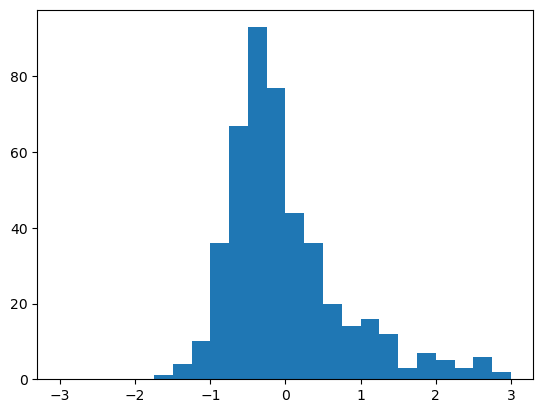

In [58]:
## Do that in obs too 

## Get observed SSTs

obsName = 'HadISST'
obs_file = "/glade/work/rneale/data/HADLEY/sst.hadley.187001-200512.nc"
obsDS    = xr.open_dataset(obs_file)

# Make times a more useful format
obsTimes = [ datetime.datetime.strptime(np.asarray(obsDS.time.values).astype('str')[x], '%Y%m') for x in range(len(obsDS.time.values)) ]
obsDS['time'] = obsTimes

# # Select lower latitudes 
# ilatsObs = np.where((obsDS.lat.values>=lat_s) & (obsDS.lat.values<=lat_n))[0]
# obsDS = obsDS.isel(lat=ilatsObs)

# Select years 1965-2002 
iselYears = np.where((obsDS['time.year'].values>=1965) & (obsDS['time.year'].values<=2002))[0]
obsDS = obsDS.isel(time=iselYears)

# Convert longitudes to be 0-360  
lon2   = np.mod((obsDS.lon.values), 360.0)
flipPoint = int(np.where( (lon2>=0) & (lon2<1) )[0])
obsDS['lon'] = lon2
obsDS        = obsDS.roll(lon=flipPoint, roll_coords=True) #Handle needing to shift longitudes to start at 0

## Regrid to match CAM grid exactly 
# Get model grid 
camGrid = DS['TS'].isel(time=0).load().squeeze()
regridObs = regrid_data(obsDS, camGrid, method=1)


# Select lower latitudes 
ilatsObs = np.where((regridObs.lat.values>=lat_s) & (regridObs.lat.values<=lat_n))[0]
obsDS = regridObs.isel(lat=ilatsObs)

# Remove annual cycle from monthly data 
sst_anom_obs = rmMonAnnCyc(obsDS.SST)

sst_westPac_obs = sst_anom_obs.sel(lat=slice(-5,5), lon=slice(120,200))
sst_eastPac_obs = sst_anom_obs.sel(lat=slice(-5,5), lon=slice(200,281))

# Get regional SST mean 
sst_westPac_mean_obs = sst_westPac_obs.mean(dim=['lat','lon'])
sst_eastPac_mean_obs = sst_eastPac_obs.mean(dim=['lat','lon'])
sst_Pac_gradient_obs = sst_eastPac_mean_obs - sst_westPac_mean_obs

# Get historgram of gradient values 
outputObs = plt.hist(sst_Pac_gradient_obs, bins=binSel)
sst_Pac_gradient_binCounts_obs = outputObs[0]/len(sst_anom_obs.time.values)
binEdgesObs = outputObs[1]

In [59]:
# Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', 'cividis')
# cmap = plt.get_cmap('nipy_spectral')
cmap = plt.get_cmap('rainbow')
# Number of colors to extract
num_colors = len(corrs.case.values)
# Generate evenly spaced values between 0 and 1
newcolorList = [cmap(i) for i in np.linspace(0, 1, num_colors)]

# Ensure the colors are tuples of RGBA values
# Each element in colors should be a tuple like (R, G, B, A)
newcolorList = [tuple(color) for color in newcolorList]

Text(0, 0.5, 'Frequency')

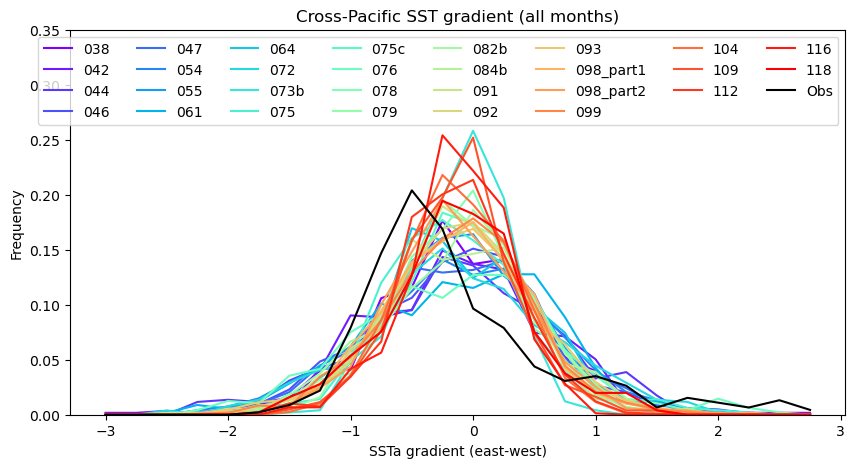

In [60]:
fig,axs = plt.subplots(1,1,figsize=(10,5))

for iSim in range(len(listFiles_TS)): 
    axs.plot(binEdges[:-1], sst_Pac_gradient_binCounts[iSim,:], color=newcolorList[iSim], label=corrs.case.values[iSim] )

axs.plot(binEdgesObs[:-1], sst_Pac_gradient_binCounts_obs, color='k', label='Obs')

axs.legend(ncol=8)
axs.set_ylim([0,0.35])
axs.set_title('Cross-Pacific SST gradient (all months)')
axs.set_xlabel('SSTa gradient (east-west)')
axs.set_ylabel('Frequency')

Text(0.5, 1.0, 'Cross-Pacific SST gradient (DJF)')

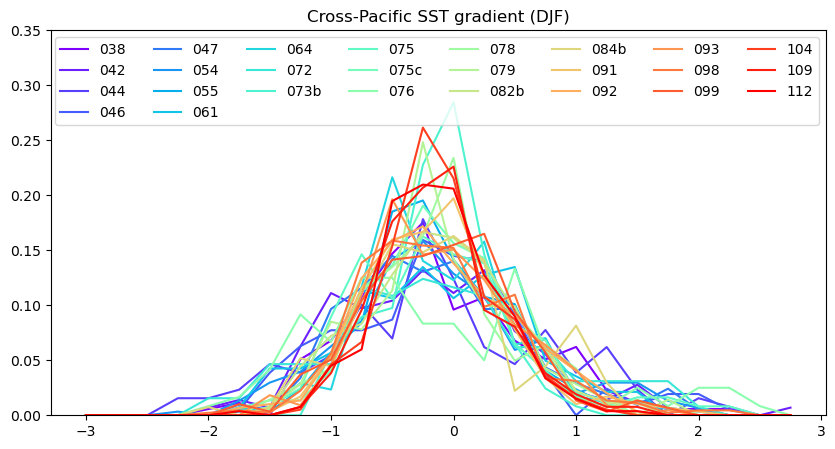

In [175]:
fig,axs = plt.subplots(1,1,figsize=(10,5))

for iSim in range(len(listFiles_TS)): 
    axs.plot(binEdges[:-1], sst_Pac_gradient_binCounts_DJF[iSim,:], color=newcolorList[iSim], label=corrs.case.values[iSim] )

axs.legend(ncol=8)
axs.set_ylim([0,0.35])
axs.set_title('Cross-Pacific SST gradient (DJF)')

#### Attempt 1

In [25]:
sst_bias = np.full([len(listFiles_TS), 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_raw  = np.full([len(listFiles_TS), 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_anom = np.full([len(listFiles_TS), 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)

for iSim in range(len(listFiles_TS)): 
# for iSim in range(2): 
    DS = xr.open_dataset(listFiles_TS[iSim]) 
    
    # Remove first year of each simulation
    timeOffset = DS.time.values[0]  + timedelta(days=365)
    iKeep      = np.where(DS.time.values>=timeOffset)[0]
    DS         = DS.isel(time=iKeep)
    
    ## Add case ID (short name) to the DS
    # x        = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
    # caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]
    caseName = listFiles_TS[iSim].split(".")[4] 

    
    if ((caseName=='091') | (caseName=='092')):
        DS['lat']  = corrs.isel(case=iSim-1).lat.values
        DS['lon']  = corrs.isel(case=iSim-1).lon.values
    
    # Get sst_anom
    ocnMask = DS.LANDFRAC.isel(time=0).values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    TS = DS.TS 
    ts = signal.detrend(TS, axis=0, type='linear') # Remove linear/constant trend 
    # Get SST 
    sst = ts * ocnMask
    sst_raw_data = DS.TS.values * ocnMask
    
    sst = xr.DataArray(sst, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])

    sst_raw_data = xr.DataArray(sst_raw_data, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])
    
    # # Remove annual cycle from monthly data 
    # sst_anom = rmMonAnnCyc(sst)

    # Get seasonal means 
    month_length = sst.time.dt.days_in_month
    weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
    # Calculate the weighted average
    sst_case_weighted = (sst * weights).groupby("time.season").sum(dim="time")
    sst_raw_case_weighted = (sst_raw_data * weights).groupby("time.season").sum(dim="time")
    del month_length,weights
    

    # Get seasonal mean in observations 
    month_length = sst_obs.time.dt.days_in_month
    weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
    # Calculate the weighted average
    sst_obs_weighted = (sst_obs * weights).groupby("time.season").sum(dim="time")
    
    # Compute bias vs. observations (seasonally) 
    sst_bias[iSim,:,:,:] = (sst_case_weighted - sst_obs_weighted) * ocnMask
    sst_raw[iSim,:,:,:]  = (sst_raw_case_weighted) * ocnMask
    sst_anom[iSim,:,:,:] = sst_case_weighted * ocnMask
    
    # sst_bias.sel(season='JJA').plot()
    print('Done with case %i of %i'% (iSim+1, len(listFiles_TS)))

## Deal with obs same way
month_length = sst_obs_raw.time.dt.days_in_month
weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
# Calculate the weighted average
sst_obs_raw_case_weighted = (sst_obs_raw * weights).groupby("time.season").sum(dim="time")
del month_length,weights


Done with case 1 of 30
Done with case 2 of 30
Done with case 3 of 30
Done with case 4 of 30
Done with case 5 of 30
Done with case 6 of 30
Done with case 7 of 30
Done with case 8 of 30
Done with case 9 of 30
Done with case 10 of 30
Done with case 11 of 30
Done with case 12 of 30
Done with case 13 of 30
Done with case 14 of 30
Done with case 15 of 30
Done with case 16 of 30
Done with case 17 of 30
Done with case 18 of 30
Done with case 19 of 30
Done with case 20 of 30
Done with case 21 of 30
Done with case 22 of 30
Done with case 23 of 30
Done with case 24 of 30
Done with case 25 of 30
Done with case 26 of 30
Done with case 27 of 30
Done with case 28 of 30
Done with case 29 of 30
Done with case 30 of 30


**Interlude: check anomalies**

In [25]:
iSim = -3
DS = xr.open_dataset(listFiles_TS[-2]) 

## Add case ID (short name) to the DS
x        = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]

if ((caseName=='091.') | (caseName=='092.')):
    DS['lat']  = corrs.isel(case=iSim-1).lat.values
    DS['lon']  = corrs.isel(case=iSim-1).lon.values

# Get sst_anom
ocnMask = DS.LANDFRAC.isel(time=0).values
ocnMask[ocnMask>0.45] = np.nan
ocnMask[ocnMask<=0.45] = 1

# Detrend data 
TS = DS.TS 
ts = signal.detrend(TS, axis=0, type='linear') # Remove linear/constant trend 
# ts = TS - TS.mean(dim='time') # Remove linear/constant trend 
# Get SST 
sst = ts * ocnMask
sst_raw_data = DS.TS.values * ocnMask

sst = xr.DataArray(sst, 
    coords={'time': DS.time.values,
            'lat':  DS.lat.values, 
            'lon':  DS.lon.values}, 
    dims=["time", "lat", "lon"])

sst_raw_data = xr.DataArray(sst_raw_data, 
    coords={'time': DS.time.values,
            'lat':  DS.lat.values, 
            'lon':  DS.lon.values}, 
    dims=["time", "lat", "lon"])

# # Remove annual cycle from monthly data 
sst_anom = rmMonAnnCyc(sst)

# Get seasonal means 
# month_length = sst.time.dt.days_in_month
# weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
# # Calculate the weighted average
# sst_case_weighted = (sst * weights).groupby("time.season").sum(dim="time")
# sst_raw_case_weighted = (sst_raw_data * weights).groupby("time.season").sum(dim="time")
# del month_length,weights



# # Compute bias vs. observations (seasonally) 
# sst_raw  = (sst_raw_case_weighted) * ocnMask
# sst_anom = sst_case_weighted * ocnMask

# sst_bias.sel(season='JJA').plot()
print('Done with case %i of %i'% (iSim+1, len(listFiles_TS)))


Done with case -2 of 26


In [ ]:
# Select Pacific 


Text(0.5, 1.0, '104. (Lat 3.298, Lon 220)')

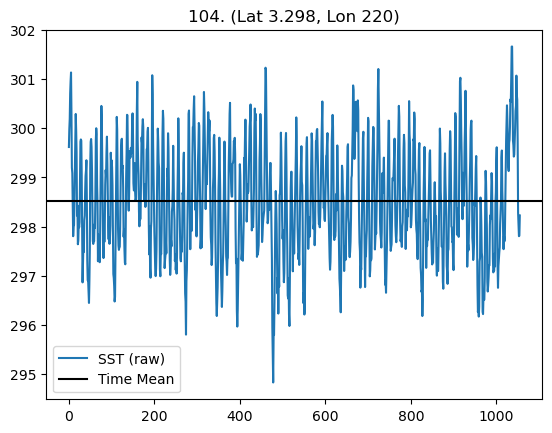

In [44]:
plt.plot(TS.sel(lat=3, lon=220, method='nearest'), label='SST (raw)')
plt.axhline(TSmean.sel(lat=3, lon=220, method='nearest'), color='k', label='Time Mean')
plt.legend()
plt.title(caseName+' (Lat 3.298, Lon 220)')



Text(0.5, 1.0, '104. (Lat = (-5S to 5n)mean, Lon 220)')

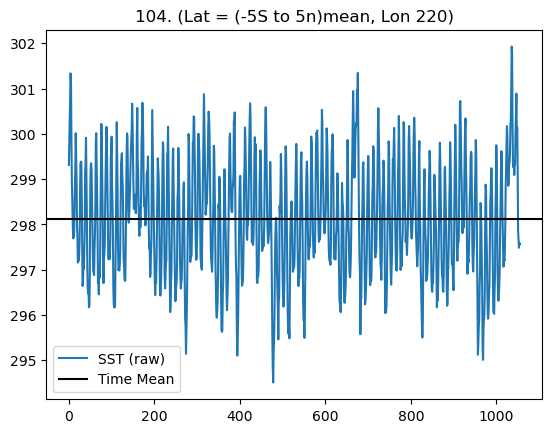

In [62]:
iLat = np.where((sst_anom.lat.values>=-5) & (sst_anom.lat.values<=5))[0]
TS_selLat = TS.isel(lat=iLat).mean(dim='lat')


plt.plot(TS_selLat.sel(lon=220, method='nearest'), label='SST (raw)')
plt.axhline(TS_selLat.sel(lon=220, method='nearest').mean(dim='time'), color='k', label='Time Mean')
plt.legend()
plt.title(caseName+' (Lat = (-5S to 5n)mean, Lon 220)')



-0.0069632511630115645
-0.0068408766503711875
-0.006479053283835688
-0.005988771133415729
-0.005287576550807783
-0.004658338449548425
-0.003915328729944157
-0.003427527274975872
-0.00287526368289729
-0.002015664216623334


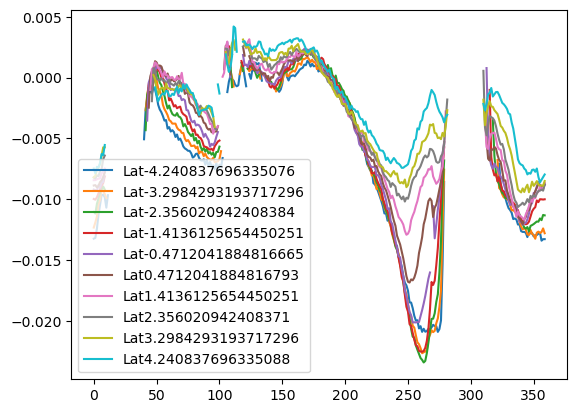

In [34]:
iLat = np.where((sst_anom.lat.values>=-5) & (sst_anom.lat.values<=5))[0]
selAnom = sst_anom.isel(lat=iLat).mean(dim='season')
# selAnom = sst_anom.isel(lat=iLat).sel(season='DJF')

for iLat in range(len(iLat)):
    plt.plot(selAnom.lon.values, selAnom.isel(lat=iLat).values, label='Lat'+str(selAnom.isel(lat=iLat).lat.values))
    
    # print(selAnom.isel(lat=iLat).mean().values)

plt.legend()


**Interlude 2: How about a different metric?**

In [34]:
import seaborn as sns


In [35]:
sst_bias = np.full([len(listFiles_TS), 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_raw  = np.full([len(listFiles_TS), 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_anom = np.full([len(listFiles_TS), 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)

sst_anom_allTimes = np.full([len(listFiles_TS), 2000, len(corrs.lat.values), len(corrs.lon.values)], np.nan)

for iSim in range(len(listFiles_TS)): 
# for iSim in range(2): 
    DS = xr.open_dataset(listFiles_TS[iSim]) 

    # Remove first year of each simulation
    timeOffset = DS.time.values[0]  + timedelta(days=365)
    iKeep      = np.where(DS.time.values>=timeOffset)[0]
    DS         = DS.isel(time=iKeep)
    
    ## Add case ID (short name) to the DS
    x        = re.search("BLT1850.ne30_t232.", listFiles_TS[iSim])
    caseName = listFiles_TS[iSim][x.span()[-1]:4+x.span()[-1]]

    if ((caseName=='091.') | (caseName=='092.')):
        DS['lat']  = corrs.isel(case=iSim-1).lat.values
        DS['lon']  = corrs.isel(case=iSim-1).lon.values
    
    # Get sst_anom
    ocnMask = DS.LANDFRAC.isel(time=0).values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    TS = DS.TS 
    ts = signal.detrend(TS, axis=0, type='linear') # Remove linear/constant trend 
    # Get SST 
    sst = ts * ocnMask
    sst_raw_data = DS.TS.values * ocnMask
    
    sst = xr.DataArray(sst, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])

    sst_raw_data = xr.DataArray(sst_raw_data, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])
    
    # # Remove annual cycle from monthly data 
    sst_anom_annCycle = rmMonAnnCyc(sst)

    sst_anom_allTimes[iSim, 0:len(sst.time.values), :, :] = sst_anom_annCycle
    

#     # Get seasonal means 
#     month_length = sst_anom_annCycle.time.dt.days_in_month
#     weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
#     # Calculate the weighted average
#     sst_case_weighted = (sst_anom_annCycle * weights).groupby("time.season").sum(dim="time")
#     sst_raw_case_weighted = (sst_raw_data * weights).groupby("time.season").sum(dim="time")
#     del month_length,weights

#     # Get seasonal mean in observations 
#     month_length = sstObs_anom.time.dt.days_in_month
#     weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
#     # Calculate the weighted average
#     sst_obs_weighted = (sstObs_anom * weights).groupby("time.season").sum(dim="time")
    
#     # Compute bias vs. observations (seasonally) 
#     sst_bias[iSim,:,:,:] = (sst_case_weighted - sst_obs_weighted) * ocnMask
#     sst_raw[iSim,:,:,:]  = (sst_raw_case_weighted) * ocnMask
#     sst_anom[iSim,:,:,:] = sst_case_weighted * ocnMask
    
#     # sst_bias.sel(season='JJA').plot()
#     print('Done with case %i of %i'% (iSim+1, len(listFiles_TS)))

# ## Deal with obs same way
# month_length = sst_obs_raw.time.dt.days_in_month
# weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
# # Calculate the weighted average
# sst_obs_raw_case_weighted = (sst_obs_raw * weights).groupby("time.season").sum(dim="time")
# del month_length,weights


In [36]:
sst_anom_allTimes  = xr.DataArray(sst_anom_allTimes, 
    coords={
            'case':   corrs.case.values, 
            'time': np.arange(2000),
            'lat': sst.lat.values, 
            'lon':sst.lon.values}, 
    dims=["case", "time", "lat", "lon"])

In [38]:
sst_anom_eqPac = sst_anom_allTimes.sel(lat=slice(-5,5), lon=slice(150,275))

In [41]:
sst_anom_eqPac.isel(case=0)

<xarray.DataArray (time: 2000, lat: 10, lon: 100)>
array([[[ 1.12890732,  0.99778461,  0.99849534, ...,  1.30712116,
          1.03761113,  0.75582528],
        [ 1.21775532,  1.05929983,  0.79507911, ...,  1.41352773,
          1.20132911,  0.88785464],
        [ 1.03717566,  0.79245824,  0.55860615, ...,  1.41968238,
          1.26187336,  1.08548748],
        ...,
        [ 0.85374117,  0.76939106,  0.68404013, ...,  0.26088804,
          0.32069319,  0.32669947],
        [ 1.06308961,  1.00635695,  0.91889566, ..., -0.20482105,
         -0.07774585, -0.03485883],
        [ 1.11913908,  1.10601759,  1.0730021 , ..., -0.58064711,
         -0.40626138, -0.26945055]],

       [[ 1.09914744,  0.92987216,  0.60091436, ...,  1.17136025,
          1.24716544,  1.40789628],
        [ 1.04063904,  0.71893829,  0.31937784, ...,  1.14618897,
          1.20989633,  1.28353262],
        [ 0.39084068,  0.14137915,  0.06542504, ...,  1.01456523,
          1.0631237 ,  1.12859702],
...
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]]])
Coordinates:
    case     <U4 '038'
  * time     (time) int64 0 1 2 3 4 5 6 7 ... 1993 1994 1995 1996 1997 1998 1999
  * lat      (lat) float64 -4.241 -3.298 -2.356 -1.414 ... 2.356 3.298 4.241
  * lon      (lon) float64 151.2 152.5 153.8 155.0 ... 271.2 272.5 273.8 275.0

In [22]:
sst_anom_eqPac_1D = np.reshape(sst_anom_eqPac.values, [len(sst_anom_allTimes.case.values), len(sst_anom_eqPac.time.values)*len(sst_anom_eqPac.lat.values)*len(sst_anom_eqPac.lon.values)])

sst_anom_eqPac_1D_df = xr.DataArray(sst_anom_eqPac_1D, 
    coords={
            'case':   corrs.case.values, 
            'dims': np.arange( len(sst_anom_eqPac.time.values)*len(sst_anom_eqPac.lat.values)*len(sst_anom_eqPac.lon.values) )},
    dims=["case", "dims"])



In [23]:
sst_anom_eqPac_1D_pd = sst_anom_eqPac_1D_df.to_dataframe(name='SSTa')


<Figure size 1000x500 with 0 Axes>

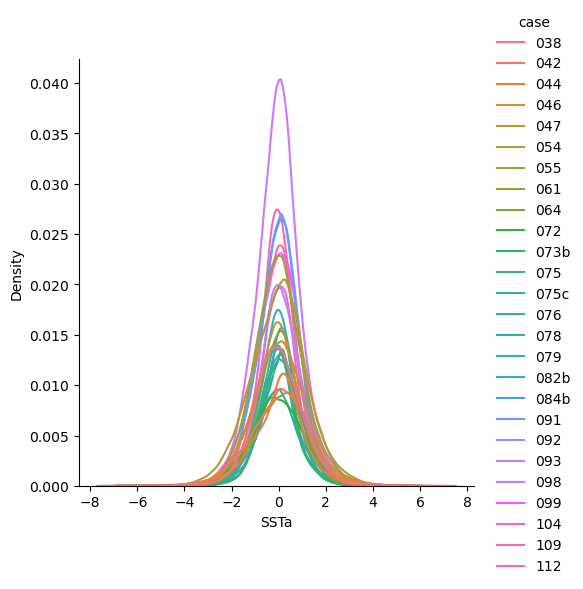

In [77]:
# sns.set_style("whitegrid")  # Setting style(Optional)
plt.figure(figsize = (10,5)) #Specify the size of figure

sns.displot(sst_anom_eqPac_1D_pd,x='SSTa',hue='case',
            kind='kde')


# sns.distplot(sst_anom_eqPac,  bins = 20 , kde = True , color = 'teal', kde_kws=dict(linewidth = 4 , color = 'black')) #kde for normal distribution
plt.show()

<Figure size 1000x500 with 0 Axes>

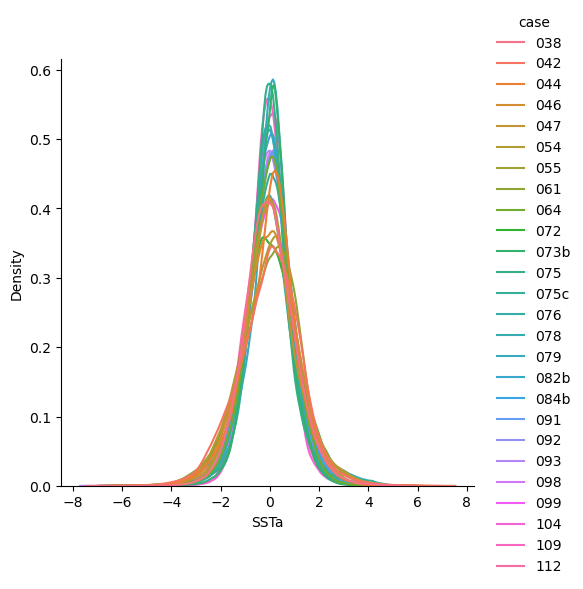

In [78]:
# sns.set_style("whitegrid")  # Setting style(Optional)
plt.figure(figsize = (10,5)) #Specify the size of figure

sns.displot(sst_anom_eqPac_1D_pd,x='SSTa',hue='case',
            kind='kde', common_norm=False)


# sns.distplot(sst_anom_eqPac,  bins = 20 , kde = True , color = 'teal', kde_kws=dict(linewidth = 4 , color = 'black')) #kde for normal distribution
plt.show()

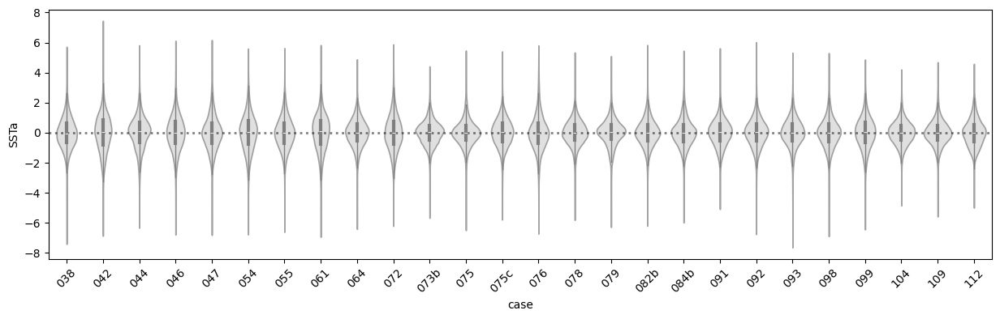

In [80]:
# sns.violinplot(sst_anom_eqPac_1D_pd, x='case')

fig,axs = plt.subplots(1,1,figsize=(15,4))
axs.axhline(0,color='k',linewidth=2,alpha=0.5,linestyle=':')

v1 = sns.violinplot(sst_anom_eqPac_1D_pd, x='case',y='SSTa', inner='box', color="lightgrey", alpha=0.7, 
                   inner_kws=dict(box_width=3, whis_width=1))

plt.setp( axs.xaxis.get_majorticklabels(), rotation=45 )
plt.show()

# axs.axhline(0,color='k',linewidth=2,alpha=0.5,linestyle=':')


**End of interludes**


In [26]:
sst_bias = xr.DataArray(sst_bias, 
    coords={
            'case':   corrs.case.values, 
            'season': sst_case_weighted.season.values,
            'lat': sst_case_weighted.lat.values, 
            'lon':sst_case_weighted.lon.values}, 
    dims=["case", "season", "lat", "lon"])

sst_raw = xr.DataArray(sst_raw, 
    coords={
            'case':   corrs.case.values, 
            'season': sst_case_weighted.season.values,
            'lat': sst_case_weighted.lat.values, 
            'lon':sst_case_weighted.lon.values}, 
    dims=["case", "season", "lat", "lon"])

sst_anom = xr.DataArray(sst_anom, 
    coords={
            'case':   corrs.case.values, 
            'season': sst_case_weighted.season.values,
            'lat': sst_case_weighted.lat.values, 
            'lon':sst_case_weighted.lon.values}, 
    dims=["case", "season", "lat", "lon"])

sst_obs_raw_seasonal = xr.DataArray(sst_obs_raw_case_weighted, 
    coords={
            'season': sst_obs_raw_case_weighted.season.values,
            'lat': sst_obs_raw_case_weighted.lat.values, 
            'lon':sst_obs_raw_case_weighted.lon.values}, 
    dims=["season", "lat", "lon"])

sst_obs_weighted = xr.DataArray(sst_obs_weighted, 
    coords={
            'season': sst_obs_weighted.season.values,
            'lat': sst_obs_weighted.lat.values, 
            'lon':sst_obs_weighted.lon.values}, 
    dims=["season", "lat", "lon"])


In [27]:
sst_bias_cesm1 = np.full([nSamples, 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_bias_cesm2 = np.full([nSamples, 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_raw_cesm1  = np.full([nSamples, 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_raw_cesm2  = np.full([nSamples, 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_anom_cesm1 = np.full([nSamples, 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)
sst_anom_cesm2 = np.full([nSamples, 4, len(corrs.lat.values), len(corrs.lon.values)], np.nan)

for iSim in range(nSamples): 
    DS_cesm1 = DS_cesm1_events.isel(event=iSim)
    DS_cesm2 = DS_cesm2_events.isel(event=iSim)
    
    # Get sst_anom
    ocnMask = DS_ocn.LANDFRAC.isel(time=0).values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    ts_cesm1 = signal.detrend(DS_cesm1, axis=0, type='linear') # Remove linear/constant trend 
    ts_cesm2 = signal.detrend(DS_cesm2, axis=0, type='linear') # Remove linear/constant trend 
    # Get SST 
    sst_cesm1 = ts_cesm1 * ocnMask
    sst_cesm2 = ts_cesm2 * ocnMask
    sst_raw_data_cesm1 = DS_cesm1.values * ocnMask
    sst_raw_data_cesm2 = DS_cesm2.values * ocnMask

    
    sst_cesm1 = xr.DataArray(sst_cesm1, 
        coords={'time': DS_cesm1.time.values,
                'lat':  DS_ocn.lat.values, 
                'lon':  DS_ocn.lon.values}, 
        dims=["time", "lat", "lon"])

    sst_cesm2 = xr.DataArray(sst_cesm2, 
        coords={'time': DS_cesm2.time.values,
                'lat':  DS_ocn.lat.values, 
                'lon':  DS_ocn.lon.values}, 
        dims=["time", "lat", "lon"])

    sst_raw_data_cesm1 = xr.DataArray(sst_raw_data_cesm1, 
        coords={'time': DS_cesm1.time.values,
                'lat':  DS_ocn.lat.values, 
                'lon':  DS_ocn.lon.values}, 
        dims=["time", "lat", "lon"])

    sst_raw_data_cesm2 = xr.DataArray(sst_raw_data_cesm2, 
        coords={'time': DS_cesm2.time.values,
                'lat':  DS_ocn.lat.values, 
                'lon':  DS_ocn.lon.values}, 
        dims=["time", "lat", "lon"])

    # Get seasonal means in CESM1
    month_length = sst_cesm1.time.dt.days_in_month
    weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
    # Calculate the weighted average
    sst_cesm1_weighted = (sst_cesm1 * weights).groupby("time.season").sum(dim="time")
    sst_raw_cesm1_weighted = (sst_raw_data_cesm1 * weights).groupby("time.season").sum(dim="time")
    sst_raw_cesm2_weighted = (sst_raw_data_cesm2 * weights).groupby("time.season").sum(dim="time")
    del month_length,weights

    # Get seasonal means in CESM2
    month_length = sst_cesm2.time.dt.days_in_month
    weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
    # Calculate the weighted average
    sst_cesm2_weighted = (sst_cesm2 * weights).groupby("time.season").sum(dim="time")
    del month_length,weights

    # Get seasonal mean in observations 
    month_length = sst_obs.time.dt.days_in_month
    weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
    # Calculate the weighted average
    sst_obs_weighted = (sst_obs * weights).groupby("time.season").sum(dim="time")
    
    # Compute bias vs. observations (seasonally) 
    sst_bias_cesm1[iSim,:,:,:] = (sst_cesm1_weighted - sst_obs_weighted) * ocnMask
    sst_bias_cesm2[iSim,:,:,:] = (sst_cesm2_weighted - sst_obs_weighted) * ocnMask

    sst_raw_cesm1[iSim,:,:,:]  = (sst_raw_cesm1_weighted) * ocnMask
    sst_anom_cesm1[iSim,:,:,:] = sst_cesm1_weighted * ocnMask
    sst_raw_cesm2[iSim,:,:,:]  = (sst_raw_cesm2_weighted) * ocnMask
    sst_anom_cesm2[iSim,:,:,:] = sst_cesm2_weighted * ocnMask

    # sst_bias.sel(season='JJA').plot()
    print('Done with case %i of %i'% (iSim+1, nSamples))


Done with case 1 of 30
Done with case 2 of 30
Done with case 3 of 30
Done with case 4 of 30
Done with case 5 of 30
Done with case 6 of 30
Done with case 7 of 30
Done with case 8 of 30
Done with case 9 of 30
Done with case 10 of 30
Done with case 11 of 30
Done with case 12 of 30
Done with case 13 of 30
Done with case 14 of 30
Done with case 15 of 30
Done with case 16 of 30
Done with case 17 of 30
Done with case 18 of 30
Done with case 19 of 30
Done with case 20 of 30
Done with case 21 of 30
Done with case 22 of 30
Done with case 23 of 30
Done with case 24 of 30
Done with case 25 of 30
Done with case 26 of 30
Done with case 27 of 30
Done with case 28 of 30
Done with case 29 of 30
Done with case 30 of 30


In [28]:
sst_bias_cesm1 = xr.DataArray(sst_bias_cesm1, 
    coords={
            'event':   np.arange(nSamples),
            'season': sst_cesm1_weighted.season.values,
            'lat': sst_cesm1_weighted.lat.values, 
            'lon':sst_cesm1_weighted.lon.values}, 
    dims=["event", "season", "lat", "lon"])

sst_bias_cesm2 = xr.DataArray(sst_bias_cesm2, 
    coords={
            'event':   np.arange(nSamples),
            'season': sst_cesm2_weighted.season.values,
            'lat': sst_cesm2_weighted.lat.values, 
            'lon':sst_cesm2_weighted.lon.values}, 
    dims=["event", "season", "lat", "lon"])


sst_raw_cesm1 = xr.DataArray(sst_raw_cesm1, 
    coords={
              'event':   np.arange(nSamples),
            'season': sst_cesm1_weighted.season.values,
            'lat': sst_cesm1_weighted.lat.values, 
            'lon':sst_cesm1_weighted.lon.values}, 
    dims=["event", "season", "lat", "lon"])

sst_anom_cesm1 = xr.DataArray(sst_anom_cesm1, 
    coords={
              'event':   np.arange(nSamples),
            'season': sst_cesm1_weighted.season.values,
            'lat': sst_cesm1_weighted.lat.values, 
            'lon':sst_cesm1_weighted.lon.values}, 
    dims=["event", "season", "lat", "lon"])

sst_raw_cesm2 = xr.DataArray(sst_raw_cesm2, 
    coords={
              'event':   np.arange(nSamples),
            'season': sst_cesm1_weighted.season.values,
            'lat': sst_cesm1_weighted.lat.values, 
            'lon':sst_cesm1_weighted.lon.values}, 
    dims=["event", "season", "lat", "lon"])

sst_anom_cesm2 = xr.DataArray(sst_anom_cesm2, 
    coords={
              'event':   np.arange(nSamples),
            'season': sst_cesm1_weighted.season.values,
            'lat': sst_cesm1_weighted.lat.values, 
            'lon':sst_cesm1_weighted.lon.values}, 
    dims=["event", "season", "lat", "lon"])



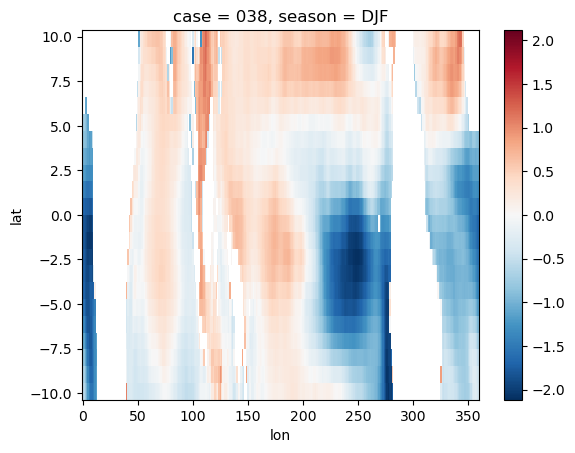

In [65]:
sst_bias.isel(case=0).sel(season='DJF').plot()

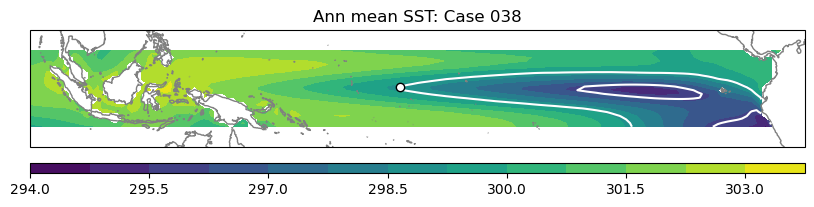

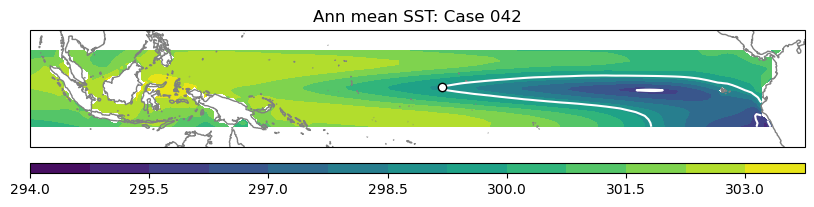

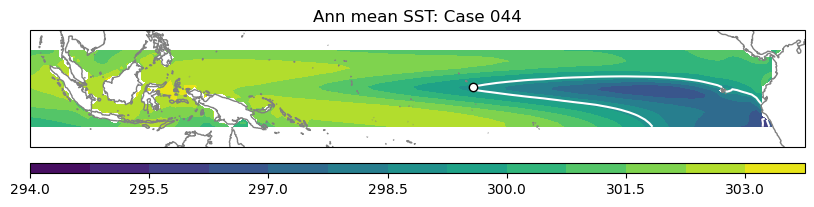

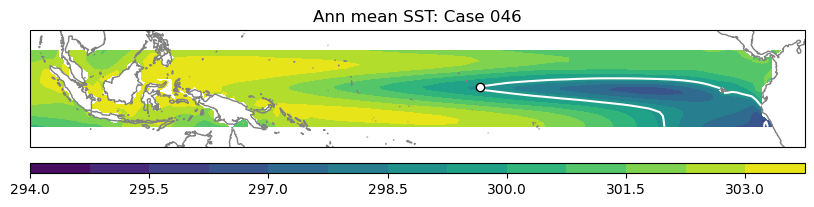

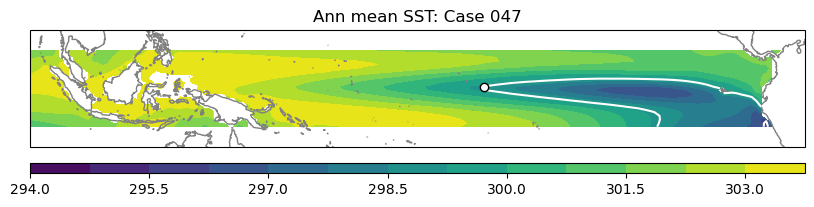

...

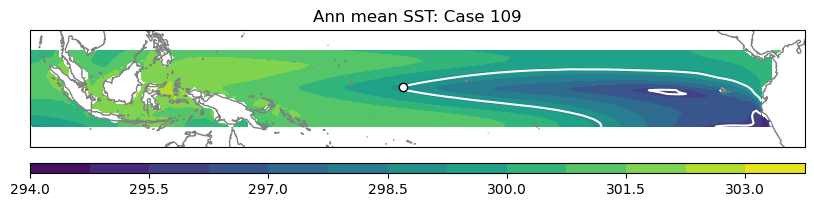

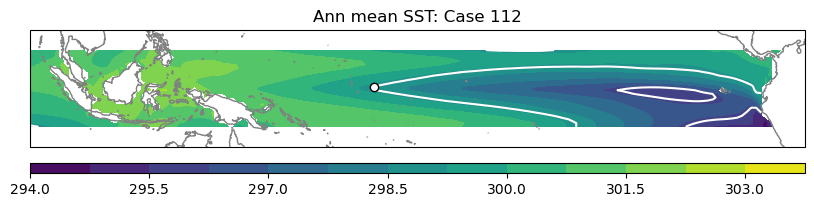

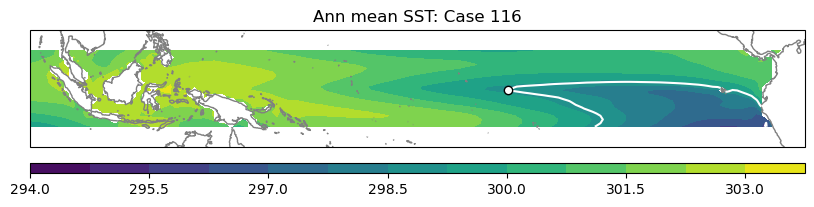

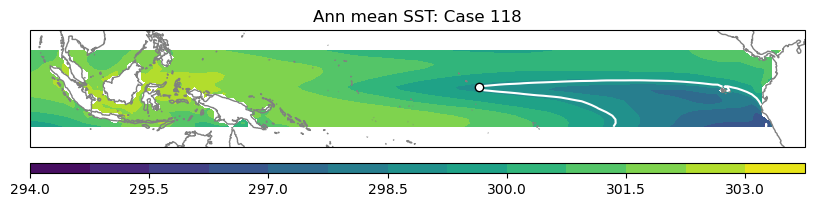

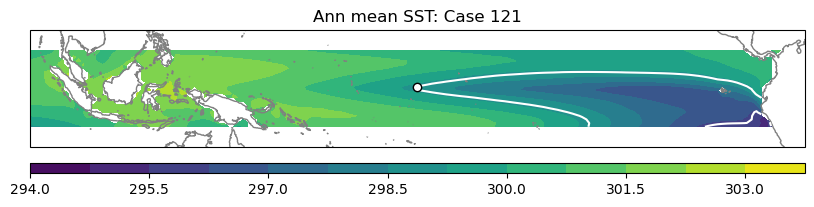

In [29]:
levs = np.arange(294,304,0.75)

lon299 = np.full(len(sst_raw.case.values), np.nan)

for iCase in range(len(sst_raw.case.values)): 
# for iCase in range(1): 
    fig,axs = plt.subplots(1,1,figsize=(10,3),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
    axs.coastlines(color='grey')
    axs.set_extent([90,290,-15,15], crs=ccrs.PlateCarree())
    sst_raw = sst_raw.sel(lon=slice(90,290))

    c1 = axs.contourf(sst_raw.lon.values, sst_raw.lat.values, sst_raw.isel(case=iCase).mean(dim='season').values, levs, 
                transform=ccrs.PlateCarree())

    # Add colorbar 
    cax = axs.inset_axes([0, -0.23, 1, 0.09])  # THE NEW AXES, x, y, width, height,
    cbar = fig.colorbar(c1, cax = cax, orientation="horizontal")
    c2 = axs.contour(sst_raw.lon.values, sst_raw.lat.values, sst_raw.isel(case=iCase).mean(dim='season').values, [290, 299], 
                     colors='white',
                     transform=ccrs.PlateCarree()) 
    
    # Add contour marker
    maybeLon = []
    maybeLat = []
    lenSeg = 0
    for iSegs in range(len(c2.allsegs[1])): 
        dat0 = c2.allsegs[1][iSegs]
        western_most_lon = np.nanmin(dat0[:,0])
        iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
        maybeLon = np.append(maybeLon, western_most_lon)
        maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
        if len(dat0)>lenSeg:
            lenSeg= len(dat0)
            iselSeg = iSegs
            
    western_most_lon = maybeLon[iselSeg]

    
    # dat0 = c2.allsegs[1][0]
    # axs.plot(dat0[:,0],dat0[:,1],'ro', transform=ccrs.PlateCarree())

    # western_most_lon = np.nanmin(dat0[:,0])
    # iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
    lon299[iCase] = western_most_lon
    
    axs.plot(western_most_lon, maybeLat[iselSeg], 'o', alpha=1, markeredgecolor='k',
               color='white', transform=ccrs.PlateCarree(), label=sst_raw.isel(case=iCase).case.values)

    c3 = axs.contour(sst_raw.lon.values, sst_raw.lat.values, sst_raw.isel(case=iCase).mean(dim='season').values, [290, 296], 
                     colors='white',
                     transform=ccrs.PlateCarree()) 


    axs.set_title('Ann mean SST: Case '+str(sst_raw.isel(case=iCase).case.values))
    plt.show() 


In [30]:
# Mean SST in nino3.4 region
ilats = np.where((sst_raw.lat.values>=lat_s34)  & (sst_raw.lat.values<=lat_n34))[0]
ilons = np.where((sst_raw.lon.values>=lon_e34)  & (sst_raw.lon.values<=lon_w34))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_raw.isel(lat=ilats, lon=ilons)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_nino34 = regionTS.weighted(coswgt).mean(('lon','lat'))


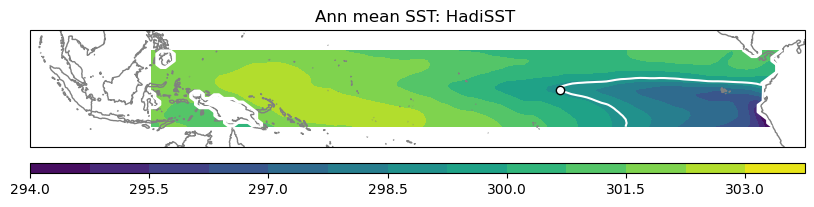

In [31]:
levs = np.arange(294,304,0.75)

fig,axs = plt.subplots(1,1,figsize=(10,3),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs.coastlines(color='grey')
axs.set_extent([90,290,-15,15], crs=ccrs.PlateCarree())
sst_obs_raw_seasonal_temp = sst_obs_raw_seasonal.sel(lon=slice(120,290)) + 273.15

c1 = axs.contourf(sst_obs_raw_seasonal_temp.lon.values, sst_obs_raw_seasonal_temp.lat.values, sst_obs_raw_seasonal_temp.mean(dim='season').values, levs, 
            transform=ccrs.PlateCarree())

# Add colorbar 
cax = axs.inset_axes([0, -0.23, 1, 0.09])  # THE NEW AXES, x, y, width, height,
cbar = fig.colorbar(c1, cax = cax, orientation="horizontal")

c2 = axs.contour(sst_obs_raw_seasonal_temp.lon.values, sst_obs_raw_seasonal_temp.lat.values, sst_obs_raw_seasonal_temp.mean(dim='season').values, [290, 299], 
                 colors='white',
                 transform=ccrs.PlateCarree()) 

# Add contour marker
dat0= c2.allsegs[1][1]
# axs.plot(dat0[:,0],dat0[:,1],'ro', transform=ccrs.PlateCarree())

western_most_lon = np.nanmin(dat0[:,0])
iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
lon299_obs = western_most_lon

axs.plot(western_most_lon, dat0[int(iMatchLat[0]), 1], 'o', alpha=1, markeredgecolor='k',
           color='white', transform=ccrs.PlateCarree())


axs.set_title('Ann mean SST: HadiSST ')
plt.show() 


In [32]:
# Mean SST in nino3.4 region
ilats = np.where((sst_obs_raw_seasonal.lat.values>=lat_s34)  & (sst_obs_raw_seasonal.lat.values<=lat_n34))[0]
ilons = np.where((sst_obs_raw_seasonal.lon.values>=lon_e34)  & (sst_obs_raw_seasonal.lon.values<=lon_w34))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_obs_raw_seasonal.isel(lat=ilats, lon=ilons)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_obs_raw_nino34 = regionTS.weighted(coswgt).mean(('lon','lat'))


In [33]:
## Gradient of SSTs across Pacific 
ilats = np.where((sst_anom.lat.values>=-5)  & (sst_anom.lat.values<=5))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_anom.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_anom_eq = regionTS.weighted(coswgt).mean('lat')

regionTS = sst_raw.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_eq = regionTS.weighted(coswgt).mean('lat')


## Do the same in obs
ilats = np.where((sst_obs_weighted.lat.values>=-5)  & (sst_obs_weighted.lat.values<=5))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_obs_weighted.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_anom_eq_obs = regionTS.weighted(coswgt).mean('lat')

regionTS = sst_obs_raw_seasonal.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_eq_obs = regionTS.weighted(coswgt).mean('lat')


In [34]:
## CESM1 
ilats = np.where((sst_anom_cesm1.lat.values>=-5)  & (sst_anom_cesm1.lat.values<=5))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_anom_cesm1.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_anom_eq_cesm1 = regionTS.weighted(coswgt).mean('lat')

regionTS = sst_raw_cesm1.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_eq_cesm1 = regionTS.weighted(coswgt).mean('lat')


## CESM2 
ilats = np.where((sst_anom_cesm2.lat.values>=-5)  & (sst_anom_cesm2.lat.values<=5))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_anom_cesm2.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_anom_eq_cesm2 = regionTS.weighted(coswgt).mean('lat')

regionTS = sst_raw_cesm2.isel(lat=ilats)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_eq_cesm2 = regionTS.weighted(coswgt).mean('lat')


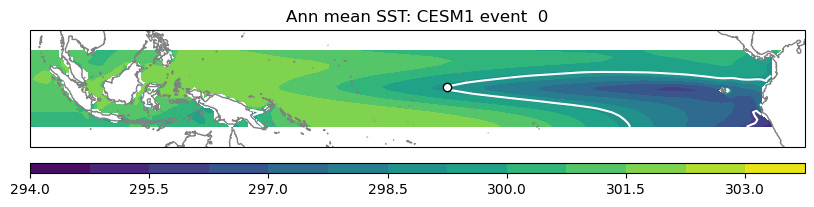

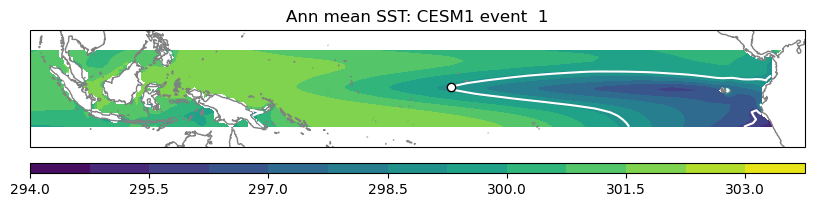

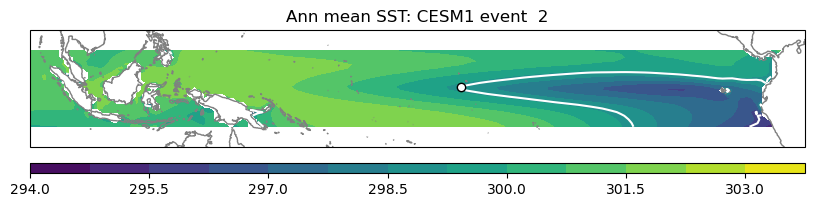

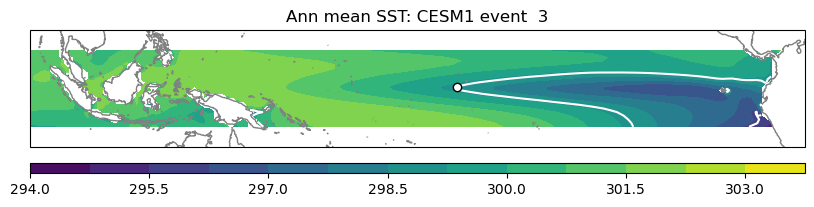

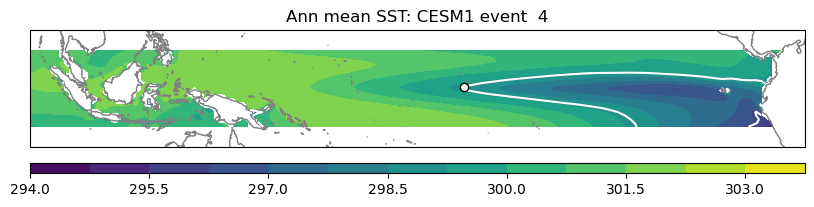

...

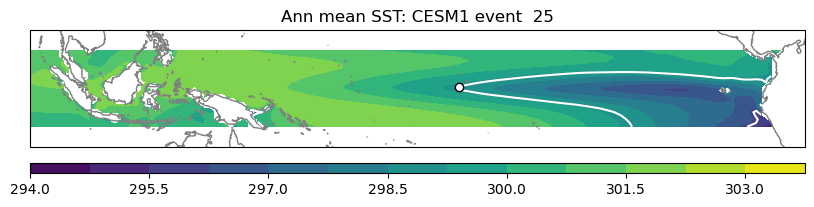

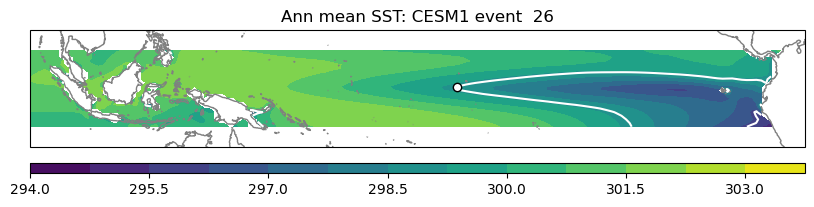

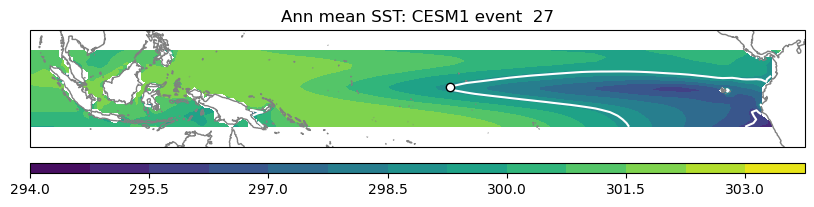

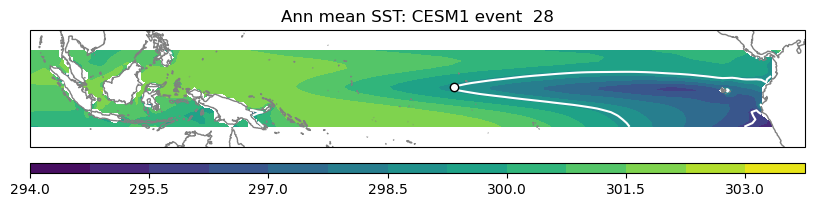

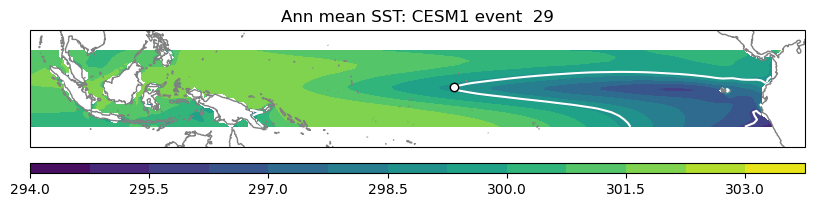

In [35]:
levs = np.arange(294,304,0.75)

lon299_cesm1 = np.full(len(sst_raw_cesm1.event.values), np.nan)

for iCase in range(len(sst_raw_cesm1.event.values)): 
    fig,axs = plt.subplots(1,1,figsize=(10,3),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
    axs.coastlines(color='grey')
    axs.set_extent([90,290,-15,15], crs=ccrs.PlateCarree())
    sst_raw_cesm1 = sst_raw_cesm1.sel(lon=slice(90,290))

    c1 = axs.contourf(sst_raw_cesm1.lon.values, sst_raw_cesm1.lat.values, sst_raw_cesm1.isel(event=iCase).mean(dim='season').values, levs, 
                transform=ccrs.PlateCarree())

    # Add colorbar 
    cax = axs.inset_axes([0, -0.23, 1, 0.09])  # THE NEW AXES, x, y, width, height,
    cbar = fig.colorbar(c1, cax = cax, orientation="horizontal")
    c2 = axs.contour(sst_raw_cesm1.lon.values, sst_raw_cesm1.lat.values, sst_raw_cesm1.isel(event=iCase).mean(dim='season').values, [290, 299], 
                     colors='white',
                     transform=ccrs.PlateCarree()) 
    
    # Add contour marker
    maybeLon = []
    maybeLat = []
    lenSeg = 0
    for iSegs in range(len(c2.allsegs[1])): 
        dat0 = c2.allsegs[1][iSegs]
        western_most_lon = np.nanmin(dat0[:,0])
        iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
        maybeLon = np.append(maybeLon, western_most_lon)
        maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
        if len(dat0)>lenSeg:
            lenSeg= len(dat0)
            iselSeg = iSegs
            
    western_most_lon = maybeLon[iselSeg]

    lon299_cesm1[iCase] = western_most_lon
    
    axs.plot(western_most_lon, maybeLat[iselSeg], 'o', alpha=1, markeredgecolor='k',
               color='white', transform=ccrs.PlateCarree(), label=sst_raw.isel(case=iCase).case.values)

    c3 = axs.contour(sst_raw_cesm1.lon.values, sst_raw_cesm1.lat.values, sst_raw_cesm1.isel(event=iCase).mean(dim='season').values, [290, 296], 
                     colors='white',
                     transform=ccrs.PlateCarree()) 


    axs.set_title('Ann mean SST: CESM1 event  '+str(iCase))
    plt.show() 


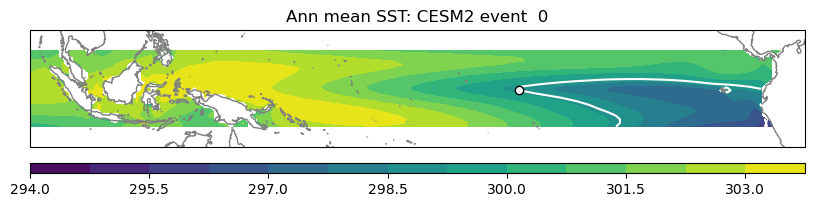

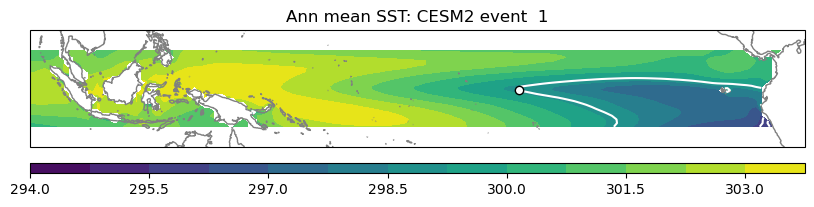

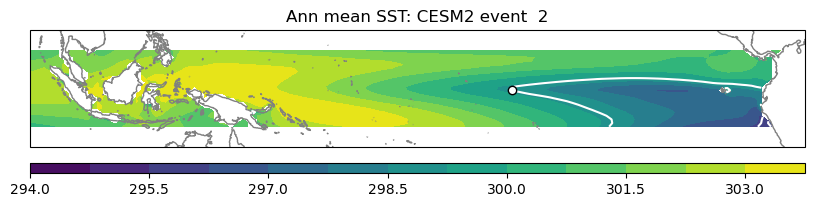

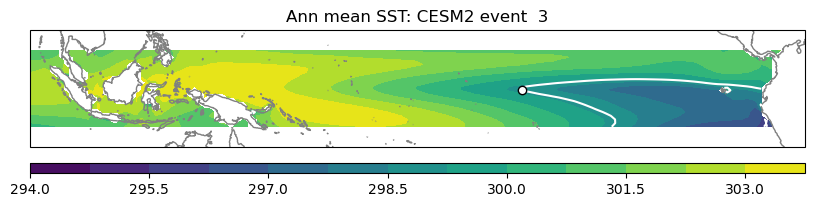

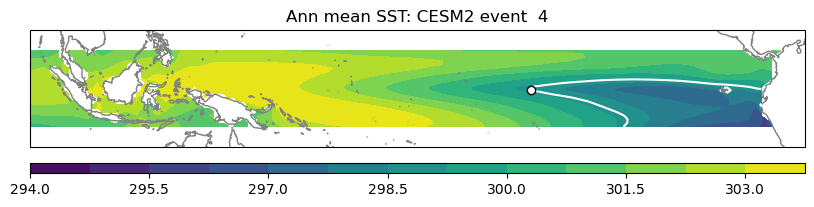

...

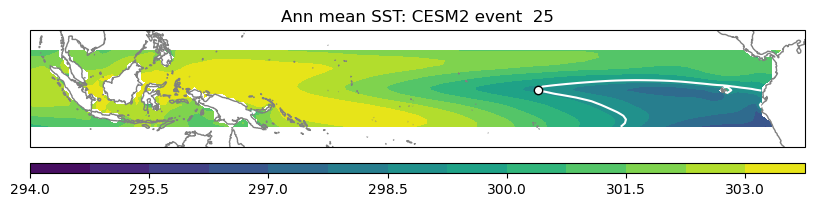

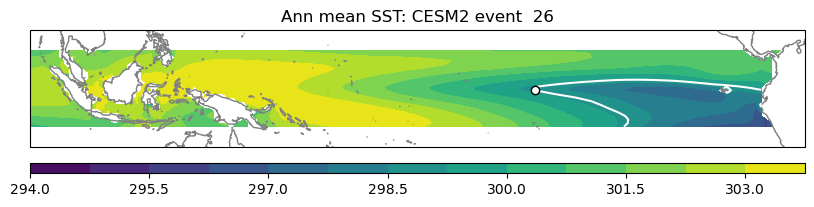

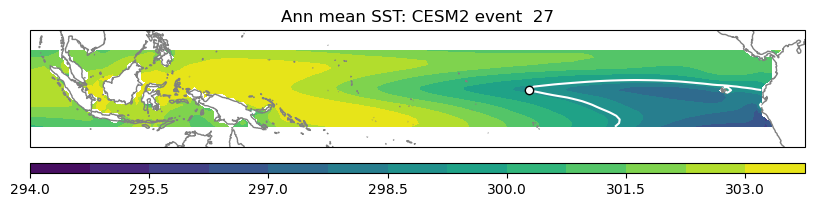

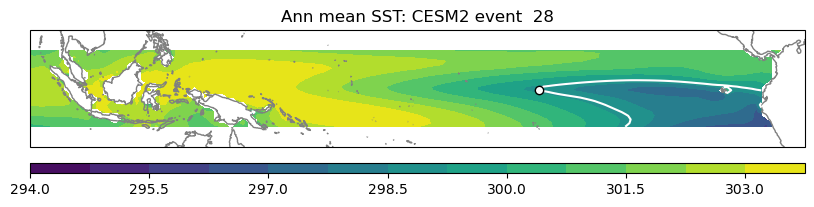

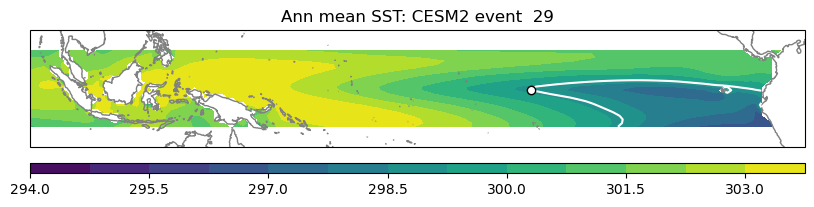

In [36]:
levs = np.arange(294,304,0.75)

lon299_cesm2 = np.full(len(sst_raw_cesm2.event.values), np.nan)

for iCase in range(len(sst_raw_cesm2.event.values)): 
    fig,axs = plt.subplots(1,1,figsize=(10,3),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
    axs.coastlines(color='grey')
    axs.set_extent([90,290,-15,15], crs=ccrs.PlateCarree())
    sst_raw_cesm2 = sst_raw_cesm2.sel(lon=slice(90,290))

    c1 = axs.contourf(sst_raw_cesm2.lon.values, sst_raw_cesm2.lat.values, sst_raw_cesm2.isel(event=iCase).mean(dim='season').values, levs, 
                transform=ccrs.PlateCarree())

    # Add colorbar 
    cax = axs.inset_axes([0, -0.23, 1, 0.09])  # THE NEW AXES, x, y, width, height,
    cbar = fig.colorbar(c1, cax = cax, orientation="horizontal")
    c2 = axs.contour(sst_raw_cesm2.lon.values, sst_raw_cesm2.lat.values, sst_raw_cesm2.isel(event=iCase).mean(dim='season').values, [290, 299], 
                     colors='white',
                     transform=ccrs.PlateCarree()) 
    
    # Add contour marker
    maybeLon = []
    maybeLat = []
    lenSeg = 0
    for iSegs in range(len(c2.allsegs[1])): 
        dat0 = c2.allsegs[1][iSegs]
        western_most_lon = np.nanmin(dat0[:,0])
        iMatchLat = np.where(dat0[:,0]==western_most_lon)[0]
        maybeLon = np.append(maybeLon, western_most_lon)
        maybeLat = np.append(maybeLat, dat0[int(iMatchLat[0]),1])
        if len(dat0)>lenSeg:
            lenSeg= len(dat0)
            iselSeg = iSegs
            
    western_most_lon = maybeLon[iselSeg]

    lon299_cesm2[iCase] = western_most_lon
    
    axs.plot(western_most_lon, maybeLat[iselSeg], 'o', alpha=1, markeredgecolor='k',
               color='white', transform=ccrs.PlateCarree(), label=sst_raw.isel(case=iCase).case.values)

    c3 = axs.contour(sst_raw_cesm2.lon.values, sst_raw_cesm2.lat.values, sst_raw_cesm2.isel(event=iCase).mean(dim='season').values, [290, 296], 
                     colors='white',
                     transform=ccrs.PlateCarree()) 


    axs.set_title('Ann mean SST: CESM2 event  '+str(iCase))
    plt.show() 


In [37]:
## CESM1 and CESM2 for nino3.4

# Mean SST in nino3.4 region
ilats = np.where((sst_raw_cesm1.lat.values>=lat_s34)  & (sst_raw_cesm1.lat.values<=lat_n34))[0]
ilons = np.where((sst_raw_cesm1.lon.values>=lon_e34)  & (sst_raw_cesm1.lon.values<=lon_w34))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_raw_cesm1.isel(lat=ilats, lon=ilons)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_nino34_cesm1 = regionTS.weighted(coswgt).mean(('lon','lat'))


# Mean SST in nino3.4 region
ilats = np.where((sst_raw_cesm2.lat.values>=lat_s34)  & (sst_raw_cesm2.lat.values<=lat_n34))[0]
ilons = np.where((sst_raw_cesm2.lon.values>=lon_e34)  & (sst_raw_cesm2.lon.values<=lon_w34))[0]

# # Compute weights and get Nino3.4 
regionTS = sst_raw_cesm2.isel(lat=ilats, lon=ilons)
coswgt   = np.cos(np.deg2rad(regionTS.lat))
sst_raw_nino34_cesm2 = regionTS.weighted(coswgt).mean(('lon','lat'))




In [38]:
djf_anoms = sst_anom_eq.sel(season='DJF', lon=slice(90,290))
djf_raw   = sst_raw_eq.sel(season='DJF', lon=slice(90,290))

djf_anom_obs = sst_anom_eq_obs.sel(season='DJF', lon=slice(90,290))
djf_raw_obs  = sst_raw_eq_obs.sel(season='DJF', lon=slice(90,290))

djf_anoms_cesm1 = sst_anom_eq_cesm1.sel(season='DJF', lon=slice(90,290))
djf_raw_cesm1   = sst_raw_eq_cesm1.sel(season='DJF', lon=slice(90,290))

djf_anoms_cesm2 = sst_anom_eq_cesm2.sel(season='DJF', lon=slice(90,290))
djf_raw_cesm2   = sst_raw_eq_cesm2.sel(season='DJF', lon=slice(90,290))


/glade/derecho/scratch/mdfowler/tmp/ipykernel_32061/1864079988.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  iKeeps = np.arange(iStart, len(djf_anoms.case.values))


Text(0.5, 1.0, 'Zonal SST Anomalies (5S-5N avg)')

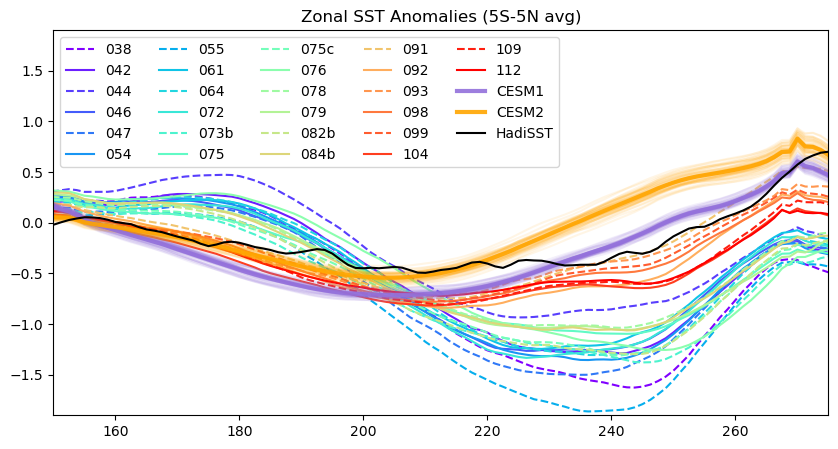

In [43]:
fig,axs = plt.subplots(1,1,figsize=(10,5))

# thisColorList = ['']

iStart = np.where(djf_anoms.case.values=='091')[0]
iKeeps = np.arange(iStart, len(djf_anoms.case.values))
refined_sel = djf_anoms.isel(case=iKeeps)

for iCase in range(len(djf_anoms.case.values)): 
    if (iCase % 2)==0:
        axs.plot(djf_anoms.lon.values, djf_anoms.isel(case=iCase).values, '--', color=colorList[iCase], label=djf_anoms.isel(case=iCase).case.values)
    else:
        axs.plot(djf_anoms.lon.values, djf_anoms.isel(case=iCase).values, '-', color=colorList[iCase], label=djf_anoms.isel(case=iCase).case.values)

for iCase in range(len(djf_anoms_cesm1.event.values)):
    axs.plot(djf_anoms_cesm1.lon.values, djf_anoms_cesm1.isel(event=iCase).values, '-', 
             color='mediumpurple', alpha=0.1)
    axs.plot(djf_anoms_cesm2.lon.values, djf_anoms_cesm2.isel(event=iCase).values, '-', 
             color='orange', alpha=0.1)

axs.plot(djf_anoms_cesm1.lon.values, djf_anoms_cesm1.mean(dim='event').values, '-', 
         color='mediumpurple', alpha=0.9, linewidth=3, label='CESM1')
axs.plot(djf_anoms_cesm2.lon.values, djf_anoms_cesm2.mean(dim='event').values, '-', 
         color='orange', alpha=0.9, linewidth=3, label='CESM2')

axs.plot(djf_anom_obs.lon.values, djf_anom_obs.values, '-',color='k',label='HadiSST')

axs.legend(ncol=5)
axs.set_ylim([-1.9, 1.9])
axs.set_xlim([150, 275])

axs.set_title('Zonal SST Anomalies (5S-5N avg)')


In [44]:
# Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', 'cividis')
# cmap = plt.get_cmap('nipy_spectral')
cmap = plt.get_cmap('rainbow')
# Number of colors to extract
num_colors = 8
# Generate evenly spaced values between 0 and 1
newcolorList = [cmap(i) for i in np.linspace(0, 1, num_colors)]

# Ensure the colors are tuples of RGBA values
# Each element in colors should be a tuple like (R, G, B, A)
newcolorList = [tuple(color) for color in newcolorList]

/glade/derecho/scratch/mdfowler/tmp/ipykernel_32061/4252229987.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  iKeeps = np.arange(iStart, len(djf_anoms.case.values))


Text(0.5, 1.0, 'Zonal SST Anomalies (5S-5N avg)')

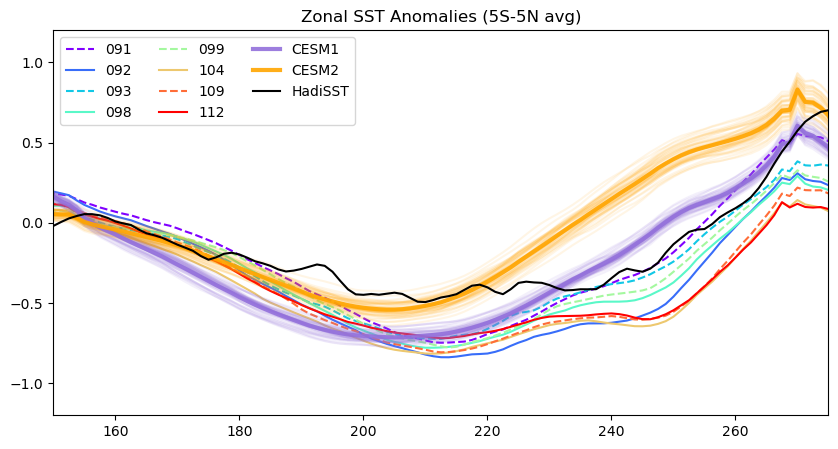

In [45]:
fig,axs = plt.subplots(1,1,figsize=(10,5))

# thisColorList = ['']

iStart = np.where(djf_anoms.case.values=='091')[0]
iKeeps = np.arange(iStart, len(djf_anoms.case.values))
refined_sel = djf_anoms.isel(case=iKeeps)

for iCase in range(len(refined_sel)): 
# for iCase in range(len(djf_anoms.case.values)): 
    # if (iCase % 2)==0:
    #     axs.plot(djf_anoms.lon.values, djf_anoms.isel(case=iCase).values, '--', color=colorList[iCase], label=djf_anoms.isel(case=iCase).case.values)
    # else:
    #     axs.plot(djf_anoms.lon.values, djf_anoms.isel(case=iCase).values, '-', color=colorList[iCase], label=djf_anoms.isel(case=iCase).case.values)
    if (iCase % 2)==0:
        axs.plot(refined_sel.lon.values, np.squeeze(refined_sel.isel(case=iCase).values), '--', color=newcolorList[iCase], label=refined_sel.isel(case=iCase).case.values)
    else:
        axs.plot(refined_sel.lon.values, np.squeeze(refined_sel.isel(case=iCase).values), '-', color=newcolorList[iCase], label=refined_sel.isel(case=iCase).case.values)

for iCase in range(len(djf_anoms_cesm1.event.values)):
    axs.plot(djf_anoms_cesm1.lon.values, djf_anoms_cesm1.isel(event=iCase).values, '-', 
             color='mediumpurple', alpha=0.1)
    axs.plot(djf_anoms_cesm2.lon.values, djf_anoms_cesm2.isel(event=iCase).values, '-', 
             color='orange', alpha=0.1)

axs.plot(djf_anoms_cesm1.lon.values, djf_anoms_cesm1.mean(dim='event').values, '-', 
         color='mediumpurple', alpha=0.9, linewidth=3, label='CESM1')
axs.plot(djf_anoms_cesm2.lon.values, djf_anoms_cesm2.mean(dim='event').values, '-', 
         color='orange', alpha=0.9, linewidth=3, label='CESM2')

axs.plot(djf_anom_obs.lon.values, djf_anom_obs.values, '-',color='k',label='HadiSST')

axs.legend(ncol=3)
axs.set_ylim([-1.2, 1.2])
axs.set_xlim([150, 275])

axs.set_title('Zonal SST Anomalies (5S-5N avg)')


Text(0.5, 1.0, 'Zonal SSTs (5S-5N avg)')

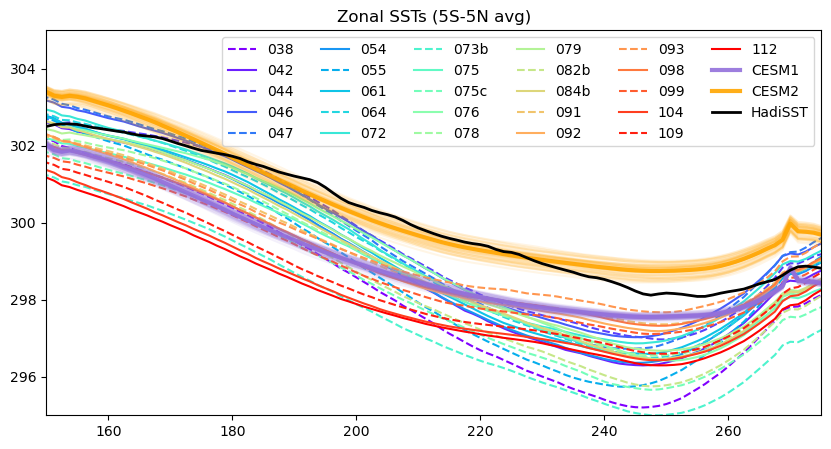

In [55]:
fig,axs = plt.subplots(1,1,figsize=(10,5))
for iCase in range(len(djf_raw.case.values)): 
    if (iCase % 2)==0:
        axs.plot(djf_raw.lon.values, djf_raw.isel(case=iCase).values, '--', color=colorList[iCase], label=djf_raw.isel(case=iCase).case.values)
    else:
        axs.plot(djf_raw.lon.values, djf_raw.isel(case=iCase).values, '-', color=colorList[iCase], label=djf_raw.isel(case=iCase).case.values)

## Add CESM1/CESM2
for iCase in range(len(djf_raw_cesm1.event.values)):
    axs.plot(djf_raw_cesm1.lon.values, djf_raw_cesm1.isel(event=iCase).values, '-', 
             color='mediumpurple', alpha=0.1)
    axs.plot(djf_raw_cesm2.lon.values, djf_raw_cesm2.isel(event=iCase).values, '-', 
             color='orange', alpha=0.1)

axs.plot(djf_raw_cesm1.lon.values, djf_raw_cesm1.mean(dim='event').values, '-', 
         color='mediumpurple', alpha=0.9, linewidth=3, label='CESM1')
axs.plot(djf_raw_cesm2.lon.values, djf_raw_cesm2.mean(dim='event').values, '-', 
         color='orange', alpha=0.9, linewidth=3, label='CESM2')

axs.plot(djf_raw_obs.lon.values, djf_raw_obs.values + 273.15, '-',color='k',linewidth=2,label='HadiSST')

axs.legend(ncol=6)
axs.set_ylim([295, 305])
axs.set_xlim([150, 275])

axs.set_title('Zonal SSTs (5S-5N avg)')


/glade/derecho/scratch/mdfowler/tmp/ipykernel_32061/2869276041.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  iKeeps = np.arange(iStart, len(djf_raw.case.values))


Text(0.5, 1.0, 'Zonal SSTs (5S-5N avg)')

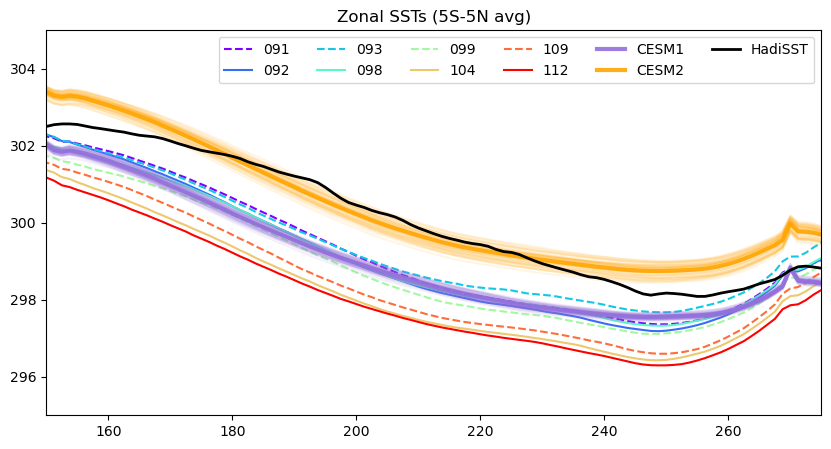

In [56]:
iStart = np.where(djf_raw.case.values=='091')[0]
iKeeps = np.arange(iStart, len(djf_raw.case.values))
refined_sel = djf_raw.isel(case=iKeeps)

fig,axs = plt.subplots(1,1,figsize=(10,5))
for iCase in range(len(refined_sel.case.values)): 
    if (iCase % 2)==0:
        axs.plot(refined_sel.lon.values, refined_sel.isel(case=iCase).values, '--', color=newcolorList[iCase], label=refined_sel.isel(case=iCase).case.values)
    else:
        axs.plot(refined_sel.lon.values, refined_sel.isel(case=iCase).values, '-', color=newcolorList[iCase], label=refined_sel.isel(case=iCase).case.values)

## Add CESM1/CESM2
for iCase in range(len(djf_raw_cesm1.event.values)):
    axs.plot(djf_raw_cesm1.lon.values, djf_raw_cesm1.isel(event=iCase).values, '-', 
             color='mediumpurple', alpha=0.1)
    axs.plot(djf_raw_cesm2.lon.values, djf_raw_cesm2.isel(event=iCase).values, '-', 
             color='orange', alpha=0.1)

axs.plot(djf_raw_cesm1.lon.values, djf_raw_cesm1.mean(dim='event').values, '-', 
         color='mediumpurple', alpha=0.9, linewidth=3, label='CESM1')
axs.plot(djf_raw_cesm2.lon.values, djf_raw_cesm2.mean(dim='event').values, '-', 
         color='orange', alpha=0.9, linewidth=3, label='CESM2')


axs.plot(djf_raw_obs.lon.values, djf_raw_obs.values + 273.15, '-',color='k',linewidth=2,label='HadiSST')

axs.legend(ncol=6)
axs.set_ylim([295, 305])
axs.set_xlim([150, 275])

axs.set_title('Zonal SSTs (5S-5N avg)')


Text(0.5, 1.0, 'Zonal Gradient in SST Anomalies (5S-5N avg)')

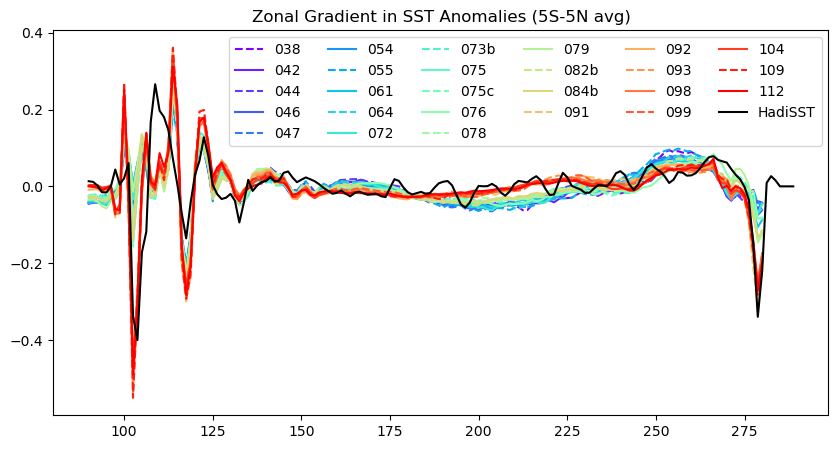

In [61]:
fig,axs = plt.subplots(1,1,figsize=(10,5))
for iCase in range(len(djf_anoms.case.values)): 
    if (iCase % 2)==0:
        axs.plot(djf_anoms.lon.values, np.gradient(djf_anoms.isel(case=iCase).values), '--', color=colorList[iCase], label=djf_anoms.isel(case=iCase).case.values)
    else:
        axs.plot(djf_anoms.lon.values, np.gradient(djf_anoms.isel(case=iCase).values), '-', color=colorList[iCase], label=djf_anoms.isel(case=iCase).case.values)

axs.plot(djf_anom_obs.lon.values, np.gradient(djf_anom_obs.values), '-',color='k',label='HadiSST')

axs.legend(ncol=6)
# axs.set_ylim([-1.9, 1.9])
axs.set_title('Zonal Gradient in SST Anomalies (5S-5N avg)')

Text(0.5, 1.0, 'Zonal Gradient in SST Anomalies (5S-5N avg)')

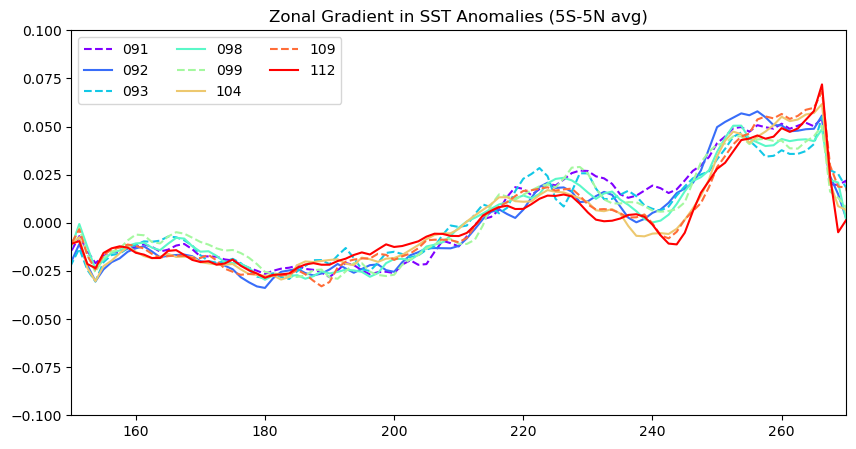

In [80]:
fig,axs = plt.subplots(1,1,figsize=(10,5))
for iCase in range(len(refined_sel.case.values)): 
    if (iCase % 2)==0:
        axs.plot(refined_sel.lon.values, np.gradient(refined_sel.isel(case=iCase).values), '--', color=colorList[iCase], label=refined_sel.isel(case=iCase).case.values)
    else:
        axs.plot(refined_sel.lon.values, np.gradient(refined_sel.isel(case=iCase).values), '-', color=colorList[iCase], label=refined_sel.isel(case=iCase).case.values)

# axs.plot(djf_anom_obs.lon.values, np.gradient(djf_anom_obs.values), '-',color='k',label='HadiSST')

axs.legend(ncol=3)
axs.set_xlim([150, 270])
axs.set_ylim([-0.1, 0.1])
axs.set_title('Zonal Gradient in SST Anomalies (5S-5N avg)')

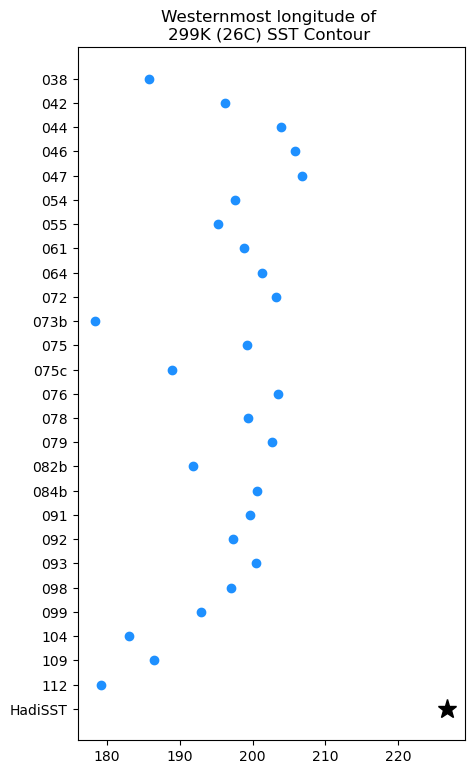

In [52]:
fig,axs=plt.subplots(1,1,figsize=(5,9))

axs.scatter(lon299, corrs.case.values, color='dodgerblue', alpha=1)
# axs[0].axhline(lonObs_zeroContour,color='k',linestyle='--')
axs.plot(lon299_obs, 'HadiSST', '*', color='k',markersize=14)
axs.set_title('Westernmost longitude of \n299K (26C) SST Contour ')
axs.invert_yaxis()
# axs[0].plot(lons_zeroContour_cesm1, np.full([len(cor_case_cesm1.event.values)], 'CESM1'), 'o', color='mediumpurple', alpha=0.4)
# axs[0].plot(lons_zeroContour_cesm2, np.full([len(cor_case_cesm2.event.values)], 'CESM2'), 'o', color='orange', alpha=0.4)



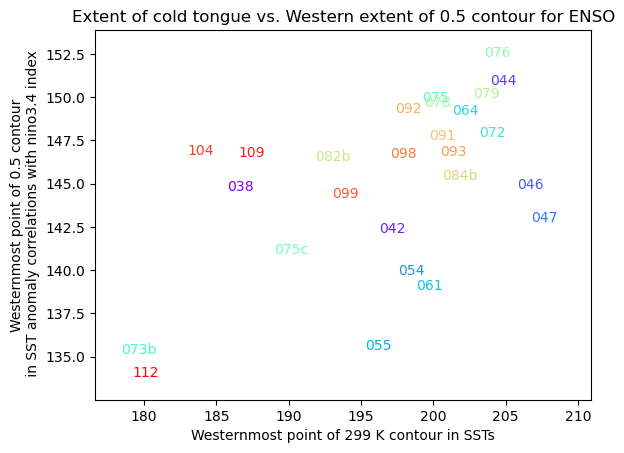

In [58]:
fig,axs = plt.subplots(1,1)

xArr = lon299
# yArr = lons_zeroContour
yArr = lons_0p5Contour

axs.set_ylim([0.99*np.min(yArr), 1.01*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr), 1.02*np.max(xArr)])

for iCase in range(len(corrs.case.values)): 
    
    axs.text(xArr[iCase], 
             yArr[iCase], 
             corrs.case.values[iCase], color=colorList[iCase])

axs.set_title('Extent of cold tongue vs. Western extent of 0.5 contour for ENSO')
axs.set_xlabel('Westernmost point of 299 K contour in SSTs')
axs.set_ylabel('Westernmost point of 0.5 contour\n in SST anomaly correlations with nino3.4 index')
# axs.axvline(lon299_obs, color='grey', alpha=0.5)
# axs.axhline(lonObs_0p5Contour, color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

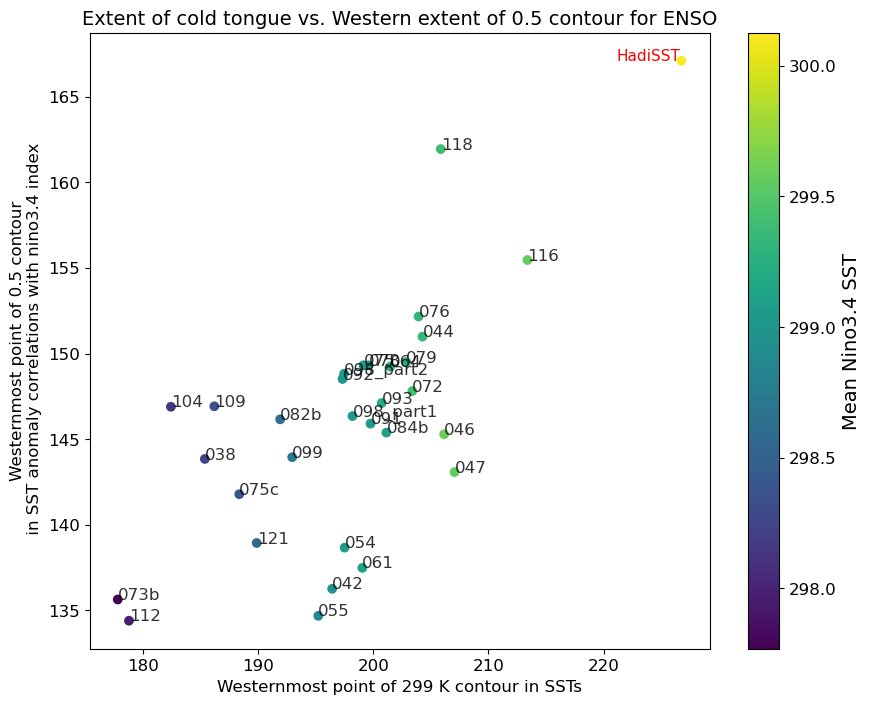

In [44]:
fig,axs = plt.subplots(1,1, figsize=(10,8))

xArr = np.append(lon299, lon299_obs)
# yArr = lons_zeroContour
yArr = np.append(lons_0p5Contour, lonObs_0p5Contour)
cArr = np.append(sst_raw_nino34.mean(dim='season').values, (sst_obs_raw_nino34.mean(dim='season').values + 273.15) )
caseLabels = np.append(corrs.case.values, 'HadiSST')
axs.tick_params(labelsize=12)  # Adjust 12 to your desired tick font size

# axs.set_ylim([0.99*np.min(yArr), 1.01*np.max(yArr)])
# axs.set_xlim([0.99*np.min(xArr), 1.02*np.max(xArr)])

s = axs.scatter(xArr, yArr, c=cArr)
cb = fig.colorbar(s,ax=axs,orientation='vertical')
cb.set_label('Mean Nino3.4 SST', size=14)
cb.ax.tick_params(labelsize=12)  # Adjust 12 to your desired tick font size

for iCase in range(len(xArr)): 
    if caseLabels[iCase]=='HadiSST':
        axs.text(xArr[iCase]*0.975, 
                 yArr[iCase], 
                 # corrs.case.values[iCase], color='k', alpha=0.5, fontsize=11)
                 caseLabels[iCase], color='r', fontsize=11)
    else: 
        axs.text(xArr[iCase], 
                 yArr[iCase], 
                 # corrs.case.values[iCase], color='k', alpha=0.5, fontsize=11)
                 caseLabels[iCase], color='k', alpha=0.8, fontsize=12)


# ## Add CESM1?
# s_cesm1 = axs.scatter(lon299_cesm1, lons_0p5Contour_cesm1, c=sst_raw_nino34_cesm1.mean(dim='season').values, marker='^')
# s_cesm2 = axs.scatter(lon299_cesm2, lons_0p5Contour_cesm2, c=sst_raw_nino34_cesm2.mean(dim='season').values, marker='s')


axs.set_title('Extent of cold tongue vs. Western extent of 0.5 contour for ENSO',fontsize=14)
axs.set_xlabel('Westernmost point of 299 K contour in SSTs',fontsize=12)
axs.set_ylabel('Westernmost point of 0.5 contour\n in SST anomaly correlations with nino3.4 index', fontsize=12)
# axs.axvline(lon299_obs, color='grey', alpha=0.5)
# axs.axhline(lonObs_0p5Contour, color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

In [ ]:
## Figure out western-most longitude of zero contour in pacific 
fig,axs = plt.subplots(2,1,figsize=(20,7),subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs     = axs.ravel()


## - - - - - - - - - - - - -
## Plot zero contours
## - - - - - - - - - - - - -
axs[0].coastlines(color='grey')
axs[0].set_extent([90,220,-15,15], crs=ccrs.PlateCarree())
lons_zeroContour = np.full([len(corrs.case.values)], np.nan)
lons_zeroContour_cesm1 = np.full([len(cor_case_cesm1.event.values)], np.nan)
lons_zeroContour_cesm2 = np.full([len(cor_case_cesm2.event.values)], np.nan)

# Plot obs value 
cor_obs_sel = cor_obs.sel(lon=slice(136,300))
# cor_obs_sel = cor_obs_sel.sel(lat=slice(-5,5))
contours = find_contours(cor_obs_sel.values, level=0)

western_most_point_case = None
inflection_lon = np.inf

for contour in contours:
    for ipoint in range(len(contour)):
        lat_index, lon_index = contour[ipoint]
        lon = cor_obs_sel['lon'].values[int(lon_index)]
        lat = cor_obs_sel['lat'].values[int(lat_index)]
        # print(lat,lon)

        if lon<inflection_lon:
            inflection_lon = lon
        elif lon>inflection_lon:
            lat_index, lon_index = contour[ipoint-1]
            lon = cor_obs_sel['lon'].values[int(lon_index)]
            western_most_point_case = (cor_obs_sel['lat'].values[int(lat_index)], lon)
            break 
                
axs[0].plot(lon, cor_obs_sel['lat'].values[int(lat_index)], '*', color='k',markersize=9, transform=ccrs.PlateCarree())
lonObs_zeroContour = lon
sstAnom_obs_zeroContour = sstObs_anom.sel(lon=lon, lat=cor_obs_sel['lat'].values[int(lat_index)]).mean(dim='time')
sstAnomMax_obs = sstObs_anom.max()
print(sstAnomMax_obs.values)

## Plot case values too 
## - - - - - - - - - - - - -
for iCase in range(len(corrs.case.values)):
    cor_case = corrs.isel(case=iCase)
    corrs_sel = cor_case.sel(lon=slice(120,300))
    corrs_sel = corrs_sel.sel(lat=slice(-5,5))
    contours = find_contours(corrs_sel.values, level=0)
    
    western_most_point_case = None
    inflection_lon = np.inf
    
    for contour in contours:
        for ipoint in range(len(contour)):
            lat_index, lon_index = contour[ipoint]
            lon = corrs_sel['lon'].values[int(lon_index)]
            lat = corrs_sel['lat'].values[int(lat_index)]
            # print(lat,lon)
    
            if lon<inflection_lon:
                inflection_lon = lon
            elif lon>inflection_lon:
                lat_index, lon_index = contour[ipoint-1]
                lon = corrs_sel['lon'].values[int(lon_index)]
                western_most_point_case = (corrs_sel['lat'].values[int(lat_index)], lon)
                break 
                    
    # print(f"Western-most point in case: {western_most_point_case}")
    axs[0].plot(lon, corrs_sel['lat'].values[int(lat_index)], 'o', alpha=1, markeredgecolor='k',
                color=np.asarray(colorList[iCase]), transform=ccrs.PlateCarree(), label=cor_case.case.values)
    # axs[0].text(lon, corrs_sel['lat'].values[int(lat_index)], corrs.isel(case=iCase).case.values, color=np.asarray(colorList[iCase]),
    #             transform=ccrs.PlateCarree())
    
    lons_zeroContour[iCase] = lon


## Plot case values from PI  ens 
## - - - - - - - - - - - - -
for iCase in range(len(cor_case_cesm2.event.values)):
    ## CESM1
    cor_cesm1 = cor_case_cesm1.isel(event=iCase)
    corrs_sel = cor_cesm1.sel(lon=slice(120,300))
    corrs_sel = corrs_sel.sel(lat=slice(-5,5))
    contours = find_contours(corrs_sel.values, level=0)
    
    western_most_point_case = None
    inflection_lon = np.inf
    
    for contour in contours:
        for ipoint in range(len(contour)):
            lat_index, lon_index = contour[ipoint]
            lon = corrs_sel['lon'].values[int(lon_index)]
            lat = corrs_sel['lat'].values[int(lat_index)]
            # print(lat,lon)
    
            if lon<inflection_lon:
                inflection_lon = lon
            elif lon>inflection_lon:
                lat_index, lon_index = contour[ipoint-1]
                lon = corrs_sel['lon'].values[int(lon_index)]
                western_most_point_case = (corrs_sel['lat'].values[int(lat_index)], lon)
                break 
                    
    # print(f"Western-most point in case: {western_most_point_case}")
    axs[0].plot(lon, corrs_sel['lat'].values[int(lat_index)], 'o', alpha=0.4, markeredgecolor='k',
                color='mediumpurple', transform=ccrs.PlateCarree())
    # axs[0].text(lon, corrs_sel['lat'].values[int(lat_index)], corrs.isel(case=iCase).case.values, color=np.asarray(colorList[iCase]),
    #             transform=ccrs.PlateCarree())
    
    lons_zeroContour_cesm1[iCase] = lon


    ## CESM2
    cor_cesm2 = cor_case_cesm2.isel(event=iCase)
    corrs_sel = cor_cesm2.sel(lon=slice(120,300))
    corrs_sel = corrs_sel.sel(lat=slice(-5,5))
    contours = find_contours(corrs_sel.values, level=0)
    
    western_most_point_case = None
    inflection_lon = np.inf
    
    for contour in contours:
        for ipoint in range(len(contour)):
            lat_index, lon_index = contour[ipoint]
            lon = corrs_sel['lon'].values[int(lon_index)]
            lat = corrs_sel['lat'].values[int(lat_index)]
            # print(lat,lon)
    
            if lon<inflection_lon:
                inflection_lon = lon
            elif lon>inflection_lon:
                lat_index, lon_index = contour[ipoint-1]
                lon = corrs_sel['lon'].values[int(lon_index)]
                western_most_point_case = (corrs_sel['lat'].values[int(lat_index)], lon)
                break 
                    
    # print(f"Western-most point in case: {western_most_point_case}")
    axs[0].plot(lon, corrs_sel['lat'].values[int(lat_index)], 'o', alpha=0.4, markeredgecolor='k',
                color='dimgrey', transform=ccrs.PlateCarree())
    # axs[0].text(lon, corrs_sel['lat'].values[int(lat_index)], corrs.isel(case=iCase).case.values, color=np.asarray(colorList[iCase]),
    #             transform=ccrs.PlateCarree())
    
    lons_zeroContour_cesm2[iCase] = lon

axs[0].plot(np.nanmean(lons_zeroContour_cesm1), cor_obs_sel['lat'].values[int(lat_index)], 's', color='mediumpurple', markersize=9, transform=ccrs.PlateCarree())
axs[0].plot(np.nanmean(lons_zeroContour_cesm2), cor_obs_sel['lat'].values[int(lat_index)], 's', color='dimgrey', markersize=9, transform=ccrs.PlateCarree())

axs[0].set_title('Westernmost point of 0 contour related to Nino 3.4 max')
axs[0].legend(ncol=5,fontsize=9)


Text(0.72, 0.5, 'East Pacific')

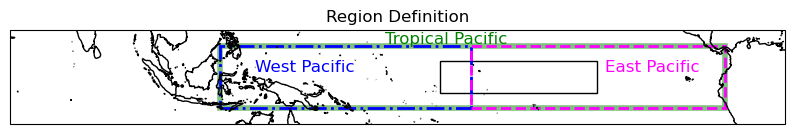

In [289]:
fig,axs = plt.subplots(1,1, figsize=(10,11), subplot_kw={"projection":ccrs.PlateCarree(central_longitude=210)})
axs.coastlines()     
axs.set_extent([53,300,-15,15], crs=ccrs.PlateCarree())

axs.add_patch(patches.Rectangle(xy=[lon_e34, lat_s34], width=(lon_w34-lon_e34), height=(lat_n34-lat_s34),
                            facecolor='none', edgecolor='k',linestyle='-',
                            linewidth=1, transform=ccrs.PlateCarree()))

# Full Pacific
axs.add_patch(patches.Rectangle(xy=[120, -10], width=(281-120), height=20,
                            facecolor='none', edgecolor='green',linestyle='-',alpha=0.5,
                            linewidth=4, transform=ccrs.PlateCarree()))
plt.gcf().text(0.5, 0.5255, 'Tropical Pacific', fontsize=12, color='green')

# # SCS
# axs.add_patch(patches.Rectangle(xy=[100, -10], width=(150-120), height=20,
#                             facecolor='none', edgecolor='orangered',linestyle='-',
#                             linewidth=1, transform=ccrs.PlateCarree()))

# West Pacific
axs.add_patch(patches.Rectangle(xy=[120, -10], width=(200-120), height=20,
                            facecolor='none', edgecolor='blue',linestyle='-.',
                            linewidth=2, transform=ccrs.PlateCarree()))
plt.gcf().text(0.37, 0.5, 'West Pacific', fontsize=12, color='blue')

# East Pacific
axs.add_patch(patches.Rectangle(xy=[200, -10], width=(281-200), height=20,
                            facecolor='none', edgecolor='magenta',linestyle='--',
                            linewidth=2, transform=ccrs.PlateCarree()))

axs.set_title('Region Definition')
plt.gcf().text(0.72, 0.5, 'East Pacific', fontsize=12, color='magenta')



In [290]:
# df_sel = df_table.drop([0,1,2,3,10])

iKeep_corrs = np.where(corrs.case.values!='067.')[0]

lons_zeroContour_match = lons_zeroContour[iKeep_corrs]
lons_0p5Contour_match = lons_0p5Contour[iKeep_corrs]
numMonthsAboveLimit_match   = numMonthsAboveLimit[iKeep_corrs]
# seasonality_cases_match = seasonality_cases[iKeep_corrs]
corrs_case_match = corrs.case.values[iKeep_corrs]



In [295]:
# # Full Pacific (green region) 
# lat_s = -10
# lat_n = 10
# lon_w = 120
# lon_e = 280
# titleString = 'Means computed over tropical Pacific'

# # West Pacific (blue region) 
# lat_s = -10
# lat_n = 10
# lon_w = 120
# lon_e = 200
# titleString = 'Means computed over tropical West Pacific'

# East Pacific (purple region) 
lat_s = -10
lat_n = 10
lon_w = 200
lon_e = 281
titleString = 'Means computed over tropical East Pacific'

# Select region and get mean
sst_bias_region = sst_bias.sel(lat=slice(lat_s,lat_n), lon=slice(lon_w,lon_e))
coswgt_region   = np.cos(np.deg2rad(sst_bias_region.lat))
bias_mean       = sst_bias_region.weighted(coswgt).mean(('lon','lat'))

# bias_mean_match = bias_mean.isel(case=iKeep_corrs)

## Get regional mean in CESM1/2 too 
# sst_bias_cesm1_region = sst_bias_cesm1.sel(lat=slice(lat_s,lat_n), lon=slice(lon_w,lon_e))
# coswgt_cesm1_region   = np.cos(np.deg2rad(sst_bias_cesm1_region.lat))
# bias_mean_cesm1       = sst_bias_cesm1_region.weighted(coswgt_cesm1_region).mean(('lon','lat'))

# sst_bias_cesm2_region = sst_bias_cesm2.sel(lat=slice(lat_s,lat_n), lon=slice(lon_w,lon_e))
# coswgt_cesm2_region   = np.cos(np.deg2rad(sst_bias_cesm2_region.lat))
# bias_mean_cesm2       = sst_bias_cesm2_region.weighted(coswgt_cesm2_region).mean(('lon','lat'))



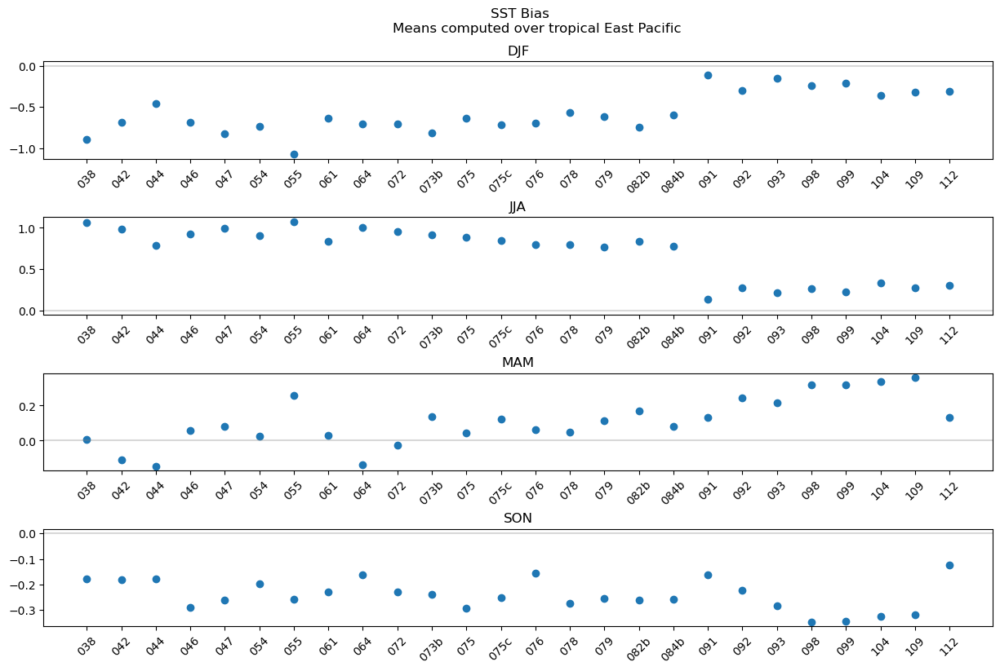

In [296]:
fig,axs = plt.subplots(4,1,figsize=(15,9))
axs = axs.ravel()

plt.gcf().text(0.49, 0.94, 'SST Bias', fontsize=12, color='k')
plt.gcf().text(0.41, 0.92, titleString, fontsize=12, color='k')

for iSeason in range(4):
    # axs[iSeason].scatter(corrs_case_match, bias_mean_match.isel(season=iSeason))
    # axs[iSeason].plot(np.full([nSamples], 'CESM1'), bias_mean_cesm1.isel(season=iSeason), 'o', alpha=0.4, color='mediumpurple')
    # axs[iSeason].plot(np.full([nSamples], 'CESM2'), bias_mean_cesm2.isel(season=iSeason), 'o', alpha=0.4, color='orange')

    axs[iSeason].scatter(corrs.case.values, bias_mean.isel(season=iSeason))

    
    # axs[iSeason].set_title(bias_mean_match.isel(season=iSeason).season.values)
    axs[iSeason].set_title(bias_mean.isel(season=iSeason).season.values)

    axs[iSeason].axhline(0,color='grey',alpha=0.3)
    
    plt.setp( axs[iSeason].xaxis.get_majorticklabels(), rotation=45 )


fig.subplots_adjust(hspace=0.6)

In [297]:
seasonsel = 'DJF'
xVar = bias_mean_match.sel(season=seasonsel).values 

corrArr = np.arange(len(corrs_case_match))

fig,axs = plt.subplots(3,2, figsize=(10,12))
axs = axs.ravel()

plt.gcf().text(0.4, 0.9, titleString, fontsize=12, color='k')

axs[0].scatter(xVar, lons_zeroContour_match)
# axs[0].scatter(xVar, lons_zeroContour_match, c=corrArr, cmap='turbo')
# axs[0].axhline(lonObs_zeroContour, color='k',alpha=0.5,linestyle='--')
axs[0].set_ylabel('Westernmost longitude of the \n0 contour in lag plots')
axs[0].set_xlabel('SST Bias ('+seasonsel+')')

axs[1].scatter(xVar, lons_0p5Contour_match)
# axs[1].scatter(xVar, lons_0p5Contour_match, c=corrArr, cmap='turbo')
# axs[1].axhline(lonObs_0p5Contour, color='k',alpha=0.5,linestyle='--')
axs[1].set_ylabel('Westernmost longitude of the \n0.5 contour in lag plots')
axs[1].set_xlabel('SST Bias ('+seasonsel+')')

axs[2].scatter(xVar, numMonthsAboveLimit_match)
# axs[2].scatter(xVar, numMonthsAboveLimit_match, c=corrArr, cmap='turbo')
# axs[2].axhline(numMonthsAboveLimit_obs, color='k',alpha=0.5,linestyle='--')
axs[2].set_ylabel('ENSO Duration (months)')
axs[2].set_xlabel('SST Bias ('+seasonsel+')')

axs[3].scatter(xVar, seasonality_cases_match)
# axs[3].scatter(xVar, seasonality_cases_match, c=corrArr, cmap='turbo')
# axs[3].axhline(seasonality_obs, color='k',alpha=0.5,linestyle='--')
axs[3].set_ylabel('ENSO Seasonaltiy (ratio)')
axs[3].set_xlabel('SST Bias ('+seasonsel+')')

axs[4].scatter(xVar, df_sel['Value of min variance'].values)
# axs[4].scatter(xVar, df_sel['Value of min variance'].values, c=corrArr, cmap='turbo')
axs[4].set_ylabel('Value of min SST variance (deg)')
axs[4].set_xlabel('SST Bias ('+seasonsel+')')

valArray = df_sel['Value of max variance'].copy()
valArray[valArray=='>3'] = '3'
axs[5].scatter(xVar, valArray.values.astype(float))
# axs[5].scatter(xVar, valArray.values.astype(float), c=corrArr, cmap='turbo')
axs[5].set_ylabel('Value of max SST variance (deg)')
axs[5].set_xlabel('SST Bias ('+seasonsel+')')

fig.subplots_adjust(wspace=0.3, hspace=0.3)

NameError: name 'bias_mean_match' is not defined

NameError: name 'seasonality_cases_match' is not defined

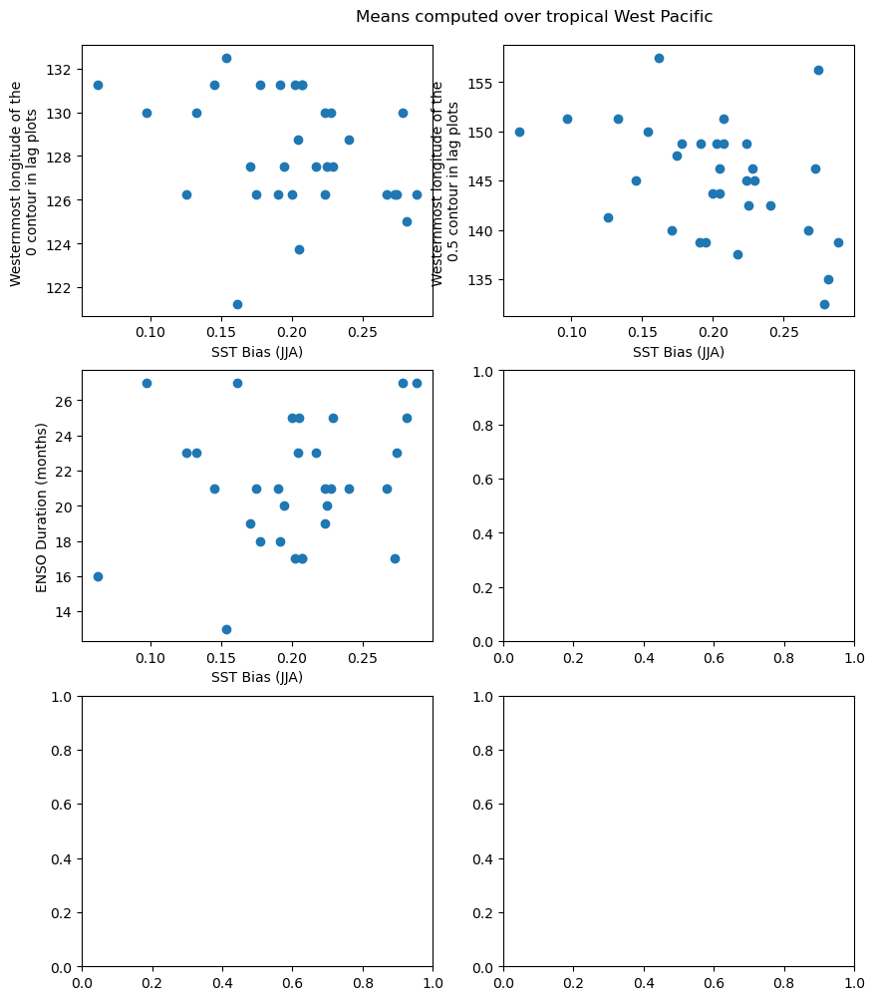

In [92]:
seasonsel = 'JJA'
xVar = bias_mean_match.sel(season=seasonsel).values 

fig,axs = plt.subplots(3,2, figsize=(10,12))
axs = axs.ravel()

plt.gcf().text(0.4, 0.9, titleString, fontsize=12, color='k')

axs[0].scatter(xVar, lons_zeroContour_match)
# axs[0].axhline(lonObs_zeroContour, color='k',alpha=0.5,linestyle='--')
axs[0].set_ylabel('Westernmost longitude of the \n0 contour in lag plots')
axs[0].set_xlabel('SST Bias ('+seasonsel+')')

axs[1].scatter(xVar, lons_0p5Contour_match)
# axs[1].axhline(lonObs_0p5Contour, color='k',alpha=0.5,linestyle='--')
axs[1].set_ylabel('Westernmost longitude of the \n0.5 contour in lag plots')
axs[1].set_xlabel('SST Bias ('+seasonsel+')')

axs[2].scatter(xVar, numMonthsAboveLimit_match)
# axs[2].axhline(numMonthsAboveLimit_obs, color='k',alpha=0.5,linestyle='--')
axs[2].set_ylabel('ENSO Duration (months)')
axs[2].set_xlabel('SST Bias ('+seasonsel+')')

axs[3].scatter(xVar, seasonality_cases_match)
# axs[3].axhline(seasonality_obs, color='k',alpha=0.5,linestyle='--')
axs[3].set_ylabel('ENSO Seasonaltiy (ratio)')
axs[3].set_xlabel('SST Bias ('+seasonsel+')')

axs[4].scatter(xVar, df_sel['Value of min variance'].values)
axs[4].set_ylabel('Value of min SST variance (deg)')
axs[4].set_xlabel('SST Bias ('+seasonsel+')')

valArray = df_sel['Value of max variance'].copy()
valArray[valArray=='>3'] = '3'
axs[5].scatter(xVar, valArray.values.astype(float))
axs[5].set_ylabel('Value of max SST variance (deg)')
axs[5].set_xlabel('SST Bias ('+seasonsel+')')

fig.subplots_adjust(wspace=0.3, hspace=0.3)

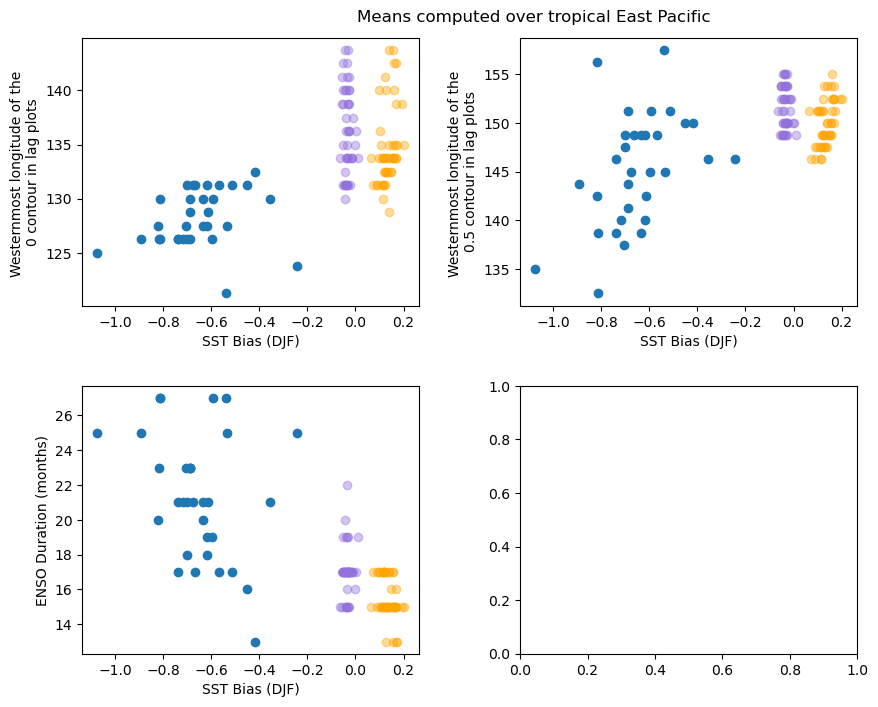

In [96]:
seasonsel = 'DJF'
xVar = bias_mean_match.sel(season=seasonsel).values 
xVar_cesm1 = bias_mean_cesm1.sel(season=seasonsel).values 
xVar_cesm2 = bias_mean_cesm2.sel(season=seasonsel).values 

fig,axs = plt.subplots(2,2, figsize=(10,8))
axs = axs.ravel()

plt.gcf().text(0.4, 0.9, titleString, fontsize=12, color='k')

axs[0].scatter(xVar, lons_zeroContour_match)
axs[0].scatter(xVar_cesm1, lons_zeroContour_cesm1,color='mediumpurple',alpha=0.4)
axs[0].scatter(xVar_cesm2, lons_zeroContour_cesm2,color='orange',alpha=0.4)
# axs[0].axhline(lonObs_zeroContour, color='k',alpha=0.5,linestyle='--')
axs[0].set_ylabel('Westernmost longitude of the \n0 contour in lag plots')
axs[0].set_xlabel('SST Bias ('+seasonsel+')')

axs[1].scatter(xVar, lons_0p5Contour_match)
axs[1].scatter(xVar_cesm1, lons_0p5Contour_cesm1,color='mediumpurple',alpha=0.4)
axs[1].scatter(xVar_cesm2, lons_0p5Contour_cesm2,color='orange',alpha=0.4)
# axs[1].axhline(lonObs_0p5Contour, color='k',alpha=0.5,linestyle='--')
axs[1].set_ylabel('Westernmost longitude of the \n0.5 contour in lag plots')
axs[1].set_xlabel('SST Bias ('+seasonsel+')')

axs[2].scatter(xVar, numMonthsAboveLimit_match)
axs[2].scatter(xVar_cesm1, numMonthsAboveLimit_cesm1,color='mediumpurple',alpha=0.4)
axs[2].scatter(xVar_cesm2, numMonthsAboveLimit_cesm2,color='orange',alpha=0.4)
# axs[2].axhline(numMonthsAboveLimit_obs, color='k',alpha=0.5,linestyle='--')
axs[2].set_ylabel('ENSO Duration (months)')
axs[2].set_xlabel('SST Bias ('+seasonsel+')')

# axs[3].scatter(xVar, seasonality_cases_match)
# # axs[3].axhline(seasonality_obs, color='k',alpha=0.5,linestyle='--')
# axs[3].set_ylabel('ENSO Seasonaltiy (ratio)')
# axs[3].set_xlabel('SST Bias ('+seasonsel+')')


fig.subplots_adjust(wspace=0.3, hspace=0.3)

## Read in climo's 

In [35]:
# climoVar_list = ['LHFLX','SHFLX','LWCF','SWCF','PRECT','PS','OMEGA500','SST','TAUX','TAUY','TGCLDLWP','U10','TREFHT']
# climoVar_list = ['LHFLX','SHFLX','LWCF','SWCF','PRECT','PS','SST','TAUX','TAUY','TGCLDLWP','U10','TREFHT','LANDFRAC','OCNFRAC']
climoVar_list = ['LHFLX','SHFLX','LWCF','SWCF','PRECT','PS','TAUX','TAUY','TGCLDLWP','U10','TREFHT','LANDFRAC','OCNFRAC']

climo_dir = '/glade/campaign/cgd/amp/amwg/climo/'

caseNames = [
       'b.e23_alpha16b.BLT1850.ne30_t232.038',
       'b.e23_alpha16b.BLT1850.ne30_t232.042',
       'b.e23_alpha16b.BLT1850.ne30_t232.044',
       'b.e23_alpha16b.BLT1850.ne30_t232.046',
       'b.e23_alpha16b.BLT1850.ne30_t232.047',
       # 'b.e23_alpha16b.BLT1850.ne30_t232.048',
       'b.e23_alpha16b.BLT1850.ne30_t232.054',
       'b.e23_alpha16g.BLT1850.ne30_t232.055',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.058',
       'b.e23_alpha16g.BLT1850.ne30_t232.061',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.063',
       'b.e23_alpha16g.BLT1850.ne30_t232.064',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.064b',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.064c',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.067',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.070',
       'b.e23_alpha16g.BLT1850.ne30_t232.072',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.073',
       'b.e23_alpha16g.BLT1850.ne30_t232.073b',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.074',
       'b.e23_alpha16g.BLT1850.ne30_t232.075',
       'b.e23_alpha16g.BLT1850.ne30_t232.075c',
       'b.e23_alpha16g.BLT1850.ne30_t232.076',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.078',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.078b',
       'b.e23_alpha16g.BLT1850.ne30_t232.079',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.080',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.081b',
       'b.e23_alpha16g.BLT1850.ne30_t232.082b',
       # 'b.e23_alpha16g.BLT1850.ne30_t232.083b',
       'b.e23_alpha16g.BLT1850.ne30_t232.084b',
       'b.e23_alpha17f.BLT1850.ne30_t232.091',
       'b.e23_alpha17f.BLT1850.ne30_t232.092',
       'b.e23_alpha17f.BLT1850.ne30_t232.093',
       'b.e23_alpha17f.BLT1850.ne30_t232.098',
       'b.e23_alpha17f.BLT1850.ne30_t232.099',
       # 'b.e23_alpha17f.BLT1850.ne30_t232.100',
       # 'b.e23_alpha17f.BLT1850.ne30_t232.101',
       # 'b.e23_alpha17f.BLT1850.ne30_t232.102', 
       'b.e30_beta02.BLT1850.ne30_t232.103',
       'b.e30_beta02.BLT1850.ne30_t232.104',
       'b.e30_beta02.BLT1850.ne30_t232.109',
       'b.e30_alpha03d.BLT1850.ne30_t232_wgx3.112',
]

for iCase in range(len(caseNames)):
    # Not all cases have same climo years, so want to pick first set here
    yrFolder = np.sort(glob.glob(climo_dir+caseNames[iCase]+'/*'))
    if len(yrFolder)==1: 
        path1 = str(yrFolder[0])+'/'
    elif len(yrFolder)>1: 
        path1 = str(yrFolder[-1])+'/'

    listFiles = np.sort(glob.glob(path1+'*.nc'))

    ds = xr.open_mfdataset(listFiles)[climoVar_list]

    # Add short alias for case ID
    x = re.search(".ne30_t232.", caseNames[iCase])
    caseID = caseNames[iCase][x.span()[-1]::]
    caseDS = ds.squeeze().assign_coords({"case":  caseID})

    if ((caseID=='091') | (caseID=='092')):
        caseDS['lat']  = allCases.isel(case=iCase-1).lat.values
        caseDS['lon']  = allCases.isel(case=iCase-1).lon.values

    # Combine into single DS
    if iCase==0: 
        allCases = caseDS
    else: 
        allCases = xr.concat([allCases, caseDS], "case") 

    print('Done with case %i of %i' % (iCase+1, len(caseNames)))

Done with case 1 of 26
Done with case 2 of 26
Done with case 3 of 26
Done with case 4 of 26
Done with case 5 of 26
Done with case 6 of 26
Done with case 7 of 26
Done with case 8 of 26
Done with case 9 of 26
Done with case 10 of 26
Done with case 11 of 26
Done with case 12 of 26
Done with case 13 of 26
Done with case 14 of 26
Done with case 15 of 26
Done with case 16 of 26
Done with case 17 of 26
Done with case 18 of 26
Done with case 19 of 26
Done with case 20 of 26
Done with case 21 of 26
Done with case 22 of 26
Done with case 23 of 26
Done with case 24 of 26
Done with case 25 of 26
Done with case 26 of 26


In [91]:
allCases

<xarray.Dataset>
Dimensions:   (case: 9, time: 12, lat: 192, lon: 288)
Coordinates:
  * lat       (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.3 357.5 358.8
  * time      (time) datetime64[ns] 1850-01-15 1850-02-14 ... 1850-12-11
  * case      (case) <U4 '082b' '083b' '091' '092' '093' '098' '103' '104' '109'
Data variables: (12/13)
    LHFLX     (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    SHFLX     (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    LWCF      (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    SWCF      (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    PRECT     (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    PS        (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    ...        ...
    TAUY      (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    TGCLDLWP  (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    U10       (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    TREFHT    (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    LANDFRAC  (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
    OCNFRAC   (case, time, lat, lon) float32 dask.array<chunksize=(1, 12, 192, 288), meta=np.ndarray>
Attributes:
    interp_type:       bilinear
    interp_outputgri:  equally spaced with poles
    Conventions:       CF-1.0
    source:            CAM
    case:              b.e23_alpha16g.BLT1850.ne30_t232.082b
    logname:           hannay
    host:              derecho2
    initial_file:      b.e23_alpha16g.BLT1850.ne30_t232.075.cam.i.0101-01-01-...
    topography_file:   /glade/campaign/cgd/amp/pel/topo/files/se/ne30pg3_gmte...
    model_doi_url:     not_set
    time_period_freq:  month_1

In [38]:
allCases['time'] = pd.date_range(start="1850-01-15",end="1850-12-15", freq="30D")

In [301]:
np.shape(ocnMask_expanded)

(47, 600, 22, 288)

In [39]:
## Create some (ocean) means over each domain 

iLons_fullPac = np.where((corrs.lon.values>=120) & (corrs.lon.values<=281))[0]
iLats_fullPac = np.where((corrs.lat.values>=-10) & (corrs.lat.values<=10))[0]
ocnMask_all   = ocnMask_expanded[:,:,:,iLons_fullPac]
ocnMask_all   = ocnMask_all[:,:,iLats_fullPac,:]
ocnMask_all   = ocnMask_all[0:len(allCases.case.values), 0:12,:,:]

iLons_eastPac = np.where((corrs.lon.values>=200) & (corrs.lon.values<=281))[0]
iLats_eastPac = np.where((corrs.lat.values>=-10) & (corrs.lat.values<=10))[0]
ocnMask_east   = ocnMask_expanded[:,:,:,iLons_eastPac]
ocnMask_east   = ocnMask_east[:,:,iLats_eastPac,:]
ocnMask_east   = ocnMask_east[0:len(allCases.case.values), 0:12,:,:]

iLons_westPac = np.where((corrs.lon.values>=120) & (corrs.lon.values<=200))[0]
iLats_westPac = np.where((corrs.lat.values>=-10) & (corrs.lat.values<=10))[0]
ocnMask_west   = ocnMask_expanded[:,:,:,iLons_westPac]
ocnMask_west   = ocnMask_west[:,:,iLats_westPac,:]
ocnMask_west   = ocnMask_west[0:len(allCases.case.values), 0:12,:,:]

tropPacific_all_DS  = allCases.sel(lat=slice(-10,10), lon=slice(120,281)) * ocnMask_all
tropPacific_west_DS = allCases.sel(lat=slice(-10,10), lon=slice(120,200)) * ocnMask_west
tropPacific_east_DS = allCases.sel(lat=slice(-10,10), lon=slice(200,281)) * ocnMask_east

coswgt   = np.cos(np.deg2rad(tropPacific_all_DS.lat))

tropPacific_all_DS_mean   = tropPacific_all_DS.weighted(coswgt).mean(('lon','lat'))
tropPacific_west_DS_mean  = tropPacific_west_DS.weighted(coswgt).mean(('lon','lat'))
tropPacific_east_DS_mean  = tropPacific_east_DS.weighted(coswgt).mean(('lon','lat'))


## Seasonal averages? 
# Get seasonal means 
month_length = tropPacific_all_DS_mean.time.dt.days_in_month
weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum() )
weights_all = ( month_length/ month_length.sum() )

# seasonal_tropPacific_all  = tropPacific_all_DS_mean.groupby('time.season').mean(dim='time')
# seasonal_tropPacific_west = tropPacific_west_DS_mean.groupby('time.season').mean(dim='time')
# seasonal_tropPacific_east = tropPacific_east_DS_mean.groupby('time.season').mean(dim='time')
seasonal_tropPacific_all  = (tropPacific_all_DS_mean*weights).groupby('time.season').sum(dim='time')
seasonal_tropPacific_west = (tropPacific_west_DS_mean*weights).groupby('time.season').sum(dim='time')
seasonal_tropPacific_east = (tropPacific_east_DS_mean*weights).groupby('time.season').sum(dim='time')


annual_tropPacific_all   = (tropPacific_all_DS_mean*weights_all).sum(dim='time')
annual_tropPacific_west  = (tropPacific_west_DS_mean*weights_all).sum(dim='time')
annual_tropPacific_east  = (tropPacific_east_DS_mean*weights_all).sum(dim='time')


In [49]:
np.shape(iLons_westPac)

(64,)

In [40]:
## will need to drop cases that don't have climo read in above: 

iKeeps = np.where( (corrs.case.values!='064b') &  (corrs.case.values!='064c') &  
                   (corrs.case.values!='078.') & (corrs.case.values!='HIST_104.'))[0]


In [41]:
# Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', 'cividis')
# cmap = plt.get_cmap('nipy_spectral')
cmap = plt.get_cmap('rainbow')
# Number of colors to extract
num_colors = len(corrs.case.values[iKeeps])
# Generate evenly spaced values between 0 and 1
colorList = [cmap(i) for i in np.linspace(0, 1, num_colors)]

# Ensure the colors are tuples of RGBA values
# Each element in colors should be a tuple like (R, G, B, A)
colorList = [tuple(color) for color in colorList]


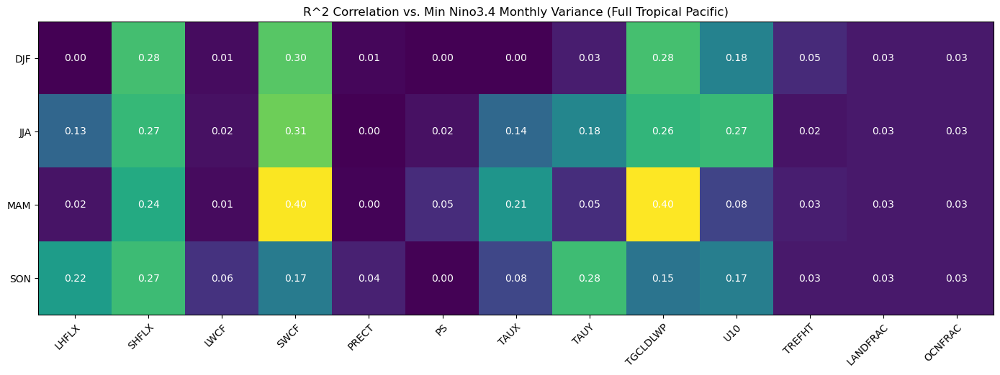

In [53]:
# make a weird plot of correlation strength...? (heat map)
correlations_arr = np.full([4, len(climoVar_list)], np.nan)

yArr = nino34_var.min(axis=1)[iKeeps]

for iSeason in range(4): 
    for iVar in range(len(climoVar_list)): 
        correlations_arr[iSeason, iVar] =  np.corrcoef(seasonal_tropPacific_all.isel(season=iSeason)[climoVar_list[iVar]].values, 
                                                       yArr)[0,1]**2

valfmt="{x:.2f}"
valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

fig, ax = plt.subplots(figsize=(14,5))
im = ax.imshow(correlations_arr)

# Show all ticks and label them with the respective list entries
ax.set_yticks(np.arange(4), labels=seasonal_tropPacific_all.season.values)
ax.set_xticks(np.arange(len(climoVar_list)), labels=climoVar_list)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(4):
    for j in range(len(climoVar_list)):
        text = ax.text(j, i, 
                       valfmt(correlations_arr[i, j], None),
                       # correlations_arr[i, j],
                       ha="center", va="center", color="w")

ax.set_title("R^2 Correlation vs. Min Nino3.4 Monthly Variance (Full Tropical Pacific)")
fig.tight_layout()
plt.show()


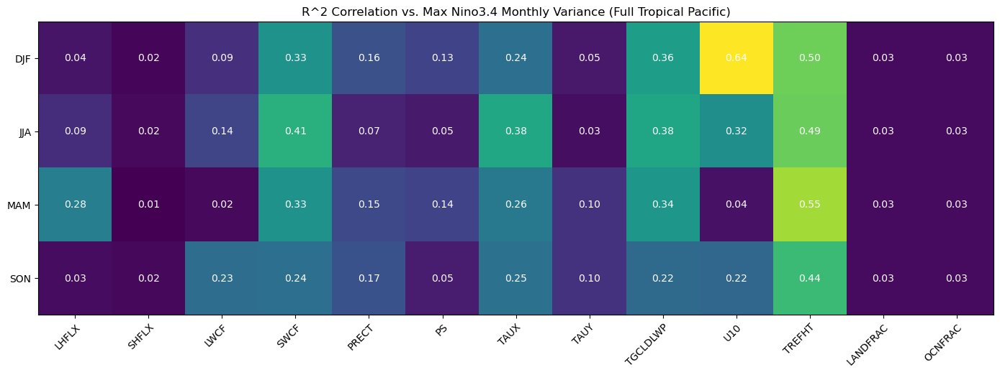

In [54]:
# make a weird plot of correlation strength...? (heat map)
correlations_arr = np.full([4, len(climoVar_list)], np.nan)

yArr = nino34_var.max(axis=1)[iKeeps]

for iSeason in range(4): 
    for iVar in range(len(climoVar_list)): 
        correlations_arr[iSeason, iVar] =  np.corrcoef(seasonal_tropPacific_all.isel(season=iSeason)[climoVar_list[iVar]].values, 
                                                       yArr)[0,1]**2

valfmt="{x:.2f}"
valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

fig, ax = plt.subplots(figsize=(14,5))
im = ax.imshow(correlations_arr)

# Show all ticks and label them with the respective list entries
ax.set_yticks(np.arange(4), labels=seasonal_tropPacific_all.season.values)
ax.set_xticks(np.arange(len(climoVar_list)), labels=climoVar_list)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(4):
    for j in range(len(climoVar_list)):
        text = ax.text(j, i, 
                       valfmt(correlations_arr[i, j], None),
                       # correlations_arr[i, j],
                       ha="center", va="center", color="w")

ax.set_title("R^2 Correlation vs. Max Nino3.4 Monthly Variance (Full Tropical Pacific)")
fig.tight_layout()
plt.show()


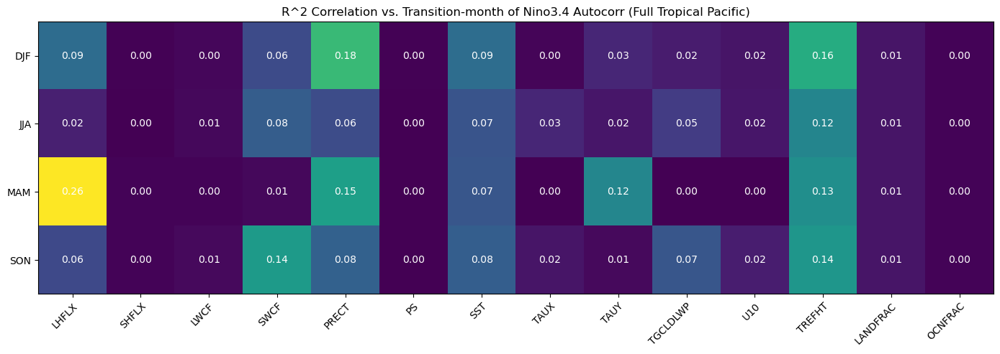

In [157]:
# make a weird plot of correlation strength...? (heat map)
correlations_arr = np.full([4, len(climoVar_list)], np.nan)

yArr = transit_month[iKeeps]

for iSeason in range(4): 
    for iVar in range(len(climoVar_list)): 
        correlations_arr[iSeason, iVar] =  np.corrcoef(seasonal_tropPacific_all.isel(season=iSeason)[climoVar_list[iVar]].values, 
                                                       yArr)[0,1]**2

valfmt="{x:.2f}"
valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

fig, ax = plt.subplots(figsize=(14,5))
im = ax.imshow(correlations_arr)

# Show all ticks and label them with the respective list entries
ax.set_yticks(np.arange(4), labels=seasonal_tropPacific_all.season.values)
ax.set_xticks(np.arange(len(climoVar_list)), labels=climoVar_list)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(4):
    for j in range(len(climoVar_list)):
        text = ax.text(j, i, 
                       valfmt(correlations_arr[i, j], None),
                       # correlations_arr[i, j],
                       ha="center", va="center", color="w")

ax.set_title("R^2 Correlation vs. Transition-month of Nino3.4 Autocorr (Full Tropical Pacific)")
fig.tight_layout()
plt.show()


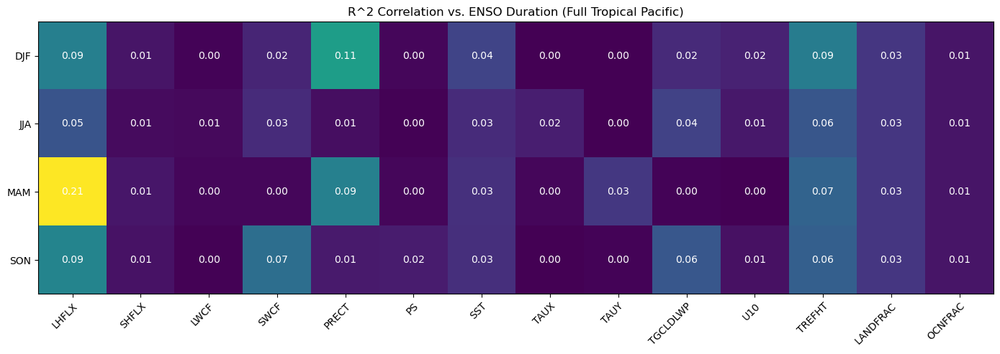

In [159]:
# make a weird plot of correlation strength...? (heat map)
correlations_arr = np.full([4, len(climoVar_list)], np.nan)

yArr = numMonthsAboveLimit[iKeeps]

for iSeason in range(4): 
    for iVar in range(len(climoVar_list)): 
        correlations_arr[iSeason, iVar] =  np.corrcoef(seasonal_tropPacific_all.isel(season=iSeason)[climoVar_list[iVar]].values, 
                                                       yArr)[0,1]**2

valfmt="{x:.2f}"
valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

fig, ax = plt.subplots(figsize=(14,5))
im = ax.imshow(correlations_arr)

# Show all ticks and label them with the respective list entries
ax.set_yticks(np.arange(4), labels=seasonal_tropPacific_all.season.values)
ax.set_xticks(np.arange(len(climoVar_list)), labels=climoVar_list)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(4):
    for j in range(len(climoVar_list)):
        text = ax.text(j, i, 
                       valfmt(correlations_arr[i, j], None),
                       # correlations_arr[i, j],
                       ha="center", va="center", color="w")

ax.set_title("R^2 Correlation vs. ENSO Duration (Full Tropical Pacific)")
fig.tight_layout()
plt.show()


In [101]:
print('- - - - - - - - - - - - - - - - - - - - - ')
print('LHFLX averaged over full Tropical Pacific')
xArr = seasonal_tropPacific_all.LHFLX
yArr = nino34_var.min(axis=1)[iKeeps]

print('JJA LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='JJA').values, yArr)[0,1]**2)
print('SON LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='SON').values, yArr)[0,1]**2)
print('DJF LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='DJF').values, yArr)[0,1]**2)
print('MAM LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='MAM').values, yArr)[0,1]**2)

print()
xArr = seasonal_tropPacific_all.LHFLX
yArr = nino34_var.max(axis=1)[iKeeps]

print('JJA LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='JJA').values, yArr)[0,1]**2)
print('SON LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='SON').values, yArr)[0,1]**2)
print('DJF LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='DJF').values, yArr)[0,1]**2)
print('MAM LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='MAM').values, yArr)[0,1]**2)

print('\n')
print('- - - - - - - - - - - - - - - - - - - - - ')
print('LHFLX averaged over East Tropical Pacific')
xArr = seasonal_tropPacific_east.LHFLX
yArr = nino34_var.min(axis=1)[iKeeps]

print('JJA LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='JJA').values, yArr)[0,1]**2)
print('SON LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='SON').values, yArr)[0,1]**2)
print('DJF LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='DJF').values, yArr)[0,1]**2)
print('MAM LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='MAM').values, yArr)[0,1]**2)

print()
xArr = seasonal_tropPacific_east.LHFLX
yArr = nino34_var.max(axis=1)[iKeeps]

print('JJA LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='JJA').values, yArr)[0,1]**2)
print('SON LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='SON').values, yArr)[0,1]**2)
print('DJF LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='DJF').values, yArr)[0,1]**2)
print('MAM LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='MAM').values, yArr)[0,1]**2)



print('\n')
print('- - - - - - - - - - - - - - - - - - - - - ')
print('LHFLX averaged over West Tropical Pacific')
xArr = seasonal_tropPacific_west.LHFLX
yArr = nino34_var.min(axis=1)[iKeeps]

print('JJA LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='JJA').values, yArr)[0,1]**2)
print('SON LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='SON').values, yArr)[0,1]**2)
print('DJF LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='DJF').values, yArr)[0,1]**2)
print('MAM LHFLX vs. min nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='MAM').values, yArr)[0,1]**2)

print()
xArr = seasonal_tropPacific_east.LHFLX
yArr = nino34_var.max(axis=1)[iKeeps]

print('JJA LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='JJA').values, yArr)[0,1]**2)
print('SON LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='SON').values, yArr)[0,1]**2)
print('DJF LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='DJF').values, yArr)[0,1]**2)
print('MAM LHFLX vs. max nino3.4 variance: R^2 = ', np.corrcoef(xArr.sel(season='MAM').values, yArr)[0,1]**2)



- - - - - - - - - - - - - - - - - - - - - 
LHFLX averaged over full Tropical Pacific
JJA LHFLX vs. min nino3.4 variance: R^2 =  0.5674474177987662
SON LHFLX vs. min nino3.4 variance: R^2 =  0.4459403101476968
DJF LHFLX vs. min nino3.4 variance: R^2 =  0.17627566689727314
MAM LHFLX vs. min nino3.4 variance: R^2 =  0.07240447827193651

JJA LHFLX vs. max nino3.4 variance: R^2 =  0.3484512398620489
SON LHFLX vs. max nino3.4 variance: R^2 =  0.25281898230755584
DJF LHFLX vs. max nino3.4 variance: R^2 =  0.039140941156370006
MAM LHFLX vs. max nino3.4 variance: R^2 =  0.0010324766460597138


- - - - - - - - - - - - - - - - - - - - - 
LHFLX averaged over East Tropical Pacific
JJA LHFLX vs. min nino3.4 variance: R^2 =  0.5431602823357646
SON LHFLX vs. min nino3.4 variance: R^2 =  0.28989465983739093
DJF LHFLX vs. min nino3.4 variance: R^2 =  0.03756496514317169
MAM LHFLX vs. min nino3.4 variance: R^2 =  0.09793497749069713

JJA LHFLX vs. max nino3.4 variance: R^2 =  0.4191296482246674
SON LHFLX

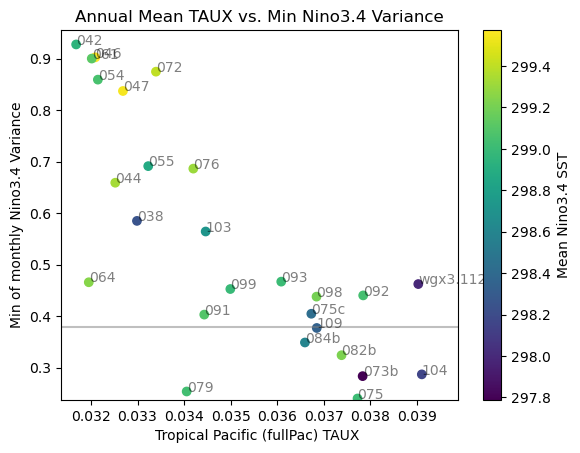

In [43]:
## color points by third variable 
fig,axs = plt.subplots(1,1)

xArr = annual_tropPacific_all.TAUX
# xArr = annual_tropPacific_east.TAUX
yArr = nino34_var.min(axis=1)[iKeeps]
cArr = sst_raw_nino34.mean(dim='season').values

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

s = axs.scatter(xArr, yArr, c=cArr)
fig.colorbar(s,ax=axs,orientation='vertical',label='Mean Nino3.4 SST')

for iCase in range(len(corrs.case.values)): 
    axs.text(xArr[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color='k', alpha=0.5)

axs.set_title('Annual Mean TAUX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (fullPac) TAUX ')
axs.set_ylabel('Min of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.min(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)


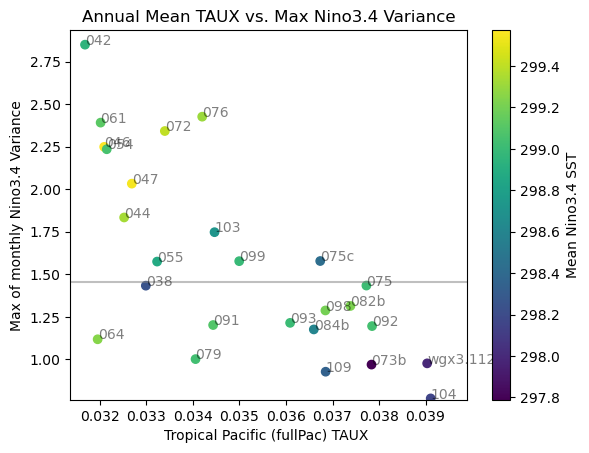

In [44]:
## color points by third variable 
fig,axs = plt.subplots(1,1)

xArr = annual_tropPacific_all.TAUX
# xArr = annual_tropPacific_east.TAUX
yArr = nino34_var.max(axis=1)[iKeeps]
cArr = sst_raw_nino34.mean(dim='season').values

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

s = axs.scatter(xArr, yArr, c=cArr)
fig.colorbar(s,ax=axs,orientation='vertical',label='Mean Nino3.4 SST')

for iCase in range(len(corrs.case.values)): 
    axs.text(xArr[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color='k', alpha=0.5)

axs.set_title('Annual Mean TAUX vs. Max Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (fullPac) TAUX ')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.max(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)


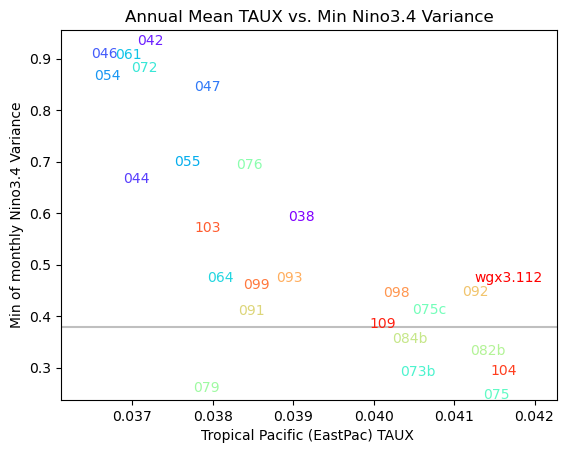

In [307]:
fig,axs = plt.subplots(1,1)

xArr = annual_tropPacific_all.TAUX
# xArr = annual_tropPacific_east.TAUX
yArr = nino34_var.min(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean TAUX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (EastPac) TAUX ')
axs.set_ylabel('Min of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.min(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

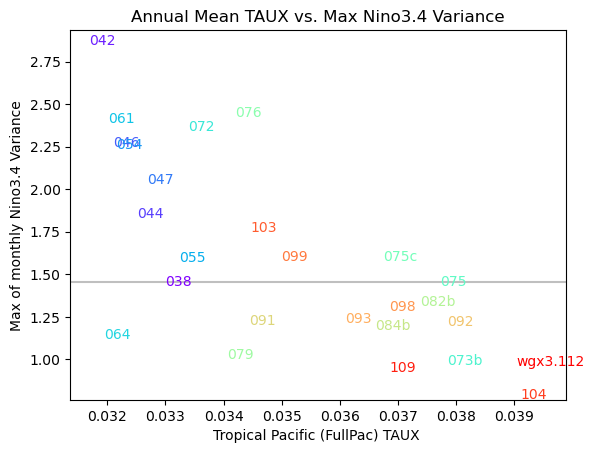

In [313]:
fig,axs = plt.subplots(1,1)

xArr = annual_tropPacific_all.TAUX
# xArr = annual_tropPacific_west.TAUX
yArr = nino34_var.max(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean TAUX vs. Max Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (FullPac) TAUX ')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.max(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

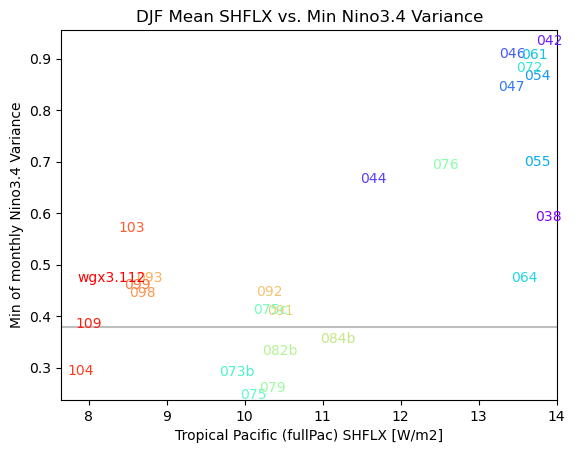

In [319]:
fig,axs = plt.subplots(1,1)

xArr = seasonal_tropPacific_all.SHFLX.sel(season='DJF')
yArr = nino34_var.min(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('DJF Mean SHFLX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (fullPac) SHFLX [W/m2]')
axs.set_ylabel('Min of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.min(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

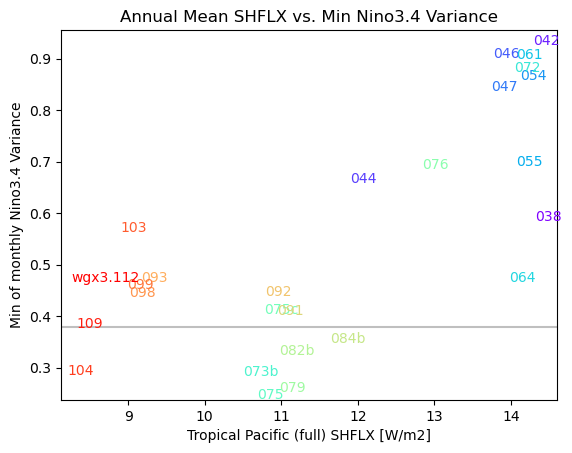

In [320]:
fig,axs = plt.subplots(1,1)

xArr = annual_tropPacific_all.SHFLX
yArr = nino34_var.min(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean SHFLX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (full) SHFLX [W/m2]')
axs.set_ylabel('Min of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.min(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

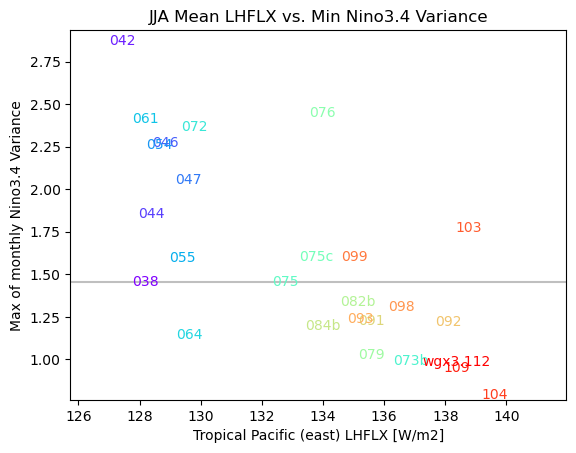

In [326]:
fig,axs = plt.subplots(1,1)

xArr = seasonal_tropPacific_east.LHFLX.sel(season='JJA')
yArr = nino34_var.max(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('JJA Mean LHFLX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (east) LHFLX [W/m2]')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.max(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

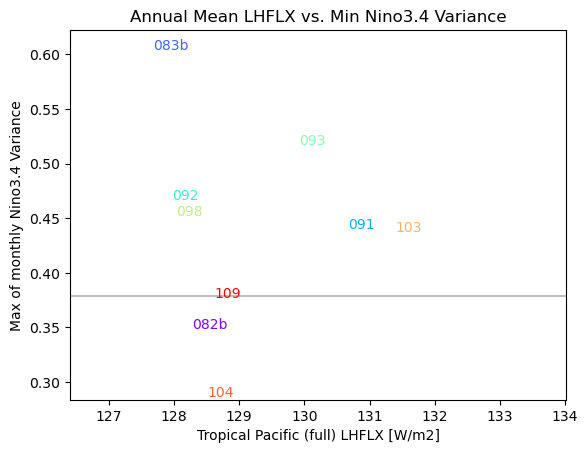

0.000654092952351467


In [88]:
fig,axs = plt.subplots(1,1)

xArr = annual_tropPacific_all.LHFLX
yArr = nino34_var.min(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean LHFLX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (full) LHFLX [W/m2]')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.min(), color='grey', alpha=0.5)
plt.show()

print(np.corrcoef(xArr.values, yArr)[0,1]**2)

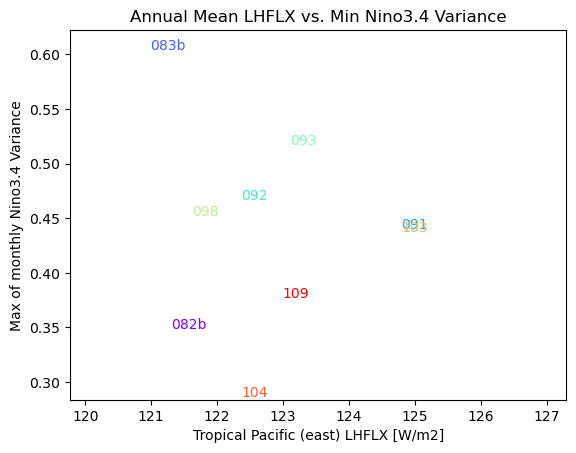

In [89]:
fig,axs = plt.subplots(1,1)

axs.set_ylim([0.99*np.min(nino34_var.min(axis=1)[iKeeps]),      1.03*np.max(nino34_var.min(axis=1)[iKeeps])])
axs.set_xlim([0.99*np.min(annual_tropPacific_east.LHFLX.values), 1.02*np.max(annual_tropPacific_east.LHFLX.values)])

for iCase in range(len(annual_tropPacific_east.case.values)): 
    axs.text(annual_tropPacific_east.LHFLX.values[iCase], 
             nino34_var.min(axis=1)[iKeeps][iCase], 
             annual_tropPacific_east.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean LHFLX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (east) LHFLX [W/m2]')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
plt.show()

# print(np.corrcoef(annual_tropPacific_east.LHFLX.values, nino34_var.min(axis=1)[iKeeps])[0,1]**2)

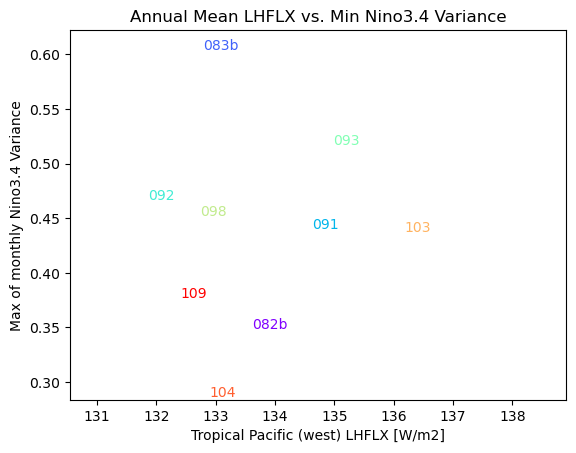

In [90]:
fig,axs = plt.subplots(1,1)

axs.set_ylim([0.99*np.min(nino34_var.min(axis=1)[iKeeps]),      1.03*np.max(nino34_var.min(axis=1)[iKeeps])])
axs.set_xlim([0.99*np.min(annual_tropPacific_west.LHFLX.values), 1.02*np.max(annual_tropPacific_west.LHFLX.values)])

for iCase in range(len(annual_tropPacific_west.case.values)): 
    axs.text(annual_tropPacific_west.LHFLX.values[iCase], 
             nino34_var.min(axis=1)[iKeeps][iCase], 
             annual_tropPacific_west.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean LHFLX vs. Min Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (west) LHFLX [W/m2]')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
plt.show()

# print(np.corrcoef(annual_tropPacific_west.LHFLX.values, nino34_var.min(axis=1)[iKeeps])[0,1]**2)

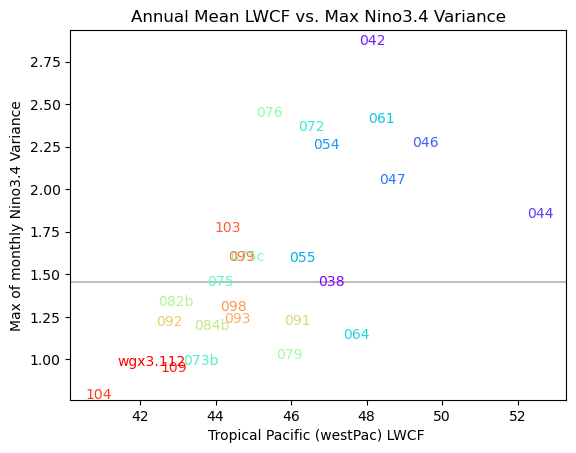

In [337]:
fig,axs = plt.subplots(1,1)

# xArr = annual_tropPacific_all.LWCF
xArr = annual_tropPacific_west.LWCF
yArr = nino34_var.max(axis=1)[iKeeps]

axs.set_ylim([0.99*np.min(yArr),      1.03*np.max(yArr)])
axs.set_xlim([0.99*np.min(xArr.values), 1.02*np.max(xArr.values)])

for iCase in range(len(annual_tropPacific_all.case.values)): 
    axs.text(xArr.values[iCase], 
             yArr[iCase], 
             annual_tropPacific_all.case.values[iCase], color=colorList[iCase])

axs.set_title('Annual Mean LWCF vs. Max Nino3.4 Variance')
axs.set_xlabel('Tropical Pacific (westPac) LWCF ')
axs.set_ylabel('Max of monthly Nino3.4 Variance')
axs.axhline(nino34_var_obs.max(), color='grey', alpha=0.5)
plt.show()

# print(np.corrcoef(xArr.values, yArr)[0,1]**2)

In [327]:
annual_tropPacific_east

<xarray.Dataset>
Dimensions:   (case: 26)
Coordinates:
  * case      (case) <U8 '038' '042' '044' '046' ... '104' '109' 'wgx3.112'
Data variables: (12/13)
    LHFLX     (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    SHFLX     (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    LWCF      (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    SWCF      (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    PRECT     (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    PS        (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    ...        ...
    TAUY      (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    TGCLDLWP  (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    U10       (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    TREFHT    (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    LANDFRAC  (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    OCNFRAC   (case) float64 dask.array<chunksize=(1,), meta=np.ndarray>

## Dig into specific runs

In [165]:
# tsDir = '/glade/derecho/scratch/mdfowler/enso_wavelet/otherTimeSeries/'

# runNames = ['b.e23_alpha16g.BLT1850.ne30_t232.082b',
#             'b.e23_alpha16g.BLT1850.ne30_t232.083b',
#             'b.e23_alpha17f.BLT1850.ne30_t232.091', 
#             'b.e23_alpha17f.BLT1850.ne30_t232.092',
#             'b.e23_alpha17f.BLT1850.ne30_t232.093', 
#             'b.e23_alpha17f.BLT1850.ne30_t232.098',
#             'b.e30_beta02.BLT1850.ne30_t232.104', 
#             'b.e30_beta02.BLT1850.ne30_t232.109', 
#             ]

# for iCase in range(len(runNames)): 
#     listFiles = np.sort(glob.glob(tsDir+runNames[iCase]+'*.nc'))

#     ds = xr.open_mfdataset(listFiles)

#     # Remove first year of each simulation
#     timeOffset = ds.time.values[0]  + timedelta(days=365)
#     iKeep      = np.where(ds.time.values>=timeOffset)[0]
#     ds         = ds.isel(time=iKeep)

    
    
#     # # Add short alias for case ID
#     caseID = runNames[iCase].split(".")[4] 
#     caseDS = ds.squeeze().assign_coords({"case":  caseID})

#     if ((caseID=='091') | (caseID=='092')):
#         caseDS['lat']  = allCases.isel(case=iCase-1).lat.values
#         caseDS['lon']  = allCases.isel(case=iCase-1).lon.values

#     # Combine into single DS
#     if iCase==0: 
#         allCases = caseDS
#     else: 
#         allCases = xr.concat([allCases, caseDS], "case") 

In [158]:
# ## Isolate Pacific? 
# iLons = np.where((allCases.lon.values>=110) & (allCases.lon.values<=290))[0]
# sel_allCases = allCases.isel(lon=iLons)


In [159]:
# # Updating limit of ocnfrac used to determine mask
# ocnMask = sel_allCases.isel(case=-1, time=0).LANDFRAC.values
# ocnMask[ocnMask>0.45] = np.nan
# ocnMask[ocnMask<=0.45] = 1

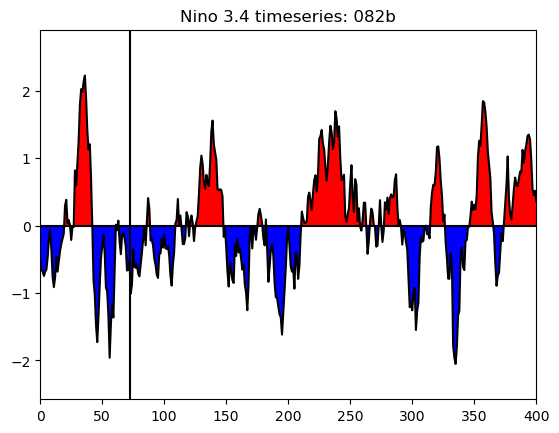

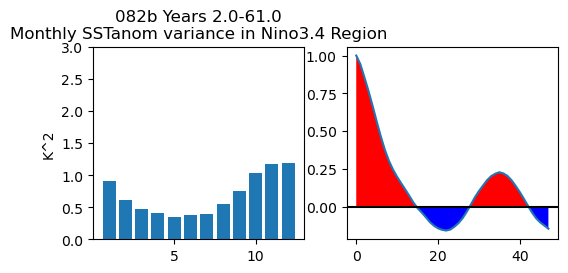

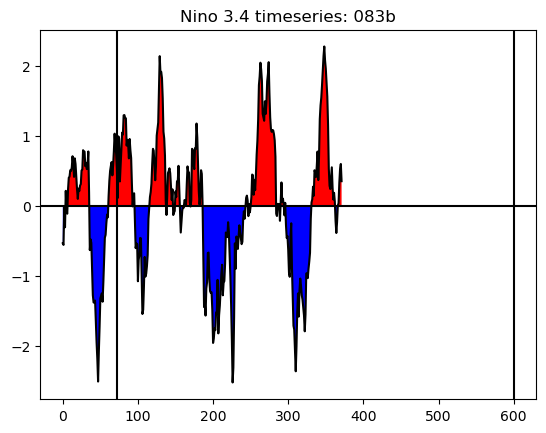

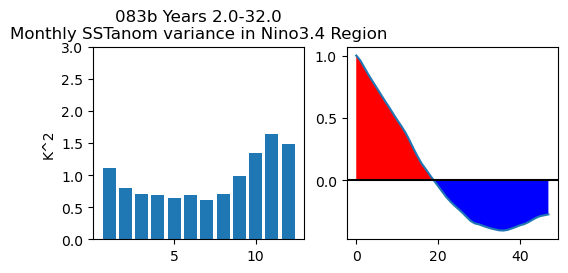

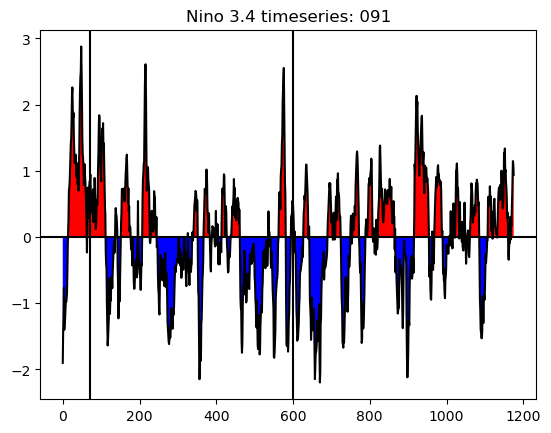

...

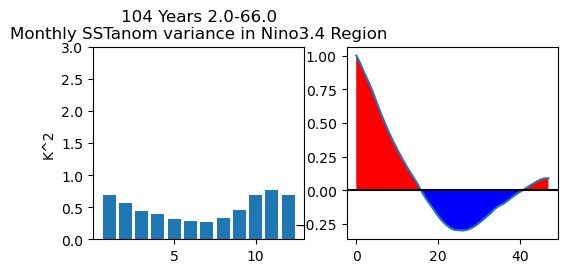

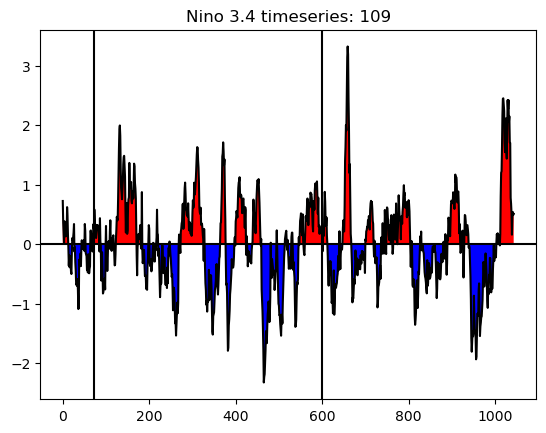

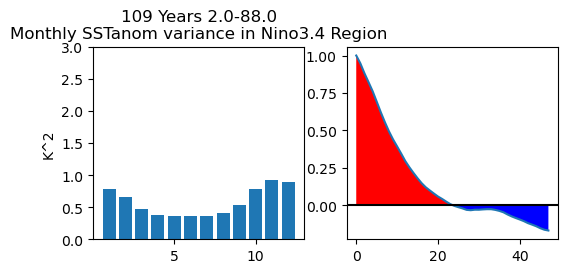

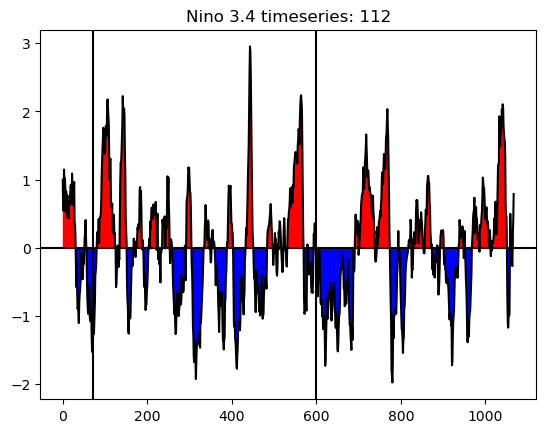

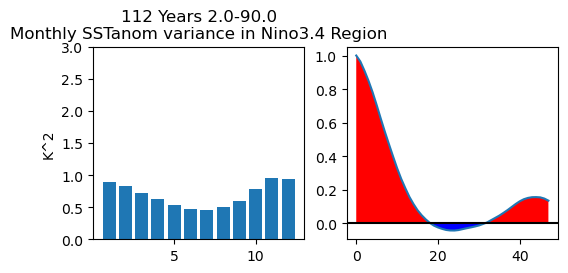

In [138]:

# listFiles_TS = np.sort(glob.glob(dataDir+'*BLT1850.ne30_t232*cam.h0*TS.*.nc'))
listFiles_TS_sel = np.asarray((
      [
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.082b.cam.h0.TS.1-61.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha16g.BLT1850.ne30_t232.083b.cam.h0.TS.1-32.10.N-10.S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.091.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.092.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.093.cam.h0a.TS.1-75.10.N-10.S.nc',          
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.1-150.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.098.cam.h0a.TS.101-200.10.N-10.S.nc',
          
       # '/glade/derecho/scratch/rneale/enso_wavelet/b.e23_alpha17f.BLT1850.ne30_t232.099.cam.h0a.TS.1-100.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.104.cam.h0a.TS.1-66.10.N-10.S.nc',
       '/glade/derecho/scratch/rneale/enso_wavelet/b.e30_beta02.BLT1850.ne30_t232.109.cam.h0a.TS.1-88.10.N-10.S.nc',
       '/glade/derecho/scratch/mdfowler/enso_wavelet/b.e30_alpha03d.BLT1850.ne30_t232_wgx3.112.cam.h0a.TS.1-90.10N-10S.nc',
      ]))

startYear = np.full([len(listFiles_TS_sel)], np.nan)
endYear   = np.full([len(listFiles_TS_sel)], np.nan)

## Handle model data ------

sst_anom_out  = np.full([len(listFiles_TS_sel), 12*149, 22,288], np.nan)
nino34_out    = np.full([len(listFiles_TS_sel), 12*149], np.nan)

nino34_var    = np.full([len(listFiles_TS_sel), 12], np.nan)
nino34_ac     = np.full([len(listFiles_TS_sel), 48], np.nan)
transit_month = np.full([len(listFiles_TS_sel)], np.nan)

nino3_var     = np.full([len(listFiles_TS_sel), 12], np.nan)
nino3_ac      = np.full([len(listFiles_TS_sel), 48], np.nan)
transit_month3 = np.full([len(listFiles_TS_sel)], np.nan)

nino4_var     = np.full([len(listFiles_TS_sel), 12], np.nan)
nino4_ac      = np.full([len(listFiles_TS_sel), 48], np.nan)
transit_month4 = np.full([len(listFiles_TS_sel)], np.nan)

for iSim in range(len(listFiles_TS_sel)):
    DS = xr.open_dataset(listFiles_TS_sel[iSim]) 
    if DS['time.day'].isel(time=0).values==1:
        DS = cesm_correct_time(DS)
    # else: 
        # print('First day in file is ', DS.time.values[0])

    # Remove first year of each simulation
    timeOffset = DS.time.values[0]  + timedelta(days=365)
    iKeep      = np.where(DS.time.values>=timeOffset)[0]
    DS         = DS.isel(time=iKeep)

    startYear[iSim] = DS.isel(time=0)['time.year'].values
    endYear[iSim]   = DS.isel(time=-1)['time.year'].values
    
    ## Add case ID (short name) to the DS
    caseName = listFiles_TS_sel[iSim].split(".")[4] 


    if caseName=='wgx3':
        # iSelTimes = np.where((DS['time.year'].values>=6) & (DS['time.year'].values<=50) )[0]
        # iSelTimes = np.where((DS['time.year'].values>=6) )[0]
        iSelTimes = np.where((DS['time.year'].values>=2) )[0]
        DS = DS.isel(time=iSelTimes).copy()
        startYear[iSim] = DS.isel(time=0)['time.year'].values
        endYear[iSim]   = DS.isel(time=-1)['time.year'].values

    if caseName=='098': 
        if startYear[iSim]<100: 
            caseName='098_part1'
        elif startYear[iSim]>100: 
            caseName='098_part2'
        
    
    ocnMask = DS.LANDFRAC.values
    ocnMask[ocnMask>0.45] = np.nan
    ocnMask[ocnMask<=0.45] = 1
    
    # Detrend data 
    TS = DS.TS 
    ts = signal.detrend(TS, axis=0, type='linear')
    # Get SST 
    sst = ts * ocnMask
    
    sst = xr.DataArray(sst, 
        coords={'time': DS.time.values,
                'lat':  DS.lat.values, 
                'lon':  DS.lon.values}, 
        dims=["time", "lat", "lon"])
    
    # Remove annual cycle from monthly data 
    sst_anom = rmMonAnnCyc(sst)
    sst_anom_out[iSim, 0:len(DS.time.values),:,:] = sst_anom
    
    ## Compute nino 3.4 index
    ilats = np.where((sst_anom.lat.values>=lat_s34)  & (sst_anom.lat.values<=lat_n34))[0]
    ilons = np.where((sst_anom.lon.values>=lon_e34)  & (sst_anom.lon.values<=lon_w34))[0]
    
    # # Compute weights and get Nino3.4 
    regionTS = sst_anom.isel(lat=ilats, lon=ilons)
    coswgt   = np.cos(np.deg2rad(regionTS.lat))
    nino34     = regionTS.weighted(coswgt).mean(('lon','lat'))
    nino34_out[iSim,0:len(nino34)] = nino34
    
    ## Compute other nino regions 
    ilats3 = np.where((sst_anom.lat.values>=lat_s3)  & (sst_anom.lat.values<=lat_n3))[0]
    ilons3 = np.where((sst_anom.lon.values>=lon_e3)  & (sst_anom.lon.values<=lon_w3))[0]
    # # Compute weights and get Nino3.4 
    regionTS_3 = sst_anom.isel(lat=ilats3, lon=ilons3)
    coswgt_3   = np.cos(np.deg2rad(regionTS_3.lat))
    nino3      = regionTS_3.weighted(coswgt_3).mean(('lon','lat'))

    ilats4 = np.where((sst_anom.lat.values>=lat_s4)  & (sst_anom.lat.values<=lat_n4))[0]
    ilons4 = np.where((sst_anom.lon.values>=lon_e4)  & (sst_anom.lon.values<=lon_w4))[0]
    # # Compute weights and get Nino3.4 
    regionTS_4 = sst_anom.isel(lat=ilats4, lon=ilons4)
    coswgt_4   = np.cos(np.deg2rad(regionTS_4.lat))
    nino4      = regionTS_4.weighted(coswgt_4).mean(('lon','lat'))

    ## Plot nino3.4 timeseries?
    plt.plot(np.arange(len(nino34.time.values)), nino34.values,'k')
    plt.axhline(0, color='k')
    
    plt.fill_between(np.arange(len(nino34.time.values)), 0, nino34.values, 
                     where=nino34.values >= 0, facecolor='red', interpolate=True)
    plt.fill_between(np.arange(len(nino34.time.values)), nino34.values, 0, 
                     where=nino34.values <= 0, facecolor='blue', interpolate=True)
    plt.title('Nino 3.4 timeseries: '+caseName)
    plt.axvline(6*12,color='k')
    plt.axvline(50*12,color='k')

    if caseName=='082b':
        plt.xlim([0,400])
    
    plt.show()

    fig,axs = plt.subplots(1,2,figsize=(6,2.5))
    axs     = axs.ravel()
   
    ## Reproduce the variance plot from Rich
    #   NOTE: doesn't match exactly, likely because I use cos(lat) for weights instead of a gaussian like Rich 
    nino34_var_monthly = nino34.groupby('time.month').var()
    nino34_var[iSim,:] = nino34_var_monthly

    nino3_var[iSim,:] = nino3.groupby('time.month').var()
    nino4_var[iSim,:] = nino4.groupby('time.month').var()

    axs[0].bar(np.arange(12)+1, nino34_var_monthly)
    axs[0].set_title(str(caseName)+' Years '+str(startYear[iSim])+'-'+str(endYear[iSim])+'\nMonthly SSTanom variance in Nino3.4 Region' )
    axs[0].set_ylim([0.0, 3.0])
    axs[0].set_ylabel('K^2')

    ## Reproduce the autocorrelation plot from Rich 
    nino34_pd = pd.Series(nino34.values)
    nino3_pd = pd.Series(nino3.values)
    nino4_pd = pd.Series(nino4.values)
    
    for iLag in range(48):
        nino34_ac[iSim, iLag] = nino34_pd.autocorr(lag=iLag)
        if ((nino34_ac[iSim, iLag-1]>0) & (nino34_ac[iSim, iLag]<0) & (np.isfinite(transit_month[iSim])==False)):
            transit_month[iSim] = iLag

        nino3_ac[iSim, iLag] = nino3_pd.autocorr(lag=iLag)
        if ((nino3_ac[iSim, iLag-1]>0) & (nino3_ac[iSim, iLag]<0) & (np.isfinite(transit_month3[iSim])==False)):
            transit_month3[iSim] = iLag

        nino4_ac[iSim, iLag] = nino4_pd.autocorr(lag=iLag)
        if ((nino4_ac[iSim, iLag-1]>0) & (nino4_ac[iSim, iLag]<0) & (np.isfinite(transit_month4[iSim])==False)):
            transit_month4[iSim] = iLag
            
            
    axs[1].plot(np.arange(48), nino34_ac[iSim,:])
    axs[1].fill_between(np.arange(48), 0, nino34_ac[iSim,:], 
                 where=nino34_ac[iSim,:] >= 0, facecolor='red', interpolate=True)
    axs[1].fill_between(np.arange(48), nino34_ac[iSim,:], 0, 
                 where=nino34_ac[iSim,:] <= 0, facecolor='blue', interpolate=True)

    # plt.plot(transit_month[iSim], nino34_ac[iSim, int(transit_month[iSim])], 'r*')
    axs[1].axhline(0,color='k')
    
    plt.show()



In [139]:
endYear - startYear

array([59., 30., 97., 98., 72., 98., 98., 64., 86., 88.])

In [8]:
endYear

array([ 61.,  32.,  99., 100.,  74., 150.,  66.,  88.,  90.])

In [18]:
tsDir = '/glade/derecho/scratch/mdfowler/enso_wavelet/otherTimeSeries/'

runNames = ['b.e23_alpha16g.BLT1850.ne30_t232.082b',
            'b.e23_alpha16g.BLT1850.ne30_t232.083b',
            'b.e23_alpha17f.BLT1850.ne30_t232.091', 
            'b.e23_alpha17f.BLT1850.ne30_t232.092',
            'b.e23_alpha17f.BLT1850.ne30_t232.093', 
            'b.e23_alpha17f.BLT1850.ne30_t232.098',
            'b.e30_beta02.BLT1850.ne30_t232.104', 
            'b.e30_beta02.BLT1850.ne30_t232.109', 
            'b.e30_alpha03d.BLT1850.ne30_t232_wgx3.112',
            ]

for iCase in range(len(runNames)): 
    listFiles = np.sort(glob.glob(tsDir+runNames[iCase]+'*.nc'))

    ds = xr.open_mfdataset(listFiles,  decode_times=True)

    if ds['time.day'].isel(time=0).values==1:
        ds = cesm_correct_time(ds)
    
    # # Match years of ENSO calculations
    iKeep      = np.where( (ds['time.year'].values>=int(startYear[iCase])) &  (ds['time.year'].values<=int(endYear[iCase])) ) [0]
    print('Starting: ', int(startYear[iCase]), ' and ending ', int(endYear[iCase]))
    ds         = ds.isel(time=iKeep)
    print(runNames[iCase])
    print('First time: ', ds.time.values[0])
    print('Last time:  ', ds.time.values[-1])
    
    # # Add short alias for case ID
    caseID = runNames[iCase].split(".")[4] 
    caseDS = ds.squeeze().assign_coords({"case":  caseID})

    if ((caseID=='091') | (caseID=='092')):
        caseDS['lat']  = allCases.isel(case=iCase-1).lat.values
        caseDS['lon']  = allCases.isel(case=iCase-1).lon.values

        caseDS['PRECT'] = caseDS['PRECC']+caseDS['PRECL']

    # Combine into single DS
    if iCase==0: 
        allCases = caseDS.load()
    else: 
        allCases = xr.concat([allCases, caseDS.load()], "case") 


Starting:  2  and ending  61
b.e23_alpha16g.BLT1850.ne30_t232.082b
First time:  0002-01-16 12:00:00
Last time:   0061-12-16 12:00:00
Starting:  2  and ending  32
b.e23_alpha16g.BLT1850.ne30_t232.083b
First time:  0002-01-16 12:00:00
Last time:   0032-12-16 12:00:00
Starting:  2  and ending  99
b.e23_alpha17f.BLT1850.ne30_t232.091
First time:  0002-01-16 12:00:00
Last time:   0099-12-16 12:00:00
Starting:  2  and ending  100
b.e23_alpha17f.BLT1850.ne30_t232.092
First time:  0002-01-16 12:00:00
Last time:   0100-12-16 12:00:00
Starting:  2  and ending  74
b.e23_alpha17f.BLT1850.ne30_t232.093
First time:  0002-01-16 12:00:00
Last time:   0074-12-16 12:00:00
Starting:  2  and ending  150
b.e23_alpha17f.BLT1850.ne30_t232.098
First time:  0002-01-16 12:00:00
Last time:   0150-12-16 12:00:00
Starting:  2  and ending  66
b.e30_beta02.BLT1850.ne30_t232.104
First time:  0002-01-16 12:00:00
Last time:   0066-12-16 12:00:00
Starting:  2  and ending  88
b.e30_beta02.BLT1850.ne30_t232.109
First time

**Get some obs**

In [ ]:
## Read in ERA-5 Monthly means for the same period 
filePath = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_fluxesAndRain.nc'
era5_obs = xr.open_dataset(filePath, decode_times=True)

## Add neutral 10m wind components 
fileNeut = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_neutral10mWinds.nc'
era5_neut = xr.open_dataset(fileNeut, decode_times=True)
era5_obs = xr.merge([era5_obs, era5_neut])

era5_obs = era5_obs.reindex(latitude=era5_obs.latitude[::-1])
era5_obs = era5_obs.rename_dims(dims_dict={'latitude':'lat', 'longitude':'lon'})
era5_obs = era5_obs.rename(name_dict={'latitude':'lat', 'longitude':'lon'})

# Now regrid the data
# Get model grid 
camGrid = allCases['LHFLX'].isel(time=0,case=0).load().squeeze()

# lhflx_era5 = era5_obs['slhf'].where(era5_obs['slhf'].values>-999)
lhflx_era5 = -era5_obs['slhf']/86400  # Divide fluxes by 86400 to get from J/m2 to W/m2; Add negative sign to match CAM convention 
regridERA5_lhflx = regrid_data(lhflx_era5, camGrid, method=1)

## NOW: use neutral winds for 10m u and v 
era5_u10_temp = era5_obs['u10n']
era5_v10_temp = era5_obs['v10n']
u10_era5 = np.sqrt(era5_u10_temp**2 + era5_v10_temp**2)
regridERA5_u10 = regrid_data(u10_era5, camGrid, method=1)

era5_prect_temp  = era5_obs['tp']
era5_prect_temp  =  era5_prect_temp * 1000.0  # Convert from m of water per day to mm/day
regridERA5_prect = regrid_data(era5_prect_temp, camGrid, method=1)

## Combine back into one xarray dataset
regridERA5 = regridERA5_lhflx.to_dataset()
regridERA5['U10'] = (('time','lat','lon'), regridERA5_u10.values)
regridERA5['tp'] = (('time','lat','lon'), regridERA5_prect.values)
# regridERA5 = xr.merge([regridERA5_lhflx, regridERA5_u10, regridERA5_prect])

# ## Get seasonal means of ERA5 data too 
# month_length = regridERA5.time.dt.days_in_month

# # Calculate the weights by grouping by 'time.season'.
# weights = (month_length.groupby("time.season") / month_length.groupby("time.season").sum())

# # Calculate the weighted average
# regridERA5_seasonal = (regridERA5 * weights).groupby("time.season").sum(dim="time")


/glade/derecho/scratch/mdfowler/tmp/ipykernel_59071/1774969341.py:12: UserWarning: rename 'latitude' to 'lat' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  era5_obs = era5_obs.rename(name_dict={'latitude':'lat', 'longitude':'lon'})
/glade/derecho/scratch/mdfowler/tmp/ipykernel_59071/1774969341.py:12: UserWarning: rename 'longitude' to 'lon' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  era5_obs = era5_obs.rename(name_dict={'latitude':'lat', 'longitude':'lon'})


In [ ]:
regridERA5

In [10]:
## Isolate Pacific? 
iLons = np.where((allCases.lon.values>=110) & (allCases.lon.values<=290))[0]
sel_allCases = allCases.isel(lon=iLons)


In [11]:
# Updating limit of ocnfrac used to determine mask
# ocnMask = sel_allCases.isel(case=2, time=1).LANDFRAC.values
ocnMask = sel_allCases.isel(case=2, time=1).LANDFRAC.values
ocnMask[ocnMask>0.45] = np.nan
ocnMask[ocnMask<=0.45] = 1


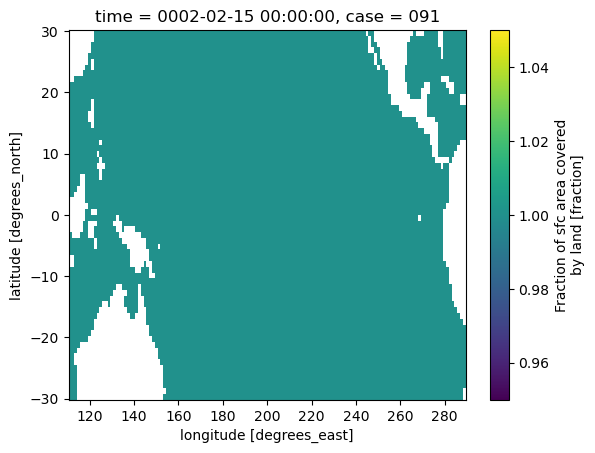

In [137]:
sel_allCases.isel(case=2, time=1).LANDFRAC.plot()

### Plots

In [12]:
# Set up for weighted seasonal means
month_length = sel_allCases.time.dt.days_in_month
weights = ( month_length.groupby("time.season") / month_length.groupby("time.season").sum(skipna=True) )

# Also get lat/lon
longrid, latgrid = np.meshgrid(sel_allCases['lon'], sel_allCases['lat'] )



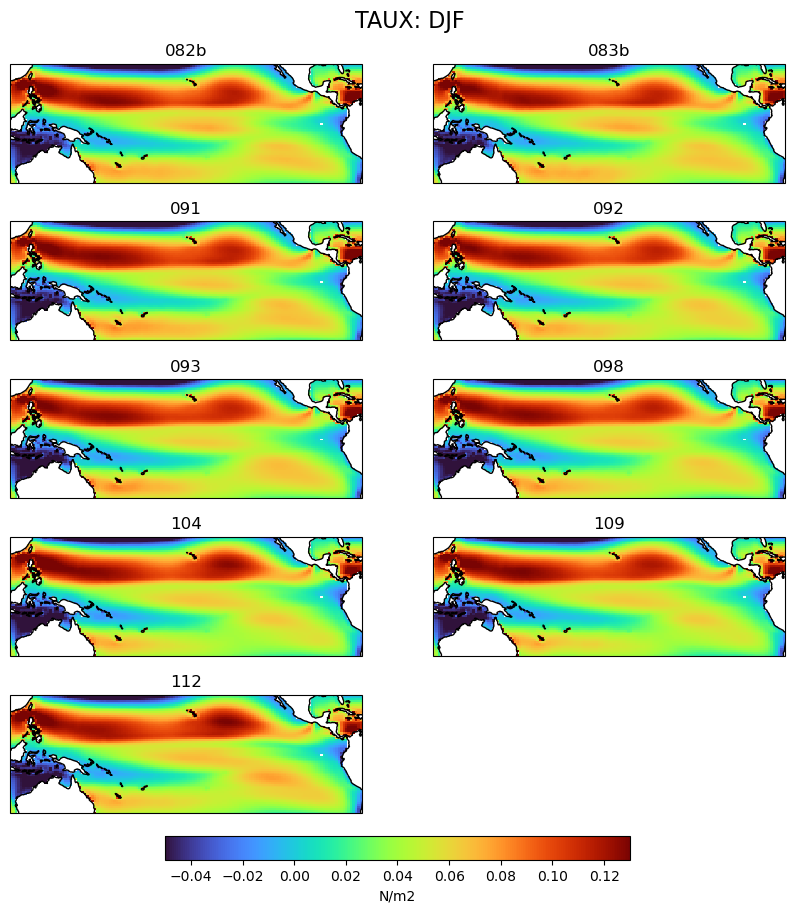

In [65]:
varSel    = 'TAUX'
selSeason = 'DJF'

normVar = matplotlib.colors.Normalize(vmin=-0.05, vmax=0.13)
cmapSel = 'turbo'

# weightedVar = (sel_allCases[varSel]* weights).groupby("time.season").sum(dim="time")

# Mask out NaNs in SST by setting corresponding weights to zero
masked_weights = xr.where(~sel_allCases[varSel].isnull(), weights, 0)

# Normalize masked weights so they sum to 1 across valid (non-NaN) data
masked_weights = masked_weights.groupby("time.season") / masked_weights.groupby("time.season").sum(dim="time", skipna=True)

# Calculate the weighted mean, excluding NaNs
weightedVar = (sel_allCases[varSel] * masked_weights).groupby("time.season").sum(dim="time", skipna=True).sel(season=selSeason)



fig,axs = plt.subplots(5,2,figsize=(10,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs = axs.ravel() 

[a.coastlines() for a in axs]
# [a.set_extent([110,288,-20,20]) for a in axs]

plt.gcf().text(0.47, 0.90, varSel+': '+selSeason, fontsize=16)

for iCase in range(len(weightedVar.case.values)): 
    i = axs[iCase].pcolormesh(longrid, latgrid, ocnMask * weightedVar.isel(case=iCase).values, 
                              transform=ccrs.PlateCarree(), norm=normVar, cmap=cmapSel)
    axs[iCase].set_title(weightedVar.isel(case=iCase).case.values)
    
cb = fig.colorbar(i, ax=axs, shrink=0.6, label=allCases[varSel].units, orientation='horizontal', pad=0.025) 

axs[9].set_visible(False) 


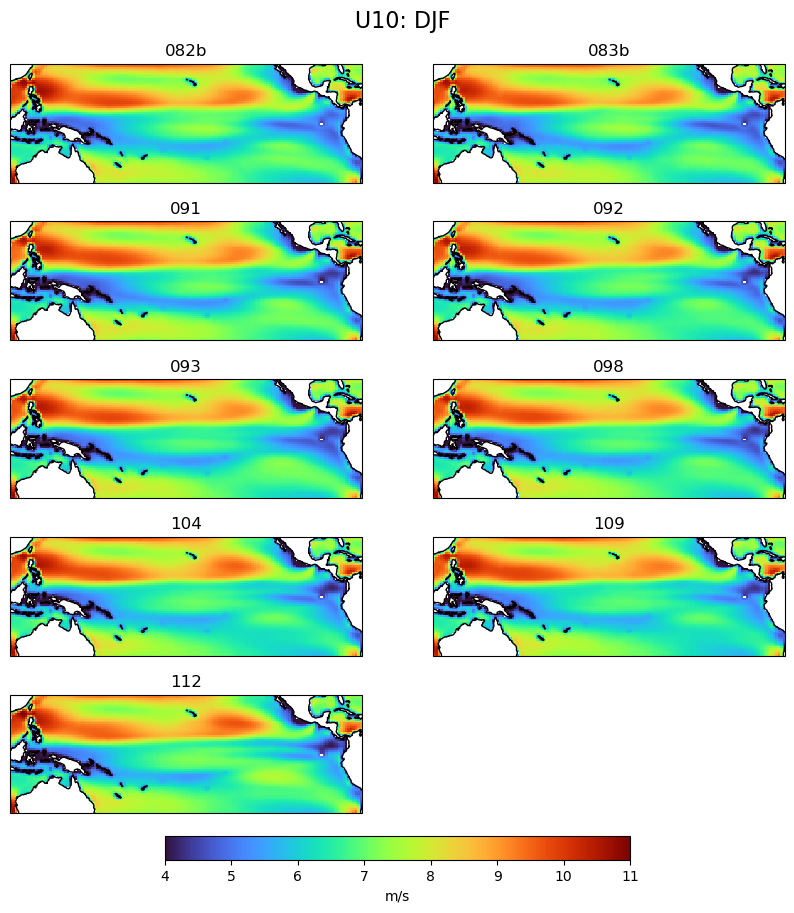

In [59]:
varSel    = 'U10'
selSeason = 'DJF'

normVar = matplotlib.colors.Normalize(vmin=4, vmax=11)
cmapSel = 'turbo'

# OLD:
# weightedVar = (sel_allCases[varSel] * weights).groupby("time.season").sum(dim="time", skipna=True).sel(season=selSeason)

# Mask out NaNs in SST by setting corresponding weights to zero
masked_weights = xr.where(~sel_allCases[varSel].isnull(), weights, 0)

# Normalize masked weights so they sum to 1 across valid (non-NaN) data
masked_weights = masked_weights.groupby("time.season") / masked_weights.groupby("time.season").sum(dim="time", skipna=True)

# Calculate the weighted mean, excluding NaNs
weightedVar = (sel_allCases[varSel] * masked_weights).groupby("time.season").sum(dim="time", skipna=True).sel(season=selSeason)


fig,axs = plt.subplots(5,2,figsize=(10,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs = axs.ravel() 

[a.coastlines() for a in axs]
# [a.set_extent([110,288,-20,20]) for a in axs]

plt.gcf().text(0.47, 0.90, varSel+': '+selSeason, fontsize=16)

for iCase in range(len(weightedVar.case.values)): 
    i = axs[iCase].pcolormesh(longrid, latgrid, ocnMask * weightedVar.isel(case=iCase).values, 
                              transform=ccrs.PlateCarree(), norm=normVar, cmap=cmapSel)
    axs[iCase].set_title(weightedVar.isel(case=iCase).case.values)
    
cb = fig.colorbar(i, ax=axs, shrink=0.6, label=allCases[varSel].units, orientation='horizontal', pad=0.025) 

axs[9].set_visible(False) 

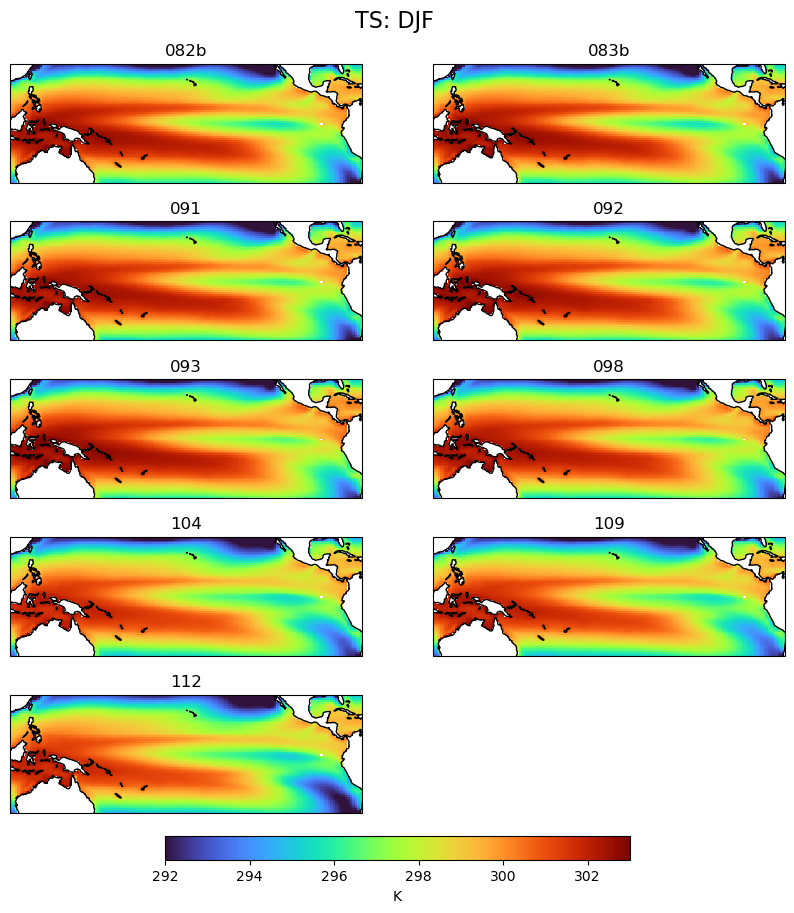

In [60]:
varSel    = 'TS'
selSeason = 'DJF'

normVar = matplotlib.colors.Normalize(vmin=292, vmax=303)
cmapSel = 'turbo'

# OLD:
# weightedVar = (sel_allCases[varSel] * weights).groupby("time.season").sum(dim="time", skipna=True).sel(season=selSeason)

# Mask out NaNs in SST by setting corresponding weights to zero
masked_weights = xr.where(~sel_allCases[varSel].isnull(), weights, 0)

# Normalize masked weights so they sum to 1 across valid (non-NaN) data
masked_weights = masked_weights.groupby("time.season") / masked_weights.groupby("time.season").sum(dim="time", skipna=True)

# Calculate the weighted mean, excluding NaNs
weightedVar = (sel_allCases[varSel] * masked_weights).groupby("time.season").sum(dim="time", skipna=True).sel(season=selSeason)



fig,axs = plt.subplots(5,2,figsize=(10,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel() 

[a.coastlines() for a in axs]
# [a.set_extent([110,288,-20,20]) for a in axs]

plt.gcf().text(0.47, 0.90, varSel+': '+selSeason, fontsize=16)

for iCase in range(len(weightedVar.case.values)): 
    i = axs[iCase].pcolormesh(longrid, latgrid, ocnMask * weightedVar.isel(case=iCase).values, 
                              transform=ccrs.PlateCarree(), norm=normVar, cmap=cmapSel)
    axs[iCase].set_title(weightedVar.isel(case=iCase).case.values)
    
cb = fig.colorbar(i, ax=axs, shrink=0.6, label=allCases[varSel].units, orientation='horizontal', pad=0.025) 

axs[9].set_visible(False) 

## Hovmoller plots

In [13]:
sel_allCases['nino34'] = (('case','time'), nino34_out)


In [14]:
## Identify winters that are in different ENSO phases?
#    ENSO active when anomaly +/- 0.4 deg for 6+ months

label_case = np.full([len(sel_allCases.case.values), len(sel_allCases.time.values)], '---------')

for iCase in range(len(sel_allCases.case.values)): 
    for iTime in range(6, len(sel_allCases.time.values)-6):
        # to select the previous six months **including** the current one with np.arange, you need to 
        #   add one the ending number (to be the present iTime), and thus only subtract 5 months 
        this6months_case = sel_allCases['nino34'].isel(case=iCase).isel(time=np.arange(iTime-5,iTime+1))

        if (np.all(this6months_case.values>=0.4)):
            label_case[iCase, iTime] = 'ElNino'
        elif (np.all(this6months_case.values<=-0.4)):
            label_case[iCase, iTime] = 'LaNina'
        elif ( (np.all(this6months_case.values<-0.4) == False) & (np.all(this6months_case.values>0.4)==False) ):
            label_case[iCase, iTime] = 'Neutral'


In [15]:
sel_allCases['ENSO_phase'] = (('case','time'), label_case)

In [16]:
sel_allCases_ElNino  = sel_allCases.where(sel_allCases['ENSO_phase'] == 'ElNino')
sel_allCases_LaNina  = sel_allCases.where(sel_allCases['ENSO_phase'] == 'LaNina')
sel_allCases_Neutral = sel_allCases.where(sel_allCases['ENSO_phase'] == 'Neutral')


**The following pieces follow from the CVDP approach to hovs**

In [17]:
# nino34_ndj = nino34(11:dimsizes(nino34T)-13:12)   # cannot count last 1yr as spatial composite uses +1yrs data beyond NDJ..  
nino34_ndj = sel_allCases['nino34'].sel(time = sel_allCases['nino34'].time.values[11:len(nino34.time.values)-12:12])


In [ ]:
## Detrend the array 

stand_anomalies_case = np.full([len(nino34_ndj.case.values), len(nino34_ndj.time.values)], np.nan)

for iCase in range(len(nino34_ndj.case.values)):
# for iCase in range(2):

    # Estimate and remove the least squares linear trend in time dimension
    #   nino34_ndj = dtrend_msg(ispan(0,dimsizes(nino34_ndj&time)-1,1),nino34_ndj,True,False)
    nino34_ndj_dtrend = signal.detrend(nino34_ndj.values[iCase, 0:int(endYear[iCase]-1)], axis=0, type='linear')
    
    # Calculate standardized anomalies of the rightmost dimension at all other dimensions
    #   nino34_ndj = dim_standardize(nino34_ndj,0)
    # climatology_mean = np.nanmean(nino34_ndj_dtrend[0,:])
    # climatology_std  = np.nanstd(nino34_ndj_dtrend[0,:])
    
    # stand_anomalies = np.full([len(sel_allCases.case.values), ])
    stand_anomalies_case[iCase, 0:len(nino34_ndj_dtrend)] = xr.apply_ufunc(
        lambda x, m, s: (x - m) / s,
        nino34_ndj_dtrend,
        np.nanmean(nino34_ndj_dtrend),
        np.nanstd(nino34_ndj_dtrend),
    )



In [ ]:
nino34_ndj = xr.DataArray(stand_anomalies_case, 
        coords={'case': sel_allCases.case.values,
                'time': nino34_ndj.time.values,
              }, 
        dims=["case", "time"])


In [18]:
def getAnom(DS, var):

    var_anom = np.full([len(DS.case.values), len(DS.time.values), 
                        len(DS.lat.values), len(DS.lon.values)], np.nan)
    
    for iCase in range(len(DS.case.values)): 
    
        # Detrend data 
        varSel = DS[var].isel(case=iCase, time=slice(0, 12*int(endYear[iCase]-1))) 
    
        dimTime = varSel.get_axis_num('time')
        
        var_detrend = signal.detrend(varSel, axis=dimTime, type='linear')
        # # Get SST 
        var_ocn = var_detrend * ocnMask
        
        varDS = xr.DataArray(var_detrend, 
            coords={
                    'time': varSel.time.values,
                    'lat':  varSel.lat.values, 
                    'lon':  varSel.lon.values}, 
            dims=["time", "lat", "lon"])
        
        # Remove annual cycle from monthly data 
        var_anom[iCase, 0:len(varSel.time.values),:,:] = rmMonAnnCyc(varDS)

    var_anom_out = xr.DataArray(var_anom, 
            coords={'case': DS.case.values, 
                    'time': DS.time.values,
                    'lat':  DS.lat.values, 
                    'lon':  DS.lon.values}, 
            dims=["case","time", "lat", "lon"])

    return var_anom_out 

In [ ]:
# NCL: sstr = sst(:,{-3:3},{120:280})  
TS_anom = getAnom(sel_allCases, 'TS')
sstr    = TS_anom.sel(lat=slice(-3,3), lon=slice(120,280))


In [ ]:
def plotHovm_elnino(varSel, varNorm_high, unitStr):

    # # Detrend (remove time mean)
    # ds_var = signal.detrend(sel_allCases[varSel], axis=0, type='linear')
    
    # # Compute anomaly over ocean only 
    # maskVar    = ds_var * ocnMask
    
    # ## Remove climatology from SST 
    # anom = rmMonAnnCyc_Var(maskVar)
    anom = getAnom(sel_allCases, varSel)
    
    ## Limit range in lat/lon 
    anom = anom.sel(lat=slice(-3,3), lon=slice(120,280))
    
    ## This is the empty array to fill with means... 
    # fvar_hi = np.full([len(anom.case.values), 48, len(anom.lon.values)], np.nan)
    
    ## Number of events 
    cntr_hi  = np.zeros([len(anom.case.values)]) 
    
    for iCase in range(len(sstr.case.values)): 
    # for iCase in range(3): 
        thisCase_nino = nino34_ndj.isel(case=iCase, time=slice(0, int(endYear[iCase]-1)))
        thisCase_anom = anom.isel(case=iCase, time=slice(0, 12*int(endYear[iCase]-1)))
    
        for iYr in range(len(thisCase_nino.time.values)-2): # Modifying to -2 (11/4/24, because we want a two year slice available)

            # print(thisCase_nino.isel(time=iYr).time.values)
            # El Nino when nino index for NDJ mean >=1
            if thisCase_nino.isel(time=iYr).values >=1: 
                iTime_all   = np.where(thisCase_anom.time.values == thisCase_nino.isel(time=iYr).time.values)[0][0]
                iTime_slice = np.arange(iTime_all-24, iTime_all+24)  ## Take a look 
    
                anom_slice         = thisCase_anom.isel(time=iTime_slice).mean(dim='lat').assign_coords({"eventNum": cntr_hi[iCase]})
                anom_slice['time'] = np.arange(-24,24)
                
                # Create new dimension (event) 
                if cntr_hi[iCase]==0:
                    fvar_hi_case = anom_slice
                else: 
                    fvar_hi_case = xr.concat([fvar_hi_case, anom_slice], "eventNum")
                
                cntr_hi[iCase] = cntr_hi[iCase] +1 
    
            
        if iCase==0:
            fvar_hi = fvar_hi_case.assign_coords({"case": thisCase_anom.case.values})
        else: 
            temp = fvar_hi_case.assign_coords({"case": thisCase_anom.case.values})
            fvar_hi = xr.concat([fvar_hi, temp], "case")
   
    
    # Plot hovm
    # fig,axs = plt.subplots(2,1, figsize=(4,11))
    fig,axs = plt.subplots(3,3, figsize=(15,20))
    axs     = axs.ravel()
    
    longrid,tgrid  = np.meshgrid(fvar_hi['lon'], fvar_hi['time'] )

    plt.gcf().text(0.37, 0.90, 'El Nino Composite: Ocean '+varSel, fontsize=16)
        
    for iCase in range(len(fvar_hi.case.values)): 
        mean_high  = fvar_hi.isel(case=iCase).mean(dim='eventNum')
        axs[iCase].set_title(fvar_hi.case.values[iCase]) 
    
        axs[iCase].pcolormesh(longrid,tgrid, mean_high.values, norm=varNorm_high, cmap='seismic')
        axs[iCase].axhline(0,color='grey',linestyle='--')
    
    [a.set_ylim([-11,17]) for a in axs]
    [a.set_yticks(np.arange(-11,19,2)) for a in axs]

    
    ytick_labels = ['Jan0','Mar0','May0','Jul0','Sep0','Nov0','Jan+1','Mar+1','May+1','Jul+1','Sep+1','Oct+1','Dec+1','Feb+2','Apr+2']
    [a.set_yticklabels(ytick_labels) for a in axs]
    
    # Add Colorbar
    cb1 = fig.colorbar(matplotlib.cm.ScalarMappable(norm=varNorm_high, cmap='seismic'), ax=axs, 
                       shrink=0.7, 
                          label=unitStr, orientation='horizontal', pad=0.018) 

    # axs[9].set_visible(False) 
    
    return 


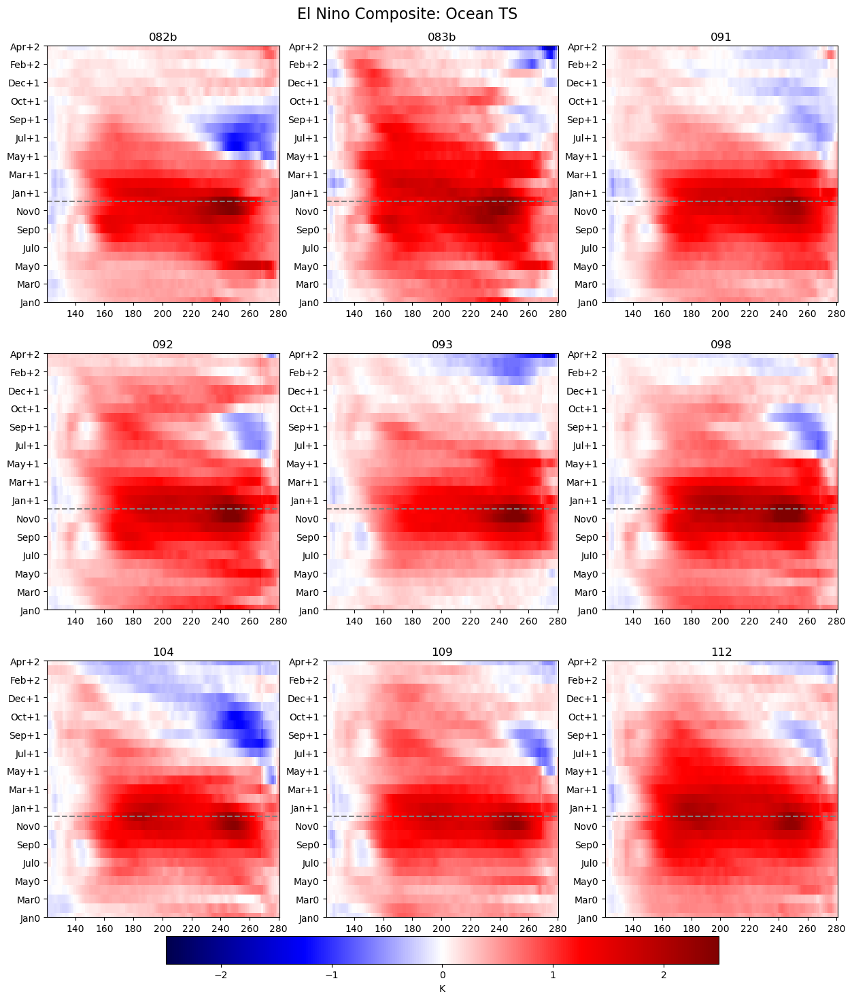

In [318]:
plotHovm_elnino('TS', matplotlib.colors.Normalize(vmin=-2.5,vmax=2.5),'K')

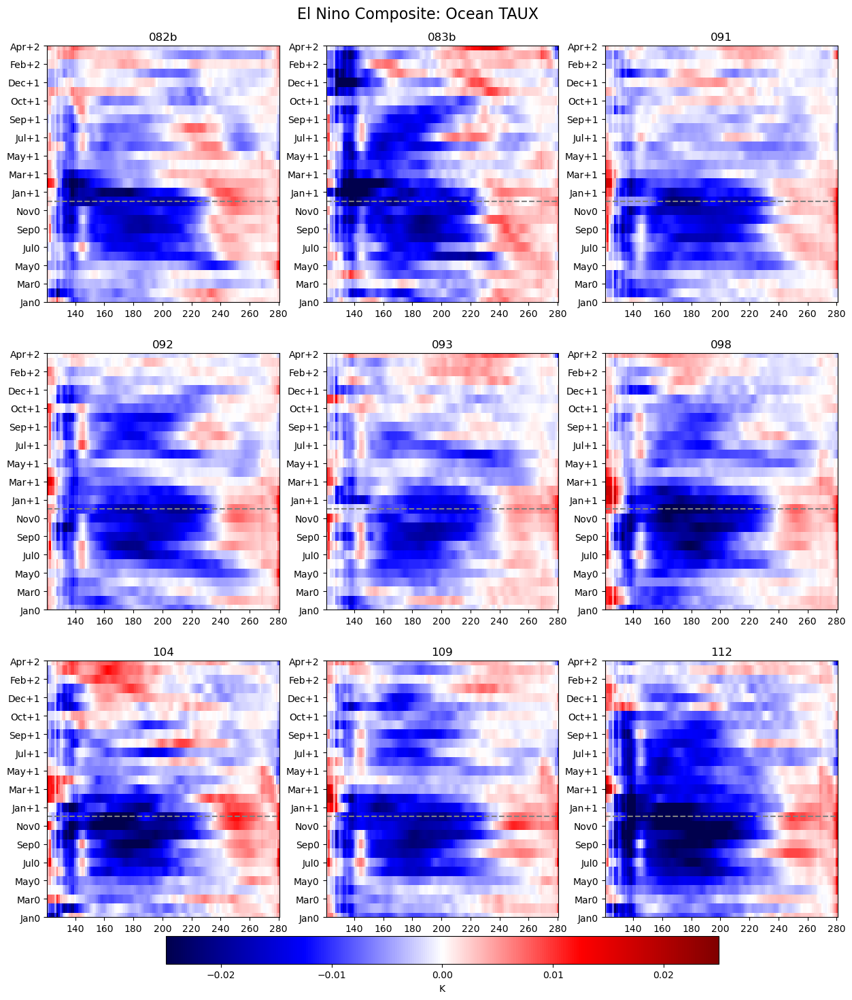

In [323]:
plotHovm_elnino('TAUX', matplotlib.colors.Normalize(vmin=-0.025,vmax=0.025),'K')

## Covariance of anomalies

In [19]:
TS_anom    = getAnom(sel_allCases, 'TS')
PRECT_anom = getAnom(sel_allCases, 'PRECT')

In [23]:
cov_anoms = xr.cov(TS_anom, PRECT_anom, dim='time')

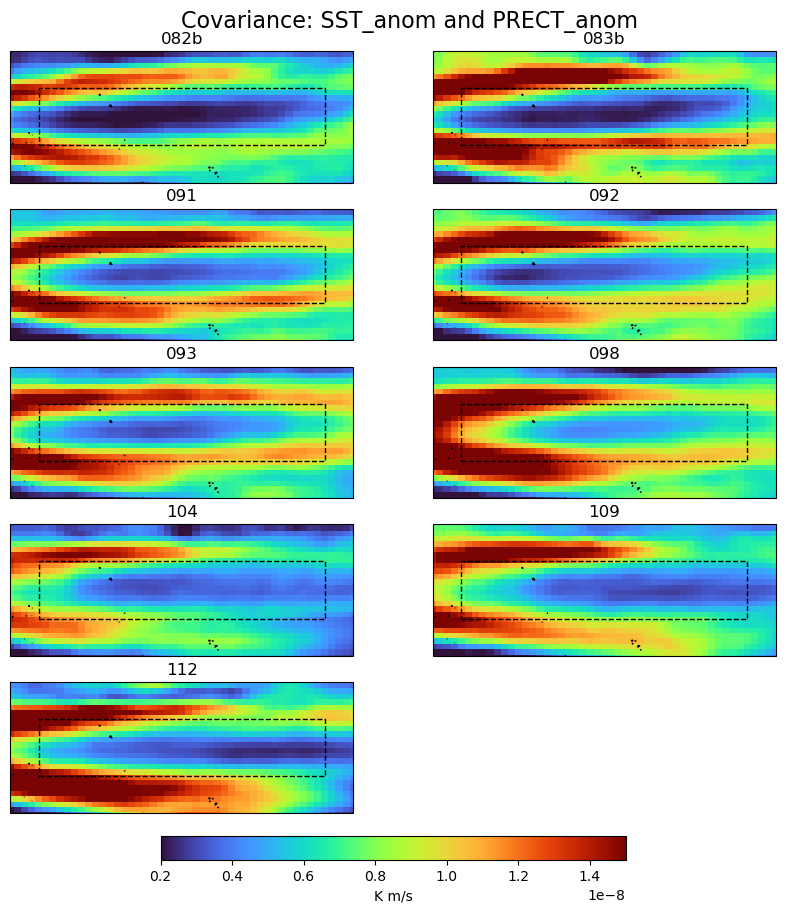

In [67]:
# normVar = matplotlib.colors.Normalize(vmin=-1e-8, vmax=3e-8)
normVar = matplotlib.colors.Normalize(vmin=0.2e-8, vmax=1.5e-8)
cmapSel = 'turbo'

fig,axs = plt.subplots(5,2,figsize=(10,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel() 

[a.coastlines() for a in axs]

[a.set_extent([lon_e34-5,lon_w34+5, lat_s34-5,lat_n34+5]) for a in axs]

plt.gcf().text(0.3, 0.90, 'Covariance: SST_anom and PRECT_anom', fontsize=16)

for iCase in range(len(cov_anoms.case.values)): 
    i = axs[iCase].pcolormesh(longrid, latgrid, ocnMask * cov_anoms.isel(case=iCase).values, 
                              transform=ccrs.PlateCarree(), norm=normVar, cmap=cmapSel)
    axs[iCase].set_title(cov_anoms.isel(case=iCase).case.values)
    axs[iCase].add_patch(patches.Rectangle(xy=[lon_e34, lat_s34], width=(lon_w34-lon_e34), height=(lat_n34-lat_s34),
                            facecolor='none', edgecolor='k',linestyle='--',
                            linewidth=1, transform=ccrs.PlateCarree()))

    
cb = fig.colorbar(i, ax=axs, shrink=0.6, label='K m/s', orientation='horizontal', pad=0.025) 

axs[9].set_visible(False) 


In [42]:
sel_allCases['nino34']

<xarray.DataArray 'nino34' (case: 9, time: 1788)>
array([[-0.49295845, -0.65520594, -0.68663441, ...,         nan,
                nan,         nan],
       [-0.53162269, -0.55531364, -0.00977102, ...,         nan,
                nan,         nan],
       [-1.89989365, -1.44206822, -1.2251964 , ...,         nan,
                nan,         nan],
       ...,
       [ 0.65548336,  0.94640629,  0.92711293, ...,         nan,
                nan,         nan],
       [ 0.72660185,  0.36602751,  0.16288289, ...,         nan,
                nan,         nan],
       [ 0.9988523 ,  0.54631642,  0.72667839, ...,         nan,
                nan,         nan]])
Coordinates:
  * time     (time) object 0002-01-16 12:00:00 ... 0150-12-16 12:00:00
  * case     (case) <U4 '082b' '083b' '091' '092' '093' '098' '104' '109' '112'